# NAME: DARE ADEBAYO VICTOR -STUDENT NUMBER - 202122627

# COURSE DETAILS: MSc Research Project (771764_A21_T3A)

# PROJECT TOPIC: Assessing the influences on the attainment of school children from the East Riding of Yorkshire

ABSTRACT

Primary school education is important for the development of every nation. Hence, the considerable amount of financial commitment of the government of the United Kingdom. This study assessed the influence on Key Stage 2 (KS2) academic achievements of 125 schools in East Riding of Yorkshire Council (ERYC) using publicly available datasets from UK government and ERYC websites. Most studies do not take a holistic view of different factors that influence educational attainment. This research considered an inclusive and wide range of probable factors. The variables considered include; school type, previous academic performances, students financial and socio-economic status, financial capacity of school, teachers’ motivation and general attention given to teaching resources. The study employed Python data and statistical analysis through Pearson correlation and one-way Analysis of Variance (ANOVA). The following variables; socio-economic factors such as Healthy Life Expectancy (HLE), Indices of Multiple Deprivation (IMD), religious affiliation, school type, eligibility of free school meal and variables related to attention to different workers influenced KS2 progress scores or attainment with p-values less than the significant level (α =0.05). School type variable is seen to have the highest influence on school KS2 attainment with absolute natural logarithm of the p-value being 256.96. This is followed by HLE and IMD with 256.98 and 214.74 measures respectively. Five machine learning models with a stacked model were trained on the dataset with K-Nearest Model having the highest accuracy of 87.56%. These models were tested on a separate year 2015 dataset. The Random Forest model gives the most accurate prediction of 75% of this separate dataset. In order to increase schools’ attainment a critical assessment of the variables employed is important. Thus, government should employ holistic models that predict schools’ attainment before the KS2 pupils take their examination.

Note:

For the each of the cohorts, school general attainment (this also includes the data from ERYC indicating IMD and HLE) and funding datasets were merged before each analysis

In [1]:
import numpy as np #imports numpy as np
import pandas as pd #imports pandas as pd
import math #imports math for calculation
import matplotlib.pyplot as plt #for data visialisation
import statistics #imports library for statistics
from numpy import mean
from numpy import std
from scipy.stats import mode #reference: https://stackoverflow.com/questions/29159218/find-the-mode-of-a-list-of-numbers-in-python
import seaborn as sns #import library for data visialisation
%matplotlib inline
import re

# COHORT 1 (2016-2017)

In [2]:
df_school_16 = pd.read_csv('ks2final_16.csv') #reads 2016 school general attainment

In [3]:
df_fund_16 = pd.read_csv('811_cfr_16.csv') # reads 2016 school funds file

In [4]:
df_fund_16.head(3) #shows first three rows

,LA,URN,LONDON/NON-LONDON,MEDIAN,PUPILS,FSM,FSMBAND,GRANTFUNDING,SELFGENERATEDINCOME,TOTALINCOME,...,PT1617CAT1LA,PT1617CAT2LA,PT1617CAT3LA,PT1617CAT4LA,PT1617CAT5LA,PDCAT1,PDCAT2,PDCAT3,PDCAT4,PDCAT5
0,811,134741,Non-London,Primary,220.0,18.2,Low,"4,518",156,"4,674",...,NaN,NaN,NaN,NaN,NaN,2%,-6%,0%,-1%,0%
1,811,118075,Non-London,Secondary with KS4,698.0,22.2,Medium,"5,889",26,"5,915",...,NaN,NaN,NaN,NaN,NaN,6%,1%,1%,-1%,0%
2,811,118120,Non-London,Primary,107.0,7.7,Low,"4,807",365,"5,172",...,NaN,NaN,NaN,NaN,NaN,3%,-2%,-1%,-2%,0%


# Retaining the needed columns and deleting the rest for both df_school_16 and df_fund

The dataframes contains a large number of irrelevant columns. Hence, the need to seive out the rellevant ones. command 'difference' will take out the difference of columns from the one stated in it. Example is the name and street names of the schools. This will not be needed in the coding, analysis or machine learning

In [5]:
# Retains the columns listed below and delete others, while saving in another dataframe
df_fund_new_16= df_fund_16.drop(df_fund_16.columns.difference(['URN','TEACHINGSTAFF' ,'FSM','TOTALINCOME','TOTALEXPENDITURE','PGRANTFUNDING','PSELFGENERATEDINCOME','PTEACHINGSTAFF','PSUPPLYTEACHERS','PEDUCATIONSUPPORTSTAFF','PPREMISES','PBACKOFFICE','PCATERING','POTHERSTAFF','PENERGY','PLEARNINGRESOURCES','PICT','PBOUGHTINPROFESSIONALSERVICES','POTHER']), axis=1)

In [6]:
df_fund_new_16.head(2) #checking if this has been correctly sieved retaining the needed columns

,URN,FSM,TOTALINCOME,TEACHINGSTAFF,TOTALEXPENDITURE,PGRANTFUNDING,PSELFGENERATEDINCOME,PTEACHINGSTAFF,PSUPPLYTEACHERS,PEDUCATIONSUPPORTSTAFF,PPREMISES,PBACKOFFICE,PCATERING,POTHERSTAFF,PENERGY,PLEARNINGRESOURCES,PICT,PBOUGHTINPROFESSIONALSERVICES,POTHER
0,134741,18.2,"4,674","2,019","4,432",97%,3%,46%,1%,21%,7%,6%,3%,5%,1%,3%,2%,3%,4%
1,118075,22.2,"5,915","3,020","5,922",100%,0%,51%,3%,15%,6%,9%,2%,2%,2%,5%,1%,0%,4%


In [7]:
df_school_16.head(2) #checking if this has been correctly sieved retaining the needed columns

,RECTYPE,ALPHAIND,LEA,ESTAB,URN,SCHNAME,ADDRESS1,ADDRESS2,ADDRESS3,TOWN,...,MATPROG_LOWER_16,MATPROG_UPPER_16,READ_AVERAGE_16,MAT_AVERAGE_16,IMD,HLE,URN.1,WRITPROG,MATPROG,READPROG
0,1,784,811,2700,117823,Aldbrough Primary School,Headlands Road,Aldbrough,NaN,Hull,...,-7.8,-1.8,102,100,5.0,3.0,117823,-0.4,-2.7,-4.7
1,1,3378,811,2701,117824,Barmby-on-the-Marsh Primary School,High Street,Barmby-on-the-Marsh,NaN,Goole,...,-5.7,0.3,110,102,5.0,2.0,117824,SUPP,SUPP,SUPP


In [8]:
# Retains the columns listed below and delete others and saves this in a variable
df_school_new_16= df_school_16.drop(df_school_16.columns.difference(['URN', 'SCHNAME', 'NFTYPE','RELDENOM','TOTPUPS','TKS1AVERAGE','PTKS1GROUP_L','PTFSM6CLA1A','PTEALGRP2','PTMOBN','PTRWM_EXP','PTRWM_HIGH_FSM6CLA1A','DIFFN_RWM_HIGH','PTEALGRP1','PTEALGRP3','PSENELE','PSENELK','IMD','HLE','READPROG','WRITPROG','MATPROG']), axis=1)

In [9]:
df_school_new_16.head(2) #

,URN,SCHNAME,NFTYPE,RELDENOM,TOTPUPS,TKS1AVERAGE,PTKS1GROUP_L,PTFSM6CLA1A,PTEALGRP2,PTMOBN,...,DIFFN_RWM_HIGH,PTEALGRP1,PTEALGRP3,PSENELE,PSENELK,IMD,HLE,WRITPROG,MATPROG,READPROG
0,117823,Aldbrough Primary School,CY,Does not apply,135,16.4,6%,29%,0%,82%,...,SUPP,100%,0%,0%,24%,5.0,3.0,-0.4,-2.7,-4.7
1,117824,Barmby-on-the-Marsh Primary School,CY,Does not apply,60,SUPP,SUPP,SUPP,SUPP,SUPP,...,SUPP,SUPP,SUPP,SUPP,SUPP,5.0,2.0,SUPP,SUPP,SUPP


In [10]:
df_school_new_16.info() #checking the information to check if we have nan values

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 122 entries, 0 to 121
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   URN                   122 non-null    int64  
 1   SCHNAME               122 non-null    object 
 2   NFTYPE                122 non-null    object 
 3   RELDENOM              122 non-null    object 
 4   TOTPUPS               122 non-null    object 
 5   TKS1AVERAGE           119 non-null    object 
 6   PTKS1GROUP_L          119 non-null    object 
 7   PTFSM6CLA1A           119 non-null    object 
 8   PTEALGRP2             119 non-null    object 
 9   PTMOBN                119 non-null    object 
 10  PTRWM_EXP             119 non-null    object 
 11  PTRWM_HIGH_FSM6CLA1A  111 non-null    object 
 12  DIFFN_RWM_HIGH        111 non-null    object 
 13  PTEALGRP1             119 non-null    object 
 14  PTEALGRP3             119 non-null    object 
 15  PSENELE               1

In [11]:
df_fund_new_16.info() #checking the information to check if we have nan values

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 177 entries, 0 to 176
Data columns (total 19 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   URN                            139 non-null    object 
 1   FSM                            131 non-null    float64
 2   TOTALINCOME                    177 non-null    object 
 3   TEACHINGSTAFF                  177 non-null    object 
 4   TOTALEXPENDITURE               177 non-null    object 
 5   PGRANTFUNDING                  131 non-null    object 
 6   PSELFGENERATEDINCOME           131 non-null    object 
 7   PTEACHINGSTAFF                 131 non-null    object 
 8   PSUPPLYTEACHERS                131 non-null    object 
 9   PEDUCATIONSUPPORTSTAFF         131 non-null    object 
 10  PPREMISES                      131 non-null    object 
 11  PBACKOFFICE                    131 non-null    object 
 12  PCATERING                      131 non-null    obj

# Turning URN (i.e. the unique reference number) in df_fund_new to integer to be able to merge it with df_school_new which has URN as integer

In [12]:
#command below shows the unique values of URN in df_fund_new... This shows some non-numeric items such as nan and 'East Riding of Yorkshire' this will be turn to figure 0 to allow the merging of the dataframe
df_fund_new_16['URN'].unique()

array(['134741', '118075', '118120', '118121', '118122', '118148',
       '118072', '118073', '118111', '118002', '118003', '118144',
       '118145', '118036', '118044', '118045', '118076', '118080',
       '118082', '118083', '118084', '118085', '117984', '117985',
       '117987', '117988', '117989', '117990', '117992', '117993',
       '117994', '117995', '117996', '117997', '117998', '117999',
       '118000', '118001', '117883', '117885', '117886', '117888',
       '117889', '118025', '118026', '118028', '118029', '118030',
       '118032', '118033', '118034', '118035', '117935', '117936',
       '117937', '117939', '117940', '117941', '117942', '117969',
       '117970', '117971', '117972', '117973', '117974', '117976',
       '117977', '117978', '117979', '117980', '117981', '117982',
       '117983', '117867', '117868', '117872', '117873', '117874',
       '117875', '117891', '117892', '117893', '117894', '117909',
       '117911', '117912', '117916', '117823', '117824', '1178

In [13]:
#replaces 'East Riding of Yorkshire' to o and nan to o... this are just empty or erroneous spaces in t#he dataset.
#Not realy part of the figures. It will be seived out after merging the dataframe. This is also done to allow merging
df_fund_new_16['URN'] = df_fund_new_16['URN'].replace(np.nan,0)
df_fund_new_16['URN'] = df_fund_new_16['URN'].replace('East Riding of Yorkshire',0)

In [14]:
#checking again
df_fund_new_16['URN'].unique()

array(['134741', '118075', '118120', '118121', '118122', '118148',
       '118072', '118073', '118111', '118002', '118003', '118144',
       '118145', '118036', '118044', '118045', '118076', '118080',
       '118082', '118083', '118084', '118085', '117984', '117985',
       '117987', '117988', '117989', '117990', '117992', '117993',
       '117994', '117995', '117996', '117997', '117998', '117999',
       '118000', '118001', '117883', '117885', '117886', '117888',
       '117889', '118025', '118026', '118028', '118029', '118030',
       '118032', '118033', '118034', '118035', '117935', '117936',
       '117937', '117939', '117940', '117941', '117942', '117969',
       '117970', '117971', '117972', '117973', '117974', '117976',
       '117977', '117978', '117979', '117980', '117981', '117982',
       '117983', '117867', '117868', '117872', '117873', '117874',
       '117875', '117891', '117892', '117893', '117894', '117909',
       '117911', '117912', '117916', '117823', '117824', '1178

In [15]:
#converting the URN column in fund dataset to interger type just like the school attributes dataframe
df_fund_new_16['URN']=[int(i) for i in df_fund_new_16['URN']]

# Merging the dataframes

That is merging general attributes file and the funding files


In [16]:
#merges the dataframes together
combined_df_school_16 = pd.merge(df_fund_new_16, df_school_new_16,   on=['URN'], how='inner') 
combined_df_school_16.shape

(109, 40)

In [17]:
#checking the combined dataframe
combined_df_school_16.head(5)

,URN,FSM,TOTALINCOME,TEACHINGSTAFF,TOTALEXPENDITURE,PGRANTFUNDING,PSELFGENERATEDINCOME,PTEACHINGSTAFF,PSUPPLYTEACHERS,PEDUCATIONSUPPORTSTAFF,...,DIFFN_RWM_HIGH,PTEALGRP1,PTEALGRP3,PSENELE,PSENELK,IMD,HLE,WRITPROG,MATPROG,READPROG
0,134741,18.2,"4,674","2,019","4,432",97%,3%,46%,1%,21%,...,-11,100%,0%,9%,26%,7.0,7.0,-2.9,-2.5,-0.4
1,118120,7.7,"5,172","2,053","5,005",93%,7%,41%,2%,21%,...,SUPP,SUPP,SUPP,SUPP,SUPP,2.0,2.0,SUPP,SUPP,SUPP
2,118122,4.1,"4,686","2,061","4,795",93%,7%,43%,3%,18%,...,SUPP,100%,0%,0%,12%,1.0,2.0,2.8,-1.9,-2
3,118148,29.5,"17,525","7,227","17,980",98%,2%,40%,3%,34%,...,SUPP,100%,0%,NaN,NaN,4.0,4.0,-8.6,-9.6,-10.4
4,118002,5.5,"4,608","2,152","4,536",97%,3%,SUPP,9%,SUPP,...,SUPP,100%,0%,0%,17%,5.0,4.0,-0.2,0.3,-1.6


In [18]:
combined_df_school_16.info()#confirms URN has been turned to integer datatype. As indicated it is now integer type in the combined dataframe

<class 'pandas.core.frame.DataFrame'>
Int64Index: 109 entries, 0 to 108
Data columns (total 40 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   URN                            109 non-null    int64  
 1   FSM                            109 non-null    float64
 2   TOTALINCOME                    109 non-null    object 
 3   TEACHINGSTAFF                  109 non-null    object 
 4   TOTALEXPENDITURE               109 non-null    object 
 5   PGRANTFUNDING                  109 non-null    object 
 6   PSELFGENERATEDINCOME           109 non-null    object 
 7   PTEACHINGSTAFF                 109 non-null    object 
 8   PSUPPLYTEACHERS                109 non-null    object 
 9   PEDUCATIONSUPPORTSTAFF         109 non-null    object 
 10  PPREMISES                      109 non-null    object 
 11  PBACKOFFICE                    109 non-null    object 
 12  PCATERING                      109 non-null    obj

In [19]:
combined_df_school_16.isnull().sum() # sums up the null values in every columns it is seen that 4 columns have null values which are PTRWM_HIGH_FSM6CLA1A (6), DIFFN_RWM_HIGH (6), PSENELE (3),PSENELK (3)

URN                              0
FSM                              0
TOTALINCOME                      0
TEACHINGSTAFF                    0
TOTALEXPENDITURE                 0
PGRANTFUNDING                    0
PSELFGENERATEDINCOME             0
PTEACHINGSTAFF                   0
PSUPPLYTEACHERS                  0
PEDUCATIONSUPPORTSTAFF           0
PPREMISES                        0
PBACKOFFICE                      0
PCATERING                        0
POTHERSTAFF                      0
PENERGY                          0
PLEARNINGRESOURCES               0
PICT                             0
PBOUGHTINPROFESSIONALSERVICES    0
POTHER                           0
SCHNAME                          0
NFTYPE                           0
RELDENOM                         0
TOTPUPS                          0
TKS1AVERAGE                      0
PTKS1GROUP_L                     0
PTFSM6CLA1A                      0
PTEALGRP2                        0
PTMOBN                           0
PTRWM_EXP           

In [20]:
# to view the file comprehensively in an csv format
pd.DataFrame.to_csv(combined_df_school_16, 'combined_df_school_16.csv', sep=',', index=False)

# DATA CLEANING

# NOTE


SUPP ... means Indicates that a school  figures have been suppressed because there are 5 or fewer pupils in the in the cohort.

Please refer to abbreviation excel in the reference below

Reference: DfE (2021a) All schools and colleges in England. Available online: https://www.compare-school-performance.service.gov.uk/schools-by-type?step=default&table=schools&region=all-england&for=primary [Accessed 28/07/2022].

Comment: While the reason for such figures being suppressed by ONS is not justifiable, this study deletes removes any column or rows that have a large number of suppressed figures to prevent error during analysis

Looking through the combine dataframe:
1) two columns PTRWM_HIGH_FSM6CLA1A	and  DIFFN_RWM_HIGH have high number of SUPP. In order not to affect the analysis, this will be dropped.

2). 8 Schools with URNs 118120, 118145, 118000, 117939, 117970, 117893,117839 and 117824 have their progress scores suppressed and majority of their figures. Hence, the need to remove or drop the schools in order not to tamper with analysis and prediction


In [21]:
#the school name is also irrelevant for analysis... this would be removed alongside
combined_df_school_16.drop(columns=['PTRWM_HIGH_FSM6CLA1A','DIFFN_RWM_HIGH', 'SCHNAME'], inplace= True)

In [22]:
combined_df_school_16.shape #checks the number of rows and columns respectively

(109, 37)

In [23]:
#Sieves out the schools with large number of suppressed figures and drops the column
combined_df_school_16.drop(combined_df_school_16[(combined_df_school_16['URN'] ==118120) 
                                                 | (combined_df_school_16['URN'] == 118145)
                                                 | (combined_df_school_16['URN'] == 118000)
                                                 | (combined_df_school_16['URN'] == 117939)
                                                 | (combined_df_school_16['URN'] == 117970)
                                                 | (combined_df_school_16['URN'] == 117893)
                                                 | (combined_df_school_16['URN'] == 117839)
                                                 | (combined_df_school_16['URN'] == 117824)].index, inplace=True)

In [24]:
combined_df_school_16.shape #checking the number of rows to verify if those 8 rows have been removed. It is seen the number of rows reduced from 109 to 101

(101, 37)

In [25]:
#displaying all columns in dataframe for viewing
pd.set_option('display.max_columns', None)

In [26]:
#displaying all rows in dataframe for viewing
pd.set_option('display.max_rows', None)

In [27]:
combined_df_school_16.head(109)

,URN,FSM,TOTALINCOME,TEACHINGSTAFF,TOTALEXPENDITURE,PGRANTFUNDING,PSELFGENERATEDINCOME,PTEACHINGSTAFF,PSUPPLYTEACHERS,PEDUCATIONSUPPORTSTAFF,PPREMISES,PBACKOFFICE,PCATERING,POTHERSTAFF,PENERGY,PLEARNINGRESOURCES,PICT,PBOUGHTINPROFESSIONALSERVICES,POTHER,NFTYPE,RELDENOM,TOTPUPS,TKS1AVERAGE,PTKS1GROUP_L,PTFSM6CLA1A,PTEALGRP2,PTMOBN,PTRWM_EXP,PTEALGRP1,PTEALGRP3,PSENELE,PSENELK,IMD,HLE,WRITPROG,MATPROG,READPROG
0,134741,18.2,"4,674","2,019","4,432",97%,3%,46%,1%,21%,7%,6%,3%,5%,1%,3%,2%,3%,4%,CY,Does not apply,216,15.8,13%,26%,0%,91%,52%,100%,0%,9%,26%,7.0,7.0,-2.9,-2.5,-0.4
2,118122,4.1,"4,686","2,061","4,795",93%,7%,43%,3%,18%,4%,10%,4%,5%,1%,5%,2%,4%,1%,FD,Church of England,114,17.1,6%,12%,0%,94%,59%,100%,0%,0%,12%,1.0,2.0,2.8,-1.9,-2
3,118148,29.5,"17,525","7,227","17,980",98%,2%,40%,3%,34%,3%,5%,2%,3%,1%,4%,1%,4%,1%,CYS,Does not apply,89,7.3,83%,33%,0%,67%,0%,100%,0%,NaN,NaN,4.0,4.0,-8.6,-9.6,-10.4
4,118002,5.5,"4,608","2,152","4,536",97%,3%,SUPP,9%,SUPP,5%,6%,5%,2%,1%,1%,1%,3%,2%,VC,Church of England,156,17.5,0%,8%,0%,83%,79%,100%,0%,0%,17%,5.0,4.0,-0.2,0.3,-1.6
5,118003,2.8,"4,006","2,021","3,816",91%,9%,53%,4%,12%,8%,7%,3%,2%,2%,3%,1%,3%,3%,VC,Church of England,311,15.9,4%,6%,0%,100%,51%,100%,0%,0%,12%,2.0,2.0,2.1,-2.9,-1.9
6,118144,34.2,"25,433","7,228","24,714",98%,2%,29%,0%,30%,4%,6%,3%,21%,1%,2%,1%,1%,1%,CYS,Does not apply,109,2.1,100%,33%,0%,89%,0%,100%,0%,NaN,NaN,2.0,2.0,-3.8,-4.3,-3.8
8,118036,18.4,"5,397","2,392","5,086",96%,4%,47%,2%,22%,6%,7%,3%,5%,1%,2%,1%,2%,1%,VA,Roman Catholic,211,15.9,3%,19%,10%,100%,71%,90%,0%,0%,23%,10.0,10.0,-0.9,1,0.1
9,118044,3.2,"5,615","2,793","5,492",97%,3%,SUPP,1%,SUPP,5%,10%,3%,4%,1%,4%,2%,4%,2%,VA,Church of England,105,14.5,37%,24%,5%,81%,81%,95%,0%,0%,10%,2.0,4.0,3.3,6.5,10.7
10,118045,14.5,"5,291","2,221","5,276",96%,4%,42%,4%,15%,6%,11%,5%,5%,1%,3%,3%,2%,2%,VA,Roman Catholic,103,17.2,0%,33%,33%,93%,53%,67%,0%,0%,20%,4.0,5.0,-2.5,-4.9,-2.7
11,117984,4.4,"5,248","2,238","5,230",95%,5%,43%,3%,19%,7%,10%,3%,6%,1%,2%,1%,2%,3%,VC,Church of England,110,17.8,5%,15%,0%,85%,80%,100%,0%,5%,10%,2.0,2.0,0.5,0.9,1.5


CREATING EFFICIENT FUNCTIONS FOR CLEANING

For efficiency, the next cell has functions created to clean the whole dataframe at once

In [28]:
#creating a function that strips off or removes all regular expressions, notations or symbols. 
#This was created specifically to remove symbol '%' as some figures have percentage symbols and we only need the figures for analysis
def percent_remover(i): #initiallizes the function
    p = str(i) #creates a variable to store an item to be cleaned
    value = re.sub(r'[^\w]', '', p) #removes the symbols
    return(value) #returns the cleaned value

#ABOVE FUNCTION RETURNS A STRING VALUE: which will not help our analysis. Hence the need to create another function to convert it to a numeric float type 

#creating a function to convert string numbers to integer
def float_maker(string):
    return float(string)

#changes 'SUPP' to an abbtrirary large number 88888 which would replace by median figure later...done to help the function float_maker work properly  
for column in ['PTKS1GROUP_L','PTFSM6CLA1A','PTEALGRP2','PTMOBN','PTRWM_EXP','PPREMISES','PBACKOFFICE','PCATERING','PTEALGRP1','POTHERSTAFF','PICT','POTHER','PBOUGHTINPROFESSIONALSERVICES','PLEARNINGRESOURCES','PENERGY','PTEALGRP3','PSENELE','PSENELK','TEACHINGSTAFF','PTEACHINGSTAFF','PEDUCATIONSUPPORTSTAFF','PGRANTFUNDING','PSELFGENERATEDINCOME','PSUPPLYTEACHERS','TOTALINCOME','TOTALEXPENDITURE']:
    combined_df_school_16[column] = combined_df_school_16[column].replace("SUPP", '88888')

#removing the regular expressions '%' and ',', using the percent_remover() function with lambda
for colum in ['PTKS1GROUP_L','PTFSM6CLA1A','PTEALGRP2','PTMOBN','PTRWM_EXP','PPREMISES','PBACKOFFICE','PCATERING','PTEALGRP1','POTHERSTAFF','PICT','POTHER','PBOUGHTINPROFESSIONALSERVICES','PLEARNINGRESOURCES','PENERGY','PTEALGRP3','PSENELE','PSENELK','TEACHINGSTAFF','PTEACHINGSTAFF','PEDUCATIONSUPPORTSTAFF','PGRANTFUNDING','PSELFGENERATEDINCOME','PSUPPLYTEACHERS','TOTALINCOME','TOTALEXPENDITURE']:
    combined_df_school_16[colum] = combined_df_school_16[colum].apply(lambda x: percent_remover(x))
    
#Turns the 'object numbers' to float numbers using the float_maker() function with lambda
for col in ['PTKS1GROUP_L','PTFSM6CLA1A','PTEALGRP2','PTMOBN','PTRWM_EXP','PPREMISES','PBACKOFFICE','PCATERING','PTEALGRP1','POTHERSTAFF','PICT','POTHER','PBOUGHTINPROFESSIONALSERVICES','PLEARNINGRESOURCES','PENERGY','PTEALGRP3','PSENELE','PSENELK','TEACHINGSTAFF','PTEACHINGSTAFF','PEDUCATIONSUPPORTSTAFF','PGRANTFUNDING','PSELFGENERATEDINCOME','PSUPPLYTEACHERS','TOTALINCOME','TOTALEXPENDITURE']:
    combined_df_school_16[col] = combined_df_school_16[col].apply(lambda x: float_maker(x))
    
#replacing the arbitrary number 88888 with the median of the respective colunms. 88888is considered an outlier hence the use of median instead of mean
for cols in ['PTKS1GROUP_L','PTFSM6CLA1A','PTEALGRP2','PTMOBN','PTRWM_EXP','PPREMISES','PBACKOFFICE','PCATERING','PTEALGRP1','POTHERSTAFF','PICT','POTHER','PBOUGHTINPROFESSIONALSERVICES','PLEARNINGRESOURCES','PENERGY','PTEALGRP3','PSENELE','PSENELK','TEACHINGSTAFF','PTEACHINGSTAFF','PEDUCATIONSUPPORTSTAFF','PGRANTFUNDING','PSELFGENERATEDINCOME','PSUPPLYTEACHERS','TOTALINCOME','TOTALEXPENDITURE']:
    combined_df_school_16[cols] = combined_df_school_16[cols].replace( 88888,combined_df_school_16[cols].median())
    
#replacing nan with median figures
for colss in ['PTKS1GROUP_L','PTFSM6CLA1A','PTEALGRP2','PTMOBN','PTRWM_EXP','PPREMISES','PBACKOFFICE','PCATERING','PTEALGRP1','POTHERSTAFF','PICT','POTHER','PBOUGHTINPROFESSIONALSERVICES','PLEARNINGRESOURCES','PENERGY','PTEALGRP3','PSENELE','PSENELK','TEACHINGSTAFF','PTEACHINGSTAFF','PEDUCATIONSUPPORTSTAFF','PGRANTFUNDING','PSELFGENERATEDINCOME','PSUPPLYTEACHERS','TOTALINCOME','TOTALEXPENDITURE']:
    combined_df_school_16[colss] = combined_df_school_16[colss].replace(np.nan, combined_df_school_16[colss].median())

#Changing the READING,WRITING AND MATHS PROGRESS to float type suitiable fo analysis
combined_df_school_16['WRITPROG']=[float(i) for i in combined_df_school_16['WRITPROG']]
combined_df_school_16['MATPROG']=[float(i) for i in combined_df_school_16['MATPROG']]
combined_df_school_16['READPROG']=[float(i) for i in combined_df_school_16['READPROG']]

#Changing the TOTPUPS and TKS1AVERAGE to float type suitiable fo analysis
combined_df_school_16['TOTPUPS']=[float(i) for i in combined_df_school_16['TOTPUPS']]
combined_df_school_16['TKS1AVERAGE']=[float(i) for i in combined_df_school_16['TKS1AVERAGE']]

In [29]:
#displays alll the column
pd.set_option('display.max_columns', None)

In [30]:
#displays alll the rows
pd.set_option('display.max_rows', None)

In [31]:
#checks the dataframe
combined_df_school_16.head(3)

,URN,FSM,TOTALINCOME,TEACHINGSTAFF,TOTALEXPENDITURE,PGRANTFUNDING,PSELFGENERATEDINCOME,PTEACHINGSTAFF,PSUPPLYTEACHERS,PEDUCATIONSUPPORTSTAFF,PPREMISES,PBACKOFFICE,PCATERING,POTHERSTAFF,PENERGY,PLEARNINGRESOURCES,PICT,PBOUGHTINPROFESSIONALSERVICES,POTHER,NFTYPE,RELDENOM,TOTPUPS,TKS1AVERAGE,PTKS1GROUP_L,PTFSM6CLA1A,PTEALGRP2,PTMOBN,PTRWM_EXP,PTEALGRP1,PTEALGRP3,PSENELE,PSENELK,IMD,HLE,WRITPROG,MATPROG,READPROG
0,134741,18.2,4674.0,2019.0,4432.0,97.0,3.0,46.0,1.0,21.0,7.0,6.0,3.0,5.0,1.0,3.0,2.0,3.0,4.0,CY,Does not apply,216.0,15.8,13.0,26.0,0.0,91.0,52.0,100.0,0.0,9.0,26.0,7.0,7.0,-2.9,-2.5,-0.4
2,118122,4.1,4686.0,2061.0,4795.0,93.0,7.0,43.0,3.0,18.0,4.0,10.0,4.0,5.0,1.0,5.0,2.0,4.0,1.0,FD,Church of England,114.0,17.1,6.0,12.0,0.0,94.0,59.0,100.0,0.0,0.0,12.0,1.0,2.0,2.8,-1.9,-2.0
3,118148,29.5,17525.0,7227.0,17980.0,98.0,2.0,40.0,3.0,34.0,3.0,5.0,2.0,3.0,1.0,4.0,1.0,4.0,1.0,CYS,Does not apply,89.0,7.3,83.0,33.0,0.0,67.0,0.0,100.0,0.0,0.0,13.0,4.0,4.0,-8.6,-9.6,-10.4


In [32]:
combined_df_school_16.info() #shows no null figure

<class 'pandas.core.frame.DataFrame'>
Int64Index: 101 entries, 0 to 108
Data columns (total 37 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   URN                            101 non-null    int64  
 1   FSM                            101 non-null    float64
 2   TOTALINCOME                    101 non-null    float64
 3   TEACHINGSTAFF                  101 non-null    float64
 4   TOTALEXPENDITURE               101 non-null    float64
 5   PGRANTFUNDING                  101 non-null    float64
 6   PSELFGENERATEDINCOME           101 non-null    float64
 7   PTEACHINGSTAFF                 101 non-null    float64
 8   PSUPPLYTEACHERS                101 non-null    float64
 9   PEDUCATIONSUPPORTSTAFF         101 non-null    float64
 10  PPREMISES                      101 non-null    float64
 11  PBACKOFFICE                    101 non-null    float64
 12  PCATERING                      101 non-null    flo

In [33]:
combined_df_school_16.head()#checking the dataframe

,URN,FSM,TOTALINCOME,TEACHINGSTAFF,TOTALEXPENDITURE,PGRANTFUNDING,PSELFGENERATEDINCOME,PTEACHINGSTAFF,PSUPPLYTEACHERS,PEDUCATIONSUPPORTSTAFF,PPREMISES,PBACKOFFICE,PCATERING,POTHERSTAFF,PENERGY,PLEARNINGRESOURCES,PICT,PBOUGHTINPROFESSIONALSERVICES,POTHER,NFTYPE,RELDENOM,TOTPUPS,TKS1AVERAGE,PTKS1GROUP_L,PTFSM6CLA1A,PTEALGRP2,PTMOBN,PTRWM_EXP,PTEALGRP1,PTEALGRP3,PSENELE,PSENELK,IMD,HLE,WRITPROG,MATPROG,READPROG
0,134741,18.2,4674.0,2019.0,4432.0,97.0,3.0,46.0,1.0,21.0,7.0,6.0,3.0,5.0,1.0,3.0,2.0,3.0,4.0,CY,Does not apply,216.0,15.8,13.0,26.0,0.0,91.0,52.0,100.0,0.0,9.0,26.0,7.0,7.0,-2.9,-2.5,-0.4
2,118122,4.1,4686.0,2061.0,4795.0,93.0,7.0,43.0,3.0,18.0,4.0,10.0,4.0,5.0,1.0,5.0,2.0,4.0,1.0,FD,Church of England,114.0,17.1,6.0,12.0,0.0,94.0,59.0,100.0,0.0,0.0,12.0,1.0,2.0,2.8,-1.9,-2.0
3,118148,29.5,17525.0,7227.0,17980.0,98.0,2.0,40.0,3.0,34.0,3.0,5.0,2.0,3.0,1.0,4.0,1.0,4.0,1.0,CYS,Does not apply,89.0,7.3,83.0,33.0,0.0,67.0,0.0,100.0,0.0,0.0,13.0,4.0,4.0,-8.6,-9.6,-10.4
4,118002,5.5,4608.0,2152.0,4536.0,97.0,3.0,46.0,9.0,19.0,5.0,6.0,5.0,2.0,1.0,1.0,1.0,3.0,2.0,VC,Church of England,156.0,17.5,0.0,8.0,0.0,83.0,79.0,100.0,0.0,0.0,17.0,5.0,4.0,-0.2,0.3,-1.6
5,118003,2.8,4006.0,2021.0,3816.0,91.0,9.0,53.0,4.0,12.0,8.0,7.0,3.0,2.0,2.0,3.0,1.0,3.0,3.0,VC,Church of England,311.0,15.9,4.0,6.0,0.0,100.0,51.0,100.0,0.0,0.0,12.0,2.0,2.0,2.1,-2.9,-1.9


# Averaging the progress scores. i.e. MATHPROG, WRITPROG AND READPROG

This was done to check if a school progresses or has a decline attainment

In [34]:
#Averaging the progress scores. i.e. MATHPROG, WRITPROG AND READPROG
combined_df_school_16['Average Progress']= (combined_df_school_16['WRITPROG'] +  combined_df_school_16['MATPROG'] + combined_df_school_16['READPROG'])/3

In [35]:
# Checking if column has bee correctly created
combined_df_school_16.head()

,URN,FSM,TOTALINCOME,TEACHINGSTAFF,TOTALEXPENDITURE,PGRANTFUNDING,PSELFGENERATEDINCOME,PTEACHINGSTAFF,PSUPPLYTEACHERS,PEDUCATIONSUPPORTSTAFF,PPREMISES,PBACKOFFICE,PCATERING,POTHERSTAFF,PENERGY,PLEARNINGRESOURCES,PICT,PBOUGHTINPROFESSIONALSERVICES,POTHER,NFTYPE,RELDENOM,TOTPUPS,TKS1AVERAGE,PTKS1GROUP_L,PTFSM6CLA1A,PTEALGRP2,PTMOBN,PTRWM_EXP,PTEALGRP1,PTEALGRP3,PSENELE,PSENELK,IMD,HLE,WRITPROG,MATPROG,READPROG,Average Progress
0,134741,18.2,4674.0,2019.0,4432.0,97.0,3.0,46.0,1.0,21.0,7.0,6.0,3.0,5.0,1.0,3.0,2.0,3.0,4.0,CY,Does not apply,216.0,15.8,13.0,26.0,0.0,91.0,52.0,100.0,0.0,9.0,26.0,7.0,7.0,-2.9,-2.5,-0.4,-1.933333
2,118122,4.1,4686.0,2061.0,4795.0,93.0,7.0,43.0,3.0,18.0,4.0,10.0,4.0,5.0,1.0,5.0,2.0,4.0,1.0,FD,Church of England,114.0,17.1,6.0,12.0,0.0,94.0,59.0,100.0,0.0,0.0,12.0,1.0,2.0,2.8,-1.9,-2.0,-0.366667
3,118148,29.5,17525.0,7227.0,17980.0,98.0,2.0,40.0,3.0,34.0,3.0,5.0,2.0,3.0,1.0,4.0,1.0,4.0,1.0,CYS,Does not apply,89.0,7.3,83.0,33.0,0.0,67.0,0.0,100.0,0.0,0.0,13.0,4.0,4.0,-8.6,-9.6,-10.4,-9.533333
4,118002,5.5,4608.0,2152.0,4536.0,97.0,3.0,46.0,9.0,19.0,5.0,6.0,5.0,2.0,1.0,1.0,1.0,3.0,2.0,VC,Church of England,156.0,17.5,0.0,8.0,0.0,83.0,79.0,100.0,0.0,0.0,17.0,5.0,4.0,-0.2,0.3,-1.6,-0.500000
5,118003,2.8,4006.0,2021.0,3816.0,91.0,9.0,53.0,4.0,12.0,8.0,7.0,3.0,2.0,2.0,3.0,1.0,3.0,3.0,VC,Church of England,311.0,15.9,4.0,6.0,0.0,100.0,51.0,100.0,0.0,0.0,12.0,2.0,2.0,2.1,-2.9,-1.9,-0.900000


# DESCRIPTIVE STATISTICS FOR COHORT1 (2016 -2017)

# Countplot to decribe the number of schools according to  religion

In [36]:
#Function to create countplot with percentage

def countplot_percentage(data, X, column): #initializes the function and the variables
    sns.set(style="ticks") #sets style
    plt.figure(figsize=(25,25)) #states the figure size
    plot_sns = sns.countplot(x=X,data=data, palette = "Set2") #ploting a countplot
    plot_sns.set(xlabel=X, ylabel='Count') #setting the x and y axis labels
    
    plt.xlabel(X,fontsize=35)
    plt.ylabel('Count', fontsize=40)
    plt.yticks(size=40)
    plt.xticks(size=40)
    
    plt.xticks(rotation=20) # rotates the labels in x axis by 20 degress
    for i in plot_sns.patches: 
        height = i.get_height() #gets the number or height of each of the categorical variable which would be divided by total data to calculaate the percentage
        plot_sns.text(i.get_x()+i.get_width()/2., 
          height + 3, 
          '{:1.2f}'.format((height/len(data))*100)+'%', #calculates the percentage and sets the results to 2 decimal places 
          ha="center",size=45) #centralises the position
    plt.show() #commands shows the plot
#changing the default properties of matplotlib to prefferred settings
plt.rc("figure", autolayout=True)

#changing the default properties of matplotlib to prefferred settings
plt.rc("axes",labelweight="bold",labelsize="large",titleweight="bold",titlesize=14,titlepad=10,)


# Uses the countplot_percentage() function to plot or visualize the schools with religious affiliation

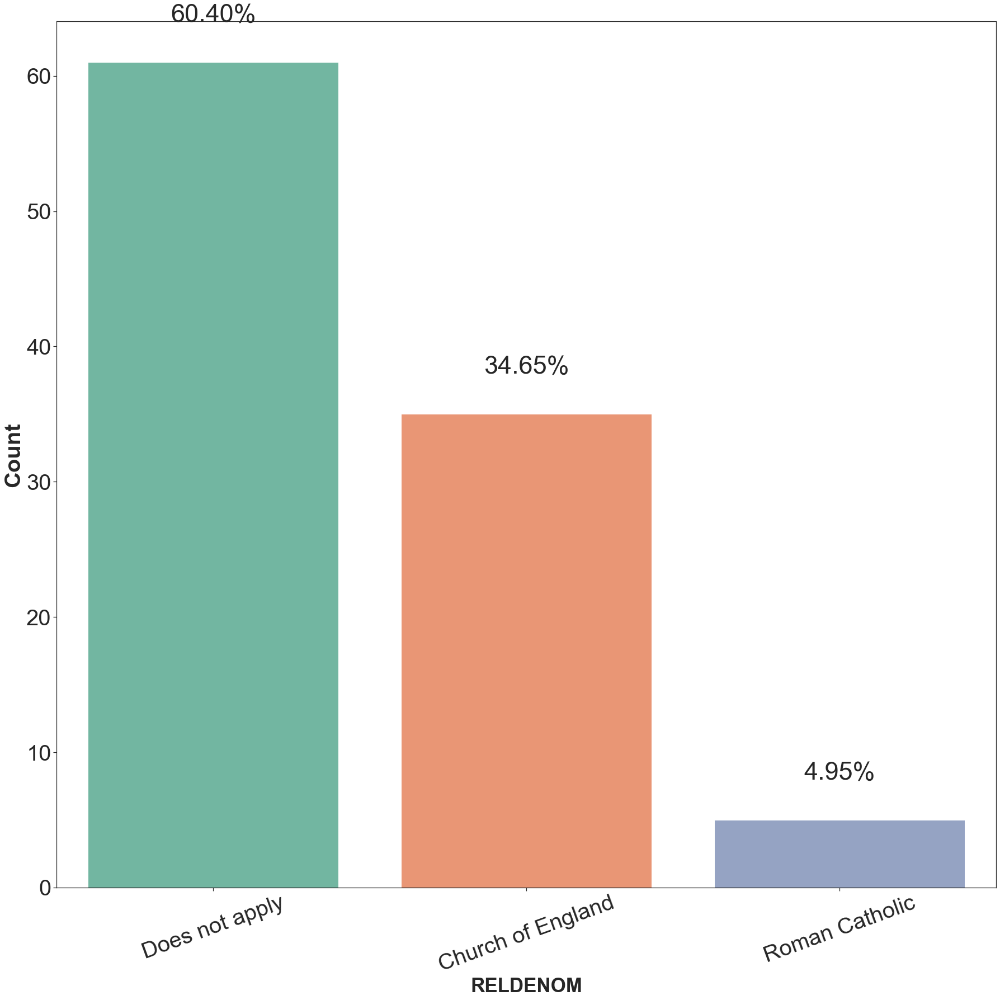

In [37]:
#uses the countplot_percentage() function to plot or visualize the schools with religious affiliation
countplot_percentage(combined_df_school_16, 'RELDENOM', '2016-2017 Schools with religious affiliation')

# # Countplot to decribe the number of schools according to school type

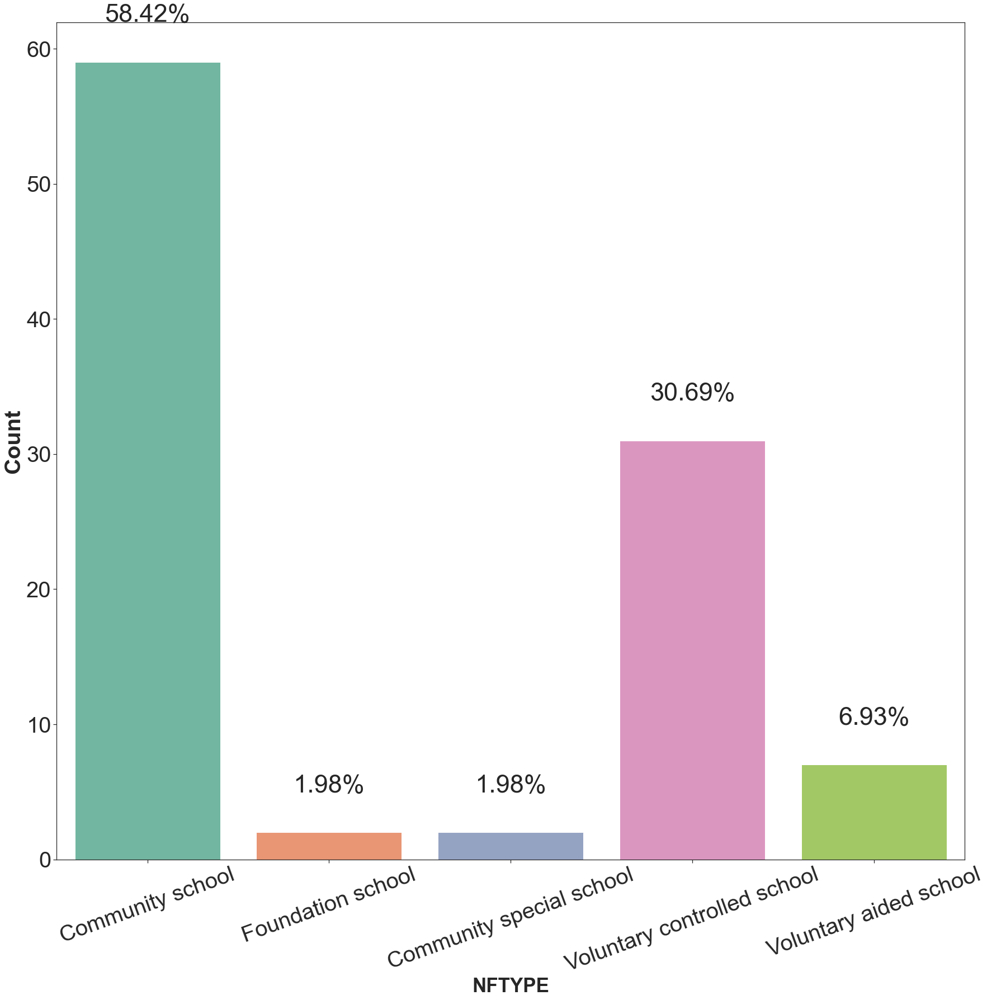

In [38]:
# #Decoding before plotting the graph for proper understanding. Since the original file has numbers dipicting school types
combined_df_school_16['NFTYPE'] =  combined_df_school_16['NFTYPE'].apply(lambda x: ' Sponsored academy' if x=='AC' else ('Academy converter - mainstream' if x=='ACC' else 
                                                                                                ('Community school' if x=='CY' else 
                                                                                                ('Community special school' if x=='CYS' else 
                                                                                                ('Free school - mainstream' if x=='F' else 
                                                                                                ('Foundation school'if x=='FD' else 
                                                                                                ('Voluntary aided school' if x=='VA' else 'Voluntary controlled school')))))))


#Uses the countplot_percentage() function to plot or visualize the schools with SCHOOL TYPES
countplot_percentage(combined_df_school_16, 'NFTYPE', '2016 Schools types')

# Getting the number of the schools and number of schools with school type and religious affiliation

This will be needed in the result ssection of the report

In [39]:
#Total number of schools
N_2016 = len([i for i in combined_df_school_16['NFTYPE']])

#below codes seives out a list and sum of eachschool type
Sponsored_academy = len([i for i in combined_df_school_16['NFTYPE'] if i == 'Sponsored academy' ]) #Sponsored academy
Academy_converter=len([i for i in combined_df_school_16['NFTYPE'] if i == 'Academy converter - mainstream' ]) #Academy converter - mainstream
Community_school = len([i for i in combined_df_school_16['NFTYPE'] if i == 'Community school' ]) #Community school
Community_special =len([i for i in combined_df_school_16['NFTYPE'] if i == 'Community special school' ]) #Community special school
Free_School =len([i for i in combined_df_school_16['NFTYPE'] if i == 'Free school - mainstream' ]) #Free school - mainstream
Foundation_school=len([i for i in combined_df_school_16['NFTYPE'] if i == 'Foundation school' ]) #Foundation schoo
Voluntary_aided_school=len([i for i in combined_df_school_16['NFTYPE'] if i == 'Voluntary aided school' ]) #Voluntary aided school
Voluntary_controlled_school=len([i for i in combined_df_school_16['NFTYPE'] if i == 'Voluntary controlled school' ]) #Voluntary controlled school


#below codes prints the number of each schools types
print('Total number of schools in cohort 1 is', N_2016)
print('Total number Sponsored academy in cohort 1 is',Sponsored_academy  )
print('Total number of Academy converter - mainstream in cohort 1 is', Academy_converter )
print('Total number of Community  school in cohort 1 is', Community_school)
print('Total number of Community special school in cohort 1 is', Community_special)
print('Total number of Free school - mainstream in cohort 1 is',Free_School )
print('Total number of Foundation school in cohort 1 is', Foundation_school)
print('Total number of Voluntary aided school in cohort 1 is',Voluntary_aided_school )
print('Total number of  Voluntary controlled school in cohort 1 is',Voluntary_controlled_school )

Total number of schools in cohort 1 is 101
Total number Sponsored academy in cohort 1 is 0
Total number of Academy converter - mainstream in cohort 1 is 0
Total number of Community  school in cohort 1 is 59
Total number of Community special school in cohort 1 is 2
Total number of Free school - mainstream in cohort 1 is 0
Total number of Foundation school in cohort 1 is 2
Total number of Voluntary aided school in cohort 1 is 7
Total number of  Voluntary controlled school in cohort 1 is 31


In [40]:
#below codes seives out a list and cum it for each of the school religiously affiliated
Roman_Catholic = len([i for i in combined_df_school_16['RELDENOM'] if i == 'Roman Catholic' ]) #Roman Catholic
Church_of_England=len([i for i in combined_df_school_16['RELDENOM'] if i == 'Church of England' ]) # Church of England
No_religion = len([i for i in combined_df_school_16['RELDENOM'] if i == 'Does not apply' ]) #Does not apply

#below codes prints the number of each religiously affiliated
print('Total number Roman Catholic schools in cohort 1 is',Roman_Catholic  )
print('Total number of Church of England schools in cohort 1 is', Church_of_England )
print('Total number school without religionin cohort 1 is', No_religion)

Total number Roman Catholic schools in cohort 1 is 5
Total number of Church of England schools in cohort 1 is 35
Total number school without religionin cohort 1 is 61


 # DATA MANIPULATION 
# Encoding: using lambda and comprehension

NFTYPE AND RELDENOM

In [41]:
#encoding for 'NFTYPE' i.e. School type for analysis 

combined_df_school_16['NFTYPE'] =  combined_df_school_16['NFTYPE'].apply(lambda x: 1 if x=='Sponsored academy' else (2 if x=='Academy converter - mainstream' else 
                                                                                                (3 if x=='Community school' else 
                                                                                                (4 if x=='Community special school' else 
                                                                                                (5 if x=='Free school - mainstream' else 
                                                                                                (6 if x=='Foundation school' else 
                                                                                                (7 if x=='Voluntary aided school' else 8)))))))
#encoding for 'RELDENOM', i.e. school religious affiliation for analysis
combined_df_school_16['RELDENOM'] =  combined_df_school_16['RELDENOM'].apply(lambda x: 1 if x=='Church of England' else (2 if x=='Roman Catholic' else 
                                                                                                (3 if x=='Does not apply' else 3 )))

In [42]:
combined_df_school_16.describe() # this describe the encoded dataframe

,URN,FSM,TOTALINCOME,TEACHINGSTAFF,TOTALEXPENDITURE,PGRANTFUNDING,PSELFGENERATEDINCOME,PTEACHINGSTAFF,PSUPPLYTEACHERS,PEDUCATIONSUPPORTSTAFF,PPREMISES,PBACKOFFICE,PCATERING,POTHERSTAFF,PENERGY,PLEARNINGRESOURCES,PICT,PBOUGHTINPROFESSIONALSERVICES,POTHER,NFTYPE,RELDENOM,TOTPUPS,TKS1AVERAGE,PTKS1GROUP_L,PTFSM6CLA1A,PTEALGRP2,PTMOBN,PTRWM_EXP,PTEALGRP1,PTEALGRP3,PSENELE,PSENELK,IMD,HLE,WRITPROG,MATPROG,READPROG,Average Progress
count,101.00000,101.000000,101.000000,101.000000,101.000000,101.000000,101.000000,101.000000,101.000000,101.000000,101.000000,101.000000,101.000000,101.000000,101.000000,101.000000,101.000000,101.000000,101.000000,101.000000,101.000000,101.000000,101.000000,101.000000,101.000000,101.000000,101.000000,101.000000,101.000000,101.000000,101.000000,101.000000,101.000000,101.000000,101.000000,101.000000,101.000000,101.000000
mean,119534.00000,11.309901,5150.584158,2313.881188,5151.495050,96.099010,3.900990,45.663366,2.881188,18.970297,5.871287,7.900990,3.663366,3.910891,1.217822,3.356436,1.574257,2.495050,2.584158,4.891089,2.257426,211.960396,16.004950,10.108911,23.772277,3.178218,92.980198,60.792079,96.772277,0.079208,1.118812,15.039604,4.000000,4.237624,0.260396,-1.015842,-0.316832,-0.357426
std,4858.95354,9.608439,2550.984850,811.216806,2515.728179,2.685163,2.685163,4.299482,1.861650,3.777447,1.781367,2.808932,1.638763,2.154526,0.558640,1.213129,0.766114,0.944709,0.908486,2.336241,0.945023,132.246733,1.985315,14.154788,16.656459,6.333081,6.549779,15.696061,6.310121,0.462237,2.790294,10.099427,2.412468,2.358595,2.662408,2.799955,2.746855,2.325277
min,117823.00000,0.000000,3665.000000,1536.000000,3547.000000,82.000000,1.000000,29.000000,0.000000,11.000000,0.000000,5.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,1.000000,3.000000,1.000000,41.000000,2.100000,0.000000,0.000000,0.000000,67.000000,0.000000,65.000000,0.000000,0.000000,0.000000,1.000000,1.000000,-9.000000,-9.600000,-10.400000,-9.533333
25%,117868.00000,4.500000,4197.000000,1953.000000,4232.000000,95.000000,2.000000,43.000000,2.000000,16.000000,5.000000,6.000000,3.000000,3.000000,1.000000,3.000000,1.000000,2.000000,2.000000,3.000000,1.000000,105.000000,15.600000,2.000000,14.000000,0.000000,90.000000,51.000000,96.000000,0.000000,0.000000,10.000000,2.000000,2.000000,-1.200000,-2.600000,-2.100000,-1.700000
50%,117971.00000,8.400000,4584.000000,2132.000000,4657.000000,97.000000,3.000000,46.000000,2.000000,19.000000,6.000000,7.000000,4.000000,4.000000,1.000000,3.000000,1.000000,2.000000,2.000000,3.000000,3.000000,166.000000,16.200000,7.000000,20.000000,0.000000,93.000000,63.000000,100.000000,0.000000,0.000000,13.000000,4.000000,4.000000,0.700000,-0.700000,-0.600000,0.066667
75%,118003.00000,14.500000,5397.000000,2380.000000,5318.000000,98.000000,5.000000,48.000000,4.000000,20.000000,7.000000,8.000000,4.000000,5.000000,1.000000,4.000000,2.000000,3.000000,3.000000,8.000000,3.000000,284.000000,17.000000,13.000000,30.000000,4.000000,100.000000,71.000000,100.000000,0.000000,0.000000,20.000000,5.000000,6.000000,1.800000,0.700000,1.200000,1.166667
max,135700.00000,48.200000,25433.000000,7228.000000,24714.000000,99.000000,18.000000,54.000000,9.000000,34.000000,10.000000,22.000000,10.000000,21.000000,3.000000,8.000000,4.000000,5.000000,6.000000,8.000000,3.000000,544.000000,18.800000,100.000000,96.000000,35.000000,100.000000,100.000000,100.000000,3.000000,18.000000,57.000000,10.000000,10.000000,5.900000,6.500000,10.700000,6.833333


In [43]:
#this is got to compare with the budget and what applies in other part of england
#refer to the website of east riding yorkshire for the interpretatio of IMD as 4 and HLE as 4... this implies the average IMD and HLE of the county
# for IMD 4 imples IMD is > 64.75% – 66.2%
#while HLE as 4 implies the county is 30% - 40% least deprived 
#,as at 2016

Socio_econo_df = combined_df_school_16.filter(['FSM','TOTALINCOME','TOTALEXPENDITURE','TOTPUPS','IMD','HLE'], axis=1)
Socio_econo_df.describe()

,FSM,TOTALINCOME,TOTALEXPENDITURE,TOTPUPS,IMD,HLE
count,101.000000,101.000000,101.000000,101.000000,101.000000,101.000000
mean,11.309901,5150.584158,5151.495050,211.960396,4.000000,4.237624
std,9.608439,2550.984850,2515.728179,132.246733,2.412468,2.358595
min,0.000000,3665.000000,3547.000000,41.000000,1.000000,1.000000
25%,4.500000,4197.000000,4232.000000,105.000000,2.000000,2.000000
50%,8.400000,4584.000000,4657.000000,166.000000,4.000000,4.000000
75%,14.500000,5397.000000,5318.000000,284.000000,5.000000,6.000000
max,48.200000,25433.000000,24714.000000,544.000000,10.000000,10.000000


In [44]:
#importing the researchpy library for analysis
import researchpy as rp 


Where:

N = Number of Samples

SD = Standard Deviation

SE = Standard Error

N, SD, SE for Writing Progress (WRITPROG)

In [45]:
#referene: https://www.pythonfordatascience.org/descriptive-statistics-python/
#Gets thetotal population number (N) ,Standard Deviation (SD), Standard Deviation (SD), Standard Error(SD) and confidence interval
rp.summary_cont(combined_df_school_16['WRITPROG'])

,Variable,N,Mean,SD,SE,95% Conf.,Interval
0,WRITPROG,101.0,0.2604,2.6624,0.2649,-0.2652,0.786


N, SD, SE for Maths Progress (MATPROG)

In [46]:
#referene: https://www.pythonfordatascience.org/descriptive-statistics-python/
#Gets thetotal population number (N) ,Standard Deviation (SD), Standard Deviation (SD), Standard Error(SD) and confidence interval
rp.summary_cont(combined_df_school_16['MATPROG'])

,Variable,N,Mean,SD,SE,95% Conf.,Interval
0,MATPROG,101.0,-1.0158,2.8,0.2786,-1.5686,-0.4631


N, SD, SE for Reading Progress (READPROG)

In [47]:
#referene: https://www.pythonfordatascience.org/descriptive-statistics-python/
#Gets thetotal population number (N) ,Standard Deviation (SD), Standard Deviation (SD), Standard Error(SD) and confidence interval
rp.summary_cont(combined_df_school_16['READPROG'])

,Variable,N,Mean,SD,SE,95% Conf.,Interval
0,READPROG,101.0,-0.3168,2.7469,0.2733,-0.8591,0.2254


N, SD, SE for Reading Progress (Average Progress)

In [48]:
#referene: https://www.pythonfordatascience.org/descriptive-statistics-python/
#Gets thetotal population number (N) ,Standard Deviation (SD), Standard Deviation (SD), Standard Error(SD) and confidence interval
rp.summary_cont(combined_df_school_16['Average Progress'])

,Variable,N,Mean,SD,SE,95% Conf.,Interval
0,Average Progress,101.0,-0.3574,2.3253,0.2314,-0.8165,0.1016


# Boxplot to analyze the reading,writing, maths and average attainment

<AxesSubplot:>

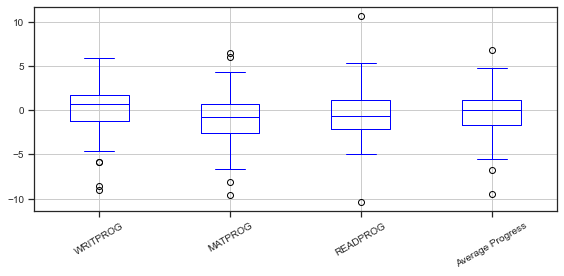

In [49]:
#Reference: https://stackoverflow.com/questions/67528790/plot-seaborn-boxplot-for-multiple-columns-and-compare-with-a-standard-scale
plt.rcParams['figure.figsize'] = (8,4)
combined_df_school_16.boxplot(column=['WRITPROG', 'MATPROG', 'READPROG', 'Average Progress'], grid='true', color='blue',fontsize=10, rot=30)

# Density distribution curve for the average progress _ 2016-2017

<AxesSubplot:xlabel='Average Progress', ylabel='Density'>

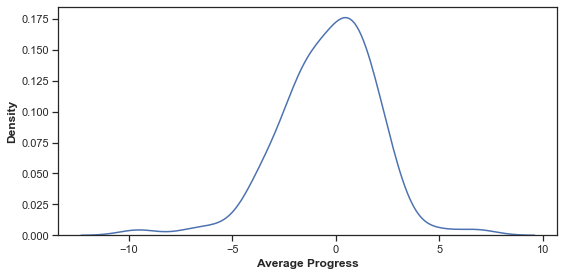

In [50]:
#Density distribution curve for the average progress _ 2016-2017
sns.kdeplot(combined_df_school_16['Average Progress'])

# Choosing the number of bins to plot a histogram and density distribution curve

([<matplotlib.axis.XTick at 0x1e4314a8>,
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

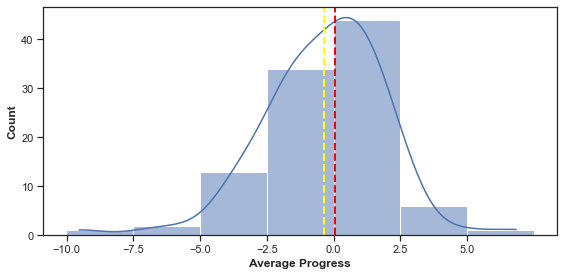

In [51]:
#getting the maximum and minimum values for the average progress to insert 
#for a better histogram that has bins and width that could be understood
mini= combined_df_school_16['Average Progress'].min() #i.e -9.53
maxi = combined_df_school_16['Average Progress'].max() #i.e. 6.83
# Plot histogram
sns.histplot(data = combined_df_school_16, x = "Average Progress", kde = True,bins = np.arange(mini-0.47,maxi+1.03,2.5))
#This code 'np.arange(mini-0.47,maxi+1.03,2.5)' above is to range the bins and to ensure the bin
#starts where the x -labeling starts as 'coded' with plt.xticks(np.arange(-10,7.5,2.5)) below

plt.axvline(combined_df_school_16['Average Progress'].mean(), color='yellow', linewidth=2, linestyle="--") #plots mean line and assigns properties to it
plt.axvline(combined_df_school_16['Average Progress'].median(), color='red', linewidth=2, linestyle="--") #plots meadian line and assigns properties to it
plt.xticks(np.arange(-10,7.5,2.5))

# Measure of skewness and Kurtosis - 2016 Average Progress distribution

SKEWNESS

In [52]:
from scipy.stats import skew
#prints the skewness of the distribution
print(skew(combined_df_school_16['Average Progress'], axis=0, bias=True))

-0.5908956476174485


KURTOSIS

In [53]:
from scipy.stats import kurtosis
#prints the kurtosis or peakedness of the distribution
print(kurtosis(combined_df_school_16['Average Progress'], axis=0, bias=True))

2.2283000793218317


# INFRENTIAL STATISTICS FOR COHORT1 (2016 -2017)

Grouping the columns based on column type:

1. Continuous Variable (Independent): FSM	TOTALINCOME                      , TEACHINGSTAFF                 , TOTALEXPENDITURE	
PGRANTFUNDING	,PSELFGENERATEDINCOME, PTEACHINGSTAFF, PSUPPLYTEACHERS,PEDUCATIONSUPPORTSTAFF,	PPREMISES,	PBACKOFFICE,	PCATERING,	POTHERSTAFF,	PENERGY,	PLEARNINGRESOURCES,	PICT,	PBOUGHTINPROFESSIONALSERVICES,	POTHER, TOTPUPS,	TKS1AVERAGE,	PTKS1GROUP_L,	PTFSM6CLA1A,	PTEALGRP2,	PTMOBN,	PTRWM_EXP,	PTEALGRP1,	PTEALGRP3,	PSENELE,	PSENELK



2. Categorical Variable (Independent): 
NFTYPE	, RELDENOM, IMD, HLE


3. Continuous Variable (Dependent): WRITPROG	MATPROG	READPROG	Average Progress

# Inferential Stats... Continuos variables (independent and dependent) - Correlation Test.

Pearson correlation is good for continuous variables both indepedent and dependent

In [54]:
#Continuos variable with the continuos dependent variable
#below code drops the categorical variables of the combined dataframe and saves the new dataframe for correlation analysis in continuos_df
continuos_df= combined_df_school_16.drop((['URN', 'NFTYPE' , 'RELDENOM', 'IMD', 'HLE','WRITPROG', 'MATPROG', 'READPROG','PTRWM_EXP']), axis=1)

In [55]:
continuos_df.head(2) #checking the dataframe

,FSM,TOTALINCOME,TEACHINGSTAFF,TOTALEXPENDITURE,PGRANTFUNDING,PSELFGENERATEDINCOME,PTEACHINGSTAFF,PSUPPLYTEACHERS,PEDUCATIONSUPPORTSTAFF,PPREMISES,PBACKOFFICE,PCATERING,POTHERSTAFF,PENERGY,PLEARNINGRESOURCES,PICT,PBOUGHTINPROFESSIONALSERVICES,POTHER,TOTPUPS,TKS1AVERAGE,PTKS1GROUP_L,PTFSM6CLA1A,PTEALGRP2,PTMOBN,PTEALGRP1,PTEALGRP3,PSENELE,PSENELK,Average Progress
0,18.2,4674.0,2019.0,4432.0,97.0,3.0,46.0,1.0,21.0,7.0,6.0,3.0,5.0,1.0,3.0,2.0,3.0,4.0,216.0,15.8,13.0,26.0,0.0,91.0,100.0,0.0,9.0,26.0,-1.933333
2,4.1,4686.0,2061.0,4795.0,93.0,7.0,43.0,3.0,18.0,4.0,10.0,4.0,5.0,1.0,5.0,2.0,4.0,1.0,114.0,17.1,6.0,12.0,0.0,94.0,100.0,0.0,0.0,12.0,-0.366667


<AxesSubplot:>

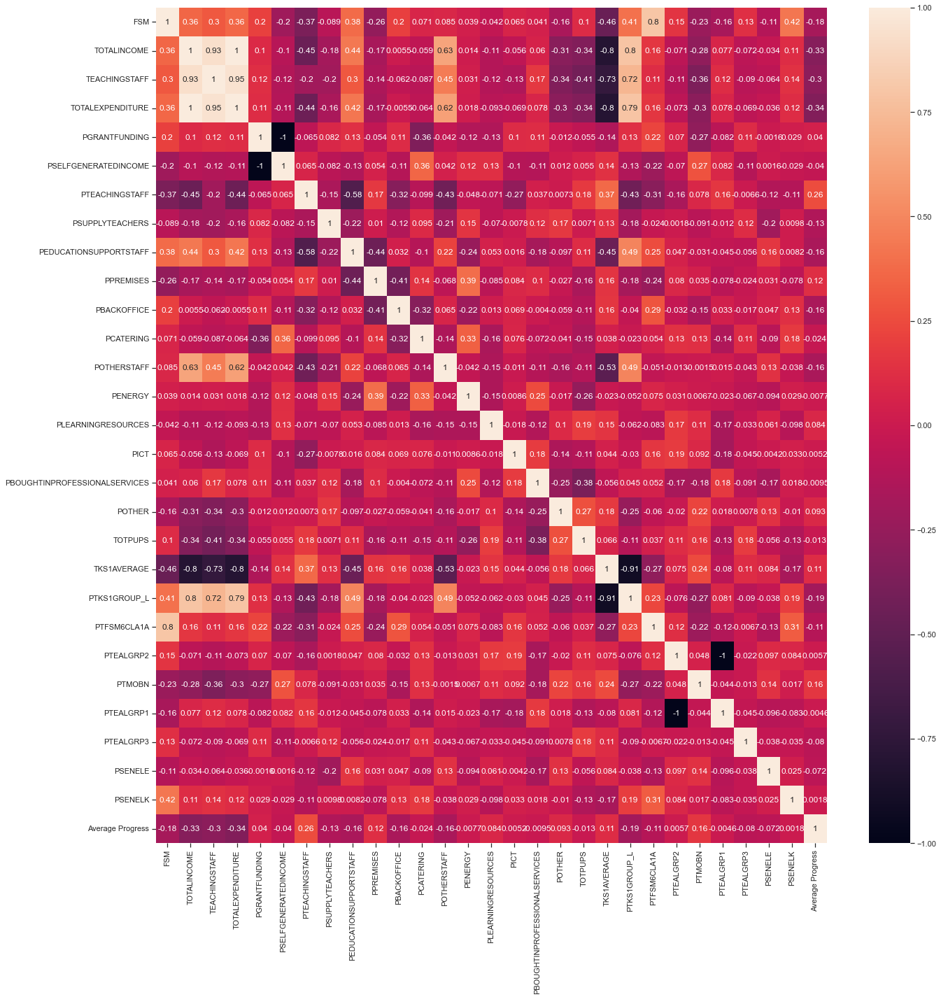

In [56]:
import seaborn as sns #imports seaborn library
corr=continuos_df.corr()  #gets the 'pairwise' correlation of the continous dataframe
features=corr.index 
plt.figure(figsize=(20,20)) #setting the figure size
sns.heatmap(continuos_df[features].corr(),annot=True) #plots the heat map
                                
                                                                                               

In [57]:
#Getting a Dataframe that has all the scores of the variables with the Average progress
corr.drop(['FSM', 'TOTALINCOME', 'TEACHINGSTAFF', 'TOTALEXPENDITURE',
       'PGRANTFUNDING', 'PSELFGENERATEDINCOME', 'PTEACHINGSTAFF',
       'PSUPPLYTEACHERS', 'PEDUCATIONSUPPORTSTAFF', 'PPREMISES', 'PBACKOFFICE',
       'PCATERING', 'POTHERSTAFF', 'PENERGY', 'PLEARNINGRESOURCES', 'PICT',
       'PBOUGHTINPROFESSIONALSERVICES', 'POTHER', 'TOTPUPS', 'TKS1AVERAGE',
       'PTKS1GROUP_L', 'PTFSM6CLA1A', 'PTEALGRP2', 'PTMOBN',
       'PTEALGRP1', 'PTEALGRP3', 'PSENELE', 'PSENELK'])

,FSM,TOTALINCOME,TEACHINGSTAFF,TOTALEXPENDITURE,PGRANTFUNDING,PSELFGENERATEDINCOME,PTEACHINGSTAFF,PSUPPLYTEACHERS,PEDUCATIONSUPPORTSTAFF,PPREMISES,PBACKOFFICE,PCATERING,POTHERSTAFF,PENERGY,PLEARNINGRESOURCES,PICT,PBOUGHTINPROFESSIONALSERVICES,POTHER,TOTPUPS,TKS1AVERAGE,PTKS1GROUP_L,PTFSM6CLA1A,PTEALGRP2,PTMOBN,PTEALGRP1,PTEALGRP3,PSENELE,PSENELK,Average Progress
Average Progress,-0.178036,-0.32585,-0.29663,-0.336172,0.039572,-0.039572,0.256579,-0.130417,-0.156624,0.122207,-0.156942,-0.023931,-0.158521,-0.007724,0.083901,0.005224,-0.009539,0.092568,-0.013325,0.112126,-0.191886,-0.108592,0.005704,0.160287,-0.004558,-0.08039,-0.07225,0.001815,1.0


In [58]:
#Reference: https://machinelearningmastery.com/statistical-hypothesis-tests-in-python-cheat-sheet/
# Example of the Pearson's Correlation test
from scipy.stats import pearsonr

for column in continuos_df.columns:
    independent_data = continuos_df[column] #getting the each of the independent variable on after the other with the function
    target_data = continuos_df['Average Progress'] #getting the target variable - a series
    stat, p = pearsonr(independent_data, target_data)
    print('stat=%.2f, p=%.2f' % (stat, p))# prints to 2 decimal place
    if p > 0.05: #since the significant value α = 0.05
        print(column, 'is Probably independent')  #print if variable is Probably independent to Average Progress
    else:
        print(column,'is Probably dependent') #print if variable is Probably dependent to Average Progress
    
    




stat=-0.18, p=0.07
FSM is Probably independent
stat=-0.33, p=0.00
TOTALINCOME is Probably dependent
stat=-0.30, p=0.00
TEACHINGSTAFF is Probably dependent
stat=-0.34, p=0.00
TOTALEXPENDITURE is Probably dependent
stat=0.04, p=0.69
PGRANTFUNDING is Probably independent
stat=-0.04, p=0.69
PSELFGENERATEDINCOME is Probably independent
stat=0.26, p=0.01
PTEACHINGSTAFF is Probably dependent
stat=-0.13, p=0.19
PSUPPLYTEACHERS is Probably independent
stat=-0.16, p=0.12
PEDUCATIONSUPPORTSTAFF is Probably independent
stat=0.12, p=0.22
PPREMISES is Probably independent
stat=-0.16, p=0.12
PBACKOFFICE is Probably independent
stat=-0.02, p=0.81
PCATERING is Probably independent
stat=-0.16, p=0.11
POTHERSTAFF is Probably independent
stat=-0.01, p=0.94
PENERGY is Probably independent
stat=0.08, p=0.40
PLEARNINGRESOURCES is Probably independent
stat=0.01, p=0.96
PICT is Probably independent
stat=-0.01, p=0.92
PBOUGHTINPROFESSIONALSERVICES is Probably independent
stat=0.09, p=0.36
POTHER is Probably ind

# Creating a correlation matrix for the top (10) features

The dependent variables are described by the ones with lowest p -values. These are (excluding progress scores of reading , maths and writing as these are expected.

These variables are: 

In [59]:
#Ranking the atrributes to rank the to 'best' attributes or variables 
from sklearn.feature_selection import f_regression, SelectKBest

In [60]:
X_10=continuos_df.iloc[:,:-1] #takes the dataframe less the target variable as the independent variable
y_10=continuos_df['Average Progress'] # assigns a variable to the target variable


rank_top_ten=SelectKBest(score_func=f_regression,k=28) # using select kbest and ranking
top_ten=rank_top_ten.fit(X_10,y_10) #fitting the values 

In [61]:
dfscores=pd.DataFrame(top_ten.scores_,columns=["Score of Attribute"])
dfcolumns=pd.DataFrame(X_10.columns)

In [62]:
rank=pd.concat([dfcolumns,dfscores],axis=1) # making a dataframe for the ranking
rank.columns=['Attributes','Score'] #assigning variables to the columns

In [63]:
#printing out the sorted variables according to their dependence on the dependent variable
#NOTE: matprog, readprog and writprog will not be considered as they are expected to to be highly correlated to the average progress
rank.nlargest(100,'Score')

,Attributes,Score
3,TOTALEXPENDITURE,12.613623
1,TOTALINCOME,11.760360
2,TEACHINGSTAFF,9.551336
6,PTEACHINGSTAFF,6.976725
20,PTKS1GROUP_L,3.784533
0,FSM,3.240696
23,PTMOBN,2.610583
12,POTHERSTAFF,2.551881
10,PBACKOFFICE,2.500037
8,PEDUCATIONSUPPORTSTAFF,2.489644


# Hence, top  continous correlated variables with there scores are

TOTALEXPENDITURE,	TOTALINCOME,	TEACHINGSTAFF,	PTEACHINGSTAFF,	PTKS1GROUP_L,	FSM,	PTMOBN,	POTHERSTAFF,,	PBACKOFFICE	

In [64]:
#dropping other columns that are not part of tope features
first_ten_df = continuos_df.drop(continuos_df.columns.difference(['PTRWM_EXP','TOTALEXPENDITURE','TOTALINCOME','TEACHINGSTAFF','PTEACHINGSTAFF','PTKS1GROUP_L','FSM','PTMOBN','POTHERSTAFF','PBACKOFFICE','Average Progress']), axis=1)

<AxesSubplot:>

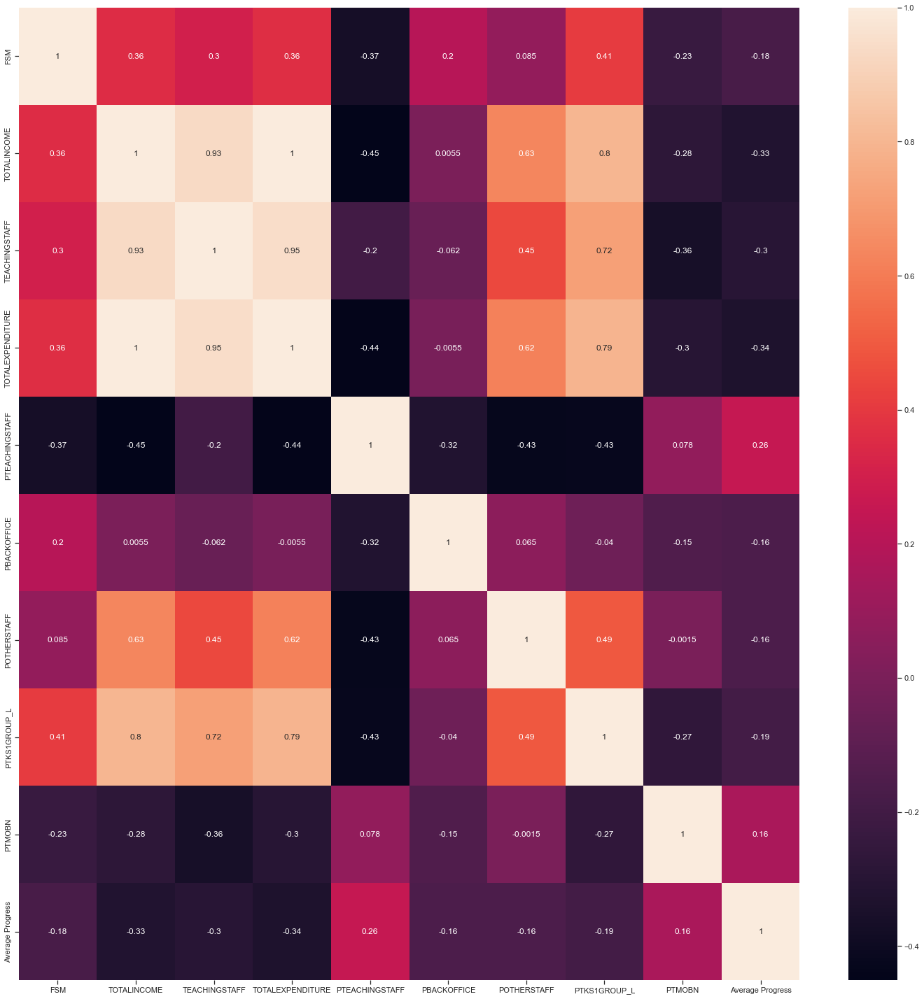

In [65]:
#plots a heat map of correlated features
corr=first_ten_df.corr() 
features=corr.index
plt.figure(figsize=(20,20))
sns.heatmap(first_ten_df[features].corr(),annot=True)

# Inferential Stats... Categorical variables (independent) and Continuos( dependent) 

In [66]:
#checking for the categorical variables first
#seives out the categorical variables

Categorical_df= combined_df_school_16.drop(combined_df_school_16.columns.difference([ 'NFTYPE' , 'RELDENOM', 'IMD', 'HLE','Average Progress']), axis=1)
Categorical_df

,NFTYPE,RELDENOM,IMD,HLE,Average Progress
0,3,3,7.0,7.0,-1.933333
2,6,1,1.0,2.0,-0.366667
3,4,3,4.0,4.0,-9.533333
4,8,1,5.0,4.0,-0.500000
5,8,1,2.0,2.0,-0.900000
6,4,3,2.0,2.0,-3.966667
8,7,2,10.0,10.0,0.066667
9,7,1,2.0,4.0,6.833333
10,7,2,4.0,5.0,-3.366667
11,8,1,2.0,2.0,0.966667


In [67]:
#Using Anova Hypothesis testing
#Reference: https://www.pythonfordatascience.org/factorial-anova-python/
#SUMARY OF THE CATEGORICAL INDEPENDENT VARIABLE

rp.summary_cat(Categorical_df[['NFTYPE' , 'RELDENOM', 'IMD', 'HLE']])

,Variable,Outcome,Count,Percent
0,NFTYPE,3.0,59,58.42
1,,8.0,31,30.69
2,,7.0,7,6.93
3,,6.0,2,1.98
4,,4.0,2,1.98
5,RELDENOM,3.0,61,60.40
6,,1.0,35,34.65
7,,2.0,5,4.95
8,IMD,2.0,23,22.77
9,,5.0,16,15.84


In [68]:
#Statistical Summary of the dependent
rp.summary_cont(Categorical_df["Average Progress"])

,Variable,N,Mean,SD,SE,95% Conf.,Interval
0,Average Progress,101.0,-0.3574,2.3253,0.2314,-0.8165,0.1016


In [69]:
X = Categorical_df.drop(labels=["Average Progress"],axis=1)
y = Categorical_df["Average Progress"]

# USING ANOVA for the Categorical Variables

In [70]:
# Importing the library for one-way anova
from scipy.stats import f_oneway
 
#assigning variables to each of the categorical variables, school type, religion affiliation, Encoded indices of multiple deprivation(IMD) and encoded healthy life expectancy (HLE) 
schltype = Categorical_df['NFTYPE'] #SCHOOL TYPE
religion_sch= Categorical_df['RELDENOM'] #religion affiliation
IMD = Categorical_df['IMD'] #indices of multiple deprivation
HLE =Categorical_df['HLE'] # healthy life expectancy
Average_prog = Categorical_df['Average Progress'] #target variable - Average Progress

 
# checking for the one-way ANOVA for school type
f_oneway(schltype, Average_prog)

F_onewayResult(statistic=256.0749873995373, pvalue=1.1855705567857289e-37)

Checking for the one-way ANOVA for RELIGIOUS AFFILIATION

In [71]:
f_oneway(religion_sch, Average_prog)

F_onewayResult(statistic=109.6165292567361, pvalue=9.842450460047747e-21)

Checking for the one-way ANOVA for IMD

In [72]:
f_oneway(IMD, Average_prog)

F_onewayResult(statistic=170.81302232967093, pvalue=1.2712142720094725e-28)

Checking for the one-way ANOVA for HLE

In [73]:
f_oneway(HLE, Average_prog)

F_onewayResult(statistic=194.40155117752846, pvalue=2.579022053456316e-31)

# COHORT 2 (2017-2018)

Merging dataframes, cleaning and analysis of data in the second cohort

In [74]:
df_school_17 = pd.read_csv('ks2final_17.csv') #reads 2017 school general attainment file

In [75]:
df_fund = pd.read_csv('811_cfr_17.csv') # reads 2017 school funds file

# Retaining the needed columns and deleting the rest for both df_school and df_fund

The dataframes contains a large number of irrelevant columns. Hence, the need to seive out the rellevant ones. command 'difference' will take out the difference of columns from the one stated in it. Example is the name and street names of the schools. This will not be needed in the coding, analysis or machine learning

In [76]:
# Retains the columns listed below and delete others, while saving in another dataframe
df_fund_new_17= df_fund.drop(df_fund.columns.difference(['URN','TEACHINGSTAFF' ,'FSM','TOTALINCOME','TOTALEXPENDITURE','PGRANTFUNDING','PSELFGENERATEDINCOME','PTEACHINGSTAFF','PSUPPLYTEACHERS','PEDUCATIONSUPPORTSTAFF','PPREMISES','PBACKOFFICE','PCATERING','POTHERSTAFF','PENERGY','PLEARNINGRESOURCES','PICT','PBOUGHTINPROFESSIONALSERVICES','POTHER']), axis=1)

In [77]:
df_fund_new_17.head(2)  #checking if this has been correctly sieved retaining the needed columns

,URN,FSM,TOTALINCOME,TEACHINGSTAFF,TOTALEXPENDITURE,PGRANTFUNDING,PSELFGENERATEDINCOME,PTEACHINGSTAFF,PSUPPLYTEACHERS,PEDUCATIONSUPPORTSTAFF,PPREMISES,PBACKOFFICE,PCATERING,POTHERSTAFF,PENERGY,PLEARNINGRESOURCES,PICT,PBOUGHTINPROFESSIONALSERVICES,POTHER
0,133480,23.2,"4,949","2,039","4,977",99%,1%,41%,2%,21%,0%,22%,0%,5%,0%,4%,1%,1%,3%
1,133481,7.1,"4,370","2,133","4,499",92%,8%,47%,1%,16%,7%,8%,4%,5%,1%,4%,2%,2%,4%


In [78]:
# Retains the columns listed below and delete others and saves this in a variable
df_school_new_17= df_school_17.drop(df_school_17.columns.difference(['URN', 'SCHNAME', 'NFTYPE','RELDENOM','TOTPUPS','TKS1AVERAGE','PTKS1GROUP_L','PTFSM6CLA1A','PTEALGRP2','PTMOBN','PSENELSE','PTRWM_EXP','PTRWM_HIGH_FSM6CLA1A','DIFFN_RWM_HIGH','PTEALGRP1','PTEALGRP3','PSENELE','PSENELK','PSENELSAP','IMD','HLE','READPROG','WRITPROG','MATPROG']), axis=1)

In [79]:
df_school_new_17.head(1)# CHECKING

,IMD,HLE,URN,SCHNAME,NFTYPE,RELDENOM,TOTPUPS,TKS1AVERAGE,PTKS1GROUP_L,PTFSM6CLA1A,PTEALGRP2,PTMOBN,PSENELSE,PTRWM_EXP,READPROG,WRITPROG,MATPROG,PTRWM_HIGH_FSM6CLA1A,DIFFN_RWM_HIGH,PTEALGRP1,PTEALGRP3,PSENELE,PSENELK,PSENELSAP
0,5.0,3.0,117823,Aldbrough Primary School,CY,Does not apply,138,15.4,6%,63%,0%,81%,0%,38%,-2.4,-1.8,-1.8,0%,-12,100%,0%,0%,6%,0%


In [80]:
df_school_new_17.info() #checking the information to check if we have nan values

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 125 entries, 0 to 124
Data columns (total 24 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   IMD                   122 non-null    float64
 1   HLE                   122 non-null    float64
 2   URN                   125 non-null    object 
 3   SCHNAME               125 non-null    object 
 4   NFTYPE                125 non-null    object 
 5   RELDENOM              125 non-null    object 
 6   TOTPUPS               125 non-null    object 
 7   TKS1AVERAGE           121 non-null    object 
 8   PTKS1GROUP_L          121 non-null    object 
 9   PTFSM6CLA1A           121 non-null    object 
 10  PTEALGRP2             121 non-null    object 
 11  PTMOBN                121 non-null    object 
 12  PSENELSE              118 non-null    object 
 13  PTRWM_EXP             121 non-null    object 
 14  READPROG              121 non-null    object 
 15  WRITPROG              1

In [81]:
df_fund_new_17.info() #checking the information to check if we have nan values

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 170 entries, 0 to 169
Data columns (total 19 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   URN                            131 non-null    object 
 1   FSM                            122 non-null    float64
 2   TOTALINCOME                    170 non-null    object 
 3   TEACHINGSTAFF                  170 non-null    object 
 4   TOTALEXPENDITURE               170 non-null    object 
 5   PGRANTFUNDING                  122 non-null    object 
 6   PSELFGENERATEDINCOME           122 non-null    object 
 7   PTEACHINGSTAFF                 122 non-null    object 
 8   PSUPPLYTEACHERS                122 non-null    object 
 9   PEDUCATIONSUPPORTSTAFF         122 non-null    object 
 10  PPREMISES                      122 non-null    object 
 11  PBACKOFFICE                    122 non-null    object 
 12  PCATERING                      122 non-null    obj

# Turning URN in df_fund_new to integer to be able to merge it with df_school_new which has URN as integer

In [82]:
#command below shows the unique values of URN in df_fund_new... This shows some non-numeric items such as nan and 'East Riding of Yorkshire' this will be turn to figure 0 to allow the merging of the dataframe
df_fund_new_17['URN'].unique()

array(['133480', '133481', '133519', '135700', '117823', '117824',
       '117825', '117827', '117829', '117830', '117831', '117832',
       '117833', '117838', '117839', '117840', '117841', '117842',
       '117851', '117852', '117853', '117854', '117855', '117858',
       '117859', '117860', '117861', '117862', '117864', '117866',
       '117867', '117868', '117872', '117873', '117875', '117878',
       '117881', '117882', '117883', '117885', '117886', '117888',
       '117889', '117891', '117892', '117893', '117894', '117909',
       '117911', '117912', '117916', '117935', '117936', '117937',
       '117939', '117940', '117941', '117942', '117969', '117970',
       '117971', '117972', '117973', '117974', '117976', '117977',
       '117978', '117979', '117980', '117981', '117982', '117983',
       '117984', '117985', '117987', '117988', '117989', '117990',
       '117992', '117993', '117995', '117997', '117998', '117999',
       '118000', '118001', '118002', '118003', '118025', '1180

In [83]:
#replaces 'East Riding of Yorkshire' to o and nan to o... this are just empty or erroneous spaces in t#he dataset.
#Not realy part of the figures. It will be seived out after merging the dataframe. This is also done to allow merging
df_fund_new_17['URN'] = df_fund_new_17['URN'].replace(np.nan,0)
df_fund_new_17['URN'] = df_fund_new_17['URN'].replace('East Riding of Yorkshire',0)

In [84]:
#converting the URN column in fund dataset to interger type just like the school attributes dataframe
df_fund_new_17['URN']=[int(i) for i in df_fund_new_17['URN']]

In [85]:
#replaces the white-spaces with an abritrary values to be seived out later 
df_school_new_17['URN'] = df_school_new_17['URN'].replace(' ', '888888')

In [86]:
#changes URN to ineteger type to allow dataframes merging
df_school_new_17['URN']=[int(i) for i in df_school_new_17['URN']]

In [87]:
df_school_new_17['URN'].unique() #gets the unique values of the URN 

array([117823, 117824, 117825, 117827, 117829, 117830, 117831, 117832,
       117838, 117839, 117840, 117841, 117842, 117851, 117852, 117853,
       117854, 117855, 117858, 117859, 117860, 117861, 117862, 117864,
       117866, 117867, 117868, 117872, 117873, 117874, 117875, 117878,
       117881, 117882, 117883, 117885, 117886, 117888, 117889, 117891,
       117892, 117893, 117894, 117909, 117911, 117935, 117936, 117937,
       117939, 117940, 117941, 117942, 117969, 117970, 117971, 117972,
       117973, 117976, 117977, 117978, 117980, 117981, 117982, 117983,
       117984, 117985, 117988, 117989, 117990, 117992, 117993, 117995,
       117996, 117997, 117998, 117999, 118000, 118001, 118002, 118003,
       118025, 118026, 118028, 118029, 118030, 118032, 118033, 118034,
       118035, 118036, 118044, 118045, 118120, 118122, 118144, 118145,
       118148, 132209, 132349, 133480, 133481, 133519, 134741, 135077,
       135078, 135115, 135700, 137151, 137306, 140119, 140178, 140551,
      

# Merging the dataframes

In [88]:
#merges the dataframes together
combined_df_school_17 = pd.merge(df_fund_new_17, df_school_new_17,   on=['URN'], how='inner') 
combined_df_school_17.shape

(106, 42)

In [89]:
combined_df_school_17.info() #confirms URN has been turned to integer datatype. As indicated it is now integer type in the combined dataframe

<class 'pandas.core.frame.DataFrame'>
Int64Index: 106 entries, 0 to 105
Data columns (total 42 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   URN                            106 non-null    int64  
 1   FSM                            106 non-null    float64
 2   TOTALINCOME                    106 non-null    object 
 3   TEACHINGSTAFF                  106 non-null    object 
 4   TOTALEXPENDITURE               106 non-null    object 
 5   PGRANTFUNDING                  106 non-null    object 
 6   PSELFGENERATEDINCOME           106 non-null    object 
 7   PTEACHINGSTAFF                 106 non-null    object 
 8   PSUPPLYTEACHERS                106 non-null    object 
 9   PEDUCATIONSUPPORTSTAFF         106 non-null    object 
 10  PPREMISES                      106 non-null    object 
 11  PBACKOFFICE                    106 non-null    object 
 12  PCATERING                      106 non-null    obj

In [90]:
#just to view the file comprehensively in csv format
pd.DataFrame.to_csv(combined_df_school_17, 'combined_df_school_17.csv', sep=',', index=False)

# DATA CLEANING _ 17-18

# NOTE

SUPP ... means Indicates that a school  figures have been suppressed because there are 5 or fewer pupils in the in the cohort.

Please refer to abbreviation excel in the reference below

Reference: DfE (2021a) All schools and colleges in England. Available online: https://www.compare-school-performance.service.gov.uk/schools-by-type?step=default&table=schools&region=all-england&for=primary [Accessed 28/07/2022].

Comment: While the reason for such figures being suppressed by ONS is not justifiable, this study deletes removes any column or rows that have a large number of suppressed figures to prevent error during analysis

Looking through the combine dataframe:
1) two columns PTRWM_HIGH_FSM6CLA1A	and  DIFFN_RWM_HIGH have high number of SUPP. In order not to affect the analysis, this will be dropped.

2). 5 Schools with URNs 117970, 117972, 118001, 117990 and 118144 have their progress scores suppressed and majority of their figures. Hence, the need to remove or drop the schools in order not to tamper with analysis and prediction



In [91]:
#Sieves out the schools with large number of suppressed figures drops the column
combined_df_school_17.drop(combined_df_school_17[(combined_df_school_17['URN'] ==117970) 
                                                 | (combined_df_school_17['URN'] == 117972)
                                                 | (combined_df_school_17['URN'] == 117990)
                                                 | (combined_df_school_17['URN'] == 118001)
                                                 | (combined_df_school_17['URN'] == 118144)].index, inplace=True)

In [92]:
#the school name is also irrelrvant for analysis... this would be removed
combined_df_school_17.drop(columns=['PTRWM_HIGH_FSM6CLA1A','DIFFN_RWM_HIGH', 'SCHNAME'], inplace= True)

In [93]:
#Below  changes the dataype of columns 'TOTPUPS','TKS1AVERAGE','WRITPROG','MATPROG' and 'READPROG'
#to float type, by first replacing the string type variables in the columns: 'NEW' and 'SUPP' to np.nan
#and then changing them to ploat type for further analysis
for columns in ['TOTPUPS','TKS1AVERAGE','WRITPROG','MATPROG', 'READPROG']:
        combined_df_school_17[columns] = combined_df_school_17[columns].replace("NEW", np.nan)
        combined_df_school_17[columns] = combined_df_school_17[columns].replace("SUPP", np.nan) #changes '?' in the data frame to 0
        combined_df_school_17[columns] = combined_df_school_17[columns].replace(np.nan, combined_df_school_17[columns].median())
        combined_df_school_17[columns]=[float(i) for i in combined_df_school_17[columns]]        


In [94]:
#displays maximumm columns
pd.set_option('display.max_columns', None)

In [95]:
combined_df_school_17.head(2)#checking the dataframe

,URN,FSM,TOTALINCOME,TEACHINGSTAFF,TOTALEXPENDITURE,PGRANTFUNDING,PSELFGENERATEDINCOME,PTEACHINGSTAFF,PSUPPLYTEACHERS,PEDUCATIONSUPPORTSTAFF,PPREMISES,PBACKOFFICE,PCATERING,POTHERSTAFF,PENERGY,PLEARNINGRESOURCES,PICT,PBOUGHTINPROFESSIONALSERVICES,POTHER,IMD,HLE,NFTYPE,RELDENOM,TOTPUPS,TKS1AVERAGE,PTKS1GROUP_L,PTFSM6CLA1A,PTEALGRP2,PTMOBN,PSENELSE,PTRWM_EXP,READPROG,WRITPROG,MATPROG,PTEALGRP1,PTEALGRP3,PSENELE,PSENELK,PSENELSAP
0,133480,23.2,"4,949","2,039","4,977",99%,1%,41%,2%,21%,0%,22%,0%,5%,0%,4%,1%,1%,3%,8.0,9.0,CY,Does not apply,409.0,16.9,6%,49%,0%,96%,0%,56%,-4.4,-0.8,-3.4,100%,0%,0%,31%,0%
1,133481,7.1,"4,370","2,133","4,499",92%,8%,47%,1%,16%,7%,8%,4%,5%,1%,4%,2%,2%,4%,5.0,4.0,CY,Does not apply,212.0,17.4,0%,3%,0%,100%,0%,87%,2.8,0.4,2.8,100%,0%,0%,6%,0%


In [96]:
#USING THE SAME FUNCTIONS APPLIED FOR 2016-2017 CLEANING: percent_remover(x) and  float_maker(x)

#changes 'SUPP' to an abbtrirary large number 88888 which would replace by median figure later...done to help the function float_maker work properly  
for column in ['PTKS1GROUP_L','PTFSM6CLA1A','PTEALGRP2','PTMOBN','PSENELSE','PTRWM_EXP','PPREMISES','PBACKOFFICE','PCATERING','PTEALGRP1','POTHERSTAFF','PICT','POTHER','PBOUGHTINPROFESSIONALSERVICES','PLEARNINGRESOURCES','PENERGY','PTEALGRP3','PSENELE','PSENELK','PSENELSAP','TEACHINGSTAFF','PTEACHINGSTAFF','PEDUCATIONSUPPORTSTAFF','PGRANTFUNDING','PSELFGENERATEDINCOME','PSUPPLYTEACHERS','TOTALINCOME','TOTALEXPENDITURE']:
    combined_df_school_17[column] = combined_df_school_17[column].replace("SUPP", '88888')

#removing the regular expressions % and ,
for colum in ['PTKS1GROUP_L','PTFSM6CLA1A','PTEALGRP2','PTMOBN','PSENELSE','PTRWM_EXP','PPREMISES','PBACKOFFICE','PCATERING','PTEALGRP1','POTHERSTAFF','PICT','POTHER','PBOUGHTINPROFESSIONALSERVICES','PLEARNINGRESOURCES','PENERGY','PTEALGRP3','PSENELE','PSENELK','PSENELSAP','TEACHINGSTAFF','PTEACHINGSTAFF','PEDUCATIONSUPPORTSTAFF','PGRANTFUNDING','PSELFGENERATEDINCOME','PSUPPLYTEACHERS','TOTALINCOME','TOTALEXPENDITURE']:
    combined_df_school_17[colum] = combined_df_school_17[colum].apply(lambda x: percent_remover(x))
#Turns the 'object numbers' to float numbers
for col in ['PTKS1GROUP_L','PTFSM6CLA1A','PTEALGRP2','PTMOBN','PSENELSE','PTRWM_EXP','PPREMISES','PBACKOFFICE','PCATERING','PTEALGRP1','POTHERSTAFF','PICT','POTHER','PBOUGHTINPROFESSIONALSERVICES','PLEARNINGRESOURCES','PENERGY','PTEALGRP3','PSENELE','PSENELK','PSENELSAP','TEACHINGSTAFF','PTEACHINGSTAFF','PEDUCATIONSUPPORTSTAFF','PGRANTFUNDING','PSELFGENERATEDINCOME','PSUPPLYTEACHERS','TOTALINCOME','TOTALEXPENDITURE']:
    combined_df_school_17[col] = combined_df_school_17[col].apply(lambda x: float_maker(x))
#replacing the arbitrary number 88888 with the median of the respective colunms. 88888is considered and outlier hence the use of median instead of mean
for cols in ['PTKS1GROUP_L','PTFSM6CLA1A','PTEALGRP2','PTMOBN','PSENELSE','PTRWM_EXP','PPREMISES','PBACKOFFICE','PCATERING','PTEALGRP1','POTHERSTAFF','PICT','POTHER','PBOUGHTINPROFESSIONALSERVICES','PLEARNINGRESOURCES','PENERGY','PTEALGRP3','PSENELE','PSENELK','PSENELSAP','TEACHINGSTAFF','PTEACHINGSTAFF','PEDUCATIONSUPPORTSTAFF','PGRANTFUNDING','PSELFGENERATEDINCOME','PSUPPLYTEACHERS','TOTALINCOME','TOTALEXPENDITURE']:
    combined_df_school_17[cols] = combined_df_school_17[cols].replace( 88888,combined_df_school_17[cols].median())
#replacing nan with median figures
for colss in ['PTKS1GROUP_L','PTFSM6CLA1A','PTEALGRP2','PTMOBN','PSENELSE','PTRWM_EXP','PPREMISES','PBACKOFFICE','PCATERING','PTEALGRP1','POTHERSTAFF','PICT','POTHER','PBOUGHTINPROFESSIONALSERVICES','PLEARNINGRESOURCES','PENERGY','PTEALGRP3','PSENELE','PSENELK','PSENELSAP','TEACHINGSTAFF','PTEACHINGSTAFF','PEDUCATIONSUPPORTSTAFF','PGRANTFUNDING','PSELFGENERATEDINCOME','PSUPPLYTEACHERS','TOTALINCOME','TOTALEXPENDITURE']:
    combined_df_school_17[colss] = combined_df_school_17[colss].replace(np.nan, combined_df_school_17[colss].median())
    

In [97]:
combined_df_school_17.head(5)#checking first 5 rows to verify if dataframe has been cleaned

,URN,FSM,TOTALINCOME,TEACHINGSTAFF,TOTALEXPENDITURE,PGRANTFUNDING,PSELFGENERATEDINCOME,PTEACHINGSTAFF,PSUPPLYTEACHERS,PEDUCATIONSUPPORTSTAFF,PPREMISES,PBACKOFFICE,PCATERING,POTHERSTAFF,PENERGY,PLEARNINGRESOURCES,PICT,PBOUGHTINPROFESSIONALSERVICES,POTHER,IMD,HLE,NFTYPE,RELDENOM,TOTPUPS,TKS1AVERAGE,PTKS1GROUP_L,PTFSM6CLA1A,PTEALGRP2,PTMOBN,PSENELSE,PTRWM_EXP,READPROG,WRITPROG,MATPROG,PTEALGRP1,PTEALGRP3,PSENELE,PSENELK,PSENELSAP
0,133480,23.2,4949.0,2039.0,4977.0,99.0,1.0,41.0,2.0,21.0,0.0,22.0,0.0,5.0,0.0,4.0,1.0,1.0,3.0,8.0,9.0,CY,Does not apply,409.0,16.9,6.0,49.0,0.0,96.0,0.0,56.0,-4.4,-0.8,-3.4,100.0,0.0,0.0,31.0,0.0
1,133481,7.1,4370.0,2133.0,4499.0,92.0,8.0,47.0,1.0,16.0,7.0,8.0,4.0,5.0,1.0,4.0,2.0,2.0,4.0,5.0,4.0,CY,Does not apply,212.0,17.4,0.0,3.0,0.0,100.0,0.0,87.0,2.8,0.4,2.8,100.0,0.0,0.0,6.0,0.0
2,133519,38.5,6836.0,2621.0,6988.0,99.0,1.0,38.0,9.0,18.0,6.0,10.0,4.0,3.0,2.0,2.0,1.0,5.0,4.0,6.0,6.0,CY,Does not apply,65.0,15.4,0.0,50.0,0.0,80.0,0.0,20.0,-3.4,-5.2,-4.5,100.0,0.0,0.0,80.0,0.0
3,135700,43.1,4868.0,2149.0,4731.0,96.0,4.0,45.0,4.0,18.0,7.0,6.0,4.0,3.0,3.0,3.0,1.0,3.0,2.0,9.0,7.0,CY,Does not apply,411.0,15.7,14.0,53.0,5.0,91.0,2.0,58.0,-1.9,-0.2,1.8,95.0,0.0,0.0,16.0,0.0
4,117823,18.1,5273.0,2298.0,5122.0,96.0,4.0,45.0,2.0,16.0,6.0,9.0,4.0,3.0,2.0,7.0,1.0,3.0,3.0,5.0,3.0,CY,Does not apply,138.0,15.4,6.0,63.0,0.0,81.0,0.0,38.0,-2.4,-1.8,-1.8,100.0,0.0,0.0,6.0,0.0


In [98]:
combined_df_school_17.info() #shows no null figure

<class 'pandas.core.frame.DataFrame'>
Int64Index: 101 entries, 0 to 105
Data columns (total 39 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   URN                            101 non-null    int64  
 1   FSM                            101 non-null    float64
 2   TOTALINCOME                    101 non-null    float64
 3   TEACHINGSTAFF                  101 non-null    float64
 4   TOTALEXPENDITURE               101 non-null    float64
 5   PGRANTFUNDING                  101 non-null    float64
 6   PSELFGENERATEDINCOME           101 non-null    float64
 7   PTEACHINGSTAFF                 101 non-null    float64
 8   PSUPPLYTEACHERS                101 non-null    float64
 9   PEDUCATIONSUPPORTSTAFF         101 non-null    float64
 10  PPREMISES                      101 non-null    float64
 11  PBACKOFFICE                    101 non-null    float64
 12  PCATERING                      101 non-null    flo

# DATA MANIPULATION 17-18

# Encoding:

NFTYPE AND RELDENOM

 # Uses the countplot_percentage() function to plot or visualize the schools with religious affiliation

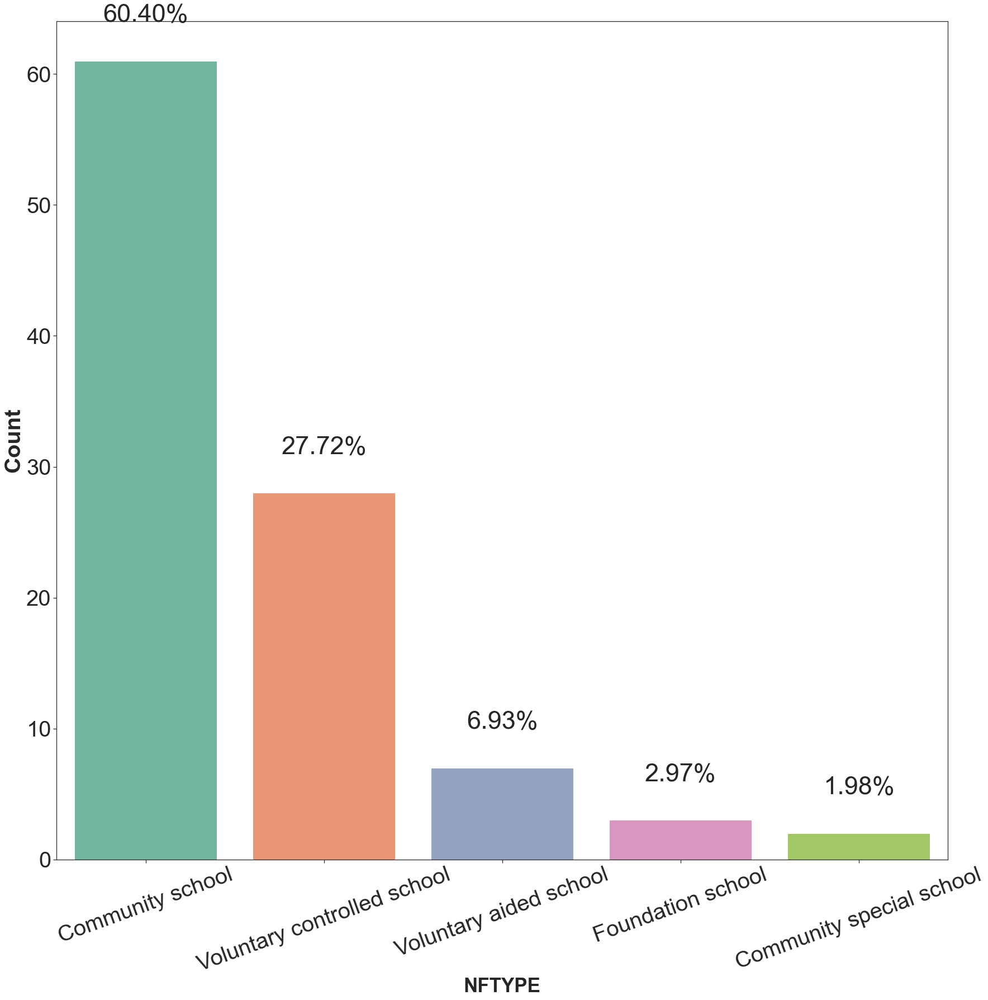

In [99]:
# #Decoding before plotting the graph
combined_df_school_17['NFTYPE'] =  combined_df_school_17['NFTYPE'].apply(lambda x: 'Sponsored academy' if x=='AC' else ('Academy converter - mainstream' if x=='ACC' else 
                                                                                                ('Community school' if x=='CY' else 
                                                                                                ('Community special school' if x=='CYS' else 
                                                                                                ('Free school - mainstream' if x=='F' else 
                                                                                                ('Foundation school'if x=='FD' else 
                                                                                                ('Voluntary aided school' if x=='VA' else 'Voluntary controlled school')))))))


#Plotting with function used in cohort 1
countplot_percentage(combined_df_school_17, 'NFTYPE', '2017 Schools types')

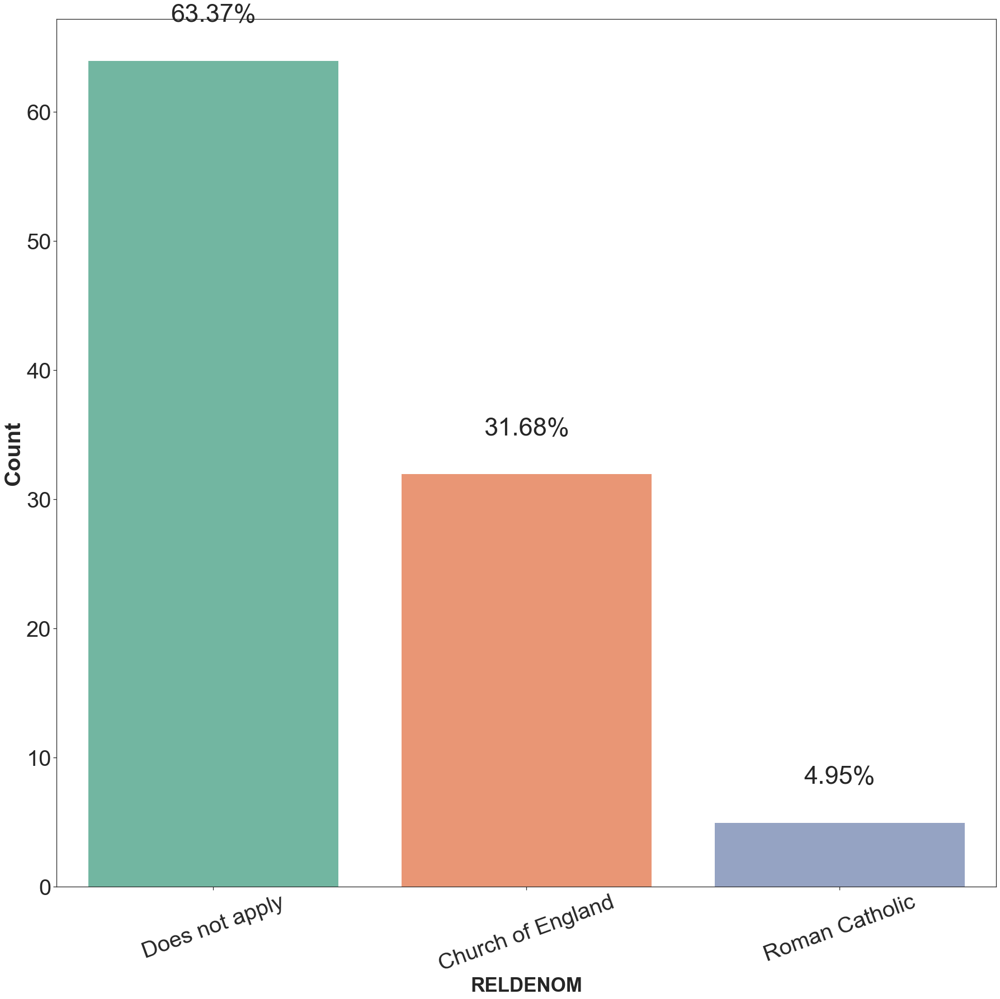

In [100]:
#changing the schools classified as None to does not apply before plotting
combined_df_school_17['RELDENOM'] =  combined_df_school_17['RELDENOM'].apply(lambda x: 'Does not apply' if x=='None' else x)

#Plotting the graph
countplot_percentage(combined_df_school_17, 'RELDENOM', '2017-2018 Schools Religious affiliation')

# Getting the number of the schools and number of schools with school type and religious affiliation - Cohort 2

In [101]:
#Total number of schools
N_2017 = len([i for i in combined_df_school_17['NFTYPE']])
#below codes seives out a list and cum it for each of the school type
Sponsored_academy = len([i for i in combined_df_school_17['NFTYPE'] if i == 'Sponsored academy' ])
Academy_converter=len([i for i in combined_df_school_17['NFTYPE'] if i == 'Academy converter - mainstream' ])
Community_school = len([i for i in combined_df_school_17['NFTYPE'] if i == 'Community school' ])
Community_special =len([i for i in combined_df_school_17['NFTYPE'] if i == 'Community special school' ])
Free_School =len([i for i in combined_df_school_17['NFTYPE'] if i == 'Free school - mainstream' ])
Foundation_school=len([i for i in combined_df_school_17['NFTYPE'] if i == 'Foundation school' ])
Voluntary_aided_school=len([i for i in combined_df_school_17['NFTYPE'] if i == 'Voluntary aided school' ])
Voluntary_controlled_school=len([i for i in combined_df_school_17['NFTYPE'] if i == 'Voluntary controlled school' ])


#below codes prints the number of each schools types
print('Total number of schools in cohort 2 is', N_2017)
print('Total number Sponsored academy in cohort 2 is',Sponsored_academy  )
print('Total number of Academy converter - mainstream in cohort 2 is', Academy_converter )
print('Total number of Community  school in cohort 2 is', Community_school)
print('Total number of Community special school in cohort 2 is', Community_special)
print('Total number of Free school - mainstream in cohort 2 is',Free_School )
print('Total number of Foundation school in cohort 2 is', Foundation_school)
print('Total number of Voluntary aided school in cohort 2 is',Voluntary_aided_school )
print('Total number of  Voluntary controlled school in cohort 2 is',Voluntary_controlled_school )

Total number of schools in cohort 2 is 101
Total number Sponsored academy in cohort 2 is 0
Total number of Academy converter - mainstream in cohort 2 is 0
Total number of Community  school in cohort 2 is 61
Total number of Community special school in cohort 2 is 2
Total number of Free school - mainstream in cohort 2 is 0
Total number of Foundation school in cohort 2 is 3
Total number of Voluntary aided school in cohort 2 is 7
Total number of  Voluntary controlled school in cohort 2 is 28


In [102]:
#below codes seives out a list and cum it for each of the school religiously affiliated
Roman_Catholic = len([i for i in combined_df_school_17['RELDENOM'] if i == 'Roman Catholic' ])
Church_of_England=len([i for i in combined_df_school_17['RELDENOM'] if i == 'Church of England' ])
No_religion = len([i for i in combined_df_school_17['RELDENOM'] if i == 'Does not apply' ])

#below codes prints the number of each religiously affiliated
print('Total number Roman Catholic schools in cohort 2 is',Roman_Catholic  )
print('Total number of Church of England schools in cohort 2 is', Church_of_England )
print('Total number school without religionin cohort 2 is', No_religion)

Total number Roman Catholic schools in cohort 2 is 5
Total number of Church of England schools in cohort 2 is 32
Total number school without religionin cohort 2 is 64


 # DATA MANIPULATION 
# Encoding: using lambda and comprehension

NFTYPE AND RELDENOM

In [103]:
#encoding for 'NFTYPE' i.e. School type for analysis 

combined_df_school_17['NFTYPE'] =  combined_df_school_17['NFTYPE'].apply(lambda x: 1 if x=='Sponsored academy' else (2 if x=='Academy converter - mainstream' else 
                                                                                                (3 if x=='Community school' else 
                                                                                                (4 if x=='Community special school' else 
                                                                                                (5 if x=='Free school - mainstream' else 
                                                                                                (6 if x=='Foundation school' else 
                                                                                                (7 if x=='Voluntary aided school' else 8)))))))
#encoding for 'RELDENOM', i.e. school religious affiliation for analysis
combined_df_school_17['RELDENOM'] =  combined_df_school_17['RELDENOM'].apply(lambda x: 1 if x=='Church of England' else (2 if x=='Roman Catholic' else 
                                                                                                (3 if x=='Does not apply' else 3 )))

In [104]:
combined_df_school_17.head()#checking if the encoding for 'NFTYPE','RELDENOM' has been effected

,URN,FSM,TOTALINCOME,TEACHINGSTAFF,TOTALEXPENDITURE,PGRANTFUNDING,PSELFGENERATEDINCOME,PTEACHINGSTAFF,PSUPPLYTEACHERS,PEDUCATIONSUPPORTSTAFF,PPREMISES,PBACKOFFICE,PCATERING,POTHERSTAFF,PENERGY,PLEARNINGRESOURCES,PICT,PBOUGHTINPROFESSIONALSERVICES,POTHER,IMD,HLE,NFTYPE,RELDENOM,TOTPUPS,TKS1AVERAGE,PTKS1GROUP_L,PTFSM6CLA1A,PTEALGRP2,PTMOBN,PSENELSE,PTRWM_EXP,READPROG,WRITPROG,MATPROG,PTEALGRP1,PTEALGRP3,PSENELE,PSENELK,PSENELSAP
0,133480,23.2,4949.0,2039.0,4977.0,99.0,1.0,41.0,2.0,21.0,0.0,22.0,0.0,5.0,0.0,4.0,1.0,1.0,3.0,8.0,9.0,3,3,409.0,16.9,6.0,49.0,0.0,96.0,0.0,56.0,-4.4,-0.8,-3.4,100.0,0.0,0.0,31.0,0.0
1,133481,7.1,4370.0,2133.0,4499.0,92.0,8.0,47.0,1.0,16.0,7.0,8.0,4.0,5.0,1.0,4.0,2.0,2.0,4.0,5.0,4.0,3,3,212.0,17.4,0.0,3.0,0.0,100.0,0.0,87.0,2.8,0.4,2.8,100.0,0.0,0.0,6.0,0.0
2,133519,38.5,6836.0,2621.0,6988.0,99.0,1.0,38.0,9.0,18.0,6.0,10.0,4.0,3.0,2.0,2.0,1.0,5.0,4.0,6.0,6.0,3,3,65.0,15.4,0.0,50.0,0.0,80.0,0.0,20.0,-3.4,-5.2,-4.5,100.0,0.0,0.0,80.0,0.0
3,135700,43.1,4868.0,2149.0,4731.0,96.0,4.0,45.0,4.0,18.0,7.0,6.0,4.0,3.0,3.0,3.0,1.0,3.0,2.0,9.0,7.0,3,3,411.0,15.7,14.0,53.0,5.0,91.0,2.0,58.0,-1.9,-0.2,1.8,95.0,0.0,0.0,16.0,0.0
4,117823,18.1,5273.0,2298.0,5122.0,96.0,4.0,45.0,2.0,16.0,6.0,9.0,4.0,3.0,2.0,7.0,1.0,3.0,3.0,5.0,3.0,3,3,138.0,15.4,6.0,63.0,0.0,81.0,0.0,38.0,-2.4,-1.8,-1.8,100.0,0.0,0.0,6.0,0.0


In [105]:
combined_df_school_17.columns# gives unique columns

Index(['URN', 'FSM', 'TOTALINCOME', 'TEACHINGSTAFF', 'TOTALEXPENDITURE',
       'PGRANTFUNDING', 'PSELFGENERATEDINCOME', 'PTEACHINGSTAFF',
       'PSUPPLYTEACHERS', 'PEDUCATIONSUPPORTSTAFF', 'PPREMISES', 'PBACKOFFICE',
       'PCATERING', 'POTHERSTAFF', 'PENERGY', 'PLEARNINGRESOURCES', 'PICT',
       'PBOUGHTINPROFESSIONALSERVICES', 'POTHER', 'IMD', 'HLE', 'NFTYPE',
       'RELDENOM', 'TOTPUPS', 'TKS1AVERAGE', 'PTKS1GROUP_L', 'PTFSM6CLA1A',
       'PTEALGRP2', 'PTMOBN', 'PSENELSE', 'PTRWM_EXP', 'READPROG', 'WRITPROG',
       'MATPROG', 'PTEALGRP1', 'PTEALGRP3', 'PSENELE', 'PSENELK', 'PSENELSAP'],
      dtype='object')

# Reordering the 'WRITPROG', 'MATPROG' AND 'READPROG' to right most of the dataframe

In [106]:
#Reordering the 'WRITPROG', 'MATPROG' AND  'READPROG' to right most of the dataframe
combined_df_school_17 = combined_df_school_17[['URN', 'FSM', 'TOTALINCOME', 'TEACHINGSTAFF', 'TOTALEXPENDITURE',
       'PGRANTFUNDING', 'PSELFGENERATEDINCOME', 'PTEACHINGSTAFF',
       'PSUPPLYTEACHERS', 'PEDUCATIONSUPPORTSTAFF', 'PPREMISES', 'PBACKOFFICE',
       'PCATERING', 'POTHERSTAFF', 'PENERGY', 'PLEARNINGRESOURCES', 'PICT',
       'PBOUGHTINPROFESSIONALSERVICES', 'POTHER', 'NFTYPE', 'RELDENOM',
       'TOTPUPS', 'TKS1AVERAGE', 'PTKS1GROUP_L', 'PTFSM6CLA1A', 'PTEALGRP2',
       'PTMOBN', 'PSENELSE', 'PTRWM_EXP',
       'PTEALGRP1', 'PTEALGRP3', 'PSENELE', 'PSENELK', 'PSENELSAP','IMD','HLE','WRITPROG', 'MATPROG', 'READPROG', ]]

In [107]:
combined_df_school_17.head(3) # confirming the reordering

,URN,FSM,TOTALINCOME,TEACHINGSTAFF,TOTALEXPENDITURE,PGRANTFUNDING,PSELFGENERATEDINCOME,PTEACHINGSTAFF,PSUPPLYTEACHERS,PEDUCATIONSUPPORTSTAFF,PPREMISES,PBACKOFFICE,PCATERING,POTHERSTAFF,PENERGY,PLEARNINGRESOURCES,PICT,PBOUGHTINPROFESSIONALSERVICES,POTHER,NFTYPE,RELDENOM,TOTPUPS,TKS1AVERAGE,PTKS1GROUP_L,PTFSM6CLA1A,PTEALGRP2,PTMOBN,PSENELSE,PTRWM_EXP,PTEALGRP1,PTEALGRP3,PSENELE,PSENELK,PSENELSAP,IMD,HLE,WRITPROG,MATPROG,READPROG
0,133480,23.2,4949.0,2039.0,4977.0,99.0,1.0,41.0,2.0,21.0,0.0,22.0,0.0,5.0,0.0,4.0,1.0,1.0,3.0,3,3,409.0,16.9,6.0,49.0,0.0,96.0,0.0,56.0,100.0,0.0,0.0,31.0,0.0,8.0,9.0,-0.8,-3.4,-4.4
1,133481,7.1,4370.0,2133.0,4499.0,92.0,8.0,47.0,1.0,16.0,7.0,8.0,4.0,5.0,1.0,4.0,2.0,2.0,4.0,3,3,212.0,17.4,0.0,3.0,0.0,100.0,0.0,87.0,100.0,0.0,0.0,6.0,0.0,5.0,4.0,0.4,2.8,2.8
2,133519,38.5,6836.0,2621.0,6988.0,99.0,1.0,38.0,9.0,18.0,6.0,10.0,4.0,3.0,2.0,2.0,1.0,5.0,4.0,3,3,65.0,15.4,0.0,50.0,0.0,80.0,0.0,20.0,100.0,0.0,0.0,80.0,0.0,6.0,6.0,-5.2,-4.5,-3.4


# Averaging the progress scores. i.e. MATHPROG, WRITPROG AND READPROG 2017-2018

In [108]:
#Averaging the progress scores. i.e. MATHPROG, WRITPROG AND READPROG 2017-2018
combined_df_school_17['Average Progress']= (combined_df_school_17['WRITPROG'] +  combined_df_school_17['MATPROG'] + combined_df_school_17['READPROG'])/3

In [109]:
#Checking if column has been correctly created
combined_df_school_17.head(3)

,URN,FSM,TOTALINCOME,TEACHINGSTAFF,TOTALEXPENDITURE,PGRANTFUNDING,PSELFGENERATEDINCOME,PTEACHINGSTAFF,PSUPPLYTEACHERS,PEDUCATIONSUPPORTSTAFF,PPREMISES,PBACKOFFICE,PCATERING,POTHERSTAFF,PENERGY,PLEARNINGRESOURCES,PICT,PBOUGHTINPROFESSIONALSERVICES,POTHER,NFTYPE,RELDENOM,TOTPUPS,TKS1AVERAGE,PTKS1GROUP_L,PTFSM6CLA1A,PTEALGRP2,PTMOBN,PSENELSE,PTRWM_EXP,PTEALGRP1,PTEALGRP3,PSENELE,PSENELK,PSENELSAP,IMD,HLE,WRITPROG,MATPROG,READPROG,Average Progress
0,133480,23.2,4949.0,2039.0,4977.0,99.0,1.0,41.0,2.0,21.0,0.0,22.0,0.0,5.0,0.0,4.0,1.0,1.0,3.0,3,3,409.0,16.9,6.0,49.0,0.0,96.0,0.0,56.0,100.0,0.0,0.0,31.0,0.0,8.0,9.0,-0.8,-3.4,-4.4,-2.866667
1,133481,7.1,4370.0,2133.0,4499.0,92.0,8.0,47.0,1.0,16.0,7.0,8.0,4.0,5.0,1.0,4.0,2.0,2.0,4.0,3,3,212.0,17.4,0.0,3.0,0.0,100.0,0.0,87.0,100.0,0.0,0.0,6.0,0.0,5.0,4.0,0.4,2.8,2.8,2.000000
2,133519,38.5,6836.0,2621.0,6988.0,99.0,1.0,38.0,9.0,18.0,6.0,10.0,4.0,3.0,2.0,2.0,1.0,5.0,4.0,3,3,65.0,15.4,0.0,50.0,0.0,80.0,0.0,20.0,100.0,0.0,0.0,80.0,0.0,6.0,6.0,-5.2,-4.5,-3.4,-4.366667


# DESCRIPTIVE STATISTICS FOR COHORT 2 (2017 -2018)

In [110]:
combined_df_school_17.describe()

,URN,FSM,TOTALINCOME,TEACHINGSTAFF,TOTALEXPENDITURE,PGRANTFUNDING,PSELFGENERATEDINCOME,PTEACHINGSTAFF,PSUPPLYTEACHERS,PEDUCATIONSUPPORTSTAFF,PPREMISES,PBACKOFFICE,PCATERING,POTHERSTAFF,PENERGY,PLEARNINGRESOURCES,PICT,PBOUGHTINPROFESSIONALSERVICES,POTHER,NFTYPE,RELDENOM,TOTPUPS,TKS1AVERAGE,PTKS1GROUP_L,PTFSM6CLA1A,PTEALGRP2,PTMOBN,PSENELSE,PTRWM_EXP,PTEALGRP1,PTEALGRP3,PSENELE,PSENELK,PSENELSAP,IMD,HLE,WRITPROG,MATPROG,READPROG,Average Progress
count,101.000000,101.000000,101.000000,101.000000,101.000000,101.000000,101.000000,101.000000,101.000000,101.000000,101.000000,101.000000,101.000000,101.000000,101.000000,101.000000,101.000000,101.000000,101.000000,101.000000,101.000000,101.000000,101.000000,101.000000,101.000000,101.000000,101.000000,101.000000,101.000000,101.000000,101.000000,101.000000,101.000000,101.0,101.000000,101.000000,101.000000,101.000000,101.000000,101.000000
mean,119533.415842,11.456436,5369.465347,2340.742574,5354.376238,95.900990,4.099010,44.732673,3.049505,19.039604,5.633663,8.049505,3.900990,3.732673,1.485149,3.495050,1.475248,2.782178,2.633663,4.772277,2.316832,209.811881,16.114851,8.485149,23.237624,2.544554,92.237624,2.722772,64.207921,97.425743,0.039604,1.297030,16.603960,0.0,4.138614,4.267327,-0.099010,-0.585149,-0.368317,-0.350825
std,4859.186712,9.364074,2393.773989,745.062825,2312.267475,3.077353,3.077353,5.302624,2.325409,4.520887,1.701310,2.797771,1.723398,1.434511,0.626320,1.154329,0.729302,1.967760,0.902472,2.288586,0.926614,134.611865,1.950558,13.769977,16.693800,5.545313,7.878005,4.516899,17.828806,5.557601,0.313713,3.938387,13.676315,0.0,2.395954,2.353258,2.672508,2.688955,2.737588,2.369442
min,117823.000000,0.000000,3734.000000,1506.000000,3613.000000,79.000000,0.000000,30.000000,0.000000,11.000000,0.000000,5.000000,0.000000,1.000000,0.000000,1.000000,0.000000,0.000000,1.000000,3.000000,1.000000,40.000000,2.600000,0.000000,0.000000,0.000000,67.000000,0.000000,0.000000,65.000000,0.000000,0.000000,0.000000,0.0,1.000000,1.000000,-12.000000,-12.400000,-12.700000,-12.366667
25%,117867.000000,5.100000,4370.000000,1966.000000,4340.000000,95.000000,2.000000,42.000000,2.000000,16.000000,5.000000,7.000000,3.000000,3.000000,1.000000,3.000000,1.000000,2.000000,2.000000,3.000000,1.000000,100.000000,15.600000,0.000000,11.000000,0.000000,89.000000,0.000000,56.000000,98.000000,0.000000,0.000000,8.000000,0.0,2.000000,2.000000,-1.500000,-1.800000,-2.300000,-1.600000
50%,117942.000000,8.300000,4762.000000,2153.000000,4690.000000,97.000000,3.000000,45.000000,3.000000,19.000000,5.000000,7.000000,4.000000,4.000000,1.000000,3.000000,1.000000,2.000000,3.000000,3.000000,3.000000,168.000000,16.400000,6.000000,20.000000,0.000000,94.000000,0.000000,65.000000,100.000000,0.000000,0.000000,14.000000,0.0,4.000000,4.000000,-0.100000,-0.500000,-0.100000,0.000000
75%,118025.000000,16.000000,5534.000000,2506.000000,5597.000000,98.000000,5.000000,48.000000,4.000000,21.000000,6.000000,9.000000,4.000000,4.000000,2.000000,4.000000,2.000000,3.000000,3.000000,8.000000,3.000000,299.000000,17.000000,10.000000,31.000000,2.000000,98.000000,4.000000,75.000000,100.000000,0.000000,0.000000,22.000000,0.0,6.000000,6.000000,1.700000,1.100000,1.400000,1.366667
max,135700.000000,44.200000,21848.000000,7060.000000,21105.000000,100.000000,21.000000,57.000000,16.000000,41.000000,11.000000,22.000000,10.000000,8.000000,3.000000,7.000000,3.000000,14.000000,7.000000,8.000000,3.000000,566.000000,18.800000,100.000000,88.000000,35.000000,100.000000,33.000000,100.000000,100.000000,3.000000,33.000000,80.000000,0.0,10.000000,10.000000,5.900000,5.900000,5.500000,4.800000


In [111]:
#this is got to compare with the budget and what applies in other part of england
#refer to the website of east riding yorkshire for the interpretatio of IMD as 4 and HLE as 4... this implies the average IMD and HLE of the county
Socio_econo_df_17 = combined_df_school_17.filter(['FSM','TOTALINCOME','TOTALEXPENDITURE','TOTPUPS','IMD','HLE'], axis=1)
Socio_econo_df_17.describe()

,FSM,TOTALINCOME,TOTALEXPENDITURE,TOTPUPS,IMD,HLE
count,101.000000,101.000000,101.000000,101.000000,101.000000,101.000000
mean,11.456436,5369.465347,5354.376238,209.811881,4.138614,4.267327
std,9.364074,2393.773989,2312.267475,134.611865,2.395954,2.353258
min,0.000000,3734.000000,3613.000000,40.000000,1.000000,1.000000
25%,5.100000,4370.000000,4340.000000,100.000000,2.000000,2.000000
50%,8.300000,4762.000000,4690.000000,168.000000,4.000000,4.000000
75%,16.000000,5534.000000,5597.000000,299.000000,6.000000,6.000000
max,44.200000,21848.000000,21105.000000,566.000000,10.000000,10.000000


In [112]:
#importing the researchpy library for analysis
import researchpy as rp 


Where:

N = Number of Samples

SD = Standard Deviation

SE = Standard Error

N, SD, SE for Writing Progress (WRITPROG,MATPTOG and READPROG)

In [113]:
#referene: https://www.pythonfordatascience.org/descriptive-statistics-python/
#Gets thetotal population number (N) ,Standard Deviation (SD), Standard Deviation (SD), Standard Error(SD) and confidence interval
rp.summary_cont(combined_df_school_17['WRITPROG'])

,Variable,N,Mean,SD,SE,95% Conf.,Interval
0,WRITPROG,101.0,-0.099,2.6725,0.2659,-0.6266,0.4286


In [114]:
#referene: https://www.pythonfordatascience.org/descriptive-statistics-python/
rp.summary_cont(combined_df_school_17['MATPROG'])

,Variable,N,Mean,SD,SE,95% Conf.,Interval
0,MATPROG,101.0,-0.5851,2.689,0.2676,-1.116,-0.0543


In [115]:
#referene: https://www.pythonfordatascience.org/descriptive-statistics-python/
#Gets thetotal population number (N) ,Standard Deviation (SD), Standard Deviation (SD), Standard Error(SD) and confidence interval
rp.summary_cont(combined_df_school_17['READPROG'])

,Variable,N,Mean,SD,SE,95% Conf.,Interval
0,READPROG,101.0,-0.3683,2.7376,0.2724,-0.9088,0.1721


In [116]:
#referene: https://www.pythonfordatascience.org/descriptive-statistics-python/
#Gets thetotal population number (N) ,Standard Deviation (SD), Standard Deviation (SD), Standard Error(SD) and confidence interval
rp.summary_cont(combined_df_school_17['Average Progress'])

,Variable,N,Mean,SD,SE,95% Conf.,Interval
0,Average Progress,101.0,-0.3508,2.3694,0.2358,-0.8186,0.1169


# Boxplot to analyze the reading,writing, maths and average attainment

<AxesSubplot:>

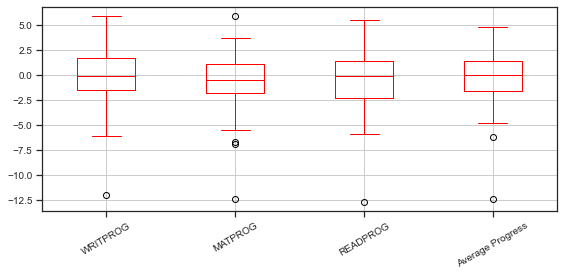

In [117]:
#Reference: https://stackoverflow.com/questions/67528790/plot-seaborn-boxplot-for-multiple-columns-and-compare-with-a-standard-scale
plt.rcParams['figure.figsize'] = (8,4) #sets the parameters of the figure
combined_df_school_17.boxplot(column=['WRITPROG', 'MATPROG', 'READPROG', 'Average Progress'], grid='true', color='RED',fontsize=10, rot=30)

# Density distribution curve for the average progress _ 2017-2018

<AxesSubplot:xlabel='Average Progress', ylabel='Density'>

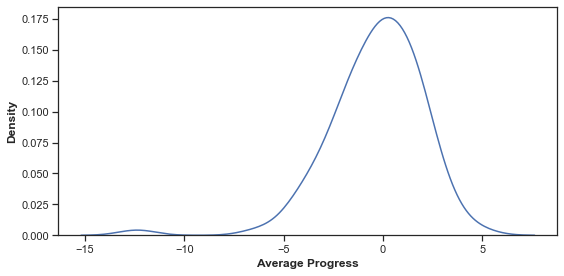

In [118]:
#Density distribution curve for the average progress _ 2017-2018
sns.kdeplot(combined_df_school_17['Average Progress'])

([<matplotlib.axis.XTick at 0x1d001088>,
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

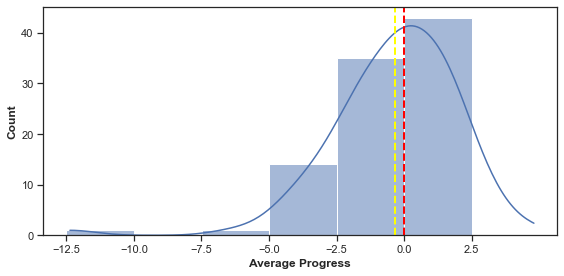

In [119]:
#getting the maximum and minimum values for the average progress to insert 
#for a better histogram that has bins and width that could be understood
mini= combined_df_school_17['Average Progress'].min() #i.e -12.37
maxi = combined_df_school_17['Average Progress'].max() #i.e.4.8
# Plot histogram
sns.histplot(data = combined_df_school_17, x = "Average Progress", kde = True,bins = np.arange(mini-0.13,maxi+0.2,2.5))
#This code 'np.arange(mini-0.47,maxi+1.03,2.5)' above is to range the bins and to ensure the bin
#starts where the x -labeling starts as 'coded' with plt.xticks(np.arange(-10,7.5,2.5)) below

plt.axvline(combined_df_school_17['Average Progress'].mean(), color='yellow', linewidth=2, linestyle="--")
plt.axvline(combined_df_school_17['Average Progress'].median(), color='red', linewidth=2, linestyle="--")
plt.xticks(np.arange(-12.5,5,2.5))

# Measure of skewness and Kurtosis - 2017 Average Progress distribution

SKEWNESS

In [120]:
#prints the skewness of the distribution
print(skew(combined_df_school_17['Average Progress'], axis=0, bias=True))

-1.4098032019288382


KURTOSIS

In [121]:
#prints the kurtosis or peakedness of the distribution
print(kurtosis(combined_df_school_17['Average Progress'], axis=0, bias=True))

5.285985269138196


# INFRENTIAL STATISTICS FOR COHORT1 (2017 -2018)

Grouping the columns based on column type:

1. Continuous Variable (Independent): FSM	TOTALINCOME                      , TEACHINGSTAFF                 , TOTALEXPENDITURE	
PGRANTFUNDING	,PSELFGENERATEDINCOME, PTEACHINGSTAFF, PSUPPLYTEACHERS,PEDUCATIONSUPPORTSTAFF,	PPREMISES,	PBACKOFFICE,	PCATERING,	POTHERSTAFF,	PENERGY,	PLEARNINGRESOURCES,	PICT,	PBOUGHTINPROFESSIONALSERVICES,	POTHER, TOTPUPS,	TKS1AVERAGE,	PTKS1GROUP_L,	PTFSM6CLA1A,	PTEALGRP2,	PTMOBN,	PTRWM_EXP,	PTEALGRP1,	PTEALGRP3,	PSENELE,	PSENELK



2. Categorical Variable (Independent): 
NFTYPE	, RELDENOM, IMD, HLE


3. Continuous Variable (Dependent): WRITPROG	MATPROG	READPROG	Average Progress

# Inferential Stats... Continuos variables (independent and dependent) - Correlation Test

In [122]:
#Continuos variable with the continuos dependent variable
# continuos_df = combined_df_school_17.filter(['FSM','TOTALINCOME','TOTALEXPENDITURE','TOTPUPS','IMD','HLE'], axis=1)'
continuos_df_17= combined_df_school_17.drop((['URN', 'NFTYPE' , 'RELDENOM', 'IMD', 'HLE','WRITPROG', 'MATPROG', 'READPROG','PTRWM_EXP']), axis=1)

In [123]:
continuos_df_17.head(2) #checking the dataframe

,FSM,TOTALINCOME,TEACHINGSTAFF,TOTALEXPENDITURE,PGRANTFUNDING,PSELFGENERATEDINCOME,PTEACHINGSTAFF,PSUPPLYTEACHERS,PEDUCATIONSUPPORTSTAFF,PPREMISES,PBACKOFFICE,PCATERING,POTHERSTAFF,PENERGY,PLEARNINGRESOURCES,PICT,PBOUGHTINPROFESSIONALSERVICES,POTHER,TOTPUPS,TKS1AVERAGE,PTKS1GROUP_L,PTFSM6CLA1A,PTEALGRP2,PTMOBN,PSENELSE,PTEALGRP1,PTEALGRP3,PSENELE,PSENELK,PSENELSAP,Average Progress
0,23.2,4949.0,2039.0,4977.0,99.0,1.0,41.0,2.0,21.0,0.0,22.0,0.0,5.0,0.0,4.0,1.0,1.0,3.0,409.0,16.9,6.0,49.0,0.0,96.0,0.0,100.0,0.0,0.0,31.0,0.0,-2.866667
1,7.1,4370.0,2133.0,4499.0,92.0,8.0,47.0,1.0,16.0,7.0,8.0,4.0,5.0,1.0,4.0,2.0,2.0,4.0,212.0,17.4,0.0,3.0,0.0,100.0,0.0,100.0,0.0,0.0,6.0,0.0,2.000000


<AxesSubplot:>

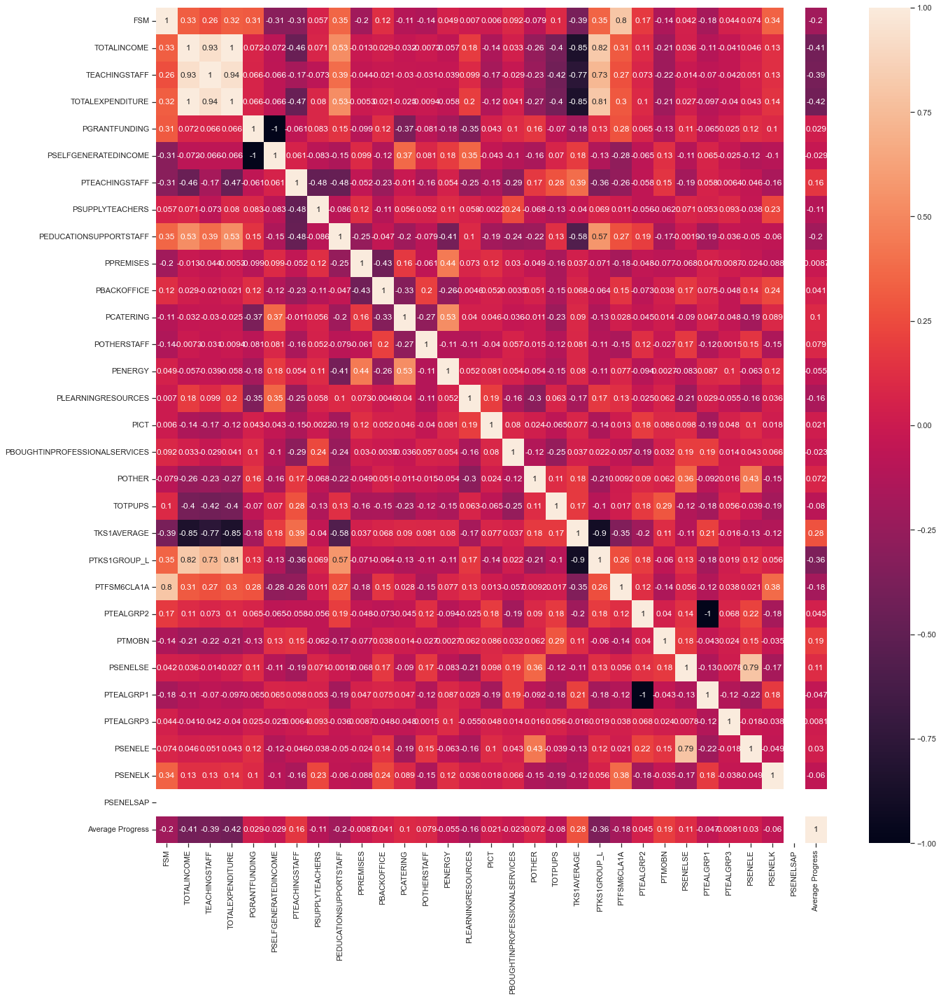

In [124]:
import seaborn as sns #imports seaborn library
corr_17=continuos_df_17.corr()  #gets the 'pairwise' correlation of the continous dataframe
features_17=corr_17.index
plt.figure(figsize=(20,20)) #setting the figure size
sns.heatmap(continuos_df_17[features_17].corr(),annot=True)  #plots the heat map

In [125]:
#Getting a Dataframe that has all the scores of the variables with the Average progress
corr_17.drop(['FSM', 'TOTALINCOME', 'TEACHINGSTAFF', 'TOTALEXPENDITURE',
       'PGRANTFUNDING', 'PSELFGENERATEDINCOME', 'PTEACHINGSTAFF',
       'PSUPPLYTEACHERS', 'PEDUCATIONSUPPORTSTAFF', 'PPREMISES', 'PBACKOFFICE',
       'PCATERING', 'POTHERSTAFF', 'PENERGY', 'PLEARNINGRESOURCES', 'PICT',
       'PBOUGHTINPROFESSIONALSERVICES', 'POTHER', 'TOTPUPS', 'TKS1AVERAGE',
       'PTKS1GROUP_L', 'PTFSM6CLA1A', 'PTEALGRP2', 'PTMOBN', 
       'PTEALGRP1', 'PTEALGRP3', 'PSENELE', 'PSENELK','PSENELSE','PSENELSAP'])

,FSM,TOTALINCOME,TEACHINGSTAFF,TOTALEXPENDITURE,PGRANTFUNDING,PSELFGENERATEDINCOME,PTEACHINGSTAFF,PSUPPLYTEACHERS,PEDUCATIONSUPPORTSTAFF,PPREMISES,PBACKOFFICE,PCATERING,POTHERSTAFF,PENERGY,PLEARNINGRESOURCES,PICT,PBOUGHTINPROFESSIONALSERVICES,POTHER,TOTPUPS,TKS1AVERAGE,PTKS1GROUP_L,PTFSM6CLA1A,PTEALGRP2,PTMOBN,PSENELSE,PTEALGRP1,PTEALGRP3,PSENELE,PSENELK,PSENELSAP,Average Progress
Average Progress,-0.198683,-0.4125,-0.393427,-0.417726,0.02856,-0.02856,0.160849,-0.107828,-0.199835,-0.008717,0.041012,0.101282,0.078536,-0.055319,-0.156698,0.021062,-0.022845,0.071953,-0.079908,0.275206,-0.361552,-0.183461,0.045306,0.194763,0.114686,-0.047245,0.008116,0.029746,-0.060433,NaN,1.0


In [126]:
#Reference: https://machinelearningmastery.com/statistical-hypothesis-tests-in-python-cheat-sheet/
# Example of the Pearson's Correlation test
from scipy.stats import pearsonr

for column in continuos_df_17.columns:
    data1 = continuos_df_17[column]  #getting the each of the independent variable on after the other with the function
    data2 = continuos_df_17['Average Progress'] #getting the target variable - a series
    stat, p = pearsonr(data1, data2)
    print('stat=%.2f, p=%.2f' % (stat, p)) # prints to 2 decimal place
    if p > 0.05:     #since the significant value α = 0.05
        print(column, 'is Probably independent') #print if variable is Probably independent to Average Progress
    else:
        print(column,'is Probably dependent') #print if variable is Probably dependent to Average Progress

stat=-0.20, p=0.05
FSM is Probably dependent
stat=-0.41, p=0.00
TOTALINCOME is Probably dependent
stat=-0.39, p=0.00
TEACHINGSTAFF is Probably dependent
stat=-0.42, p=0.00
TOTALEXPENDITURE is Probably dependent
stat=0.03, p=0.78
PGRANTFUNDING is Probably independent
stat=-0.03, p=0.78
PSELFGENERATEDINCOME is Probably independent
stat=0.16, p=0.11
PTEACHINGSTAFF is Probably independent
stat=-0.11, p=0.28
PSUPPLYTEACHERS is Probably independent
stat=-0.20, p=0.05
PEDUCATIONSUPPORTSTAFF is Probably dependent
stat=-0.01, p=0.93
PPREMISES is Probably independent
stat=0.04, p=0.68
PBACKOFFICE is Probably independent
stat=0.10, p=0.31
PCATERING is Probably independent
stat=0.08, p=0.44
POTHERSTAFF is Probably independent
stat=-0.06, p=0.58
PENERGY is Probably independent
stat=-0.16, p=0.12
PLEARNINGRESOURCES is Probably independent
stat=0.02, p=0.83
PICT is Probably independent
stat=-0.02, p=0.82
PBOUGHTINPROFESSIONALSERVICES is Probably independent
stat=0.07, p=0.47
POTHER is Probably indepe

c:\program files (x86)\python39-32\lib\site-packages\scipy\stats\stats.py:3913: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())


# Creating a correlation matrix for the top features

The dependent variables are described by the ones with lowest p -values. These are (excluding progress scores of reading , maths and writing as these are expected.

These variables are:

In [127]:
#Ranking the atrributes to rank the to 'best' attributes or variables 
from sklearn.feature_selection import f_regression, SelectKBest

In [128]:
X_10_17=continuos_df_17.iloc[:,:-1] #takes the dataframe less the target variable as the independent variable
y_10_17=continuos_df_17['Average Progress'] # assigns a variable to the target variable


rank_top_ten=SelectKBest(score_func=f_regression,k=30) # using select kbest and ranking
top_ten_17=rank_top_ten.fit(X_10_17,y_10_17) #fitting the values

In [129]:
dfscores_17=pd.DataFrame(top_ten_17.scores_,columns=["Score of Attribute"]) #getting dataframe for the top features
dfcolumns_17=pd.DataFrame(X_10_17.columns) #getting dataframe for the  coloulns

In [130]:
rank_17=pd.concat([dfcolumns_17,dfscores_17],axis=1) # concatenating the two dataframes to form one with attributes and scores
rank_17.columns=['Attributes','Score'] #assigning column header

In [131]:
#printing out the sorted variables according to their dependence on the dependent variable
#NOTE: matprog, readprog and writprog will not be considered as they are expected to to be highly correlated to the average progress
rank_17.nlargest(100,'Score')

,Attributes,Score
3,TOTALEXPENDITURE,20.926648
1,TOTALINCOME,20.299623
2,TEACHINGSTAFF,18.129935
20,PTKS1GROUP_L,14.887366
19,TKS1AVERAGE,8.112521
8,PEDUCATIONSUPPORTSTAFF,4.117934
0,FSM,4.068622
23,PTMOBN,3.903377
21,PTFSM6CLA1A,3.448197
6,PTEACHINGSTAFF,2.629383


# Hence, top continous correlated variables with there scores are

 TOTALEXPENDITURE, TOTALINCOME, TEACHINGSTAFF, PTEACHINGSTAFF, PTKS1GROUP_L, FSM, PTMOBN, POTHERSTAFF,, PBACKOFFICE

In [132]:
#dropping other variables that are not part of the top features
first_ten_df_17 = continuos_df_17.drop(continuos_df_17.columns.difference(['PTRWM_EXP','PTKS1GROUP_L','TOTALINCOME','TOTALEXPENDITURE','TEACHINGSTAFF','TKS1AVERAGE','PTMOBN','FSM','PTFSM6CLA1A','PEDUCATIONSUPPORTSTAFF','Average Progress']), axis=1)

<AxesSubplot:>

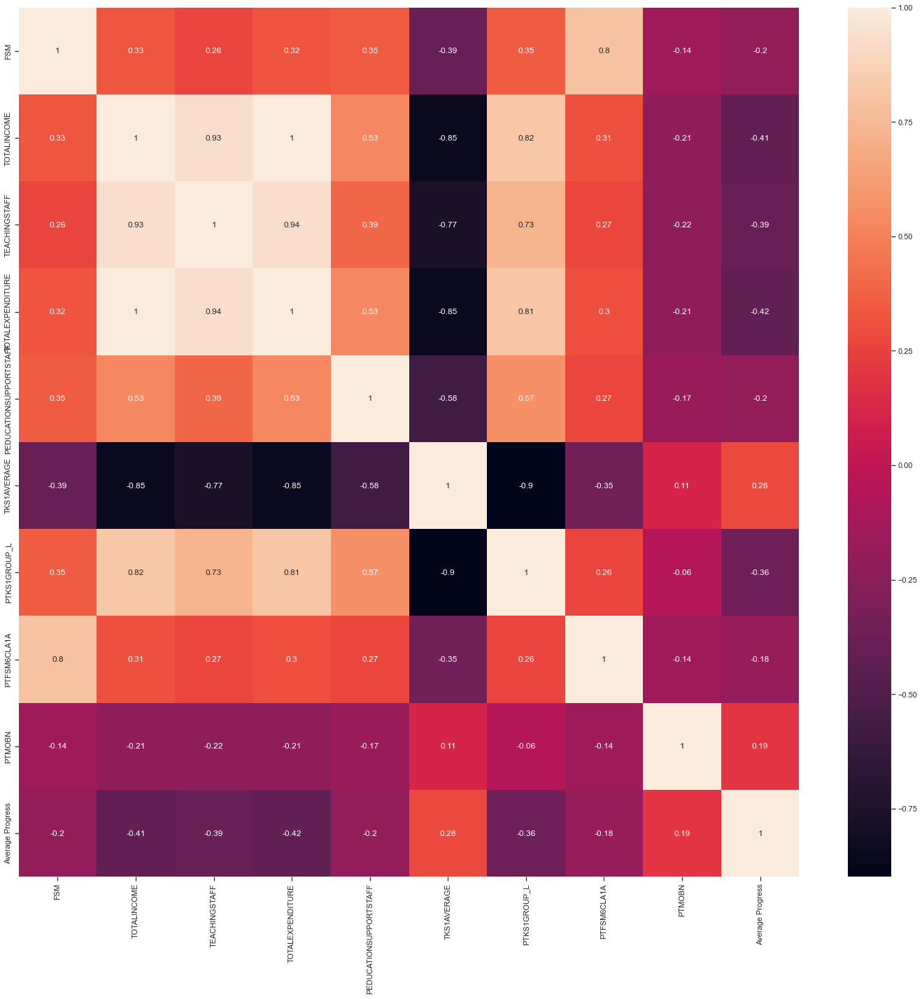

In [133]:
#plots a heatmap of correlated features
corr=first_ten_df_17.corr()
features=corr.index
plt.figure(figsize=(20,20))
sns.heatmap(first_ten_df_17[features].corr(),annot=True)

# Inferential Stats... Categorical variables (independent) and Continuos( dependent)

In [134]:
#checking for the categorical variables first
#seives out the categorical variables

Categorical_df_17= combined_df_school_17.drop(combined_df_school_17.columns.difference([ 'NFTYPE' , 'RELDENOM', 'IMD', 'HLE','Average Progress']), axis=1)
Categorical_df_17

,NFTYPE,RELDENOM,IMD,HLE,Average Progress
0,3,3,8.0,9.0,-2.866667
1,3,3,5.0,4.0,2.000000
2,3,3,6.0,6.0,-4.366667
3,3,3,9.0,7.0,-0.100000
4,3,3,5.0,3.0,-2.000000
5,3,3,5.0,2.0,3.100000
6,3,3,4.0,9.0,0.133333
7,3,3,2.0,3.0,-1.500000
8,3,3,5.0,3.0,-1.433333
9,3,3,6.0,8.0,0.766667


In [135]:
#Using Anova Hypothesis testing
#Reference: https://www.pythonfordatascience.org/factorial-anova-python/
#SUMARY OF THE CATEGORICAL INDEPENDENT VARIABLE

rp.summary_cat(Categorical_df_17[['NFTYPE' , 'RELDENOM', 'IMD', 'HLE']])

,Variable,Outcome,Count,Percent
0,NFTYPE,3.0,61,60.40
1,,8.0,28,27.72
2,,7.0,7,6.93
3,,6.0,3,2.97
4,,4.0,2,1.98
5,RELDENOM,3.0,64,63.37
6,,1.0,32,31.68
7,,2.0,5,4.95
8,IMD,2.0,21,20.79
9,,5.0,19,18.81


In [136]:
#Statistical Summary of the dependent
rp.summary_cont(Categorical_df_17["Average Progress"])

,Variable,N,Mean,SD,SE,95% Conf.,Interval
0,Average Progress,101.0,-0.3508,2.3694,0.2358,-0.8186,0.1169


In [137]:
X = Categorical_df_17.drop(labels=["Average Progress"],axis=1) # assigning variables to the features or independent variables
y = Categorical_df_17["Average Progress"] #assigning a variable to target variable

# USING ANOVA for the Categorical Variables

In [138]:
# Importing the library for one-way anova
from scipy.stats import f_oneway
 
schltype = Categorical_df_17['NFTYPE']
religion_sch= Categorical_df_17['RELDENOM']
IMD = Categorical_df_17['IMD']
HLE =Categorical_df_17['HLE']
Average_prog = Categorical_df_17['Average Progress']

 
# checking for the one-way ANOVA for school type
f_oneway(schltype, Average_prog)

F_onewayResult(statistic=244.27689593086853, pvalue=1.6468405816546267e-36)

Checking for the one-way ANOVA for RELIGIOUS AFFILIATION

In [139]:
f_oneway(religion_sch, Average_prog)

F_onewayResult(statistic=111.0412363000613, pvalue=6.193856188066707e-21)

Checking for the one-way ANOVA for IMD

In [140]:
f_oneway(IMD, Average_prog)

F_onewayResult(statistic=179.27678123700719, pvalue=1.314030949397058e-29)

Checking for the one-way ANOVA for HLE

In [141]:
f_oneway(HLE, Average_prog)

F_onewayResult(statistic=193.15321047635834, pvalue=3.546748566255682e-31)

# COHORT 3 (2018-2019)

In [142]:
df_school_18 = pd.read_csv('ks2final_18.csv') #reads 2016 school general attainment file

In [143]:
df_fund_18 = pd.read_csv('811_cfr_18.csv') # reads 2016 school funds file

In [144]:
df_fund_18.head(3) #shows first three rows

,LA,URN,LONDON/NON-LONDON,MEDIAN,PUPILS,FSM,FSMBAND,GRANTFUNDING,SELFGENERATEDINCOME,TOTALINCOME,TEACHINGSTAFF,SUPPLYTEACHERS,EDUCATIONSUPPORTSTAFF,PREMISES,BACKOFFICE,CATERING,OTHERSTAFF,ENERGY,LEARNINGRESOURCES,ICT,BOUGHTINPROFESSIONALSERVICES,OTHER,TOTALEXPENDITURE,T1415CAT1,T1415CAT2,T1415CAT3,T1415CAT4,T1415CAT5,T1415CAT1LA,T1415CAT2LA,T1415CAT3LA,T1415CAT4LA,T1415CAT5LA,T1516CAT1,T1516CAT2,T1516CAT3,T1516CAT4,T1516CAT5,T1516CAT1LA,T1516CAT2LA,T1516CAT3LA,T1516CAT4LA,T1516CAT5LA,T1617CAT1,T1617CAT2,T1617CAT3,T1617CAT4,T1617CAT5,T1617CAT1LA,T1617CAT2LA,T1617CAT3LA,T1617CAT4LA,T1617CAT5LA,T1718CAT1,T1718CAT2,T1718CAT3,T1718CAT4,T1718CAT5,T1718CAT1LA,T1718CAT2LA,T1718CAT3LA,T1718CAT4LA,T1718CAT5LA,T1819CAT1,T1819CAT2,T1819CAT3,T1819CAT4,T1819CAT5,T1819CAT1LA,T1819CAT2LA,T1819CAT3LA,T1819CAT4LA,T1819CAT5LA,DCAT1,DCAT2,DCAT3,DCAT4,DCAT5,PGRANTFUNDING,PSELFGENERATEDINCOME,PTEACHINGSTAFF,PSUPPLYTEACHERS,PEDUCATIONSUPPORTSTAFF,PPREMISES,PBACKOFFICE,PCATERING,POTHERSTAFF,PENERGY,PLEARNINGRESOURCES,PICT,PBOUGHTINPROFESSIONALSERVICES,POTHER,PT1415CAT1,PT1415CAT2,PT1415CAT3,PT1415CAT4,PT1415CAT5,PT1415CAT1LA,PT1415CAT2LA,PT1415CAT3LA,PT1415CAT4LA,PT1415CAT5LA,PT1516CAT1,PT1516CAT2,PT1516CAT3,PT1516CAT4,PT1516CAT5,PT1516CAT1LA,PT1516CAT2LA,PT1516CAT3LA,PT1516CAT4LA,PT1516CAT5LA,PT1617CAT1,PT1617CAT2,PT1617CAT3,PT1617CAT4,PT1617CAT5,PT1617CAT1LA,PT1617CAT2LA,PT1617CAT3LA,PT1617CAT4LA,PT1617CAT5LA,PT1718CAT1,PT1718CAT2,PT1718CAT3,PT1718CAT4,PT1718CAT5,PT1718CAT1LA,PT1718CAT2LA,PT1718CAT3LA,PT1718CAT4LA,PT1718CAT5LA,PT1819CAT1,PT1819CAT2,PT1819CAT3,PT1819CAT4,PT1819CAT5,PT1819CAT1LA,PT1819CAT2LA,PT1819CAT3LA,PT1819CAT4LA,PT1819CAT5LA,PDCAT1,PDCAT2,PDCAT3,PDCAT4,PDCAT5
0,811,117695,Non-London,Nursery,53,0.0,Low,"9,161",228,"9,389","3,106",113,"2,515",379,845,17,85,0,129,119,12,"1,307","8,626","4,795",119.0,595,41,"7,538","4,806",88.0,310.0,54.0,"6,634","5,377",88.0,688,58.0,"7,438","5,953",47.0,600,65.0,"7,821",2781.0,48.0,365.0,11.0,3870.0,"3,036",13,3807.0,1263.0,11.0,"4,843",33,668,-,"6,839","4,942",30,555,52.0,"6,322","5,621",113,845,0.0,"8,626","5,642",22,689,71.0,"7,793",NaN,-235.0,20.0,4.0,57,98%,2%,36%,1%,29%,4%,9%,0%,1%,0%,1%,1%,0%,14%,64%,2%,8%,1%,100%,NaN,NaN,NaN,NaN,NaN,72%,1%,0%,4%,100%,NaN,NaN,NaN,NaN,NaN,72%,1%,9%,0%,100%,NaN,NaN,NaN,NaN,NaN,71%,0%,10%,0%,100%,NaN,NaN,NaN,NaN,NaN,65%,1%,10%,0%,100%,NaN,NaN,NaN,NaN,NaN,1%,-1%,2%,-1%,0%
1,811,117698,Non-London,Nursery,57,0.0,Low,"7,397",219,"7,615","2,484",24,"3,044",431,532,0,87,79,72,32,14,160,"6,959","4,816",131.0,490,83,"6,292","4,806",88.0,310.0,54.0,"6,634","6,529",57.0,611,104.0,"8,388","5,953",47.0,600,65.0,"7,821",3290.0,13.0,292.0,46.0,4046.0,"3,036",13,3863.0,1800.0,46.0,"4,498",28,408,71,"5,617","4,942",30,555,52.0,"6,322","5,528",24,532,79.0,"6,959","5,642",22,689,71.0,"7,793",301,93.0,46.0,-5.0,516,97%,3%,36%,0%,44%,6%,7%,0%,1%,1%,1%,0%,0%,2%,77%,2%,8%,1%,100%,NaN,NaN,NaN,NaN,NaN,78%,1%,0%,4%,100%,NaN,NaN,NaN,NaN,NaN,81%,0%,7%,1%,100%,NaN,NaN,NaN,NaN,NaN,80%,0%,7%,1%,100%,NaN,NaN,NaN,NaN,NaN,79%,0%,8%,1%,100%,NaN,NaN,NaN,NaN,NaN,2%,-2%,0%,0%,0%
2,811,117699,Non-London,Nursery,39,0.0,Low,"10,829","1,208","12,037","4,612",-103,"3,743",733,"1,306",13,371,72,227,125,26,141,"11,267","4,647",57.0,766,46,"6,327","4,806",88.0,310.0,54.0,"6,634","4,114",20.0,589,34.0,"5,850","5,953",47.0,600,65.0,"7,821",2348.0,14.0,291.0,16.0,3055.0,"3,036",13,3156.0,1238.0,16.0,"5,756",36,786,50,"7,848","4,942",30,555,52.0,"6,322","8,355",-103,"1,306",72.0,"11,267","5,642",22,689,71.0,"7,793",NaN,NaN,NaN,NaN,NaN,90%,10%,41%,-1%,33%,6%,11%,0%,3%,1%,2%,1%,0%,1%,73%,1%,12%,1%,100%,NaN,NaN,NaN,NaN,NaN,70%,0%,0%,4%,100%,NaN,NaN,NaN,NaN,NaN,77%,0%,10%,1%,100%,NaN,NaN,NaN,NaN,NaN,73%,0%,10%,1%,100%,NaN,NaN,NaN,NaN,NaN,74%,-1%,12%,1%,100%,NaN,NaN,NaN,NaN,NaN,1%,-2%,0%,0%,0%


# Retaining the needed columns and deleting the rest for both df_school and df_fund

The dataframes contains a large number of irrelevant columns. Hence, the need to seive out the rellevant ones. command 'difference' will take out the difference of columns from the one stated in it. Example is the name and street names of the schools. This will not be needed in the coding, analysis or machine learning

In [145]:
# Retains the columns listed below and delete others, while saving in another dataframe
df_fund_new_18= df_fund_18.drop(df_fund_18.columns.difference(['URN','TEACHINGSTAFF' ,'FSM','TOTALINCOME','TOTALEXPENDITURE','PGRANTFUNDING','PSELFGENERATEDINCOME','PTEACHINGSTAFF','PSUPPLYTEACHERS','PEDUCATIONSUPPORTSTAFF','PPREMISES','PBACKOFFICE','PCATERING','POTHERSTAFF','PENERGY','PLEARNINGRESOURCES','PICT','PBOUGHTINPROFESSIONALSERVICES','POTHER']), axis=1)

In [146]:
df_fund_new_18.head(2) #checking if this has been correctly sieved retaining the needed columns

,URN,FSM,TOTALINCOME,TEACHINGSTAFF,TOTALEXPENDITURE,PGRANTFUNDING,PSELFGENERATEDINCOME,PTEACHINGSTAFF,PSUPPLYTEACHERS,PEDUCATIONSUPPORTSTAFF,PPREMISES,PBACKOFFICE,PCATERING,POTHERSTAFF,PENERGY,PLEARNINGRESOURCES,PICT,PBOUGHTINPROFESSIONALSERVICES,POTHER
0,117695,0.0,"9,389","3,106","8,626",98%,2%,36%,1%,29%,4%,9%,0%,1%,0%,1%,1%,0%,14%
1,117698,0.0,"7,615","2,484","6,959",97%,3%,36%,0%,44%,6%,7%,0%,1%,1%,1%,0%,0%,2%


In [147]:
# Retains the columns listed below and delete others and saves this in a variable
df_school_new_18= df_school_18.drop(df_school_18.columns.difference(['URN', 'SCHNAME', 'NFTYPE','RELDENOM','TOTPUPS','TKS1AVERAGE','PTKS1GROUP_L','PTFSM6CLA1A','PTEALGRP2','PTMOBN','PTRWM_EXP','PTRWM_HIGH_FSM6CLA1A','DIFFN_RWM_HIGH','PTEALGRP1','PTEALGRP3','PSENELE','PSENELK','IMD','HLE','READPROG','WRITPROG','MATPROG']), axis=1)

In [148]:
df_school_new_18.head(2) #CHECKING

,IMD,HLE,URN,SCHNAME,NFTYPE,RELDENOM,TOTPUPS,TKS1AVERAGE,PTKS1GROUP_L,PTFSM6CLA1A,PTEALGRP2,PTMOBN,PTRWM_EXP,READPROG,WRITPROG,MATPROG,PTRWM_HIGH_FSM6CLA1A,DIFFN_RWM_HIGH,PTEALGRP1,PTEALGRP3,PSENELE,PSENELK
0,5.0,3.0,117823,Aldbrough Primary School,CY,Does not apply,145,15.8,10%,33%,0%,95%,67%,-2.2,-0.9,1.4,14%,1,100%,0%,0%,14%
1,5.0,2.0,117824,Barmby-on-the-Marsh Primary School,CY,Does not apply,49,14.6,20%,10%,0%,80%,60%,6.4,0,3.7,SUPP,SUPP,100%,0%,10%,10%


In [149]:
df_school_new_18.info() #checking the information to check if we have nan values

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 122 entries, 0 to 121
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   IMD                   120 non-null    float64
 1   HLE                   120 non-null    float64
 2   URN                   122 non-null    object 
 3   SCHNAME               122 non-null    object 
 4   NFTYPE                122 non-null    object 
 5   RELDENOM              122 non-null    object 
 6   TOTPUPS               122 non-null    int64  
 7   TKS1AVERAGE           121 non-null    object 
 8   PTKS1GROUP_L          121 non-null    object 
 9   PTFSM6CLA1A           121 non-null    object 
 10  PTEALGRP2             121 non-null    object 
 11  PTMOBN                121 non-null    object 
 12  PTRWM_EXP             121 non-null    object 
 13  READPROG              121 non-null    object 
 14  WRITPROG              121 non-null    object 
 15  MATPROG               1

In [150]:
df_fund_new_18.info() #checking the information to check if we have nan values

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 167 entries, 0 to 166
Data columns (total 19 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   URN                            130 non-null    object 
 1   FSM                            121 non-null    float64
 2   TOTALINCOME                    167 non-null    object 
 3   TEACHINGSTAFF                  167 non-null    object 
 4   TOTALEXPENDITURE               167 non-null    object 
 5   PGRANTFUNDING                  121 non-null    object 
 6   PSELFGENERATEDINCOME           121 non-null    object 
 7   PTEACHINGSTAFF                 121 non-null    object 
 8   PSUPPLYTEACHERS                121 non-null    object 
 9   PEDUCATIONSUPPORTSTAFF         121 non-null    object 
 10  PPREMISES                      121 non-null    object 
 11  PBACKOFFICE                    121 non-null    object 
 12  PCATERING                      121 non-null    obj

# Turning URN in df_fund_new to integer to be able to merge it with df_school_new which has URN as integer

In [151]:
#command below shows the unique values of URN in df_fund_new... This shows some non-numeric items such as nan and 'East Riding of Yorkshire' this will be turn to figure 0 to allow the merging of the dataframe
df_fund_new_18['URN'].unique()

array(['117695', '117698', '117699', '131416', '142135', '133480',
       '133481', '133519', '135700', '117823', '117824', '117825',
       '117827', '117829', '117830', '117831', '117832', '117833',
       '117838', '117839', '117840', '117841', '117842', '117851',
       '117852', '117853', '117854', '117855', '117858', '117859',
       '117860', '117861', '117862', '117864', '117866', '117867',
       '117868', '117872', '117875', '117878', '117881', '117882',
       '117883', '117885', '117886', '117888', '117889', '117891',
       '117892', '117893', '117894', '117909', '117911', '117912',
       '117916', '117935', '117936', '117937', '117939', '117941',
       '117942', '117969', '117970', '117971', '117972', '117973',
       '117974', '117976', '117977', '117978', '117979', '117980',
       '117981', '117982', '117983', '117984', '117985', '117987',
       '117989', '117990', '117992', '117993', '117995', '117997',
       '117998', '117999', '118000', '118001', '118002', '1180

In [152]:
#replaces 'East Riding of Yorkshire' to o and nan to o... this are just empty or erroneous spaces in t#he dataset.
#Not realy part of the figures. It will be seived out after merging the dataframe. This is also done to allow merging
df_fund_new_18['URN'] = df_fund_new_18['URN'].replace(np.nan,0)
df_fund_new_18['URN'] = df_fund_new_18['URN'].replace('East Riding of Yorkshire',0)

In [153]:
#checking again
df_fund_new_18['URN'].unique()

array(['117695', '117698', '117699', '131416', '142135', '133480',
       '133481', '133519', '135700', '117823', '117824', '117825',
       '117827', '117829', '117830', '117831', '117832', '117833',
       '117838', '117839', '117840', '117841', '117842', '117851',
       '117852', '117853', '117854', '117855', '117858', '117859',
       '117860', '117861', '117862', '117864', '117866', '117867',
       '117868', '117872', '117875', '117878', '117881', '117882',
       '117883', '117885', '117886', '117888', '117889', '117891',
       '117892', '117893', '117894', '117909', '117911', '117912',
       '117916', '117935', '117936', '117937', '117939', '117941',
       '117942', '117969', '117970', '117971', '117972', '117973',
       '117974', '117976', '117977', '117978', '117979', '117980',
       '117981', '117982', '117983', '117984', '117985', '117987',
       '117989', '117990', '117992', '117993', '117995', '117997',
       '117998', '117999', '118000', '118001', '118002', '1180

In [154]:
df_school_new_18['URN'].unique()

array(['117823', '117824', '117825', '117827', '117829', '117830',
       '117831', '117832', '117838', '117839', '117840', '117841',
       '117842', '117851', '117852', '117853', '117854', '117855',
       '117858', '117859', '117860', '117861', '117862', '117864',
       '117866', '117867', '117868', '117872', '117875', '117878',
       '117881', '117882', '117883', '117885', '117886', '117888',
       '117889', '117891', '117892', '117893', '117894', '117909',
       '117911', '117935', '117936', '117937', '117939', '117941',
       '117942', '117969', '117970', '117971', '117972', '117973',
       '117976', '117977', '117978', '117980', '117981', '117982',
       '117983', '117984', '117985', '117989', '117990', '117992',
       '117993', '117995', '117996', '117997', '117998', '117999',
       '118000', '118001', '118002', '118003', '118025', '118026',
       '118028', '118030', '118032', '118033', '118034', '118035',
       '118036', '118044', '118045', '118120', '118122', '1181

In [155]:
#converting the URN column in fund dataset to interger type just like the school attributes dataframe
df_fund_new_18['URN']=[int(i) for i in df_fund_new_18['URN']]

In [156]:
#replaces the white-spaces with an abritrary values to be seived out later 
df_school_new_18['URN'] = df_school_new_18['URN'].replace(' ', '888888')
df_school_new_18['URN']=[int(i) for i in df_school_new_18['URN']]

# Merging the dataframes

In [157]:
#merges the dataframes together
combined_df_school_18 = pd.merge(df_fund_new_18, df_school_new_18,   on=['URN'], how='inner') 
combined_df_school_18.shape #checks the number of rows and columns

(102, 40)

In [158]:
#checking the combined dataframe
combined_df_school_18.head(5)

,URN,FSM,TOTALINCOME,TEACHINGSTAFF,TOTALEXPENDITURE,PGRANTFUNDING,PSELFGENERATEDINCOME,PTEACHINGSTAFF,PSUPPLYTEACHERS,PEDUCATIONSUPPORTSTAFF,PPREMISES,PBACKOFFICE,PCATERING,POTHERSTAFF,PENERGY,PLEARNINGRESOURCES,PICT,PBOUGHTINPROFESSIONALSERVICES,POTHER,IMD,HLE,SCHNAME,NFTYPE,RELDENOM,TOTPUPS,TKS1AVERAGE,PTKS1GROUP_L,PTFSM6CLA1A,PTEALGRP2,PTMOBN,PTRWM_EXP,READPROG,WRITPROG,MATPROG,PTRWM_HIGH_FSM6CLA1A,DIFFN_RWM_HIGH,PTEALGRP1,PTEALGRP3,PSENELE,PSENELK
0,133480,24.0,"5,207","2,013","4,995",98%,2%,40%,3%,22%,0%,20%,0%,5%,0%,3%,1%,1%,3%,8.0,9.0,Bay Primary School,CY,Does not apply,409,15.8,7%,52%,3%,98%,60%,-1.2,0.5,-0.1,3%,-10,97%,0%,3%,21%
1,133481,7.0,"4,439","2,106","4,418",92%,8%,48%,1%,16%,6%,9%,4%,4%,2%,2%,2%,2%,4%,5.0,4.0,Keldmarsh Primary School,CY,Does not apply,215,17,3%,13%,0%,100%,73%,0.2,-2.2,-0.5,SUPP,SUPP,100%,0%,0%,13%
2,133519,39.0,"7,465","2,879","7,437",99%,1%,39%,4%,20%,7%,10%,5%,3%,2%,4%,1%,3%,3%,6.0,6.0,Hornsea Burton Primary School,CY,Does not apply,64,14.9,14%,43%,0%,100%,43%,-5.9,-4.5,-5.5,SUPP,SUPP,100%,0%,29%,29%
3,135700,44.0,"5,935","2,443","5,588",97%,3%,44%,3%,19%,5%,6%,4%,2%,3%,5%,3%,3%,2%,9.0,7.0,Hilderthorpe Primary School,CY,Does not apply,378,15.7,14%,67%,2%,88%,56%,-1.8,-1.4,-1,3%,-10,98%,0%,0%,23%
4,117823,18.0,"4,985","2,281","4,926",97%,3%,46%,2%,17%,7%,9%,4%,3%,2%,4%,1%,2%,3%,5.0,3.0,Aldbrough Primary School,CY,Does not apply,145,15.8,10%,33%,0%,95%,67%,-2.2,-0.9,1.4,14%,1,100%,0%,0%,14%


In [159]:
combined_df_school_18.info() #confirms URN has been turned to integer datatype. As indicated it is now integer type in the combined dataframe

<class 'pandas.core.frame.DataFrame'>
Int64Index: 102 entries, 0 to 101
Data columns (total 40 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   URN                            102 non-null    int64  
 1   FSM                            102 non-null    float64
 2   TOTALINCOME                    102 non-null    object 
 3   TEACHINGSTAFF                  102 non-null    object 
 4   TOTALEXPENDITURE               102 non-null    object 
 5   PGRANTFUNDING                  102 non-null    object 
 6   PSELFGENERATEDINCOME           102 non-null    object 
 7   PTEACHINGSTAFF                 102 non-null    object 
 8   PSUPPLYTEACHERS                102 non-null    object 
 9   PEDUCATIONSUPPORTSTAFF         102 non-null    object 
 10  PPREMISES                      102 non-null    object 
 11  PBACKOFFICE                    102 non-null    object 
 12  PCATERING                      102 non-null    obj

In [160]:
#just to view the file comprehensively
pd.DataFrame.to_csv(combined_df_school_18, 'combined_df_school_18.csv', sep=',', index=False)

# DATA CLEANING

# NOTE


SUPP ... means Indicates that a school  figures have been suppressed because there are 5 or fewer pupils in the in the cohort.

Please refer to abbreviation excel in the reference below

Reference: DfE (2021a) All schools and colleges in England. Available online: https://www.compare-school-performance.service.gov.uk/schools-by-type?step=default&table=schools&region=all-england&for=primary [Accessed 28/07/2022].

Comment: While the reason for such figures being suppressed by ONS is not justifiable, this study deletes removes any column or rows that have a large number of suppressed figures to prevent error during analysis

Looking through the combine dataframe:
1) two columns PTRWM_HIGH_FSM6CLA1A	and  DIFFN_RWM_HIGH have high number of SUPP. In order not to affect the analysis, this will be dropped.

2). 4 Schools with URNs  117862, 117939, 117970 and 118148 have their progress scores suppressed and majority of their figures. Hence, the need to remove or drop the schools in order not to tamper with analysis and prediction


In [161]:
#the school name is also irrelrvant for analysis... this would be removed
combined_df_school_18.drop(columns=['PTRWM_HIGH_FSM6CLA1A','DIFFN_RWM_HIGH', 'SCHNAME'], inplace= True)

In [162]:
#Sieves out the schools with large number of suppressed figures drops the column
combined_df_school_18.drop(combined_df_school_18[(combined_df_school_18['URN'] ==117862) 
                                                 | (combined_df_school_18['URN'] == 117939)
                                                 | (combined_df_school_18['URN'] == 117970)
                                                 | (combined_df_school_18['URN'] == 118148)].index, inplace=True)

In [163]:
#Below  changes the dataype of columns 'TOTPUPS','TKS1AVERAGE','WRITPROG','MATPROG' and 'READPROG'
#to float type, by first replacing the string type variables in the columns: 'NEW' and 'SUPP' to np.nan
#and then changing them to ploat type for further analysis
for columns in ['TOTPUPS','TKS1AVERAGE','WRITPROG','MATPROG', 'READPROG']:
        combined_df_school_18[columns] = combined_df_school_18[columns].replace("NEW", np.nan)
        combined_df_school_18[columns] = combined_df_school_18[columns].replace("SUPP", np.nan) #changes '?' in the data frame to 0
        combined_df_school_18[columns] = combined_df_school_18[columns].replace(np.nan, combined_df_school_18[columns].median())
        combined_df_school_18[columns]=[float(i) for i in combined_df_school_18[columns]]      

In [164]:
#displays maximumm columns
pd.set_option('display.max_columns', None)

In [165]:
combined_df_school_18.head(2)

,URN,FSM,TOTALINCOME,TEACHINGSTAFF,TOTALEXPENDITURE,PGRANTFUNDING,PSELFGENERATEDINCOME,PTEACHINGSTAFF,PSUPPLYTEACHERS,PEDUCATIONSUPPORTSTAFF,PPREMISES,PBACKOFFICE,PCATERING,POTHERSTAFF,PENERGY,PLEARNINGRESOURCES,PICT,PBOUGHTINPROFESSIONALSERVICES,POTHER,IMD,HLE,NFTYPE,RELDENOM,TOTPUPS,TKS1AVERAGE,PTKS1GROUP_L,PTFSM6CLA1A,PTEALGRP2,PTMOBN,PTRWM_EXP,READPROG,WRITPROG,MATPROG,PTEALGRP1,PTEALGRP3,PSENELE,PSENELK
0,133480,24.0,"5,207","2,013","4,995",98%,2%,40%,3%,22%,0%,20%,0%,5%,0%,3%,1%,1%,3%,8.0,9.0,CY,Does not apply,409.0,15.8,7%,52%,3%,98%,60%,-1.2,0.5,-0.1,97%,0%,3%,21%
1,133481,7.0,"4,439","2,106","4,418",92%,8%,48%,1%,16%,6%,9%,4%,4%,2%,2%,2%,2%,4%,5.0,4.0,CY,Does not apply,215.0,17.0,3%,13%,0%,100%,73%,0.2,-2.2,-0.5,100%,0%,0%,13%


In [166]:
combined_df_school_18.shape #number of rows and columns

(98, 37)

In [167]:
#USING THE SAME FUNCTIONS APPLIED FOR 2016-2017 CLEANING: percent_remover(x) and  float_maker(x)

#changes 'SUPP' to an abbtrirary large number 88888 which would replace by median figure later...done to help the function float_maker work properly  
for column in ['PTKS1GROUP_L','PTFSM6CLA1A','PTEALGRP2','PTMOBN','PTRWM_EXP','PPREMISES','PBACKOFFICE','PCATERING','PTEALGRP1','POTHERSTAFF','PICT','POTHER','PBOUGHTINPROFESSIONALSERVICES','PLEARNINGRESOURCES','PENERGY','PTEALGRP3','PSENELE','PSENELK','TEACHINGSTAFF','PTEACHINGSTAFF','PEDUCATIONSUPPORTSTAFF','PGRANTFUNDING','PSELFGENERATEDINCOME','PSUPPLYTEACHERS','TOTALINCOME','TOTALEXPENDITURE']:
    combined_df_school_18[column] = combined_df_school_18[column].replace("SUPP", '88888')

#removing the regular expressions % and ,
for colum in ['PTKS1GROUP_L','PTFSM6CLA1A','PTEALGRP2','PTMOBN','PTRWM_EXP','PPREMISES','PBACKOFFICE','PCATERING','PTEALGRP1','POTHERSTAFF','PICT','POTHER','PBOUGHTINPROFESSIONALSERVICES','PLEARNINGRESOURCES','PENERGY','PTEALGRP3','PSENELE','PSENELK','TEACHINGSTAFF','PTEACHINGSTAFF','PEDUCATIONSUPPORTSTAFF','PGRANTFUNDING','PSELFGENERATEDINCOME','PSUPPLYTEACHERS','TOTALINCOME','TOTALEXPENDITURE']:
    combined_df_school_18[colum] = combined_df_school_18[colum].apply(lambda x: percent_remover(x))
#Turns the 'object numbers' to float numbers
for col in ['PTKS1GROUP_L','PTFSM6CLA1A','PTEALGRP2','PTMOBN','PTRWM_EXP','PPREMISES','PBACKOFFICE','PCATERING','PTEALGRP1','POTHERSTAFF','PICT','POTHER','PBOUGHTINPROFESSIONALSERVICES','PLEARNINGRESOURCES','PENERGY','PTEALGRP3','PSENELE','PSENELK','TEACHINGSTAFF','PTEACHINGSTAFF','PEDUCATIONSUPPORTSTAFF','PGRANTFUNDING','PSELFGENERATEDINCOME','PSUPPLYTEACHERS','TOTALINCOME','TOTALEXPENDITURE']:
    combined_df_school_18[col] = combined_df_school_18[col].apply(lambda x: float_maker(x))
#replacing the arbitrary number 88888 with the median of the respective colunms. 88888is considered and outlier hence the use of median instead of mean
for cols in ['PTKS1GROUP_L','PTFSM6CLA1A','PTEALGRP2','PTMOBN','PTRWM_EXP','PPREMISES','PBACKOFFICE','PCATERING','PTEALGRP1','POTHERSTAFF','PICT','POTHER','PBOUGHTINPROFESSIONALSERVICES','PLEARNINGRESOURCES','PENERGY','PTEALGRP3','PSENELE','PSENELK','TEACHINGSTAFF','PTEACHINGSTAFF','PEDUCATIONSUPPORTSTAFF','PGRANTFUNDING','PSELFGENERATEDINCOME','PSUPPLYTEACHERS','TOTALINCOME','TOTALEXPENDITURE']:
    combined_df_school_18[cols] = combined_df_school_18[cols].replace( 88888,combined_df_school_18[cols].median())
#replacing nan with median figures
for colss in ['PTKS1GROUP_L','PTFSM6CLA1A','PTEALGRP2','PTMOBN','PTRWM_EXP','PPREMISES','PBACKOFFICE','PCATERING','PTEALGRP1','POTHERSTAFF','PICT','POTHER','PBOUGHTINPROFESSIONALSERVICES','PLEARNINGRESOURCES','PENERGY','PTEALGRP3','PSENELE','PSENELK','TEACHINGSTAFF','PTEACHINGSTAFF','PEDUCATIONSUPPORTSTAFF','PGRANTFUNDING','PSELFGENERATEDINCOME','PSUPPLYTEACHERS','TOTALINCOME','TOTALEXPENDITURE']:
    combined_df_school_18[colss] = combined_df_school_18[colss].replace(np.nan, combined_df_school_18[colss].median())
    

In [168]:
#displays maximum number of columns
pd.set_option('display.max_columns', None)

In [169]:
combined_df_school_18.head(2) #checking first 2 rows to verify if dataframe has been cleaned

,URN,FSM,TOTALINCOME,TEACHINGSTAFF,TOTALEXPENDITURE,PGRANTFUNDING,PSELFGENERATEDINCOME,PTEACHINGSTAFF,PSUPPLYTEACHERS,PEDUCATIONSUPPORTSTAFF,PPREMISES,PBACKOFFICE,PCATERING,POTHERSTAFF,PENERGY,PLEARNINGRESOURCES,PICT,PBOUGHTINPROFESSIONALSERVICES,POTHER,IMD,HLE,NFTYPE,RELDENOM,TOTPUPS,TKS1AVERAGE,PTKS1GROUP_L,PTFSM6CLA1A,PTEALGRP2,PTMOBN,PTRWM_EXP,READPROG,WRITPROG,MATPROG,PTEALGRP1,PTEALGRP3,PSENELE,PSENELK
0,133480,24.0,5207.0,2013.0,4995.0,98.0,2.0,40.0,3.0,22.0,0.0,20.0,0.0,5.0,0.0,3.0,1.0,1.0,3.0,8.0,9.0,CY,Does not apply,409.0,15.8,7.0,52.0,3.0,98.0,60.0,-1.2,0.5,-0.1,97.0,0.0,3.0,21.0
1,133481,7.0,4439.0,2106.0,4418.0,92.0,8.0,48.0,1.0,16.0,6.0,9.0,4.0,4.0,2.0,2.0,2.0,2.0,4.0,5.0,4.0,CY,Does not apply,215.0,17.0,3.0,13.0,0.0,100.0,73.0,0.2,-2.2,-0.5,100.0,0.0,0.0,13.0


In [170]:
combined_df_school_18.info() #shows no null figure

<class 'pandas.core.frame.DataFrame'>
Int64Index: 98 entries, 0 to 100
Data columns (total 37 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   URN                            98 non-null     int64  
 1   FSM                            98 non-null     float64
 2   TOTALINCOME                    98 non-null     float64
 3   TEACHINGSTAFF                  98 non-null     float64
 4   TOTALEXPENDITURE               98 non-null     float64
 5   PGRANTFUNDING                  98 non-null     float64
 6   PSELFGENERATEDINCOME           98 non-null     float64
 7   PTEACHINGSTAFF                 98 non-null     float64
 8   PSUPPLYTEACHERS                98 non-null     float64
 9   PEDUCATIONSUPPORTSTAFF         98 non-null     float64
 10  PPREMISES                      98 non-null     float64
 11  PBACKOFFICE                    98 non-null     float64
 12  PCATERING                      98 non-null     floa

# DATA MANIPULATION

In [171]:
combined_df_school_18.head(3)#checking if the encoding for 'NFTYPE','RELDENOM' has been effected

,URN,FSM,TOTALINCOME,TEACHINGSTAFF,TOTALEXPENDITURE,PGRANTFUNDING,PSELFGENERATEDINCOME,PTEACHINGSTAFF,PSUPPLYTEACHERS,PEDUCATIONSUPPORTSTAFF,PPREMISES,PBACKOFFICE,PCATERING,POTHERSTAFF,PENERGY,PLEARNINGRESOURCES,PICT,PBOUGHTINPROFESSIONALSERVICES,POTHER,IMD,HLE,NFTYPE,RELDENOM,TOTPUPS,TKS1AVERAGE,PTKS1GROUP_L,PTFSM6CLA1A,PTEALGRP2,PTMOBN,PTRWM_EXP,READPROG,WRITPROG,MATPROG,PTEALGRP1,PTEALGRP3,PSENELE,PSENELK
0,133480,24.0,5207.0,2013.0,4995.0,98.0,2.0,40.0,3.0,22.0,0.0,20.0,0.0,5.0,0.0,3.0,1.0,1.0,3.0,8.0,9.0,CY,Does not apply,409.0,15.8,7.0,52.0,3.0,98.0,60.0,-1.2,0.5,-0.1,97.0,0.0,3.0,21.0
1,133481,7.0,4439.0,2106.0,4418.0,92.0,8.0,48.0,1.0,16.0,6.0,9.0,4.0,4.0,2.0,2.0,2.0,2.0,4.0,5.0,4.0,CY,Does not apply,215.0,17.0,3.0,13.0,0.0,100.0,73.0,0.2,-2.2,-0.5,100.0,0.0,0.0,13.0
2,133519,39.0,7465.0,2879.0,7437.0,99.0,1.0,39.0,4.0,20.0,7.0,10.0,5.0,3.0,2.0,4.0,1.0,3.0,3.0,6.0,6.0,CY,Does not apply,64.0,14.9,14.0,43.0,0.0,100.0,43.0,-5.9,-4.5,-5.5,100.0,0.0,29.0,29.0


# Averaging the progress scores. i.e. MATHPROG, WRITPROG AND READPROG 2018-2019

In [172]:
#Averaging the progress scores. i.e. MATHPROG, WRITPROG AND READPROG 2017-2018
combined_df_school_18['Average Progress']= (combined_df_school_18['WRITPROG'] +  combined_df_school_18['MATPROG'] + combined_df_school_18['READPROG'])/3

In [173]:
#Checking if column has bee correctly created
combined_df_school_18.head()

,URN,FSM,TOTALINCOME,TEACHINGSTAFF,TOTALEXPENDITURE,PGRANTFUNDING,PSELFGENERATEDINCOME,PTEACHINGSTAFF,PSUPPLYTEACHERS,PEDUCATIONSUPPORTSTAFF,PPREMISES,PBACKOFFICE,PCATERING,POTHERSTAFF,PENERGY,PLEARNINGRESOURCES,PICT,PBOUGHTINPROFESSIONALSERVICES,POTHER,IMD,HLE,NFTYPE,RELDENOM,TOTPUPS,TKS1AVERAGE,PTKS1GROUP_L,PTFSM6CLA1A,PTEALGRP2,PTMOBN,PTRWM_EXP,READPROG,WRITPROG,MATPROG,PTEALGRP1,PTEALGRP3,PSENELE,PSENELK,Average Progress
0,133480,24.0,5207.0,2013.0,4995.0,98.0,2.0,40.0,3.0,22.0,0.0,20.0,0.0,5.0,0.0,3.0,1.0,1.0,3.0,8.0,9.0,CY,Does not apply,409.0,15.8,7.0,52.0,3.0,98.0,60.0,-1.2,0.5,-0.1,97.0,0.0,3.0,21.0,-0.266667
1,133481,7.0,4439.0,2106.0,4418.0,92.0,8.0,48.0,1.0,16.0,6.0,9.0,4.0,4.0,2.0,2.0,2.0,2.0,4.0,5.0,4.0,CY,Does not apply,215.0,17.0,3.0,13.0,0.0,100.0,73.0,0.2,-2.2,-0.5,100.0,0.0,0.0,13.0,-0.833333
2,133519,39.0,7465.0,2879.0,7437.0,99.0,1.0,39.0,4.0,20.0,7.0,10.0,5.0,3.0,2.0,4.0,1.0,3.0,3.0,6.0,6.0,CY,Does not apply,64.0,14.9,14.0,43.0,0.0,100.0,43.0,-5.9,-4.5,-5.5,100.0,0.0,29.0,29.0,-5.300000
3,135700,44.0,5935.0,2443.0,5588.0,97.0,3.0,44.0,3.0,19.0,5.0,6.0,4.0,2.0,3.0,5.0,3.0,3.0,2.0,9.0,7.0,CY,Does not apply,378.0,15.7,14.0,67.0,2.0,88.0,56.0,-1.8,-1.4,-1.0,98.0,0.0,0.0,23.0,-1.400000
4,117823,18.0,4985.0,2281.0,4926.0,97.0,3.0,46.0,2.0,17.0,7.0,9.0,4.0,3.0,2.0,4.0,1.0,2.0,3.0,5.0,3.0,CY,Does not apply,145.0,15.8,10.0,33.0,0.0,95.0,67.0,-2.2,-0.9,1.4,100.0,0.0,0.0,14.0,-0.566667


In [174]:
combined_df_school_18.columns #displays the columns in dataframe

Index(['URN', 'FSM', 'TOTALINCOME', 'TEACHINGSTAFF', 'TOTALEXPENDITURE',
       'PGRANTFUNDING', 'PSELFGENERATEDINCOME', 'PTEACHINGSTAFF',
       'PSUPPLYTEACHERS', 'PEDUCATIONSUPPORTSTAFF', 'PPREMISES', 'PBACKOFFICE',
       'PCATERING', 'POTHERSTAFF', 'PENERGY', 'PLEARNINGRESOURCES', 'PICT',
       'PBOUGHTINPROFESSIONALSERVICES', 'POTHER', 'IMD', 'HLE', 'NFTYPE',
       'RELDENOM', 'TOTPUPS', 'TKS1AVERAGE', 'PTKS1GROUP_L', 'PTFSM6CLA1A',
       'PTEALGRP2', 'PTMOBN', 'PTRWM_EXP', 'READPROG', 'WRITPROG', 'MATPROG',
       'PTEALGRP1', 'PTEALGRP3', 'PSENELE', 'PSENELK', 'Average Progress'],
      dtype='object')

# DESCRIPTIVE STATISTICS FOR COHORT3 (2018 -2019)

# Reordering the 'WRITPROG', 'MATPROG' AND 'READPROG' to right most of the dataframe

In [175]:
#Reordering the 'WRITPROG', 'MATPROG' AND  'READPROG' to right most of the dataframe
combined_df_school_18 = combined_df_school_18[['URN', 'FSM', 'TOTALINCOME', 'TEACHINGSTAFF', 'TOTALEXPENDITURE',
       'PGRANTFUNDING', 'PSELFGENERATEDINCOME', 'PTEACHINGSTAFF',
       'PSUPPLYTEACHERS', 'PEDUCATIONSUPPORTSTAFF', 'PPREMISES', 'PBACKOFFICE',
       'PCATERING', 'POTHERSTAFF', 'PENERGY', 'PLEARNINGRESOURCES', 'PICT',
       'PBOUGHTINPROFESSIONALSERVICES', 'POTHER', 'NFTYPE', 'RELDENOM',
       'TOTPUPS', 'TKS1AVERAGE', 'PTKS1GROUP_L', 'PTFSM6CLA1A', 'PTEALGRP2',
       'PTMOBN', 'PTRWM_EXP',
       'PTEALGRP1', 'PTEALGRP3', 'PSENELE', 'PSENELK','IMD','HLE','WRITPROG', 'MATPROG', 'READPROG','Average Progress' ]]

In [176]:
combined_df_school_18.head(3) # confirming the reordering

,URN,FSM,TOTALINCOME,TEACHINGSTAFF,TOTALEXPENDITURE,PGRANTFUNDING,PSELFGENERATEDINCOME,PTEACHINGSTAFF,PSUPPLYTEACHERS,PEDUCATIONSUPPORTSTAFF,PPREMISES,PBACKOFFICE,PCATERING,POTHERSTAFF,PENERGY,PLEARNINGRESOURCES,PICT,PBOUGHTINPROFESSIONALSERVICES,POTHER,NFTYPE,RELDENOM,TOTPUPS,TKS1AVERAGE,PTKS1GROUP_L,PTFSM6CLA1A,PTEALGRP2,PTMOBN,PTRWM_EXP,PTEALGRP1,PTEALGRP3,PSENELE,PSENELK,IMD,HLE,WRITPROG,MATPROG,READPROG,Average Progress
0,133480,24.0,5207.0,2013.0,4995.0,98.0,2.0,40.0,3.0,22.0,0.0,20.0,0.0,5.0,0.0,3.0,1.0,1.0,3.0,CY,Does not apply,409.0,15.8,7.0,52.0,3.0,98.0,60.0,97.0,0.0,3.0,21.0,8.0,9.0,0.5,-0.1,-1.2,-0.266667
1,133481,7.0,4439.0,2106.0,4418.0,92.0,8.0,48.0,1.0,16.0,6.0,9.0,4.0,4.0,2.0,2.0,2.0,2.0,4.0,CY,Does not apply,215.0,17.0,3.0,13.0,0.0,100.0,73.0,100.0,0.0,0.0,13.0,5.0,4.0,-2.2,-0.5,0.2,-0.833333
2,133519,39.0,7465.0,2879.0,7437.0,99.0,1.0,39.0,4.0,20.0,7.0,10.0,5.0,3.0,2.0,4.0,1.0,3.0,3.0,CY,Does not apply,64.0,14.9,14.0,43.0,0.0,100.0,43.0,100.0,0.0,29.0,29.0,6.0,6.0,-4.5,-5.5,-5.9,-5.300000


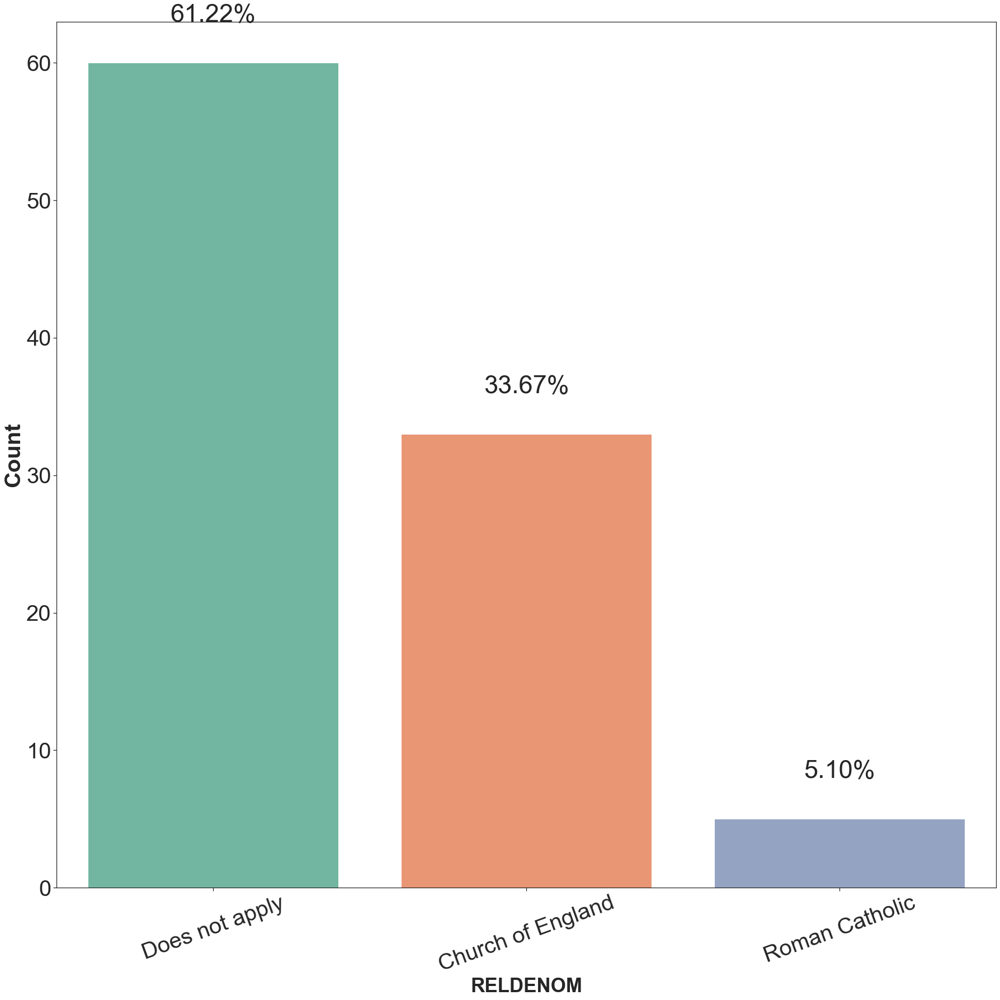

In [177]:
#changing the schools classified as None to does not apply before plotting with the function created in during cohort 1 analysis
combined_df_school_18['RELDENOM'] =  combined_df_school_18['RELDENOM'].apply(lambda x: 'Does not apply' if x=='None' else x)

#Plotting the graph with the function
countplot_percentage(combined_df_school_18, 'RELDENOM', '2018-2019 Schools with religious affiliation')

# Countplot to decribe the number of schools according to school type

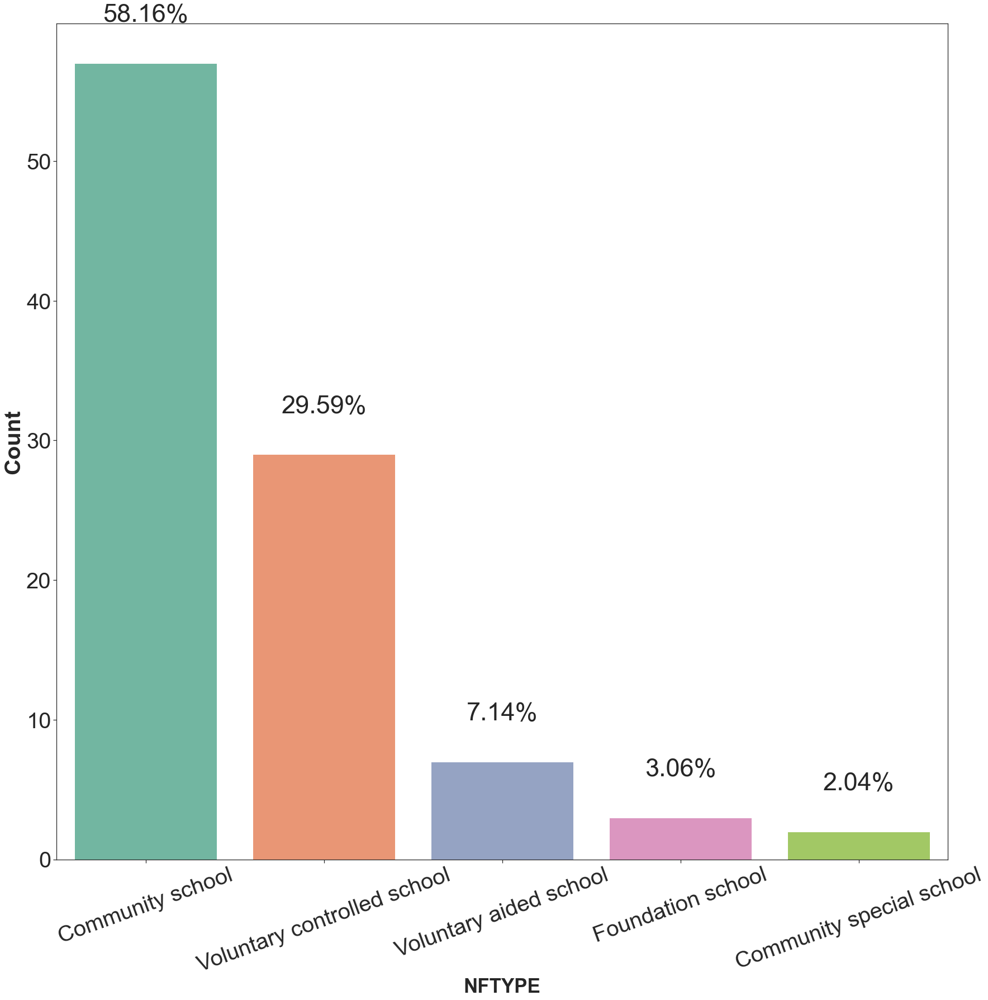

In [178]:
# #Decoding before plotting the graph for better visual interpretation
combined_df_school_18['NFTYPE'] =  combined_df_school_18['NFTYPE'].apply(lambda x: ' Sponsored academy' if x=='AC' else ('Academy converter - mainstream' if x=='ACC' else 
                                                                                                ('Community school' if x=='CY' else 
                                                                                                ('Community special school' if x=='CYS' else 
                                                                                                ('Free school - mainstream' if x=='F' else 
                                                                                                ('Foundation school'if x=='FD' else 
                                                                                                ('Voluntary aided school' if x=='VA' else 'Voluntary controlled school')))))))


#Plotting with percentage with the function
countplot_percentage(combined_df_school_18, 'NFTYPE', '2018 Schools types')

# Getting the number of the schools and number of schools with school type and religious affiliation - Cohort 3

In [179]:
#Total number of schools
N_2018 = len([i for i in combined_df_school_18['NFTYPE']])
#below codes seives out a list and cum it for each of the school type
Sponsored_academy = len([i for i in combined_df_school_18['NFTYPE'] if i == 'Sponsored academy' ])
Academy_converter=len([i for i in combined_df_school_18['NFTYPE'] if i == 'Academy converter - mainstream' ])
Community_school = len([i for i in combined_df_school_18['NFTYPE'] if i == 'Community school' ])
Community_special =len([i for i in combined_df_school_18['NFTYPE'] if i == 'Community special school' ])
Free_School =len([i for i in combined_df_school_18['NFTYPE'] if i == 'Free school - mainstream' ])
Foundation_school=len([i for i in combined_df_school_18['NFTYPE'] if i == 'Foundation school' ])
Voluntary_aided_school=len([i for i in combined_df_school_18['NFTYPE'] if i == 'Voluntary aided school' ])
Voluntary_controlled_school=len([i for i in combined_df_school_18['NFTYPE'] if i == 'Voluntary controlled school' ])


#below codes prints the number of each schools types
print('Total number of schools in cohort 3 is', N_2018)
print('Total number Sponsored academy in cohort 3 is',Sponsored_academy  )
print('Total number of Academy converter - mainstream in cohort 3 is', Academy_converter )
print('Total number of Community  school in cohort 3 is', Community_school)
print('Total number of Community special school in cohort 3 is', Community_special)
print('Total number of Free school - mainstream in cohort 3 is',Free_School )
print('Total number of Foundation school in cohort 3 is', Foundation_school)
print('Total number of Voluntary aided school in cohort 3 is',Voluntary_aided_school )
print('Total number of  Voluntary controlled school in cohort 3 is',Voluntary_controlled_school )

Total number of schools in cohort 3 is 98
Total number Sponsored academy in cohort 3 is 0
Total number of Academy converter - mainstream in cohort 3 is 0
Total number of Community  school in cohort 3 is 57
Total number of Community special school in cohort 3 is 2
Total number of Free school - mainstream in cohort 3 is 0
Total number of Foundation school in cohort 3 is 3
Total number of Voluntary aided school in cohort 3 is 7
Total number of  Voluntary controlled school in cohort 3 is 29


In [180]:
#below codes seives out a list and cum it for each of the school religiously affiliated
Roman_Catholic = len([i for i in combined_df_school_18['RELDENOM'] if i == 'Roman Catholic' ])
Church_of_England=len([i for i in combined_df_school_18['RELDENOM'] if i == 'Church of England' ])
No_religion = len([i for i in combined_df_school_18['RELDENOM'] if i == 'Does not apply' ])

#below codes prints the number of each religiously affiliated
print('Total number Roman Catholic schools in cohort 3 is',Roman_Catholic  )
print('Total number of Church of England schools in cohort 3 is', Church_of_England )
print('Total number school without religionin cohort 3 is', No_religion)

Total number Roman Catholic schools in cohort 3 is 5
Total number of Church of England schools in cohort 3 is 33
Total number school without religionin cohort 3 is 60


#  Encoding:
NFTYPE AND RELDENOM

In [181]:
#encoding for 'NFTYPE','RELDENOM'

combined_df_school_18['NFTYPE'] =  combined_df_school_18['NFTYPE'].apply(lambda x: 1 if x=='Sponsored academy' else (2 if x=='Academy converter - mainstream' else 
                                                                                                (3 if x=='Community school' else 
                                                                                                (4 if x=='Community special school' else 
                                                                                                (5 if x=='Free school - mainstream' else 
                                                                                                (6 if x=='Foundation school' else 
                                                                                                (7 if x=='Voluntary aided school' else 8)))))))

combined_df_school_18['RELDENOM'] =  combined_df_school_18['RELDENOM'].apply(lambda x: 1 if x=='Church of England' else (2 if x=='Roman Catholic' else 
                                                                                                (3 if x=='Does not apply' else 3 )))

In [182]:
combined_df_school_18.describe() #statistical description for the dataframe

,URN,FSM,TOTALINCOME,TEACHINGSTAFF,TOTALEXPENDITURE,PGRANTFUNDING,PSELFGENERATEDINCOME,PTEACHINGSTAFF,PSUPPLYTEACHERS,PEDUCATIONSUPPORTSTAFF,PPREMISES,PBACKOFFICE,PCATERING,POTHERSTAFF,PENERGY,PLEARNINGRESOURCES,PICT,PBOUGHTINPROFESSIONALSERVICES,POTHER,NFTYPE,RELDENOM,TOTPUPS,TKS1AVERAGE,PTKS1GROUP_L,PTFSM6CLA1A,PTEALGRP2,PTMOBN,PTRWM_EXP,PTEALGRP1,PTEALGRP3,PSENELE,PSENELK,IMD,HLE,WRITPROG,MATPROG,READPROG,Average Progress
count,98.000000,98.000000,98.000000,98.000000,98.000000,98.000000,98.000000,98.000000,98.000000,98.000000,98.000000,98.000000,98.000000,98.000000,98.000000,98.000000,98.000000,98.000000,98.000000,98.000000,98.000000,98.000000,98.000000,98.000000,98.000000,98.000000,98.000000,98.000000,98.000000,98.000000,98.000000,98.000000,98.000000,98.000000,98.000000,98.000000,98.000000,98.000000
mean,119583.704082,13.193878,5644.744898,2418.765306,5580.530612,96.020408,4.030612,44.448980,2.632653,19.377551,5.836735,8.193878,4.071429,3.734694,1.530612,3.612245,1.612245,2.561224,2.561224,4.877551,2.275510,210.714286,16.182653,9.387755,23.040816,3.540816,92.938776,65.877551,96.357143,0.102041,5.255102,13.775510,4.051020,4.255102,-0.467347,-0.757143,-0.425510,-0.550000
std,4925.023358,10.066437,2406.188025,719.486741,2369.349105,3.162211,3.212264,4.982697,1.595016,5.000032,1.892437,2.646368,1.845865,1.543533,0.748939,1.489708,0.869087,2.120428,0.850304,2.316526,0.939188,135.981351,2.304904,15.266453,16.144271,9.080588,7.570720,16.408613,9.116938,0.830970,15.033510,10.483694,2.438406,2.382545,2.486449,2.326805,2.503083,2.064977
min,117823.000000,1.000000,3800.000000,1759.000000,3835.000000,78.000000,0.000000,28.000000,0.000000,12.000000,0.000000,5.000000,0.000000,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,3.000000,1.000000,36.000000,1.800000,0.000000,0.000000,0.000000,63.000000,0.000000,40.000000,0.000000,0.000000,0.000000,1.000000,1.000000,-8.700000,-8.200000,-5.900000,-7.500000
25%,117867.250000,6.000000,4500.750000,2055.250000,4480.250000,95.000000,2.000000,42.000000,2.000000,16.000000,5.000000,7.000000,3.000000,3.000000,1.000000,3.000000,1.000000,2.000000,2.000000,3.000000,1.000000,101.500000,15.900000,0.000000,11.250000,0.000000,91.000000,58.250000,97.000000,0.000000,0.000000,7.000000,2.000000,2.000000,-1.850000,-2.200000,-1.900000,-1.700000
50%,117971.500000,10.000000,5022.000000,2269.500000,4968.000000,97.000000,3.000000,45.000000,2.000000,19.000000,6.000000,7.000000,4.000000,3.000000,1.500000,4.000000,1.000000,2.000000,3.000000,3.000000,3.000000,170.000000,16.450000,6.000000,19.000000,0.000000,95.000000,67.500000,100.000000,0.000000,0.000000,11.000000,4.000000,4.000000,-0.200000,-0.750000,-0.500000,-0.483333
75%,118019.500000,18.000000,5916.250000,2556.500000,5831.750000,98.000000,5.000000,48.000000,3.000000,21.000000,7.000000,9.000000,4.000000,5.000000,2.000000,4.000000,2.000000,3.000000,3.000000,8.000000,3.000000,307.500000,17.200000,11.000000,31.500000,3.000000,97.750000,75.750000,100.000000,0.000000,4.750000,19.750000,5.750000,6.000000,0.900000,0.900000,0.900000,0.683333
max,135700.000000,44.000000,21153.000000,6793.000000,20433.000000,100.000000,23.000000,56.000000,8.000000,43.000000,16.000000,21.000000,11.000000,8.000000,6.000000,10.000000,6.000000,20.000000,5.000000,8.000000,3.000000,587.000000,19.100000,100.000000,67.000000,60.000000,100.000000,96.000000,100.000000,8.000000,100.000000,50.000000,10.000000,10.000000,5.500000,5.600000,6.400000,3.733333


In [183]:
#this is got to compare with the budget and what applies in other part of england
#refer to the website of east riding yorkshire for the interpretatio of IMD as 4 and HLE as 4... this implies the average IMD and HLE of the county
Socio_econo_df_18 = combined_df_school_18.filter(['FSM','TOTALINCOME','TOTALEXPENDITURE','TOTPUPS','IMD','HLE'], axis=1)
Socio_econo_df_18.describe()

,FSM,TOTALINCOME,TOTALEXPENDITURE,TOTPUPS,IMD,HLE
count,98.000000,98.000000,98.000000,98.000000,98.000000,98.000000
mean,13.193878,5644.744898,5580.530612,210.714286,4.051020,4.255102
std,10.066437,2406.188025,2369.349105,135.981351,2.438406,2.382545
min,1.000000,3800.000000,3835.000000,36.000000,1.000000,1.000000
25%,6.000000,4500.750000,4480.250000,101.500000,2.000000,2.000000
50%,10.000000,5022.000000,4968.000000,170.000000,4.000000,4.000000
75%,18.000000,5916.250000,5831.750000,307.500000,5.750000,6.000000
max,44.000000,21153.000000,20433.000000,587.000000,10.000000,10.000000


In [184]:
#importing the researchpy library for analysis
import researchpy as rp 


Where:

N = Number of Samples

SD = Standard Deviation

SE = Standard Error

N, SD, SE for Writing Progress (WRITPROG,MATPTOG and READPROG)

In [185]:
#referene: https://www.pythonfordatascience.org/descriptive-statistics-python/
#Gets thetotal population number (N) ,Standard Deviation (SD), Standard Deviation (SD), Standard Error(SD) and confidence interval
rp.summary_cont(combined_df_school_18['WRITPROG'])

,Variable,N,Mean,SD,SE,95% Conf.,Interval
0,WRITPROG,98.0,-0.4673,2.4864,0.2512,-0.9658,0.0312


In [186]:
#referene: https://www.pythonfordatascience.org/descriptive-statistics-python/
#Gets thetotal population number (N) ,Standard Deviation (SD), Standard Deviation (SD), Standard Error(SD) and confidence interval
rp.summary_cont(combined_df_school_18['MATPROG'])

,Variable,N,Mean,SD,SE,95% Conf.,Interval
0,MATPROG,98.0,-0.7571,2.3268,0.235,-1.2236,-0.2906


In [187]:
#referene: https://www.pythonfordatascience.org/descriptive-statistics-python/
#Gets thetotal population number (N) ,Standard Deviation (SD), Standard Deviation (SD), Standard Error(SD) and confidence interval
rp.summary_cont(combined_df_school_18['READPROG'])

,Variable,N,Mean,SD,SE,95% Conf.,Interval
0,READPROG,98.0,-0.4255,2.5031,0.2528,-0.9273,0.0763


In [188]:
#referene: https://www.pythonfordatascience.org/descriptive-statistics-python/
#Gets thetotal population number (N) ,Standard Deviation (SD), Standard Deviation (SD), Standard Error(SD) and confidence interval
rp.summary_cont(combined_df_school_18['Average Progress'])

,Variable,N,Mean,SD,SE,95% Conf.,Interval
0,Average Progress,98.0,-0.55,2.065,0.2086,-0.964,-0.136


# Boxplot to analyze the reading,writing, maths and average attainment

<AxesSubplot:>

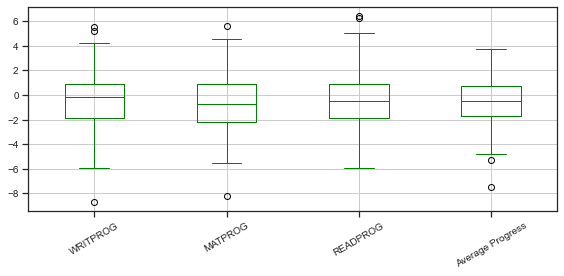

In [189]:
#Reference: https://stackoverflow.com/questions/67528790/plot-seaborn-boxplot-for-multiple-columns-and-compare-with-a-standard-scale
plt.rcParams['figure.figsize'] = (8,4)
combined_df_school_18.boxplot(column=['WRITPROG', 'MATPROG', 'READPROG', 'Average Progress'], grid='true', color='GREEN',fontsize=10, rot=30)

# Density distribution curve for the average progress _ 2018-2019

<AxesSubplot:xlabel='Average Progress', ylabel='Density'>

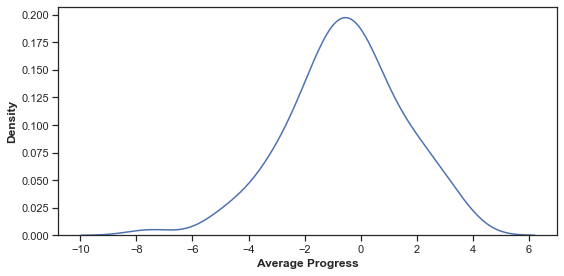

In [190]:
#Density distribution curve for the average progress _ 2018-2019
sns.kdeplot(combined_df_school_18['Average Progress'])


([<matplotlib.axis.XTick at 0x20f29b68>,
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

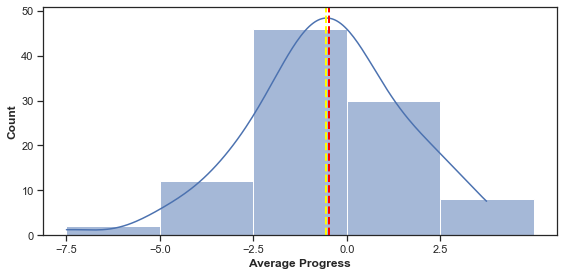

In [191]:
#getting the maximum and minimum values for the average progress to insert 
#for a better histogram that has bins and width that could be understood
mini= combined_df_school_18['Average Progress'].min() #i.e -7.5
maxi = combined_df_school_18['Average Progress'].max() #i.e.3.73
# Plot histogram
sns.histplot(data = combined_df_school_18, x = "Average Progress", kde = True,bins = np.arange(mini,maxi+1.27,2.5))
#This code 'np.arange(mini-0.47,maxi+1.03,2.5)' above is to range the bins and to ensure the bin
#starts where the x -labeling starts as 'coded' with plt.xticks(np.arange(-10,7.5,2.5)) below

plt.axvline(combined_df_school_18['Average Progress'].mean(), color='yellow', linewidth=2, linestyle="--")
plt.axvline(combined_df_school_18['Average Progress'].median(), color='red', linewidth=2, linestyle="--")
plt.xticks(np.arange(-7.5,5,2.5))

# Measure of skewness and Kurtosis - 2018 Average Progress distribution

SKEWNESS

In [192]:
#prints the skewness of the distribution
print(skew(combined_df_school_18['Average Progress'], axis=0, bias=True))

-0.372240178060496


KURTOSIS

In [193]:
#prints the kurtosis or peakedness of the distribution
print(kurtosis(combined_df_school_18['Average Progress'], axis=0, bias=True))

0.48466355812115935


# INFRENTIAL STATISTICS FOR COHORT1 (2018 -2019)

Grouping the columns based on column type:

1. Continuous Variable (Independent): FSM	TOTALINCOME                      , TEACHINGSTAFF                 , TOTALEXPENDITURE	
PGRANTFUNDING	,PSELFGENERATEDINCOME, PTEACHINGSTAFF, PSUPPLYTEACHERS,PEDUCATIONSUPPORTSTAFF,	PPREMISES,	PBACKOFFICE,	PCATERING,	POTHERSTAFF,	PENERGY,	PLEARNINGRESOURCES,	PICT,	PBOUGHTINPROFESSIONALSERVICES,	POTHER, TOTPUPS,	TKS1AVERAGE,	PTKS1GROUP_L,	PTFSM6CLA1A,	PTEALGRP2,	PTMOBN,	PTRWM_EXP,	PTEALGRP1,	PTEALGRP3,	PSENELE,	PSENELK



2. Categorical Variable (Independent): 
NFTYPE	, RELDENOM, IMD, HLE


3. Continuous Variable (Dependent): WRITPROG	MATPROG	READPROG	Average Progress

# Inferential Stats... Continuos variables (independent and dependent) - Correlation Test

In [194]:
#Continuos variable with the continuos dependent variable
# continuos_df = combined_df_school_17.filter(['FSM','TOTALINCOME','TOTALEXPENDITURE','TOTPUPS','IMD','HLE'], axis=1)'
continuos_df_18= combined_df_school_18.drop((['URN', 'NFTYPE' , 'RELDENOM', 'IMD', 'HLE','WRITPROG', 'MATPROG', 'READPROG','PTRWM_EXP']), axis=1)

In [195]:
continuos_df_18.head(2)

,FSM,TOTALINCOME,TEACHINGSTAFF,TOTALEXPENDITURE,PGRANTFUNDING,PSELFGENERATEDINCOME,PTEACHINGSTAFF,PSUPPLYTEACHERS,PEDUCATIONSUPPORTSTAFF,PPREMISES,PBACKOFFICE,PCATERING,POTHERSTAFF,PENERGY,PLEARNINGRESOURCES,PICT,PBOUGHTINPROFESSIONALSERVICES,POTHER,TOTPUPS,TKS1AVERAGE,PTKS1GROUP_L,PTFSM6CLA1A,PTEALGRP2,PTMOBN,PTEALGRP1,PTEALGRP3,PSENELE,PSENELK,Average Progress
0,24.0,5207.0,2013.0,4995.0,98.0,2.0,40.0,3.0,22.0,0.0,20.0,0.0,5.0,0.0,3.0,1.0,1.0,3.0,409.0,15.8,7.0,52.0,3.0,98.0,97.0,0.0,3.0,21.0,-0.266667
1,7.0,4439.0,2106.0,4418.0,92.0,8.0,48.0,1.0,16.0,6.0,9.0,4.0,4.0,2.0,2.0,2.0,2.0,4.0,215.0,17.0,3.0,13.0,0.0,100.0,100.0,0.0,0.0,13.0,-0.833333


<AxesSubplot:>

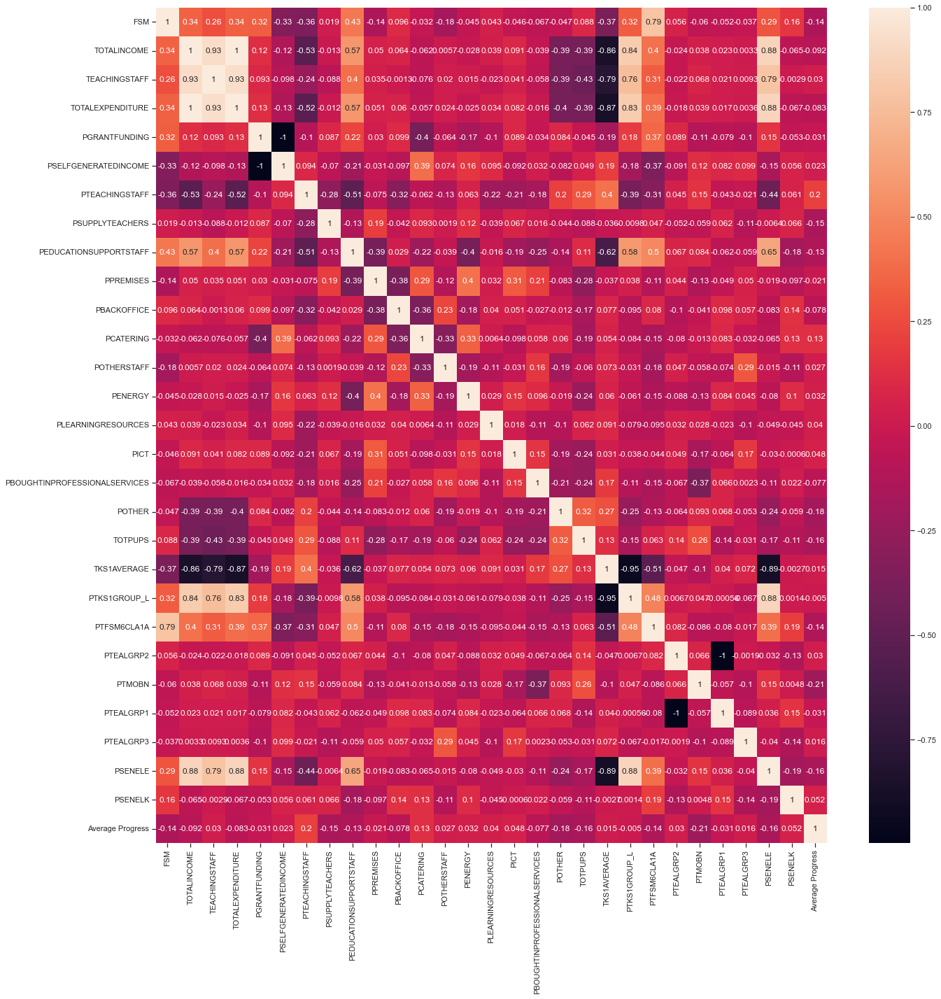

In [196]:
import seaborn as sns #imports seaborn library
corr_18=continuos_df_18.corr() #gets the 'pairwise' correlation of the continous dataframe
features_18=corr_18.index
plt.figure(figsize=(20,20))  #setting the figure size
sns.heatmap(continuos_df_18[features_18].corr(),annot=True) #plots the correlation heat map

In [197]:
#Getting a Dataframe that has all the scores of the variables with the Average progress
corr_18.drop(['FSM', 'TOTALINCOME', 'TEACHINGSTAFF', 'TOTALEXPENDITURE',
       'PGRANTFUNDING', 'PSELFGENERATEDINCOME', 'PTEACHINGSTAFF',
       'PSUPPLYTEACHERS', 'PEDUCATIONSUPPORTSTAFF', 'PPREMISES', 'PBACKOFFICE',
       'PCATERING', 'POTHERSTAFF', 'PENERGY', 'PLEARNINGRESOURCES', 'PICT',
       'PBOUGHTINPROFESSIONALSERVICES', 'POTHER', 'TOTPUPS', 'TKS1AVERAGE',
       'PTKS1GROUP_L', 'PTFSM6CLA1A', 'PTEALGRP2', 'PTMOBN', 
       'PTEALGRP1', 'PTEALGRP3', 'PSENELE', 'PSENELK'])

,FSM,TOTALINCOME,TEACHINGSTAFF,TOTALEXPENDITURE,PGRANTFUNDING,PSELFGENERATEDINCOME,PTEACHINGSTAFF,PSUPPLYTEACHERS,PEDUCATIONSUPPORTSTAFF,PPREMISES,PBACKOFFICE,PCATERING,POTHERSTAFF,PENERGY,PLEARNINGRESOURCES,PICT,PBOUGHTINPROFESSIONALSERVICES,POTHER,TOTPUPS,TKS1AVERAGE,PTKS1GROUP_L,PTFSM6CLA1A,PTEALGRP2,PTMOBN,PTEALGRP1,PTEALGRP3,PSENELE,PSENELK,Average Progress
Average Progress,-0.144015,-0.092244,0.030253,-0.083136,-0.031207,0.022872,0.200258,-0.148572,-0.125825,-0.020929,-0.077945,0.128066,0.026954,0.032441,0.03988,0.048254,-0.077187,-0.181914,-0.158516,0.015108,-0.005047,-0.138178,0.029845,-0.206955,-0.031168,0.015821,-0.155566,0.051589,1.0


In [198]:
#Reference: https://machinelearningmastery.com/statistical-hypothesis-tests-in-python-cheat-sheet/
# Example of the Pearson's Correlation test
from scipy.stats import pearsonr

for column in continuos_df_18.columns:
    data1 = continuos_df_18[column] #getting the each of the independent variable on after the other with the function
    data2 = continuos_df_18['Average Progress']  #getting the target variable - a series
    stat, p = pearsonr(data1, data2)
    print('stat=%.2f, p=%.2f' % (stat, p))  # prints to 2 decimal place
    if p > 0.05: #since the significant value α = 0.05
        print(column, 'is Probably independent') #print if variable is Probably independent to Average Progress
    else:
        print(column,'is Probably dependent') #print if variable is Probably dependent to Average Progress

stat=-0.14, p=0.16
FSM is Probably independent
stat=-0.09, p=0.37
TOTALINCOME is Probably independent
stat=0.03, p=0.77
TEACHINGSTAFF is Probably independent
stat=-0.08, p=0.42
TOTALEXPENDITURE is Probably independent
stat=-0.03, p=0.76
PGRANTFUNDING is Probably independent
stat=0.02, p=0.82
PSELFGENERATEDINCOME is Probably independent
stat=0.20, p=0.05
PTEACHINGSTAFF is Probably dependent
stat=-0.15, p=0.14
PSUPPLYTEACHERS is Probably independent
stat=-0.13, p=0.22
PEDUCATIONSUPPORTSTAFF is Probably independent
stat=-0.02, p=0.84
PPREMISES is Probably independent
stat=-0.08, p=0.45
PBACKOFFICE is Probably independent
stat=0.13, p=0.21
PCATERING is Probably independent
stat=0.03, p=0.79
POTHERSTAFF is Probably independent
stat=0.03, p=0.75
PENERGY is Probably independent
stat=0.04, p=0.70
PLEARNINGRESOURCES is Probably independent
stat=0.05, p=0.64
PICT is Probably independent
stat=-0.08, p=0.45
PBOUGHTINPROFESSIONALSERVICES is Probably independent
stat=-0.18, p=0.07
POTHER is Probably

# Creating a correlation matrix for the top (10) features

The dependent variables are described by the ones with lowest p -values. These are (excluding progress scores of reading , maths and writing as these are expected.

These variables are:

In [199]:
#Ranking the atrributes to rank the to 'best' attributes or variables 
from sklearn.feature_selection import f_regression, SelectKBest

In [200]:
X_10_18=continuos_df_18.iloc[:,:-1] #takes the dataframe less the target variable as the independent variable
y_10_18=continuos_df_18['Average Progress']  # assigns a variable to the target variable


rank_top_ten_18=SelectKBest(score_func=f_regression,k=28)  # using select kbest and ranking
top_ten_18=rank_top_ten_18.fit(X_10_18,y_10_18) #fitting the values

In [201]:
dfscores_18=pd.DataFrame(top_ten_18.scores_,columns=["Score of Attribute"]) #getting dataframe for the top features
dfcolumns_18=pd.DataFrame(X_10_18.columns) #getting dataframe for the  columns

In [202]:
rank_18=pd.concat([dfcolumns_18,dfscores_18],axis=1) # concatenating the two dataframes to form one with attributes and scores
rank_18.columns=['Attributes','Score'] #assigning column header

In [203]:
#printing out the sorted variables according to their dependence on the dependent variable
#NOTE: matprog, readprog and writprog will not be considered as they are expected to to be highly correlated to the average progress
rank_18.nlargest(100,'Score')

,Attributes,Score
23,PTMOBN,4.295682
6,PTEACHINGSTAFF,4.010741
17,POTHER,3.285643
18,TOTPUPS,2.474394
26,PSENELE,2.380908
7,PSUPPLYTEACHERS,2.166897
0,FSM,2.033253
21,PTFSM6CLA1A,1.868633
11,PCATERING,1.600735
8,PEDUCATIONSUPPORTSTAFF,1.544325


# Hence, top continous correlated variables with there scores are

 TOTALEXPENDITURE, TOTALINCOME, TEACHINGSTAFF, PTEACHINGSTAFF, PTKS1GROUP_L, FSM, PTMOBN, POTHERSTAFF,, PBACKOFFICE

In [204]:
#dropping other variables that are not part of the top features
first_ten_df_18 = continuos_df_18.drop(continuos_df_18.columns.difference(['PTRWM_EXP','PTMOBN','PTEACHINGSTA','POTHER','TOTPUPS','PSENELE','PSUPPLYTEACHERS','FSM','PTFSM6CLA1A','PCATERING','Average Progress']), axis=1)

<AxesSubplot:>

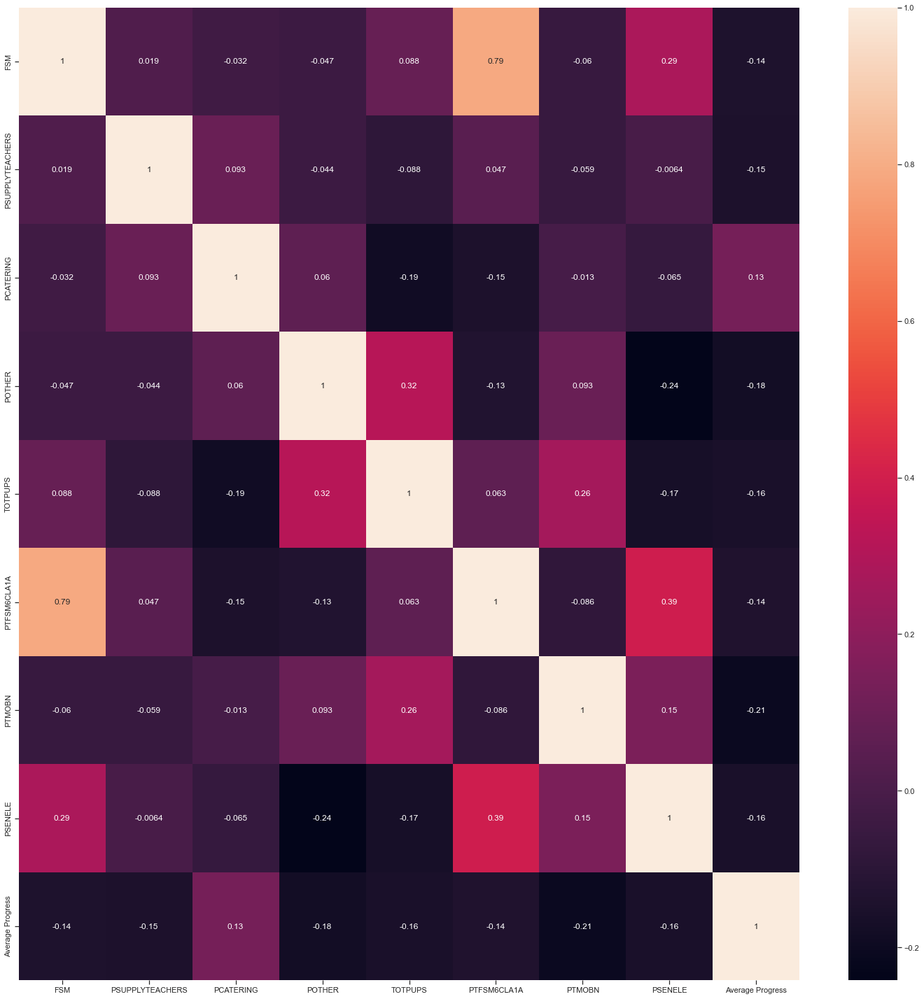

In [205]:
#plots a heatmap of correlated features
corr=first_ten_df_18.corr()
features=corr.index
plt.figure(figsize=(20,20))
sns.heatmap(first_ten_df_18[features].corr(),annot=True)

# Inferential Stats... Categorical variables (independent) and Continuos( dependent)

In [206]:
#checking for the categorical variables first
#seives out the categorical variables

Categorical_df_18= combined_df_school_18.drop(combined_df_school_18.columns.difference([ 'NFTYPE' , 'RELDENOM', 'IMD', 'HLE','Average Progress']), axis=1)
Categorical_df_18

,NFTYPE,RELDENOM,IMD,HLE,Average Progress
0,3,3,8.0,9.0,-0.266667
1,3,3,5.0,4.0,-0.833333
2,3,3,6.0,6.0,-5.300000
3,3,3,9.0,7.0,-1.400000
4,3,3,5.0,3.0,-0.566667
5,3,3,5.0,2.0,3.366667
6,3,3,4.0,9.0,-1.366667
7,3,3,2.0,3.0,-1.933333
8,3,3,5.0,3.0,-1.466667
9,3,3,6.0,8.0,-0.300000


In [207]:
#Using Anova Hypothesis testing
#Reference: https://www.pythonfordatascience.org/factorial-anova-python/
#SUMARY OF THE CATEGORICAL INDEPENDENT VARIABLE

rp.summary_cat(Categorical_df_18[['NFTYPE' , 'RELDENOM', 'IMD', 'HLE']])

,Variable,Outcome,Count,Percent
0,NFTYPE,3.0,57,58.16
1,,8.0,29,29.59
2,,7.0,7,7.14
3,,6.0,3,3.06
4,,4.0,2,2.04
5,RELDENOM,3.0,60,61.22
6,,1.0,33,33.67
7,,2.0,5,5.10
8,IMD,2.0,24,24.49
9,,5.0,18,18.37


In [208]:
#Summary of the dependent
rp.summary_cont(Categorical_df_18["Average Progress"])

,Variable,N,Mean,SD,SE,95% Conf.,Interval
0,Average Progress,98.0,-0.55,2.065,0.2086,-0.964,-0.136


In [209]:
X = Categorical_df_18.drop(labels=["Average Progress"],axis=1) # assigning variables to the features or independent variables
y = Categorical_df_18["Average Progress"] #assigning a variable to target variable

# USING ANOVA for the Categorical Variables

In [210]:
# Importing the library for one-way anova
from scipy.stats import f_oneway
 
schltype = Categorical_df_18['NFTYPE'] #variable for school type
religion_sch= Categorical_df_18['RELDENOM'] #variable for religion
IMD = Categorical_df_18['IMD'] #variable for IMD
HLE =Categorical_df_18['HLE']# Variable for HLE
Average_prog = Categorical_df_18['Average Progress'] # Variable for Average Progress

 
# cheching for the one-way ANOVA
f_oneway(schltype, Average_prog)


F_onewayResult(statistic=299.77021414168274, pvalue=3.230568252384559e-41)

Checking for the one-way ANOVA for RELIGIOUS AFFILIATION

In [211]:
f_oneway(religion_sch, Average_prog)

F_onewayResult(statistic=152.03124244157092, pvalue=3.596416113021388e-26)

Checking for the one-way ANOVA for IMD

In [212]:
f_oneway(IMD, Average_prog)

F_onewayResult(statistic=203.1938908852138, pvalue=5.181485772758166e-32)

Checking for the one-way ANOVA for HLE

In [213]:
f_oneway(HLE, Average_prog)

F_onewayResult(statistic=227.62320951946216, pvalue=1.543672793294305e-34)

# MERGING THE DATAFRAMES FOR THE THREE COHORTS FOR ANALYSIS

In [214]:
#veiwing the dataframe before merging
combined_df_school_16.head(3)

,URN,FSM,TOTALINCOME,TEACHINGSTAFF,TOTALEXPENDITURE,PGRANTFUNDING,PSELFGENERATEDINCOME,PTEACHINGSTAFF,PSUPPLYTEACHERS,PEDUCATIONSUPPORTSTAFF,PPREMISES,PBACKOFFICE,PCATERING,POTHERSTAFF,PENERGY,PLEARNINGRESOURCES,PICT,PBOUGHTINPROFESSIONALSERVICES,POTHER,NFTYPE,RELDENOM,TOTPUPS,TKS1AVERAGE,PTKS1GROUP_L,PTFSM6CLA1A,PTEALGRP2,PTMOBN,PTRWM_EXP,PTEALGRP1,PTEALGRP3,PSENELE,PSENELK,IMD,HLE,WRITPROG,MATPROG,READPROG,Average Progress
0,134741,18.2,4674.0,2019.0,4432.0,97.0,3.0,46.0,1.0,21.0,7.0,6.0,3.0,5.0,1.0,3.0,2.0,3.0,4.0,3,3,216.0,15.8,13.0,26.0,0.0,91.0,52.0,100.0,0.0,9.0,26.0,7.0,7.0,-2.9,-2.5,-0.4,-1.933333
2,118122,4.1,4686.0,2061.0,4795.0,93.0,7.0,43.0,3.0,18.0,4.0,10.0,4.0,5.0,1.0,5.0,2.0,4.0,1.0,6,1,114.0,17.1,6.0,12.0,0.0,94.0,59.0,100.0,0.0,0.0,12.0,1.0,2.0,2.8,-1.9,-2.0,-0.366667
3,118148,29.5,17525.0,7227.0,17980.0,98.0,2.0,40.0,3.0,34.0,3.0,5.0,2.0,3.0,1.0,4.0,1.0,4.0,1.0,4,3,89.0,7.3,83.0,33.0,0.0,67.0,0.0,100.0,0.0,0.0,13.0,4.0,4.0,-8.6,-9.6,-10.4,-9.533333


In [215]:
#veiwing the dataframe before merging
combined_df_school_17.head(3)

,URN,FSM,TOTALINCOME,TEACHINGSTAFF,TOTALEXPENDITURE,PGRANTFUNDING,PSELFGENERATEDINCOME,PTEACHINGSTAFF,PSUPPLYTEACHERS,PEDUCATIONSUPPORTSTAFF,PPREMISES,PBACKOFFICE,PCATERING,POTHERSTAFF,PENERGY,PLEARNINGRESOURCES,PICT,PBOUGHTINPROFESSIONALSERVICES,POTHER,NFTYPE,RELDENOM,TOTPUPS,TKS1AVERAGE,PTKS1GROUP_L,PTFSM6CLA1A,PTEALGRP2,PTMOBN,PSENELSE,PTRWM_EXP,PTEALGRP1,PTEALGRP3,PSENELE,PSENELK,PSENELSAP,IMD,HLE,WRITPROG,MATPROG,READPROG,Average Progress
0,133480,23.2,4949.0,2039.0,4977.0,99.0,1.0,41.0,2.0,21.0,0.0,22.0,0.0,5.0,0.0,4.0,1.0,1.0,3.0,3,3,409.0,16.9,6.0,49.0,0.0,96.0,0.0,56.0,100.0,0.0,0.0,31.0,0.0,8.0,9.0,-0.8,-3.4,-4.4,-2.866667
1,133481,7.1,4370.0,2133.0,4499.0,92.0,8.0,47.0,1.0,16.0,7.0,8.0,4.0,5.0,1.0,4.0,2.0,2.0,4.0,3,3,212.0,17.4,0.0,3.0,0.0,100.0,0.0,87.0,100.0,0.0,0.0,6.0,0.0,5.0,4.0,0.4,2.8,2.8,2.000000
2,133519,38.5,6836.0,2621.0,6988.0,99.0,1.0,38.0,9.0,18.0,6.0,10.0,4.0,3.0,2.0,2.0,1.0,5.0,4.0,3,3,65.0,15.4,0.0,50.0,0.0,80.0,0.0,20.0,100.0,0.0,0.0,80.0,0.0,6.0,6.0,-5.2,-4.5,-3.4,-4.366667


In [216]:
#veiwing the dataframe before merging
combined_df_school_18.head(3)

,URN,FSM,TOTALINCOME,TEACHINGSTAFF,TOTALEXPENDITURE,PGRANTFUNDING,PSELFGENERATEDINCOME,PTEACHINGSTAFF,PSUPPLYTEACHERS,PEDUCATIONSUPPORTSTAFF,PPREMISES,PBACKOFFICE,PCATERING,POTHERSTAFF,PENERGY,PLEARNINGRESOURCES,PICT,PBOUGHTINPROFESSIONALSERVICES,POTHER,NFTYPE,RELDENOM,TOTPUPS,TKS1AVERAGE,PTKS1GROUP_L,PTFSM6CLA1A,PTEALGRP2,PTMOBN,PTRWM_EXP,PTEALGRP1,PTEALGRP3,PSENELE,PSENELK,IMD,HLE,WRITPROG,MATPROG,READPROG,Average Progress
0,133480,24.0,5207.0,2013.0,4995.0,98.0,2.0,40.0,3.0,22.0,0.0,20.0,0.0,5.0,0.0,3.0,1.0,1.0,3.0,3,3,409.0,15.8,7.0,52.0,3.0,98.0,60.0,97.0,0.0,3.0,21.0,8.0,9.0,0.5,-0.1,-1.2,-0.266667
1,133481,7.0,4439.0,2106.0,4418.0,92.0,8.0,48.0,1.0,16.0,6.0,9.0,4.0,4.0,2.0,2.0,2.0,2.0,4.0,3,3,215.0,17.0,3.0,13.0,0.0,100.0,73.0,100.0,0.0,0.0,13.0,5.0,4.0,-2.2,-0.5,0.2,-0.833333
2,133519,39.0,7465.0,2879.0,7437.0,99.0,1.0,39.0,4.0,20.0,7.0,10.0,5.0,3.0,2.0,4.0,1.0,3.0,3.0,3,3,64.0,14.9,14.0,43.0,0.0,100.0,43.0,100.0,0.0,29.0,29.0,6.0,6.0,-4.5,-5.5,-5.9,-5.300000


# Creating a column for year in the three dataframes before merging

In [217]:
#Creates  a column for year in the three dataframes before merging bases on the cohort year
combined_df_school_16['Year']= 2016 #creates column for '2016' for 2016 cohort 
combined_df_school_17['Year']= 2017 #creates column for '2017' for 2017 cohort
combined_df_school_18['Year']= 2018 #creates column for '2018' for 2018 cohort

In [218]:
#checking if the year column has been updated on the last column
combined_df_school_16.head(2)

,URN,FSM,TOTALINCOME,TEACHINGSTAFF,TOTALEXPENDITURE,PGRANTFUNDING,PSELFGENERATEDINCOME,PTEACHINGSTAFF,PSUPPLYTEACHERS,PEDUCATIONSUPPORTSTAFF,PPREMISES,PBACKOFFICE,PCATERING,POTHERSTAFF,PENERGY,PLEARNINGRESOURCES,PICT,PBOUGHTINPROFESSIONALSERVICES,POTHER,NFTYPE,RELDENOM,TOTPUPS,TKS1AVERAGE,PTKS1GROUP_L,PTFSM6CLA1A,PTEALGRP2,PTMOBN,PTRWM_EXP,PTEALGRP1,PTEALGRP3,PSENELE,PSENELK,IMD,HLE,WRITPROG,MATPROG,READPROG,Average Progress,Year
0,134741,18.2,4674.0,2019.0,4432.0,97.0,3.0,46.0,1.0,21.0,7.0,6.0,3.0,5.0,1.0,3.0,2.0,3.0,4.0,3,3,216.0,15.8,13.0,26.0,0.0,91.0,52.0,100.0,0.0,9.0,26.0,7.0,7.0,-2.9,-2.5,-0.4,-1.933333,2016
2,118122,4.1,4686.0,2061.0,4795.0,93.0,7.0,43.0,3.0,18.0,4.0,10.0,4.0,5.0,1.0,5.0,2.0,4.0,1.0,6,1,114.0,17.1,6.0,12.0,0.0,94.0,59.0,100.0,0.0,0.0,12.0,1.0,2.0,2.8,-1.9,-2.0,-0.366667,2016


In [219]:
#checking if the year column has been updated on the last column
combined_df_school_17.head(2)

,URN,FSM,TOTALINCOME,TEACHINGSTAFF,TOTALEXPENDITURE,PGRANTFUNDING,PSELFGENERATEDINCOME,PTEACHINGSTAFF,PSUPPLYTEACHERS,PEDUCATIONSUPPORTSTAFF,PPREMISES,PBACKOFFICE,PCATERING,POTHERSTAFF,PENERGY,PLEARNINGRESOURCES,PICT,PBOUGHTINPROFESSIONALSERVICES,POTHER,NFTYPE,RELDENOM,TOTPUPS,TKS1AVERAGE,PTKS1GROUP_L,PTFSM6CLA1A,PTEALGRP2,PTMOBN,PSENELSE,PTRWM_EXP,PTEALGRP1,PTEALGRP3,PSENELE,PSENELK,PSENELSAP,IMD,HLE,WRITPROG,MATPROG,READPROG,Average Progress,Year
0,133480,23.2,4949.0,2039.0,4977.0,99.0,1.0,41.0,2.0,21.0,0.0,22.0,0.0,5.0,0.0,4.0,1.0,1.0,3.0,3,3,409.0,16.9,6.0,49.0,0.0,96.0,0.0,56.0,100.0,0.0,0.0,31.0,0.0,8.0,9.0,-0.8,-3.4,-4.4,-2.866667,2017
1,133481,7.1,4370.0,2133.0,4499.0,92.0,8.0,47.0,1.0,16.0,7.0,8.0,4.0,5.0,1.0,4.0,2.0,2.0,4.0,3,3,212.0,17.4,0.0,3.0,0.0,100.0,0.0,87.0,100.0,0.0,0.0,6.0,0.0,5.0,4.0,0.4,2.8,2.8,2.000000,2017


In [220]:
#checking if the year column has been updated on the last column
combined_df_school_18.head(2)

,URN,FSM,TOTALINCOME,TEACHINGSTAFF,TOTALEXPENDITURE,PGRANTFUNDING,PSELFGENERATEDINCOME,PTEACHINGSTAFF,PSUPPLYTEACHERS,PEDUCATIONSUPPORTSTAFF,PPREMISES,PBACKOFFICE,PCATERING,POTHERSTAFF,PENERGY,PLEARNINGRESOURCES,PICT,PBOUGHTINPROFESSIONALSERVICES,POTHER,NFTYPE,RELDENOM,TOTPUPS,TKS1AVERAGE,PTKS1GROUP_L,PTFSM6CLA1A,PTEALGRP2,PTMOBN,PTRWM_EXP,PTEALGRP1,PTEALGRP3,PSENELE,PSENELK,IMD,HLE,WRITPROG,MATPROG,READPROG,Average Progress,Year
0,133480,24.0,5207.0,2013.0,4995.0,98.0,2.0,40.0,3.0,22.0,0.0,20.0,0.0,5.0,0.0,3.0,1.0,1.0,3.0,3,3,409.0,15.8,7.0,52.0,3.0,98.0,60.0,97.0,0.0,3.0,21.0,8.0,9.0,0.5,-0.1,-1.2,-0.266667,2018
1,133481,7.0,4439.0,2106.0,4418.0,92.0,8.0,48.0,1.0,16.0,6.0,9.0,4.0,4.0,2.0,2.0,2.0,2.0,4.0,3,3,215.0,17.0,3.0,13.0,0.0,100.0,73.0,100.0,0.0,0.0,13.0,5.0,4.0,-2.2,-0.5,0.2,-0.833333,2018


In [221]:
len(combined_df_school_16.columns)#gets the number of columns for 2016 cohort

39

In [222]:
len(combined_df_school_17.columns)#gets the number of columns for 2017 cohort

41

In [223]:
len(combined_df_school_18.columns)#gets the number of columns for 2018 cohort

39

# Getting the columns common to all the cohorts

To merge the dataframes and to analyze the data together; there is a need to concatenete or merge identical columns together for better analysis. Hence the functions below

In [224]:
#making the dataframes have exactly the same number and types of columns
Allcohorts_columns = [] #initializing the a list to contain the columns that are identical
for i in combined_df_school_16.columns: #gets the columns in 2016
    if i in combined_df_school_17.columns: #compares 2017 with 2016
        if i in combined_df_school_18.columns: #compares 2018 with 2016
            Allcohorts_columns.append(i)  #appends the result of identical columns to the empty list
print(Allcohorts_columns) #prints the list of identical columns
            


['URN', 'FSM', 'TOTALINCOME', 'TEACHINGSTAFF', 'TOTALEXPENDITURE', 'PGRANTFUNDING', 'PSELFGENERATEDINCOME', 'PTEACHINGSTAFF', 'PSUPPLYTEACHERS', 'PEDUCATIONSUPPORTSTAFF', 'PPREMISES', 'PBACKOFFICE', 'PCATERING', 'POTHERSTAFF', 'PENERGY', 'PLEARNINGRESOURCES', 'PICT', 'PBOUGHTINPROFESSIONALSERVICES', 'POTHER', 'NFTYPE', 'RELDENOM', 'TOTPUPS', 'TKS1AVERAGE', 'PTKS1GROUP_L', 'PTFSM6CLA1A', 'PTEALGRP2', 'PTMOBN', 'PTRWM_EXP', 'PTEALGRP1', 'PTEALGRP3', 'PSENELE', 'PSENELK', 'IMD', 'HLE', 'WRITPROG', 'MATPROG', 'READPROG', 'Average Progress', 'Year']


In [225]:
len(Allcohorts_columns) #checking the length of the columns

39

# Alternatively getting the columns not seen in the three cohorts

In [226]:
not_in_all = [] #initializes an empty list to contain 'different' columns i.e. not seen in all
for i in combined_df_school_17.columns: #checks the columns in 2017
    if i not in combined_df_school_16.columns: #compares 2017 with 2016
        if i not in combined_df_school_18.columns: #compares 2017 with 2018
            not_in_all.append(i) #appends the 'different' columns i.e. not seen in all
else: print (not_in_all)  #prints the 'different' columns i.e. not seen in all


['PSENELSE', 'PSENELSAP']


In [227]:
# Retains the columns listed common to all the three columns
combined_df_school_16= combined_df_school_16.drop(combined_df_school_16.columns.difference(Allcohorts_columns), axis=1) #Retains the columns listed common to all the three columns in 2016 dataframe
combined_df_school_17= combined_df_school_17.drop(combined_df_school_17.columns.difference(Allcohorts_columns), axis=1) #Retains the columns listed common to all the three columns in 2017
combined_df_school_18= combined_df_school_18.drop(combined_df_school_18.columns.difference(Allcohorts_columns), axis=1)# Retains the columns listed common to all the three columns in 2018

# Stacking the dataframes for years 2016,2017 and  2018

In [228]:
#Stacking th dataframes

Allcohorts_dataframe= combined_df_school_16.append([combined_df_school_17, combined_df_school_18], ignore_index=True)

In [229]:
#Checking the stacked dataframe
Allcohorts_dataframe

,URN,FSM,TOTALINCOME,TEACHINGSTAFF,TOTALEXPENDITURE,PGRANTFUNDING,PSELFGENERATEDINCOME,PTEACHINGSTAFF,PSUPPLYTEACHERS,PEDUCATIONSUPPORTSTAFF,PPREMISES,PBACKOFFICE,PCATERING,POTHERSTAFF,PENERGY,PLEARNINGRESOURCES,PICT,PBOUGHTINPROFESSIONALSERVICES,POTHER,NFTYPE,RELDENOM,TOTPUPS,TKS1AVERAGE,PTKS1GROUP_L,PTFSM6CLA1A,PTEALGRP2,PTMOBN,PTRWM_EXP,PTEALGRP1,PTEALGRP3,PSENELE,PSENELK,IMD,HLE,WRITPROG,MATPROG,READPROG,Average Progress,Year
0,134741,18.2,4674.0,2019.0,4432.0,97.0,3.0,46.0,1.0,21.0,7.0,6.0,3.0,5.0,1.0,3.0,2.0,3.0,4.0,3,3,216.0,15.8,13.0,26.0,0.0,91.0,52.0,100.0,0.0,9.0,26.0,7.0,7.0,-2.9,-2.5,-0.4,-1.933333,2016
1,118122,4.1,4686.0,2061.0,4795.0,93.0,7.0,43.0,3.0,18.0,4.0,10.0,4.0,5.0,1.0,5.0,2.0,4.0,1.0,6,1,114.0,17.1,6.0,12.0,0.0,94.0,59.0,100.0,0.0,0.0,12.0,1.0,2.0,2.8,-1.9,-2.0,-0.366667,2016
2,118148,29.5,17525.0,7227.0,17980.0,98.0,2.0,40.0,3.0,34.0,3.0,5.0,2.0,3.0,1.0,4.0,1.0,4.0,1.0,4,3,89.0,7.3,83.0,33.0,0.0,67.0,0.0,100.0,0.0,0.0,13.0,4.0,4.0,-8.6,-9.6,-10.4,-9.533333,2016
3,118002,5.5,4608.0,2152.0,4536.0,97.0,3.0,46.0,9.0,19.0,5.0,6.0,5.0,2.0,1.0,1.0,1.0,3.0,2.0,8,1,156.0,17.5,0.0,8.0,0.0,83.0,79.0,100.0,0.0,0.0,17.0,5.0,4.0,-0.2,0.3,-1.6,-0.500000,2016
4,118003,2.8,4006.0,2021.0,3816.0,91.0,9.0,53.0,4.0,12.0,8.0,7.0,3.0,2.0,2.0,3.0,1.0,3.0,3.0,8,1,311.0,15.9,4.0,6.0,0.0,100.0,51.0,100.0,0.0,0.0,12.0,2.0,2.0,2.1,-2.9,-1.9,-0.900000,2016
5,118144,34.2,25433.0,7228.0,24714.0,98.0,2.0,29.0,0.0,30.0,4.0,6.0,3.0,21.0,1.0,2.0,1.0,1.0,1.0,4,3,109.0,2.1,100.0,33.0,0.0,89.0,0.0,100.0,0.0,0.0,13.0,2.0,2.0,-3.8,-4.3,-3.8,-3.966667,2016
6,118036,18.4,5397.0,2392.0,5086.0,96.0,4.0,47.0,2.0,22.0,6.0,7.0,3.0,5.0,1.0,2.0,1.0,2.0,1.0,7,2,211.0,15.9,3.0,19.0,10.0,100.0,71.0,90.0,0.0,0.0,23.0,10.0,10.0,-0.9,1.0,0.1,0.066667,2016
7,118044,3.2,5615.0,2793.0,5492.0,97.0,3.0,46.0,1.0,19.0,5.0,10.0,3.0,4.0,1.0,4.0,2.0,4.0,2.0,7,1,105.0,14.5,37.0,24.0,5.0,81.0,81.0,95.0,0.0,0.0,10.0,2.0,4.0,3.3,6.5,10.7,6.833333,2016
8,118045,14.5,5291.0,2221.0,5276.0,96.0,4.0,42.0,4.0,15.0,6.0,11.0,5.0,5.0,1.0,3.0,3.0,2.0,2.0,7,2,103.0,17.2,0.0,33.0,33.0,93.0,53.0,67.0,0.0,0.0,20.0,4.0,5.0,-2.5,-4.9,-2.7,-3.366667,2016
9,117984,4.4,5248.0,2238.0,5230.0,95.0,5.0,43.0,3.0,19.0,7.0,10.0,3.0,6.0,1.0,2.0,1.0,2.0,3.0,8,1,110.0,17.8,5.0,15.0,0.0,85.0,80.0,100.0,0.0,5.0,10.0,2.0,2.0,0.5,0.9,1.5,0.966667,2016


In [230]:
#Saving data frame for Community Special Schools deletion and analysis later
Allcohorts_dataframe_for_CSS =Allcohorts_dataframe

In [231]:
Allcohorts_dataframe.shape #checking the shape of the dataframe

(300, 39)

In [232]:
#Droping the 'URN' as this is not necessary for analysis and machine learning training
Allcohorts_dataframe= Allcohorts_dataframe.drop((['URN']), axis=1)

# DESCRIPTIVE STATISTICS FOR THE THREE COHORTS

# Decribing performance based on school type and religion

Decoding the school type and religion
As encoded earlier:

AC is 1 which is  Sponsored academy 

ACC is 2 which is Academy converter - mainstream

CY is 3 which is Community school

CYS is 4 which is Community special school

F is 5 which is Free school - mainstream

FD is 6 which is Foundation school

VA is 7 which is Voluntary aided school

VC is 8 which is Voluntary controlled school

NOTE:
F-  Foundation school: Hunsley Primary School is the only school in this category and has not data for progress... Hence it's not seen in the graph. 

While Sponsored academy  are having suppressed values. These were cleaned during cleanning to avoid error during analysis. 

Hence, details of five categories are seen


In [233]:
#Decoding for 'NFTYPE','RELDENOM'

#Decoding for 'NFTYPE' i.e. school type
Allcohorts_dataframe['NFTYPE'] =  Allcohorts_dataframe['NFTYPE'].apply(lambda x: ' Sponsored academy' if x==1 else ('Academy converter - mainstream' if x==2 else 
                                                                                                ('Community school' if x==3 else 
                                                                                                ('Community special school' if x==4 else 
                                                                                                ('Free school - mainstream' if x==5 else 
                                                                                                ('Foundation school'if x==6 else 
                                                                                                ('Voluntary aided school' if x==7 else 'Voluntary controlled school')))))))

#Decoding for 'RELDENOM' i.e. schools and there religious affiliation
Allcohorts_dataframe['RELDENOM'] =  Allcohorts_dataframe['RELDENOM'].apply(lambda x: 'Church of England' if x==1 else ('Roman Catholic' if x==2 else 
                                                                                                ('Does not apply' if x==3 else 'Does not apply' )))

In [234]:
Allcohorts_dataframe['RELDENOM'].unique() #confirming the change

array(['Does not apply', 'Church of England', 'Roman Catholic'],
      dtype=object)

In [235]:
Allcohorts_dataframe['NFTYPE'].unique() #confirming the change

array(['Community school', 'Foundation school',
       'Community special school', 'Voluntary controlled school',
       'Voluntary aided school'], dtype=object)

Turning the year to string type to enable correct labelling in the graph

In [236]:
#Turning the year to string type to enable correct year (i.e 2016, 2017, 2018) labelling in the graph

Allcohorts_dataframe['Year']=[str(i) for i in Allcohorts_dataframe['Year']]

# Grouping the dataframe with type of school, year and the mean of the attributes.

This is needed to check the anual progress of each type of school  alongside with the mean of other attributes.


In [237]:
#Groups the school with religion and year
schooltype_groups = Allcohorts_dataframe.groupby(['NFTYPE', 'Year'])

In [238]:
#gets the mean of the attributes
schooltype_df=schooltype_groups.mean()

In [239]:
schooltype_df # shows the dataframe grouped by school and year and the mean attributes

FSM   TOTALINCOME  TEACHINGSTAFF  \
NFTYPE                      Year                                           
Community school            2016  13.096610   4643.762712    2129.220339   
                            2017  12.980328   4961.950820    2225.721311   
                            2018  14.859649   5099.298246    2246.105263   
Community special school    2016  31.850000  21479.000000    7227.500000   
                            2017  29.900000  20167.000000    6713.500000   
                            2018  33.500000  20198.500000    6285.000000   
Foundation school           2016   4.750000   4372.500000    1938.500000   
                            2017   5.133333   4972.333333    2160.666667   
                            2018   4.666667   5627.333333    2353.333333   
Voluntary aided school      2016   8.828571   5132.142857    2488.000000   
                            2017   7.471429   5262.000000    2501.285714   
                            2018   9.857143   5331.857143    2473.285714   
Voluntary controlled school 2016   7.567742   5116.096774    2333.225806   
                            2017   8.492857   5269.714286    2258.142857   
                            2018  10.206897   5790.448276    2485.103448   

                                  TOTALEXPENDITURE  PGRANTFUNDING  \
NFTYPE                      Year                                    
Community school            2016       4673.711864      96.186441   
                            2017       4957.475410      96.213115   
                            2018       5021.140351      96.438596   
Community special school    2016      21347.000000      98.000000   
                            2017      19578.000000      97.500000   
                            2018      19962.500000      99.500000   
Foundation school           2016       4542.500000      94.500000   
                            2017       5029.333333      94.333333   
                            2018       5439.000000      93.333333   
Voluntary aided school      2016       5129.857143      96.714286   
                            2017       5240.428571      95.571429   
                            2018       5311.857143      96.000000   
Voluntary controlled school 2016       5060.129032      95.774194   
                            2017       5266.392857      95.357143   
                            2018       5767.655172      95.241379   

                                  PSELFGENERATEDINCOME  PTEACHINGSTAFF  \
NFTYPE                      Year                                         
Community school            2016              3.813559       45.796610   
                            2017              3.786885       45.311475   
                            2018              3.614035       45.175439   
Community special school    2016              2.000000       34.500000   
                            2017              2.500000       34.500000   
                            2018              0.500000       31.500000   
Foundation school           2016              5.500000       42.500000   
                            2017              5.666667       43.333333   
                            2018              6.666667       43.333333   
Voluntary aided school      2016              3.285714       47.428571   
                            2017              4.428571       47.857143   
                            2018              4.000000       46.714286   
Voluntary controlled school 2016              4.225806       45.935484   
                            2017              4.642857       43.571429   
                            2018              4.827586       43.482759   

                                  PSUPPLYTEACHERS  PEDUCATIONSUPPORTSTAFF  \
NFTYPE                      Year                                            
Community school            2016         2.983051               18.864407   
                            2017         3.049180               18.704918   
      

# Extracting the details of school type, year and progress scores for better comaprison 

In [240]:
#Extracting the details of school type, year and progress scores for better comaprison
#this code drops any column not listed below...
schooltype_df = schooltype_df.drop(schooltype_df.columns.difference(['NFTYPE','Year','MATPROG','READPROG','WRITPROG','Average Progress']), axis=1)
schooltype_df

WRITPROG   MATPROG  READPROG  \
NFTYPE                      Year                                 
Community school            2016  0.189831 -0.777966 -0.303390   
                            2017  0.134426 -0.188525 -0.031148   
                            2018 -0.494737 -0.692982 -0.459649   
Community special school    2016 -6.200000 -6.950000 -7.100000   
                            2017 -9.050000 -9.550000 -9.300000   
                            2018 -3.600000 -3.050000 -3.100000   
Foundation school           2016  1.800000  0.050000 -2.050000   
                            2017  2.600000 -1.266667  0.566667   
                            2018  1.166667 -0.866667 -0.400000   
Voluntary aided school      2016  1.114286 -0.228571  0.228571   
                            2017 -1.285714 -0.842857 -0.957143   
                            2018 -1.414286 -1.071429 -0.500000   
Voluntary controlled school 2016  0.519355 -1.332258  0.083871   
                            2017  0.039286 -0.671429 -0.417857   
                            2018 -0.137931 -0.637931 -0.158621   

                                  Average Progress  
NFTYPE                      Year                    
Community school            2016         -0.297175  
                            2017         -0.028415  
                            2018         -0.549123  
Community special school    2016         -6.750000  
                            2017         -9.300000  
                            2018         -3.250000  
Foundation school           2016         -0.066667  
                            2017          0.633333  
                            2018         -0.033333  
Voluntary aided school      2016          0.371429  
                            2017         -1.028571  
                            2018         -0.995238  
Voluntary controlled school 2016         -0.243011  
                            2017         -0.350000  
                            2018         -0.311494

In [241]:
#Average progress for community schools
Average_Progress_Com_School=(-0.297175-0.028415-0.549123)/3
Average_Progress_Com_School

-0.291571

In [242]:
#Average progress for community Special School
Average_Progress_Com_Special_school = (-6.750000-9.300000-3.250000)/3
Average_Progress_Com_Special_school

-6.433333333333334

In [243]:
#Average progress for Foundation School
Ave_foundation_school = (-0.066667 + 0.633333 - 0.033333)/3
Ave_foundation_school

0.1777776666666667

In [244]:
#Average Progress for Voluntary Aided School
Average_Voluntary_Aided_School = (0.371429-1.028571-0.995238)/3
Average_Voluntary_Aided_School

-0.5507933333333334

In [245]:
#Average Progress for Voluntary controlled school
Ave_voluntary_con_schl = (-0.243011-0.350000-0.311494)/3
Ave_voluntary_con_schl

-0.3015016666666666

# Plotting school type with respect to progress in maths

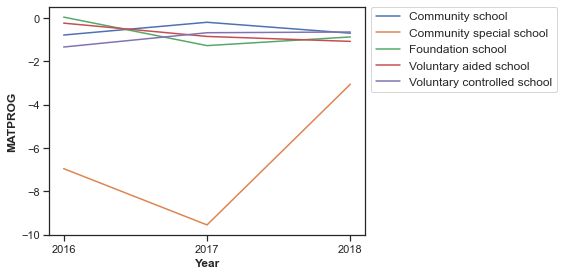

In [246]:
#line plot 'hue' on school type with year( a string) on x axis and maths progress on y axis across the three years or cohorts
sns.lineplot( x = "Year",
             y = "MATPROG",
             hue = "NFTYPE",
             data = schooltype_df);
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0, fontsize =12) #positions the legend

# Plotting school type with respect to progress in reading

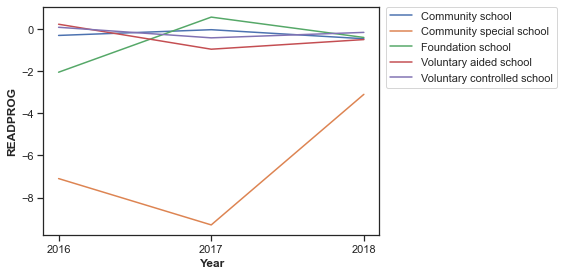

In [247]:
#line plot 'hue' on school type with year on x axis and reading progress on y axis across the three years or cohorts
sns.lineplot( x = "Year",
             y = "READPROG",
             hue = "NFTYPE",
             data = schooltype_df);
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0) #positions the legend

# Plotting school type with respect to progress in Writing

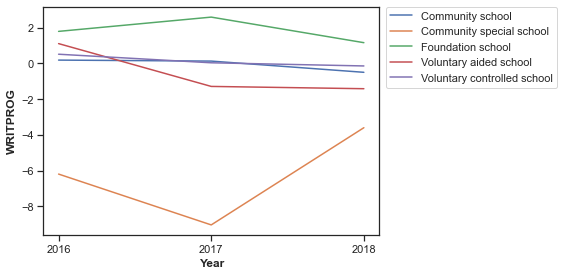

In [248]:
#line plot 'hue' on school type with year on x axis and writing progress on y axis across the three years or cohorts
sns.lineplot( x = "Year",
             y = "WRITPROG",
             hue = "NFTYPE",
             data = schooltype_df);
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0) #positions the legend

# Grouping the dataframe with type of religion type, year and the mean of the attributes.


This is needed to check the anual progress of each religion type alongside with the mean of other attributes

In [249]:
##Groups the school with religion and year
religion_groups = Allcohorts_dataframe.groupby(['RELDENOM', 'Year'])

In [250]:
#gets the mean of the attributes
religion_df=religion_groups.mean()

In [251]:
religion_df  # shows the dataframe grouped by religion and year and the mean attributes

FSM  TOTALINCOME  TEACHINGSTAFF  \
RELDENOM          Year                                          
Church of England 2016   7.177143  5095.942857    2340.742857   
                  2017   7.881250  5242.687500    2263.250000   
                  2018   9.515152  5727.393939    2468.696970   
Does not apply    2016  13.711475  5195.737705    2296.377049   
                  2017  13.367188  5445.875000    2366.843750   
                  2018  15.283333  5627.283333    2384.033333   
Roman Catholic    2016  10.940000  4982.200000    2339.400000   
                  2017   9.880000  5202.800000    2502.600000   
                  2018  12.400000  5308.800000    2506.000000   

                        TOTALEXPENDITURE  PGRANTFUNDING  PSELFGENERATEDINCOME  \
RELDENOM          Year                                                          
Church of England 2016       5059.457143      95.657143              4.342857   
                  2017       5220.687500      95.187500              4.812500   
                  2018       5689.060606      95.121212              4.939394   
Does not apply    2016       5220.377049      96.245902              3.754098   
                  2017       5424.140625      96.203125              3.796875   
                  2018       5539.583333      96.466667              3.583333   
Roman Catholic    2016       4955.400000      97.400000              2.600000   
                  2017       5317.000000      96.600000              3.400000   
                  2018       5355.600000      96.600000              3.400000   

                        PTEACHINGSTAFF  PSUPPLYTEACHERS  \
RELDENOM          Year                                    
Church of England 2016       45.914286         2.771429   
                  2017       44.000000         3.062500   
                  2018       43.757576         2.696970   
Does not apply    2016       45.426230         2.934426   
                  2017       44.906250         3.015625   
                  2018       44.616667         2.616667   
Roman Catholic    2016       46.800000         3.000000   
                  2017       47.200000         3.400000   
                  2018       47.000000         2.400000   

                        PEDUCATIONSUPPORTSTAFF  PPREMISES  PBACKOFFICE  \
RELDENOM          Year                                                   
Church of England 2016               18.657143   6.171429     8.142857   
                  2017               18.625000   5.875000     7.937500   
                  2018               18.424242   6.121212     8.333333   
Does not apply    2016               19.295082   5.639344     7.770492   
                  2017               19.375000   5.421875     8.125000   
                  2018               20.033333   5.616667     8.166667   
Roman Catholic    2016               17.200000   6.600000     7.800000   
                  2017               17.400000   6.800000     7.800000   
                  2018               17.800000   6.600000     7.600000   

                        PCATERING  POTHERSTAFF   PENERGY  PLEARNINGRESOURCES  \
RELDENOM          Year                                                         
Church of England 2016   3.714286     3.857143  1.314286            3.114286   
                  2017   4.218750     3.781250  1.468750            3.531250   
                  2018   4.363636     3.878788  1.696970            3.878788   
Does not apply    2016   3.606557     3.950820  1.163934            3.491803   
                  2017   3.750000     3.734375  1.500000            3.468750   
                  2018   3.900000     3.650000  1.450000            3.466667   
Roman Catholic    2016   4.000000     3.800000  1.200000            3.400000   
                  2017   3.800000     3.400000  1.400000            3.600000   
                  2018   4.200000     3.800000  1.400000            3.600000   

                            PICT  PBOUGHTINPROFESSIONALSERVICES    POTHER  \

# Extracting the details of religion, year and progress scores for better comaprison 

In [252]:
#Extracting the details of religion, year and progress scores for better comaprison
religion_df = religion_df.drop(religion_df.columns.difference(['NFTYPE','Year','MATPROG','READPROG','WRITPROG','Average Progress']), axis=1)
religion_df

WRITPROG   MATPROG  READPROG  Average Progress
RELDENOM          Year                                                
Church of England 2016  0.717143 -1.040000  0.214286         -0.036190
                  2017  0.046875 -0.800000 -0.512500         -0.421875
                  2018 -0.242424 -0.884848 -0.333333         -0.486869
Does not apply    2016 -0.019672 -0.980328 -0.526230         -0.508743
                  2017 -0.112500 -0.481250 -0.285937         -0.293229
                  2018 -0.590000 -0.786667 -0.543333         -0.640000
Roman Catholic    2016  0.480000 -1.280000 -1.480000         -0.760000
                  2017 -0.860000 -0.540000 -0.500000         -0.633333
                  2018 -0.480000  0.440000  0.380000          0.113333

# Plotting school in terms of religion with respect to progress in maths

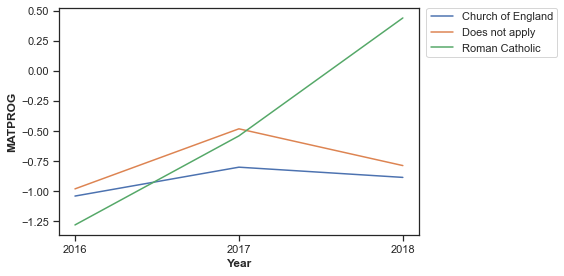

In [253]:
#line plot 'hue' on school religion with year on x axis and maths progress on y axis across the three years or cohorts
sns.lineplot( x = "Year",
             y = "MATPROG",
             hue = "RELDENOM",
             data = religion_df);
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0) #positions the legend

# Plotting school in terms of religion with respect to progress in reading

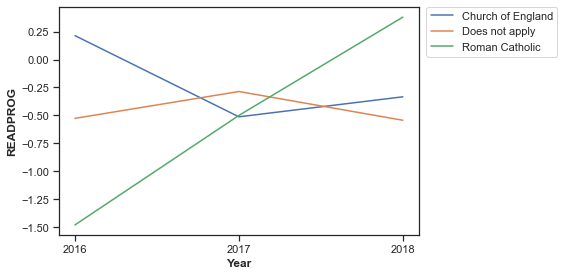

In [254]:
#line plot 'hue' on school religion with year on x axis and reading progress on y axis across the three years or cohorts
sns.lineplot( x = "Year",
             y = "READPROG",
             hue = "RELDENOM",
             data = religion_df);
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0) #positions the legend

# Plotting school in terms of religion with respect to progress in WRITING

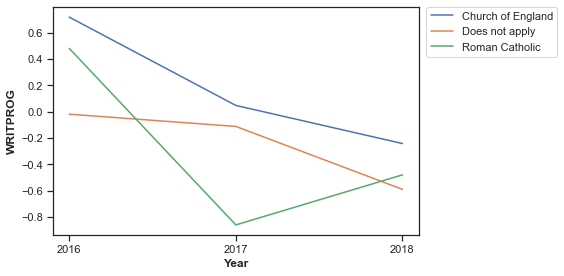

In [255]:
#line plot 'hue' on school religion with year on x axis and writing progress on y axis across the three years or cohorts
sns.lineplot( x = "Year",
             y = "WRITPROG",
             hue = "RELDENOM",
             data = religion_df);
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0) #positions the legend

Encoding religion and school type for machine learning

In [256]:
#encoding for 'NFTYPE' from 1,2,3,...,8 for school type

Allcohorts_dataframe['NFTYPE'] =  Allcohorts_dataframe['NFTYPE'].apply(lambda x: 1 if x=='Sponsored academy' else (2 if x=='Academy converter - mainstream' else 
                                                                                                (3 if x=='Community school' else 
                                                                                                (4 if x=='Community special school' else 
                                                                                                (5 if x=='Free school - mainstream' else 
                                                                                                (6 if x=='Foundation school' else 
                                                                                                (7 if x=='Voluntary aided school' else 8)))))))

#encoding for 'RELDENOM' from 1,2,3  for religion type
Allcohorts_dataframe['RELDENOM'] =  Allcohorts_dataframe['RELDENOM'].apply(lambda x: 1 if x=='Church of England' else (2 if x=='Roman Catholic' else 
                                                                                                (3 if x=='Does not apply' else 3 )))

# Box plot showing the distribution of progress scores for maths, reading, writing and average scores for the three cohorts ( 2016, 2017 and 2018)

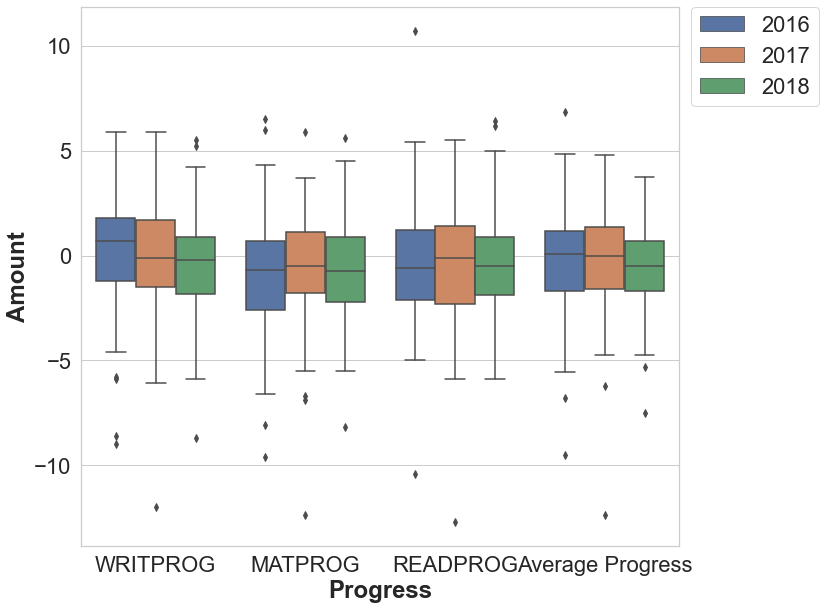

In [257]:
#ploting a box plot for the three years
sns.set(rc={'figure.figsize':(12,9)}, font_scale=2, style='whitegrid') #sets the properties of the graphs box plot i.e. figure size, font and style

sns.boxplot(data=Allcohorts_dataframe.melt(id_vars=['Year'], value_vars=['WRITPROG', 'MATPROG', 'READPROG', 'Average Progress'],
            var_name='Progress', value_name='Amount'), x='Progress',y='Amount',hue='Year',) #plots the box plot
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0) #positions the legend


#Reference: https://stackoverflow.com/questions/68268835/plot-multiple-boxplots-from-seaborn-with-hue

# Investigating the marks that are outliers

To extract the outliers, we need the Interquartile range (IQR), 25 percentile (Q1), 75 percentile (Q3), upper and lower limits of the boxplot

upper limit: this is the top of the whisker. It is given by Q3+1.5*IQR

lower limit: this is the bottom of the whisker. It is given by Q1-1.5*IQR

GETTING OUT THE DATAFRAMES FOR 2016, 2017 AND 2018 FOR OUTLIER ANALYSIS

In [258]:
#getting the dataframe for 2016 cohort
cohort_2016 = Allcohorts_dataframe[Allcohorts_dataframe['Year']=='2016']

#getting the dataframe for 2017 cohort
cohort_2017 = Allcohorts_dataframe[Allcohorts_dataframe['Year']=='2017']

#getting the dataframe for 2018 cohort
cohort_2018 = Allcohorts_dataframe[Allcohorts_dataframe['Year']=='2018']

Below function outlier_seiver()  is to create a list of outliers in a column or series parsing in the dataframe and the column or variable

In [259]:
def outlier_seiver (Dataframe,variable): #defining the function. The variable or series here is column
    outliers = [] #initializing a list to contain the outliers
    Q1 = np.percentile(Dataframe[variable] , 25) #gives 25th percentile for the series parsed in
    Q3 =  np.percentile(Dataframe[variable] , 75) #gives 75th percentile for the series parsed in
    IQR = Q3 - Q1 #interquartile range
    upper_limit = Q3+1.5*IQR #gives upper limit of the whisker for the box plot
    lower_limit = Q1-1.5*IQR #gives lower limit of the whisker for the box plot
    #any datapoint above or below the upper and lower limits respectively are outliers. Hence, this code below
    for i in Dataframe[variable]:
        if i > upper_limit:
            outliers.append(i)
        elif i < lower_limit:
            outliers.append(i)
    print(outliers) #prints lists of outliers
    

The boxplot above is made up of 12 distributions (or series)... we apply the function to creat a list of outliers for each

WRITING

In [260]:
#2016 WRITING outliers
writing_outliers_2016 = outlier_seiver(cohort_2016,'WRITPROG')

[-8.6, -5.8, -5.9, -9.0]


In [261]:
#2017 WRITING outliers
writing_outliers_2017 = outlier_seiver(cohort_2017,'WRITPROG')

[-12.0]


In [262]:
#2018 WRITING outliers
writing_outliers_2018 = outlier_seiver(cohort_2018,'WRITPROG')

[-8.7, 5.5, 5.2]


MATHS

In [263]:
#2016 MATHS outliers
maths_outliers_2016 = outlier_seiver(cohort_2016,'MATPROG')

[-9.6, 6.5, 6.0, -8.1]


In [264]:
#2017 MATHS outliers
maths_outliers_2017 = outlier_seiver(cohort_2017,'MATPROG')

[5.9, -6.9, -6.7, -12.4]


In [265]:
#2018 MATHS outliers
maths_outliers_2018 = outlier_seiver(cohort_2018,'MATPROG')

[-8.2, 5.6]


READING

In [266]:
#2016 READING outliers
read_outliers_2016 = outlier_seiver(cohort_2016,'READPROG')

[-10.4, 10.7]


In [267]:
#2017 READING outliers
read_outliers_2017 = outlier_seiver(cohort_2017,'READPROG')

[-12.7]


In [268]:
#2018 READING outliers
read_outliers_2018 = outlier_seiver(cohort_2018,'READPROG')

[6.4, 6.2]


AVERAGE PROGRESS

In [269]:
#2016 AVERAGE PROGRESS outliers
aveprog_outliers_2016 = outlier_seiver(cohort_2016,'Average Progress')

[-9.533333333333333, 6.833333333333333, -6.8]


In [270]:
#2017 AVERAGE PROGRESS outliers
aveprog_outliers_2017 = outlier_seiver(cohort_2017,'Average Progress')

[-6.233333333333334, -12.366666666666665]


In [271]:
#2018 AVERAGE PROGRESS outliers
aveprog_outliers_2018 = outlier_seiver(cohort_2018,'Average Progress')

[-5.3, -7.5]


SUMARILY

# Community special school major reason for outliers

Note: The total schools enrolled as community special school is 2, in each of the cohorts

Please view codes for schools (NFTYPE in the dataframes) below

1	as Sponsored academy

2	as Academy converter -mainstream

3	as Community school

4	as Community special school

5	as Free school – mainstream

6	as Foundation school

7	as Voluntary aided school

8	as Voluntary controlled school


MATHS OUTLIERS DATAFRAME IS GIVEN BELOW:
    
It was detected that a high number of the mathe prgress scores of community special schools lie as outliers. This is because:

50% of community special schools have marks (low marks) as outlier in 2016

100% (all) of community special schools have marks (low marks) as outlier in 2017

community special schools is the major cause of outliers and does not fit into the distribution. They have the least progress scores.

In [272]:
#Getting Dataframe with details of math progress scores that are outliers
maths_outliers_df = Allcohorts_dataframe[(((Allcohorts_dataframe['MATPROG']==-9.6) | (Allcohorts_dataframe['MATPROG']==6.5) | (Allcohorts_dataframe['MATPROG']==6.0) | (Allcohorts_dataframe['MATPROG']==-8.1) &  (Allcohorts_dataframe['Year']== '2016'))) | (((Allcohorts_dataframe['MATPROG']==5.9) | (Allcohorts_dataframe['MATPROG']==-6.9) | (Allcohorts_dataframe['MATPROG']==-6.7) | (Allcohorts_dataframe['MATPROG']==-12.4) &  (Allcohorts_dataframe['Year']== '2017'))) | (((Allcohorts_dataframe['MATPROG']==-8.2) | (Allcohorts_dataframe['MATPROG']==5.6)  &  (Allcohorts_dataframe['Year']== '2018')))]

In [273]:
#Dataframe with details of math progress scores that are outliers
maths_outliers_df

,FSM,TOTALINCOME,TEACHINGSTAFF,TOTALEXPENDITURE,PGRANTFUNDING,PSELFGENERATEDINCOME,PTEACHINGSTAFF,PSUPPLYTEACHERS,PEDUCATIONSUPPORTSTAFF,PPREMISES,PBACKOFFICE,PCATERING,POTHERSTAFF,PENERGY,PLEARNINGRESOURCES,PICT,PBOUGHTINPROFESSIONALSERVICES,POTHER,NFTYPE,RELDENOM,TOTPUPS,TKS1AVERAGE,PTKS1GROUP_L,PTFSM6CLA1A,PTEALGRP2,PTMOBN,PTRWM_EXP,PTEALGRP1,PTEALGRP3,PSENELE,PSENELK,IMD,HLE,WRITPROG,MATPROG,READPROG,Average Progress,Year
2,29.5,17525.0,7227.0,17980.0,98.0,2.0,40.0,3.0,34.0,3.0,5.0,2.0,3.0,1.0,4.0,1.0,4.0,1.0,4,3,89.0,7.3,83.0,33.0,0.0,67.0,0.0,100.0,0.0,0.0,13.0,4.0,4.0,-8.6,-9.6,-10.4,-9.533333,2016
7,3.2,5615.0,2793.0,5492.0,97.0,3.0,46.0,1.0,19.0,5.0,10.0,3.0,4.0,1.0,4.0,2.0,4.0,2.0,7,1,105.0,14.5,37.0,24.0,5.0,81.0,81.0,95.0,0.0,0.0,10.0,2.0,4.0,3.3,6.5,10.7,6.833333,2016
33,14.6,4580.0,2202.0,4514.0,99.0,1.0,46.0,1.0,19.0,8.0,7.0,4.0,3.0,2.0,4.0,2.0,2.0,2.0,7,2,170.0,16.1,5.0,25.0,35.0,80.0,70.0,65.0,0.0,5.0,15.0,5.0,4.0,3.8,6.0,-1.1,2.900000,2016
45,2.8,8312.0,3369.0,7553.0,98.0,2.0,45.0,1.0,19.0,7.0,14.0,2.0,4.0,1.0,2.0,2.0,3.0,1.0,8,1,41.0,18.5,0.0,20.0,0.0,90.0,40.0,100.0,0.0,0.0,10.0,1.0,2.0,-2.4,-8.1,-1.4,-3.966667,2016
179,2.7,4739.0,2155.0,4690.0,96.0,4.0,46.0,1.0,22.0,5.0,8.0,4.0,3.0,1.0,4.0,2.0,1.0,3.0,8,1,112.0,15.4,12.0,6.0,0.0,100.0,82.0,100.0,0.0,0.0,29.0,3.0,4.0,3.7,5.9,4.8,4.800000,2017
187,0.0,4812.0,2479.0,5216.0,98.0,2.0,48.0,3.0,16.0,7.0,8.0,4.0,2.0,2.0,4.0,2.0,3.0,2.0,7,2,102.0,18.2,0.0,8.0,0.0,92.0,46.0,100.0,0.0,0.0,31.0,1.0,2.0,-4.0,-6.9,-3.4,-4.766667,2017
200,26.8,21848.0,6367.0,21105.0,97.0,3.0,30.0,2.0,41.0,7.0,5.0,4.0,2.0,1.0,6.0,1.0,0.0,1.0,4,3,142.0,2.6,100.0,50.0,14.0,93.0,0.0,86.0,0.0,0.0,14.0,1.0,2.0,-6.1,-6.7,-5.9,-6.233333,2017
201,33.0,18486.0,7060.0,18051.0,98.0,2.0,39.0,3.0,37.0,3.0,5.0,2.0,3.0,1.0,4.0,0.0,3.0,1.0,4,3,91.0,6.9,83.0,43.0,0.0,71.0,0.0,100.0,0.0,0.0,14.0,4.0,4.0,-12.0,-12.4,-12.7,-12.366667,2017
230,17.0,5888.0,1792.0,5669.0,99.0,2.0,32.0,8.0,23.0,9.0,10.0,3.0,3.0,1.0,3.0,2.0,3.0,3.0,3,3,115.0,15.7,7.0,40.0,0.0,93.0,27.0,100.0,0.0,7.0,7.0,6.0,2.0,-8.7,-8.2,-5.6,-7.500000,2018
252,21.0,7535.0,2671.0,7069.0,97.0,3.0,38.0,2.0,19.0,6.0,13.0,5.0,2.0,2.0,7.0,1.0,2.0,2.0,3,3,56.0,15.2,13.0,38.0,0.0,63.0,63.0,100.0,0.0,0.0,25.0,7.0,5.0,0.1,5.6,2.9,2.866667,2018


WRITING OUTLIERS DATAFRAME IS GIVEN BELOW:
    
It was detected that a high number of the writing prgress scores of community special schools lie as outliers. This is because:

50% of community special schools have marks (low marks) as outlier in 2016

50%  of community special schools have marks (low marks) as outlier in 2017 and consititutes the only writing outlier of this year

community special schools is the major cause of outliers and does not fit into the distribution. They have the least progress scores.

In [274]:
#Getting dataframe with details of writing progress scores that are outliers
writing_outliers_df = Allcohorts_dataframe[(((Allcohorts_dataframe['WRITPROG']==-8.6) | (Allcohorts_dataframe['WRITPROG']==-5.8) | (Allcohorts_dataframe['WRITPROG']==-5.9) | (Allcohorts_dataframe['WRITPROG']==-9.0) &  (Allcohorts_dataframe['Year']== '2016'))) | (((Allcohorts_dataframe['WRITPROG']==-12.0) & (Allcohorts_dataframe['Year']== '2017'))) |  (((Allcohorts_dataframe['WRITPROG']==-8.7) | (Allcohorts_dataframe['WRITPROG']==5.5) | (Allcohorts_dataframe['WRITPROG']==5.2) &  (Allcohorts_dataframe['Year']== '2018')))]

In [275]:
#dataframe with details of writing progress scores that are outliers
writing_outliers_df

,FSM,TOTALINCOME,TEACHINGSTAFF,TOTALEXPENDITURE,PGRANTFUNDING,PSELFGENERATEDINCOME,PTEACHINGSTAFF,PSUPPLYTEACHERS,PEDUCATIONSUPPORTSTAFF,PPREMISES,PBACKOFFICE,PCATERING,POTHERSTAFF,PENERGY,PLEARNINGRESOURCES,PICT,PBOUGHTINPROFESSIONALSERVICES,POTHER,NFTYPE,RELDENOM,TOTPUPS,TKS1AVERAGE,PTKS1GROUP_L,PTFSM6CLA1A,PTEALGRP2,PTMOBN,PTRWM_EXP,PTEALGRP1,PTEALGRP3,PSENELE,PSENELK,IMD,HLE,WRITPROG,MATPROG,READPROG,Average Progress,Year
2,29.5,17525.0,7227.0,17980.0,98.0,2.0,40.0,3.0,34.0,3.0,5.0,2.0,3.0,1.0,4.0,1.0,4.0,1.0,4,3,89.0,7.3,83.0,33.0,0.0,67.0,0.0,100.0,0.0,0.0,13.0,4.0,4.0,-8.6,-9.6,-10.4,-9.533333,2016
25,14.7,4372.0,1838.0,4394.0,97.0,3.0,42.0,1.0,22.0,0.0,22.0,0.0,5.0,0.0,4.0,1.0,1.0,3.0,3,3,423.0,18.2,2.0,18.0,2.0,92.0,56.0,98.0,0.0,3.0,10.0,3.0,5.0,-5.8,-5.9,-5.0,-5.566667,2016
40,4.5,5510.0,2672.0,5612.0,94.0,6.0,46.0,2.0,19.0,5.0,8.0,3.0,7.0,1.0,3.0,1.0,1.0,3.0,3,3,112.0,17.1,7.0,0.0,7.0,93.0,53.0,93.0,0.0,7.0,13.0,4.0,5.0,-5.9,0.6,0.4,-1.633333,2016
61,4.3,4932.0,1989.0,5120.0,98.0,2.0,39.0,8.0,18.0,5.0,10.0,5.0,2.0,1.0,3.0,3.0,3.0,4.0,3,3,110.0,16.8,6.0,31.0,0.0,94.0,44.0,100.0,0.0,0.0,13.0,2.0,4.0,-9.0,-6.6,-4.8,-6.800000,2016
201,33.0,18486.0,7060.0,18051.0,98.0,2.0,39.0,3.0,37.0,3.0,5.0,2.0,3.0,1.0,4.0,0.0,3.0,1.0,4,3,91.0,6.9,83.0,43.0,0.0,71.0,0.0,100.0,0.0,0.0,14.0,4.0,4.0,-12.0,-12.4,-12.7,-12.366667,2017
230,17.0,5888.0,1792.0,5669.0,99.0,2.0,32.0,8.0,23.0,9.0,10.0,3.0,3.0,1.0,3.0,2.0,3.0,3.0,3,3,115.0,15.7,7.0,40.0,0.0,93.0,27.0,100.0,0.0,7.0,7.0,6.0,2.0,-8.7,-8.2,-5.6,-7.500000,2018
236,40.0,8439.0,3560.0,8480.0,94.0,6.0,42.0,4.0,19.0,7.0,7.0,10.0,3.0,2.0,2.0,1.0,3.0,2.0,3,3,53.0,14.7,13.0,38.0,0.0,88.0,88.0,100.0,0.0,13.0,13.0,2.0,2.0,5.5,2.2,2.5,3.400000,2018
254,11.0,4316.0,2069.0,4500.0,96.0,4.0,46.0,4.0,15.0,6.0,9.0,4.0,4.0,2.0,4.0,1.0,3.0,3.0,8,1,352.0,17.5,0.0,16.0,4.0,91.0,46.0,96.0,0.0,2.0,23.0,5.0,4.0,-5.9,-4.0,-3.3,-4.400000,2018
275,6.0,10251.0,4532.0,9852.0,95.0,5.0,46.0,4.0,13.0,6.0,8.0,3.0,6.0,2.0,6.0,2.0,1.0,3.0,8,1,36.0,13.3,33.0,17.0,0.0,100.0,50.0,100.0,0.0,33.0,17.0,2.0,2.0,5.2,-2.2,-1.4,0.533333,2018


READING OUTLIERS DATAFRAME IS GIVEN BELOW:
    
It was detected that a high number of the READING prgress scores of community special schools lie as outliers

50% of community special schools have marks (low marks) as outlier in 2016

50%  of community special schools have marks (low marks) as outlier in 2017 and consititutes the only reading outlier of this year

community special schools is the major cause of outliers and does not fit into the distribution. They have the least progress scores.

In [276]:
#Getting Dataframe with details of reading progress scores that are outliers
reading_outliers_df = Allcohorts_dataframe[(((Allcohorts_dataframe['READPROG']==-10.4) | (Allcohorts_dataframe['READPROG']==10.7) &  (Allcohorts_dataframe['Year']== '2016'))) |  (((Allcohorts_dataframe['READPROG']==-12.7) & (Allcohorts_dataframe['Year']== '2017'))) |  (((Allcohorts_dataframe['READPROG']==6.4) | (Allcohorts_dataframe['READPROG']==6.2) & (Allcohorts_dataframe['Year']== '2018')))]

In [277]:
#Dataframe with details of reading progress scores that are outliers
reading_outliers_df

,FSM,TOTALINCOME,TEACHINGSTAFF,TOTALEXPENDITURE,PGRANTFUNDING,PSELFGENERATEDINCOME,PTEACHINGSTAFF,PSUPPLYTEACHERS,PEDUCATIONSUPPORTSTAFF,PPREMISES,PBACKOFFICE,PCATERING,POTHERSTAFF,PENERGY,PLEARNINGRESOURCES,PICT,PBOUGHTINPROFESSIONALSERVICES,POTHER,NFTYPE,RELDENOM,TOTPUPS,TKS1AVERAGE,PTKS1GROUP_L,PTFSM6CLA1A,PTEALGRP2,PTMOBN,PTRWM_EXP,PTEALGRP1,PTEALGRP3,PSENELE,PSENELK,IMD,HLE,WRITPROG,MATPROG,READPROG,Average Progress,Year
2,29.5,17525.0,7227.0,17980.0,98.0,2.0,40.0,3.0,34.0,3.0,5.0,2.0,3.0,1.0,4.0,1.0,4.0,1.0,4,3,89.0,7.3,83.0,33.0,0.0,67.0,0.0,100.0,0.0,0.0,13.0,4.0,4.0,-8.6,-9.6,-10.4,-9.533333,2016
7,3.2,5615.0,2793.0,5492.0,97.0,3.0,46.0,1.0,19.0,5.0,10.0,3.0,4.0,1.0,4.0,2.0,4.0,2.0,7,1,105.0,14.5,37.0,24.0,5.0,81.0,81.0,95.0,0.0,0.0,10.0,2.0,4.0,3.3,6.5,10.7,6.833333,2016
201,33.0,18486.0,7060.0,18051.0,98.0,2.0,39.0,3.0,37.0,3.0,5.0,2.0,3.0,1.0,4.0,0.0,3.0,1.0,4,3,91.0,6.9,83.0,43.0,0.0,71.0,0.0,100.0,0.0,0.0,14.0,4.0,4.0,-12.0,-12.4,-12.7,-12.366667,2017
207,2.0,6981.0,2901.0,7174.0,97.0,3.0,40.0,2.0,19.0,5.0,13.0,2.0,8.0,1.0,3.0,2.0,4.0,2.0,3,3,49.0,14.6,20.0,10.0,0.0,80.0,60.0,100.0,0.0,10.0,10.0,5.0,2.0,0.0,3.7,6.4,3.366667,2018
279,1.0,6597.0,2370.0,6579.0,94.0,7.0,36.0,5.0,23.0,5.0,10.0,4.0,7.0,1.0,3.0,1.0,3.0,2.0,8,1,85.0,14.4,38.0,13.0,0.0,100.0,63.0,100.0,0.0,13.0,38.0,1.0,2.0,1.5,0.0,6.2,2.566667,2018


Average Progress OUTLIERS DATAFRAME IS GIVEN BELOW:
    
It was detected that a high number of the Average prgress scores of community special schools lie as outliers

50% of community special schools have marks (low marks) as outlier in 2016

100%  of community special schools have marks (low marks) as outlier in 2017 and consititutes the only average outlier of this year

community special schools is the major cause of outliers and does not fit into the distribution. They have the least progress scores.

In [278]:
#Dataframe with details of Average progress scores that are outliers
Average_outliers_df = Allcohorts_dataframe[(((Allcohorts_dataframe['Average Progress']==-9.533333333333333) | (Allcohorts_dataframe['Average Progress']==6.833333333333333) | (Allcohorts_dataframe['Average Progress']==-6.8) &  (Allcohorts_dataframe['Year']== '2016'))) |  (((Allcohorts_dataframe['Average Progress']==-6.233333333333334) | (Allcohorts_dataframe['Average Progress']==-12.366666666666665)& (Allcohorts_dataframe['Year']== '2017'))) |  (((Allcohorts_dataframe['Average Progress']==-5.3) | (Allcohorts_dataframe['Average Progress']==-7.5) & (Allcohorts_dataframe['Year']== '2018')))]

In [279]:
#Dataframe with details of average progress scores that are outliers
Average_outliers_df

,FSM,TOTALINCOME,TEACHINGSTAFF,TOTALEXPENDITURE,PGRANTFUNDING,PSELFGENERATEDINCOME,PTEACHINGSTAFF,PSUPPLYTEACHERS,PEDUCATIONSUPPORTSTAFF,PPREMISES,PBACKOFFICE,PCATERING,POTHERSTAFF,PENERGY,PLEARNINGRESOURCES,PICT,PBOUGHTINPROFESSIONALSERVICES,POTHER,NFTYPE,RELDENOM,TOTPUPS,TKS1AVERAGE,PTKS1GROUP_L,PTFSM6CLA1A,PTEALGRP2,PTMOBN,PTRWM_EXP,PTEALGRP1,PTEALGRP3,PSENELE,PSENELK,IMD,HLE,WRITPROG,MATPROG,READPROG,Average Progress,Year
2,29.5,17525.0,7227.0,17980.0,98.0,2.0,40.0,3.0,34.0,3.0,5.0,2.0,3.0,1.0,4.0,1.0,4.0,1.0,4,3,89.0,7.3,83.0,33.0,0.0,67.0,0.0,100.0,0.0,0.0,13.0,4.0,4.0,-8.6,-9.6,-10.4,-9.533333,2016
7,3.2,5615.0,2793.0,5492.0,97.0,3.0,46.0,1.0,19.0,5.0,10.0,3.0,4.0,1.0,4.0,2.0,4.0,2.0,7,1,105.0,14.5,37.0,24.0,5.0,81.0,81.0,95.0,0.0,0.0,10.0,2.0,4.0,3.3,6.5,10.7,6.833333,2016
61,4.3,4932.0,1989.0,5120.0,98.0,2.0,39.0,8.0,18.0,5.0,10.0,5.0,2.0,1.0,3.0,3.0,3.0,4.0,3,3,110.0,16.8,6.0,31.0,0.0,94.0,44.0,100.0,0.0,0.0,13.0,2.0,4.0,-9.0,-6.6,-4.8,-6.800000,2016
200,26.8,21848.0,6367.0,21105.0,97.0,3.0,30.0,2.0,41.0,7.0,5.0,4.0,2.0,1.0,6.0,1.0,0.0,1.0,4,3,142.0,2.6,100.0,50.0,14.0,93.0,0.0,86.0,0.0,0.0,14.0,1.0,2.0,-6.1,-6.7,-5.9,-6.233333,2017
201,33.0,18486.0,7060.0,18051.0,98.0,2.0,39.0,3.0,37.0,3.0,5.0,2.0,3.0,1.0,4.0,0.0,3.0,1.0,4,3,91.0,6.9,83.0,43.0,0.0,71.0,0.0,100.0,0.0,0.0,14.0,4.0,4.0,-12.0,-12.4,-12.7,-12.366667,2017
204,39.0,7465.0,2879.0,7437.0,99.0,1.0,39.0,4.0,20.0,7.0,10.0,5.0,3.0,2.0,4.0,1.0,3.0,3.0,3,3,64.0,14.9,14.0,43.0,0.0,100.0,43.0,100.0,0.0,29.0,29.0,6.0,6.0,-4.5,-5.5,-5.9,-5.300000,2018
230,17.0,5888.0,1792.0,5669.0,99.0,2.0,32.0,8.0,23.0,9.0,10.0,3.0,3.0,1.0,3.0,2.0,3.0,3.0,3,3,115.0,15.7,7.0,40.0,0.0,93.0,27.0,100.0,0.0,7.0,7.0,6.0,2.0,-8.7,-8.2,-5.6,-7.500000,2018


# Visualization in line graph

# Extracting the mean values for maths, reading and writing for the three years to plot a line graph

In [280]:
Mathsmean_16 = combined_df_school_16['MATPROG'].mean() #2016 maths mean
Mathsmean_17 = combined_df_school_17['MATPROG'].mean() #2017 maths mean
Mathsmean_18 = combined_df_school_18['MATPROG'].mean() #2018 maths mean



Writmean_16 = combined_df_school_16['WRITPROG'].mean() #2016 writing mean
Writmean_17 = combined_df_school_17['WRITPROG'].mean() #2017 writing mean
Writmean_18 = combined_df_school_18['WRITPROG'].mean() #2018 writing mean


Readmean_16 = combined_df_school_16['READPROG'].mean() #2016 reading mean
Readmean_17 = combined_df_school_17['READPROG'].mean() #2017 reading mean
Readmean_18 = combined_df_school_18['READPROG'].mean() #2018 reading mean

Meanprogress_16 = combined_df_school_16['Average Progress'].mean() #2016 mean progress
Meanprogress_17 = combined_df_school_17['Average Progress'].mean() #2017 mean progress
Meanprogress_18 = combined_df_school_18['Average Progress'].mean() #2018 mean progress

# CREATING A DATAFRAME FOR SUMMARY PERFORMANCE 

In [281]:
#CREATING A DATAFRAME FOR SUMMARY PERFORMANCE
Three_years_Pefromance = pd.DataFrame({'Progress': {0: Mathsmean_16, 1: Readmean_16, 2: Writmean_16,3: Meanprogress_16, 4: Mathsmean_17, 5: Readmean_17,6: Writmean_17, 7: Meanprogress_17, 8: Mathsmean_18, 9: Readmean_18, 10: Writmean_18, 11: Meanprogress_18},
                   'Year': {0: '2016', 1: '2016', 2: '2016',3: '2016', 4: '2017', 5: '2017',6: '2017', 7: '2017', 8: '2018',9: '2018', 10: '2018', 11: '2018'},
                    'Subject': {0: 'Maths', 1: 'Reading', 2: 'Writing',3: 'Mean Progress', 4: 'Maths', 5: 'Reading',6: 'Writing', 7: 'Mean Progress', 8: 'Maths',9: 'Reading', 10: 'Writing', 11: 'Mean Progress'}})

In [282]:
#CHECKING THE  DATAFRAME FOR SUMMARY PERFORMANCE
Three_years_Pefromance

,Progress,Year,Subject
0,-1.015842,2016,Maths
1,-0.316832,2016,Reading
2,0.260396,2016,Writing
3,-0.357426,2016,Mean Progress
4,-0.585149,2017,Maths
5,-0.368317,2017,Reading
6,-0.099010,2017,Writing
7,-0.350825,2017,Mean Progress
8,-0.757143,2018,Maths
9,-0.425510,2018,Reading


# Visualization in line graph

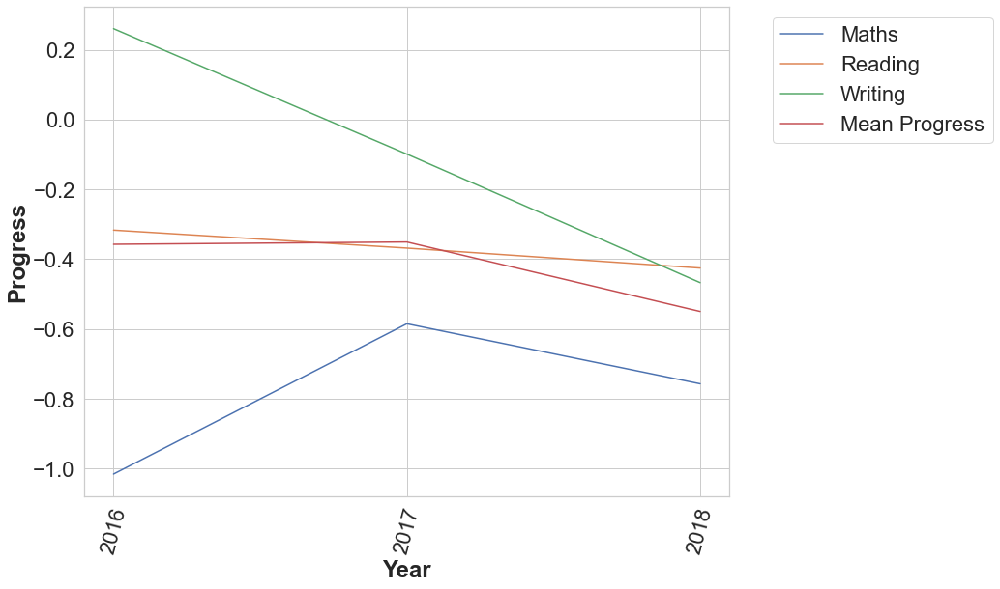

In [283]:
plt.figure(figsize=(15, 9)) #Figure size
sns.lineplot(x='Year', y='Progress', data=Three_years_Pefromance, hue='Subject') #attributes of the graph; x axis, y axis, data and 'hue' i.e. varieties of the graph
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left') #sets position of the legend
plt.xticks(rotation=75) #rotates the labels of x-axis
plt.show() #show the graph

# Correlation: Continuos Variables

Grouping the columns based on column type:

1. Continuous Variable (Independent): FSM	TOTALINCOME                      , TEACHINGSTAFF                 , TOTALEXPENDITURE	
PGRANTFUNDING	,PSELFGENERATEDINCOME, PTEACHINGSTAFF, PSUPPLYTEACHERS,PEDUCATIONSUPPORTSTAFF,	PPREMISES,	PBACKOFFICE,	PCATERING,	POTHERSTAFF,	PENERGY,	PLEARNINGRESOURCES,	PICT,	PBOUGHTINPROFESSIONALSERVICES,	POTHER, TOTPUPS,	TKS1AVERAGE,	PTKS1GROUP_L,	PTFSM6CLA1A,	PTEALGRP2,	PTMOBN,	PTRWM_EXP,	PTEALGRP1,	PTEALGRP3,	PSENELE,	PSENELK



2. Categorical Variable (Independent): 
NFTYPE	, RELDENOM, IMD, HLE


3. Continuous Variable (Dependent): WRITPROG	MATPROG	READPROG	Average Progress

# Inferential Stats... Continuos variables (independent and dependent) - Correlation Test

# a)writing as target variable

In [284]:
Allcohorts_dataframe.head(2) #views all the dataframe

,FSM,TOTALINCOME,TEACHINGSTAFF,TOTALEXPENDITURE,PGRANTFUNDING,PSELFGENERATEDINCOME,PTEACHINGSTAFF,PSUPPLYTEACHERS,PEDUCATIONSUPPORTSTAFF,PPREMISES,PBACKOFFICE,PCATERING,POTHERSTAFF,PENERGY,PLEARNINGRESOURCES,PICT,PBOUGHTINPROFESSIONALSERVICES,POTHER,NFTYPE,RELDENOM,TOTPUPS,TKS1AVERAGE,PTKS1GROUP_L,PTFSM6CLA1A,PTEALGRP2,PTMOBN,PTRWM_EXP,PTEALGRP1,PTEALGRP3,PSENELE,PSENELK,IMD,HLE,WRITPROG,MATPROG,READPROG,Average Progress,Year
0,18.2,4674.0,2019.0,4432.0,97.0,3.0,46.0,1.0,21.0,7.0,6.0,3.0,5.0,1.0,3.0,2.0,3.0,4.0,3,3,216.0,15.8,13.0,26.0,0.0,91.0,52.0,100.0,0.0,9.0,26.0,7.0,7.0,-2.9,-2.5,-0.4,-1.933333,2016
1,4.1,4686.0,2061.0,4795.0,93.0,7.0,43.0,3.0,18.0,4.0,10.0,4.0,5.0,1.0,5.0,2.0,4.0,1.0,6,1,114.0,17.1,6.0,12.0,0.0,94.0,59.0,100.0,0.0,0.0,12.0,1.0,2.0,2.8,-1.9,-2.0,-0.366667,2016


In [285]:
#creates a dataframe with each of subjects as target variable
#for writing
Allcohort_continuos_writing= Allcohorts_dataframe.drop((['NFTYPE' , 'RELDENOM', 'IMD', 'HLE','Year', 'MATPROG', 'READPROG','Average Progress']), axis=1)
#for reading
Allcohort_continuos_reading= Allcohorts_dataframe.drop((['NFTYPE' , 'RELDENOM', 'IMD', 'HLE','Year', 'MATPROG', 'WRITPROG','Average Progress']), axis=1)
#for maths
Allcohort_continuos_maths= Allcohorts_dataframe.drop((['NFTYPE' , 'RELDENOM', 'IMD', 'HLE','Year', 'WRITPROG', 'READPROG','Average Progress']), axis=1)

In [286]:
Allcohort_continuos_writing.head(2) #views the dataframe with writing as target variable

,FSM,TOTALINCOME,TEACHINGSTAFF,TOTALEXPENDITURE,PGRANTFUNDING,PSELFGENERATEDINCOME,PTEACHINGSTAFF,PSUPPLYTEACHERS,PEDUCATIONSUPPORTSTAFF,PPREMISES,PBACKOFFICE,PCATERING,POTHERSTAFF,PENERGY,PLEARNINGRESOURCES,PICT,PBOUGHTINPROFESSIONALSERVICES,POTHER,TOTPUPS,TKS1AVERAGE,PTKS1GROUP_L,PTFSM6CLA1A,PTEALGRP2,PTMOBN,PTRWM_EXP,PTEALGRP1,PTEALGRP3,PSENELE,PSENELK,WRITPROG
0,18.2,4674.0,2019.0,4432.0,97.0,3.0,46.0,1.0,21.0,7.0,6.0,3.0,5.0,1.0,3.0,2.0,3.0,4.0,216.0,15.8,13.0,26.0,0.0,91.0,52.0,100.0,0.0,9.0,26.0,-2.9
1,4.1,4686.0,2061.0,4795.0,93.0,7.0,43.0,3.0,18.0,4.0,10.0,4.0,5.0,1.0,5.0,2.0,4.0,1.0,114.0,17.1,6.0,12.0,0.0,94.0,59.0,100.0,0.0,0.0,12.0,2.8


ANALYSING CORRELATION VALUES WITH WRITING

<AxesSubplot:>

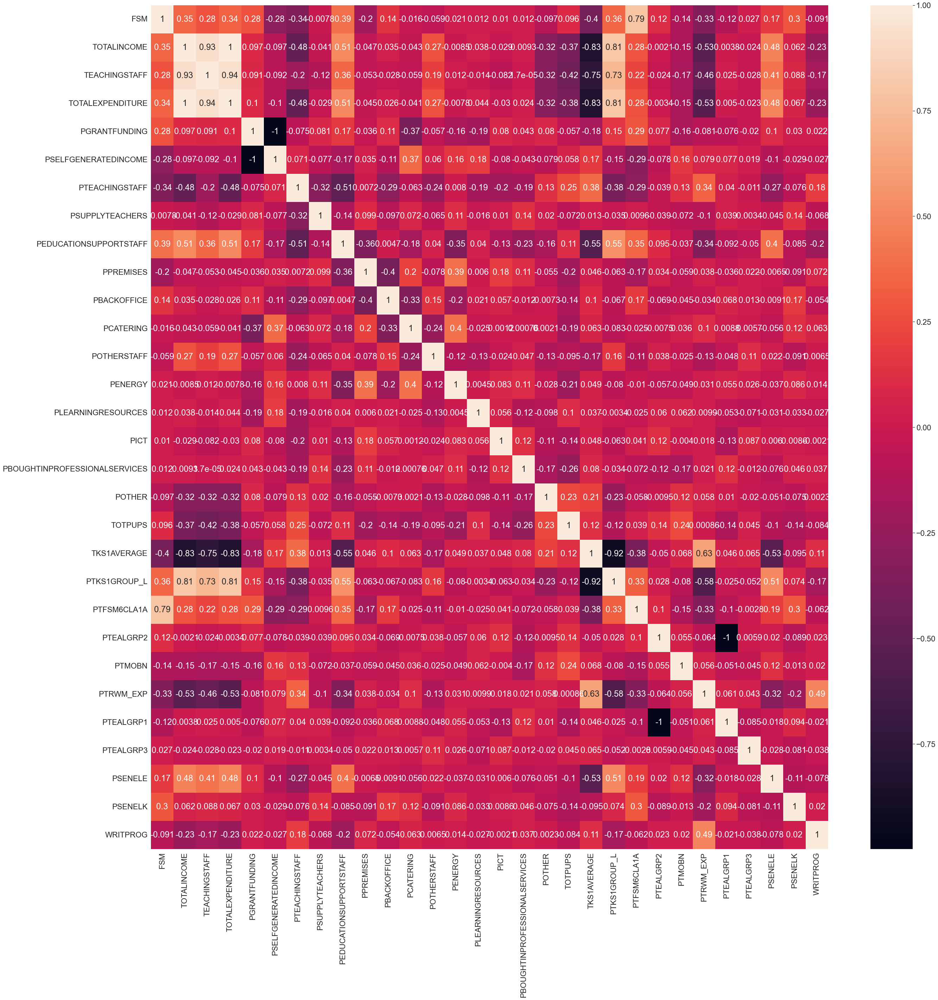

In [287]:
import seaborn as sns
corr_writ=Allcohort_continuos_writing.corr() #sets the correlation
features=corr_writ.index
plt.figure(figsize=(40,40)) #plots the figure with the stated size
sns.heatmap(Allcohort_continuos_writing[features].corr(),annot=True) #plots heatmap

ANALYSING CORRELATION VALUES WITH READING

<AxesSubplot:>

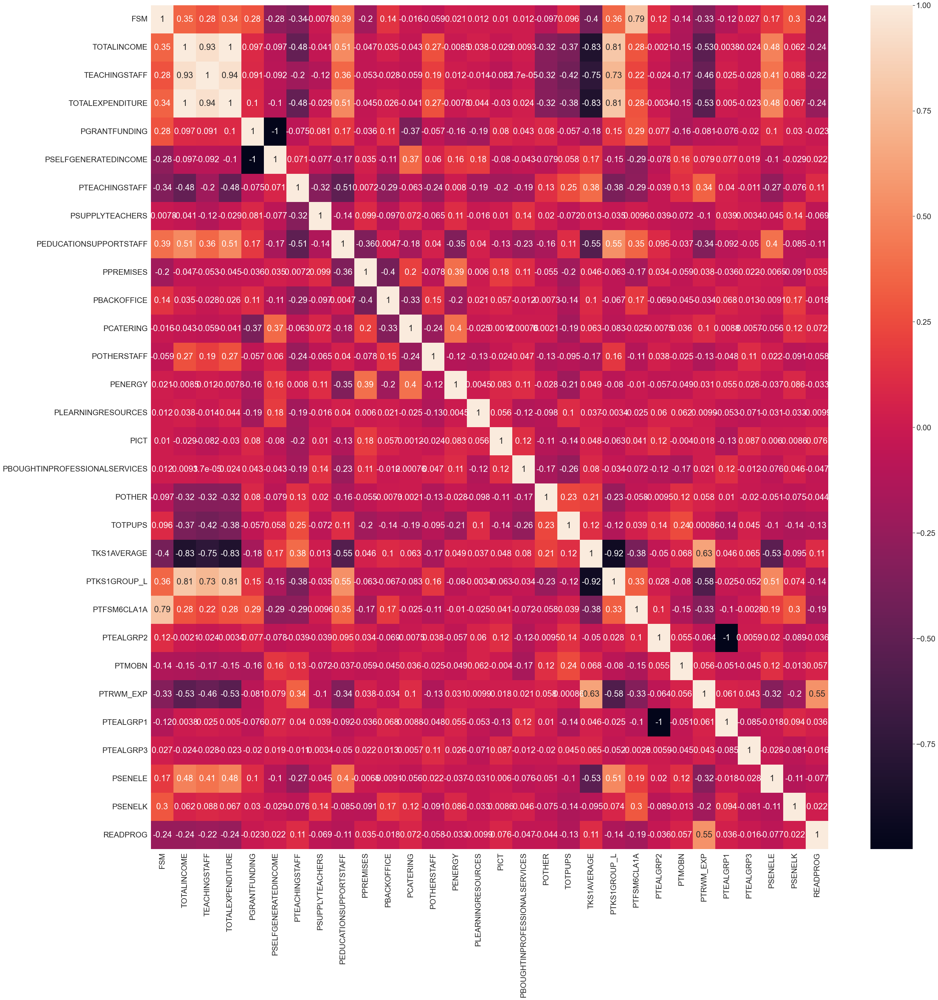

In [288]:
corr_read=Allcohort_continuos_reading.corr() #sets the correlation
features=corr_read.index
plt.figure(figsize=(40,40)) #plots the figure with the stated size
sns.heatmap(Allcohort_continuos_reading[features].corr(),annot=True) #plots heatmap

ANALYSING CORRELATION VALUES WITH MATHS

<AxesSubplot:>

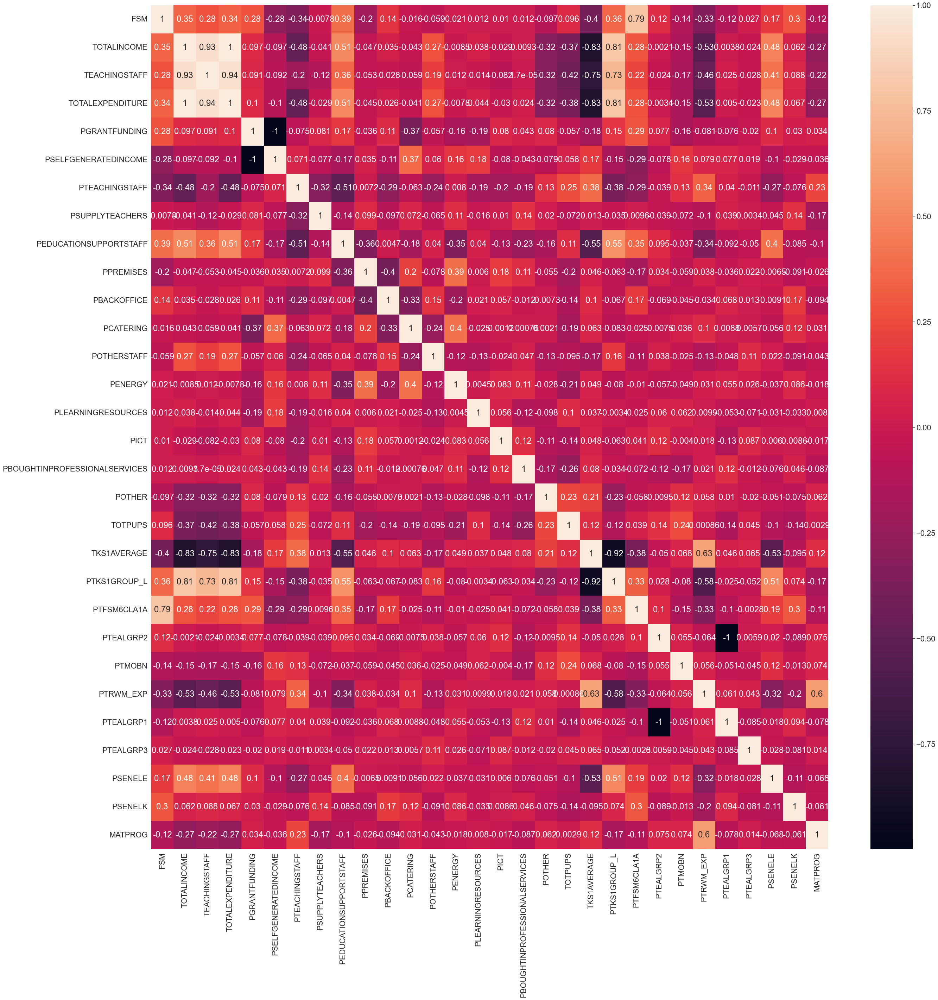

In [289]:
corr_maths=Allcohort_continuos_maths.corr() #sets the correlation
features=corr_maths.index
plt.figure(figsize=(40,40)) #plots the figure with the stated size
sns.heatmap(Allcohort_continuos_maths[features].corr(),annot=True) #plots heatmap

GETTING THE DEPENDENCIES OF THE INDEPENDENT VARIABLES ON WRITING

In [290]:
# Example of the Pearson's Correlation test
from scipy.stats import pearsonr

for column in Allcohort_continuos_writing.columns: 
    data1 = Allcohort_continuos_writing[column] #getting the each of the independent variable on after the other with the function
    data2 = Allcohort_continuos_writing['WRITPROG'] #getting the target variable - a series
    stat, p = pearsonr(data1, data2)
#     print('stat=%.2f, p=%.2f' % (stat, p)) # prints to 2 decimal place
    print( (stat, p))
    if p > 0.05: #since the significant value α = 0.05
        print(column, 'is Probably independent on WRITING') #print if variable is Probably independent to writing
    else:
        print(column,'is Probably dependent on WRITING') #print if variable is Probably dependent to writing

#Reference: https://machinelearningmastery.com/statistical-hypothesis-tests-in-python-cheat-sheet/

(-0.09100933615322504, 0.115715740105517)
FSM is Probably independent on WRITING
(-0.22955478463559326, 5.9919753589682356e-05)
TOTALINCOME is Probably dependent on WRITING
(-0.17242427676956817, 0.002731139185275)
TEACHINGSTAFF is Probably dependent on WRITING
(-0.2292130819205621, 6.149783751074452e-05)
TOTALEXPENDITURE is Probably dependent on WRITING
(0.022441886138483313, 0.6986592911184427)
PGRANTFUNDING is Probably independent on WRITING
(-0.026632126636373724, 0.6459198334793506)
PSELFGENERATEDINCOME is Probably independent on WRITING
(0.18122076863982065, 0.0016222881682022743)
PTEACHINGSTAFF is Probably dependent on WRITING
(-0.067783309436109, 0.241805136326983)
PSUPPLYTEACHERS is Probably independent on WRITING
(-0.20323454352195713, 0.0003963969839939707)
PEDUCATIONSUPPORTSTAFF is Probably dependent on WRITING
(0.07232774277589402, 0.21160654070034393)
PPREMISES is Probably independent on WRITING
(-0.054342597427747545, 0.3482416775513729)
PBACKOFFICE is Probably independe

GETTING THE DEPENDENCIES OF THE INDEPENDENT VARIABLES ON WRITING

In [291]:
for column in Allcohort_continuos_reading.columns:
    data1 = Allcohort_continuos_reading[column] #getting the each of the independent variable on after the other with the function
    data2 = Allcohort_continuos_reading['READPROG'] #getting the target variable - a series
    stat, p = pearsonr(data1, data2)
#     print('stat=%.2f, p=%.2f' % (stat, p)) # prints to 2 decimal place
    print( (stat, p))
    if p > 0.05: #since the significant value α = 0.05
        print(column, 'is Probably independent on READING') #print if variable is Probably independent to reading
    else:
        print(column,'is Probably dependent on READING') #print if variable is Probably dependent to reading

(-0.2380961702712918, 3.0889395802335157e-05)
FSM is Probably dependent on READING
(-0.24350529545479044, 2.004494412987907e-05)
TOTALINCOME is Probably dependent on READING
(-0.22145835662349533, 0.00010978007548754836)
TEACHINGSTAFF is Probably dependent on READING
(-0.24478354321226858, 1.807121876177361e-05)
TOTALEXPENDITURE is Probably dependent on READING
(-0.022808340017023063, 0.6939841820962904)
PGRANTFUNDING is Probably independent on READING
(0.022317108616226062, 0.7002537751339168)
PSELFGENERATEDINCOME is Probably independent on READING
(0.10890820852714617, 0.05955437164563567)
PTEACHINGSTAFF is Probably independent on READING
(-0.06880038016124536, 0.23479754158833846)
PSUPPLYTEACHERS is Probably independent on READING
(-0.10806232484506381, 0.061572992640452025)
PEDUCATIONSUPPORTSTAFF is Probably independent on READING
(0.034737814883395814, 0.548942365427519)
PPREMISES is Probably independent on READING
(-0.018337658950095554, 0.7517609828867696)
PBACKOFFICE is Probabl

GETTING THE DEPENDENCIES OF THE INDEPENDENT VARIABLES ON MATHS

In [292]:
for column in Allcohort_continuos_maths.columns:
    data1 = Allcohort_continuos_maths[column] #getting the each of the independent variable on after the other with the function
    data2 = Allcohort_continuos_maths['MATPROG'] #getting the target variable - a series
    stat, p = pearsonr(data1, data2)
    print( (stat, p))#prints statistic and p-value
    if p > 0.05:  #since the significant value α = 0.05
        print(column, 'is Probably independent on MATHS')  #print if variable is Probably independent to maths
    else:
        print(column,'is Probably dependent on MATHS') #print if variable is Probably dependent to maths

(-0.12348351469201596, 0.03251206630861645)
FSM is Probably dependent on MATHS
(-0.2687099203263858, 2.336619967264512e-06)
TOTALINCOME is Probably dependent on MATHS
(-0.22053363179313146, 0.00011747750806389898)
TEACHINGSTAFF is Probably dependent on MATHS
(-0.27215896989032123, 1.7109259624980623e-06)
TOTALEXPENDITURE is Probably dependent on MATHS
(0.03358522986501919, 0.5622867368109865)
PGRANTFUNDING is Probably independent on MATHS
(-0.036031303066310985, 0.5341542479629965)
PSELFGENERATEDINCOME is Probably independent on MATHS
(0.23208447505690316, 4.9369580649974995e-05)
PTEACHINGSTAFF is Probably dependent on MATHS
(-0.17434359672593902, 0.002442666210347252)
PSUPPLYTEACHERS is Probably dependent on MATHS
(-0.10331057363435872, 0.07398515442386074)
PEDUCATIONSUPPORTSTAFF is Probably independent on MATHS
(-0.02624728247630763, 0.6506953466975989)
PPREMISES is Probably independent on MATHS
(-0.09385143739803947, 0.10472819582911236)
PBACKOFFICE is Probably independent on MATHS


#    Ploting a bar chart from the values to show the imporatance of the independent variables (related to the dependent or target varable- Math Progress)

Note: A function was created to 

In [293]:
keys_maths=[]
Values_maths = []
for column in Allcohort_continuos_maths.columns:
    data1_maths = Allcohort_continuos_maths[column] #getting the each of the independent variable on after the other with the function
    data2_maths = Allcohort_continuos_maths['MATPROG'] #getting the target variable - a series
    stat, p = pearsonr(data1_maths, data2_maths)
    if p < 0.05: #since the significant value α = 0.05
#         print(column, p)
        keys_maths.append(column)
        Values_maths.append(p)
print(keys_maths) #gives a list of the columns that are related to average progress which is the target variable
print(Values_maths) #gives the p-values (probably dependent p-values) 

['FSM', 'TOTALINCOME', 'TEACHINGSTAFF', 'TOTALEXPENDITURE', 'PTEACHINGSTAFF', 'PSUPPLYTEACHERS', 'TKS1AVERAGE', 'PTKS1GROUP_L', 'PTRWM_EXP', 'MATPROG']
[0.03251206630861645, 2.336619967264512e-06, 0.00011747750806389898, 1.7109259624980623e-06, 4.9369580649974995e-05, 0.002442666210347252, 0.04213547350088167, 0.003312797524147807, 1.3919466098297467e-30, 0.0]


Making a Dataframe from the 'probably dependent' continuous variable _ for maths

In [294]:
#Making a Dataframe from the 'probably dependent' continuous variable
Dependency_df_maths = pd.DataFrame(
    {'Maths Probably Dependent Column': keys_maths,
     'P-Values(maths)': Values_maths
    })

In [295]:
Dependency_df_maths #checking the dataframe

#NOTE : this will be merged later to categorical variable that are 'probably dependent' after anova test

,Maths Probably Dependent Column,P-Values(maths)
0,FSM,3.251207e-02
1,TOTALINCOME,2.336620e-06
2,TEACHINGSTAFF,1.174775e-04
3,TOTALEXPENDITURE,1.710926e-06
4,PTEACHINGSTAFF,4.936958e-05
5,PSUPPLYTEACHERS,2.442666e-03
6,TKS1AVERAGE,4.213547e-02
7,PTKS1GROUP_L,3.312798e-03
8,PTRWM_EXP,1.391947e-30
9,MATPROG,0.000000e+00


# Ploting a bar chart from the values to show the imporatance of the independent variables (related to the dependent or target varable- Reading Progress) 

Note: A function was created to 

In [296]:
keys_read=[]
Values_read = []
for column in Allcohort_continuos_reading.columns:
    data1_read = Allcohort_continuos_reading[column] #getting the each of the independent variable on after the other with the function
    data2_read = Allcohort_continuos_reading['READPROG'] #getting the target variable - a series
    stat, p = pearsonr(data1_read, data2_read)
    if p < 0.05: #since the significant value α = 0.05
#         print(column, p)
        keys_read.append(column)
        Values_read.append(p)
print(keys_read) #gives a list of the columns that are related to average progress which is the target variable
print(Values_read) #gives the p-values (probably dependent p-values)

['FSM', 'TOTALINCOME', 'TEACHINGSTAFF', 'TOTALEXPENDITURE', 'TOTPUPS', 'PTKS1GROUP_L', 'PTFSM6CLA1A', 'PTRWM_EXP', 'READPROG']
[3.0889395802335157e-05, 2.004494412987907e-05, 0.00010978007548754836, 1.807121876177361e-05, 0.02974350571871543, 0.012056502780259161, 0.0007159956794132425, 2.476130868934974e-25, 0.0]


Making a Dataframe from the 'probably dependent' continuous variable _ for reading

In [297]:
#Making a Dataframe from the 'probably dependent' continuous variable
Dependency_df_reading = pd.DataFrame(
    {'Read Probably Dependent Column': keys_read,
     'P-Values(read)': Values_read
    })

In [298]:
Dependency_df_reading #checking the dataframe

#NOTE : this will be merged later to categorical variable that are 'probably dependent' after anova test

,Read Probably Dependent Column,P-Values(read)
0,FSM,3.088940e-05
1,TOTALINCOME,2.004494e-05
2,TEACHINGSTAFF,1.097801e-04
3,TOTALEXPENDITURE,1.807122e-05
4,TOTPUPS,2.974351e-02
5,PTKS1GROUP_L,1.205650e-02
6,PTFSM6CLA1A,7.159957e-04
7,PTRWM_EXP,2.476131e-25
8,READPROG,0.000000e+00


# # Ploting a bar chart from the values to show the imporatance of the independent variables (related to the dependent or target varable- writing Progress) 

Note: A function was created to 

In [299]:
keys_writ=[]
Values_writ = []
for column in Allcohort_continuos_writing.columns:
    data1_write = Allcohort_continuos_writing[column] #getting the each of the independent variable on after the other with the function
    data2_write = Allcohort_continuos_writing['WRITPROG'] #getting the target variable - a series
    stat, p = pearsonr(data1_write, data2_write)
    if p < 0.05: #since the significant value α = 0.05
#         print(column, p)
        keys_writ.append(column)
        Values_writ.append(p)
print(keys_writ) #gives a list of the columns that are related to average progress which is the target variable
print(Values_writ) #gives the p-values (probably dependent p-values)

['TOTALINCOME', 'TEACHINGSTAFF', 'TOTALEXPENDITURE', 'PTEACHINGSTAFF', 'PEDUCATIONSUPPORTSTAFF', 'PTKS1GROUP_L', 'PTRWM_EXP', 'WRITPROG']
[5.9919753589682356e-05, 0.002731139185275, 6.149783751074452e-05, 0.0016222881682022743, 0.0003963969839939707, 0.0028121804018098, 3.1751919529971777e-19, 0.0]


Making a Dataframe from the 'probably dependent' continuous variable _ for writing

In [300]:
#Making a Dataframe from the 'probably dependent' continuous variable
Dependency_df_writing = pd.DataFrame(
    {'Writing Probably Dependent Column': keys_writ,
     'P-Values(writing)': Values_writ
    })
Dependency_df_writing

,Writing Probably Dependent Column,P-Values(writing)
0,TOTALINCOME,5.991975e-05
1,TEACHINGSTAFF,2.731139e-03
2,TOTALEXPENDITURE,6.149784e-05
3,PTEACHINGSTAFF,1.622288e-03
4,PEDUCATIONSUPPORTSTAFF,3.963970e-04
5,PTKS1GROUP_L,2.812180e-03
6,PTRWM_EXP,3.175192e-19
7,WRITPROG,0.000000e+00


# b)Average progress as target variable

In [301]:
#Continuos variable with the continuos dependent variable
Allcohort_continuos_df= Allcohorts_dataframe.drop((['NFTYPE' , 'RELDENOM', 'IMD', 'HLE','WRITPROG', 'MATPROG', 'READPROG']), axis=1)

In [302]:
#dataframe with continuous variable alone
Allcohort_continuos_df.head(2)

,FSM,TOTALINCOME,TEACHINGSTAFF,TOTALEXPENDITURE,PGRANTFUNDING,PSELFGENERATEDINCOME,PTEACHINGSTAFF,PSUPPLYTEACHERS,PEDUCATIONSUPPORTSTAFF,PPREMISES,PBACKOFFICE,PCATERING,POTHERSTAFF,PENERGY,PLEARNINGRESOURCES,PICT,PBOUGHTINPROFESSIONALSERVICES,POTHER,TOTPUPS,TKS1AVERAGE,PTKS1GROUP_L,PTFSM6CLA1A,PTEALGRP2,PTMOBN,PTRWM_EXP,PTEALGRP1,PTEALGRP3,PSENELE,PSENELK,Average Progress,Year
0,18.2,4674.0,2019.0,4432.0,97.0,3.0,46.0,1.0,21.0,7.0,6.0,3.0,5.0,1.0,3.0,2.0,3.0,4.0,216.0,15.8,13.0,26.0,0.0,91.0,52.0,100.0,0.0,9.0,26.0,-1.933333,2016
1,4.1,4686.0,2061.0,4795.0,93.0,7.0,43.0,3.0,18.0,4.0,10.0,4.0,5.0,1.0,5.0,2.0,4.0,1.0,114.0,17.1,6.0,12.0,0.0,94.0,59.0,100.0,0.0,0.0,12.0,-0.366667,2016


<AxesSubplot:>

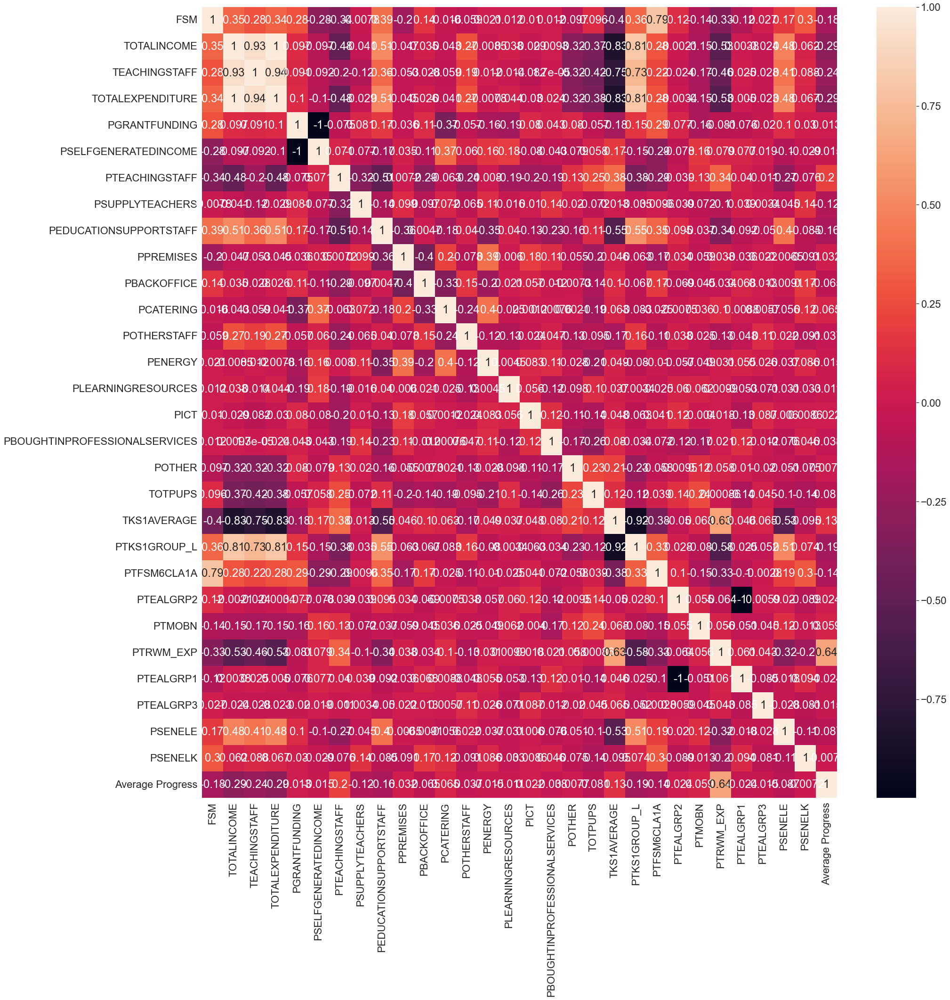

In [303]:
import seaborn as sns #imports seaborn library
corr=Allcohort_continuos_df.corr() #gets the 'pairwise' correlation of the continous dataframe
features=corr.index
plt.figure(figsize=(30,30)) #setting the figure size
sns.heatmap(Allcohort_continuos_df[features].corr(),annot=True) #plots the heat map

In [304]:
#Getting a Dataframe that has all the scores of the variables with the Average progress
corr.drop(['FSM', 'TOTALINCOME', 'TEACHINGSTAFF', 'TOTALEXPENDITURE',
       'PGRANTFUNDING', 'PSELFGENERATEDINCOME', 'PTEACHINGSTAFF',
       'PSUPPLYTEACHERS', 'PEDUCATIONSUPPORTSTAFF', 'PPREMISES', 'PBACKOFFICE',
       'PCATERING', 'POTHERSTAFF', 'PENERGY', 'PLEARNINGRESOURCES', 'PICT',
       'PBOUGHTINPROFESSIONALSERVICES', 'POTHER', 'TOTPUPS', 'TKS1AVERAGE',
       'PTKS1GROUP_L', 'PTFSM6CLA1A', 'PTEALGRP2', 'PTMOBN', 
       'PTEALGRP1', 'PTEALGRP3', 'PSENELE', 'PSENELK'])

,FSM,TOTALINCOME,TEACHINGSTAFF,TOTALEXPENDITURE,PGRANTFUNDING,PSELFGENERATEDINCOME,PTEACHINGSTAFF,PSUPPLYTEACHERS,PEDUCATIONSUPPORTSTAFF,PPREMISES,PBACKOFFICE,PCATERING,POTHERSTAFF,PENERGY,PLEARNINGRESOURCES,PICT,PBOUGHTINPROFESSIONALSERVICES,POTHER,TOTPUPS,TKS1AVERAGE,PTKS1GROUP_L,PTFSM6CLA1A,PTEALGRP2,PTMOBN,PTRWM_EXP,PTEALGRP1,PTEALGRP3,PSENELE,PSENELK,Average Progress
PTRWM_EXP,-0.333224,-0.528686,-0.462059,-0.532614,-0.080922,0.078513,0.339643,-0.099996,-0.337746,0.037584,-0.033622,0.102332,-0.132305,0.031362,0.009879,0.017676,0.021091,0.058323,0.000859,0.628900,-0.584454,-0.327932,-0.064413,0.056161,1.000000,0.060593,0.043069,-0.322673,-0.201414,0.636916
Average Progress,-0.176587,-0.288501,-0.239087,-0.290204,0.012705,-0.015466,0.202707,-0.120690,-0.161123,0.031521,-0.064531,0.064796,-0.036996,-0.014761,-0.011094,0.022208,-0.037655,0.007695,-0.080678,0.131669,-0.188847,-0.143200,0.023619,0.058536,0.636916,-0.024157,-0.015442,-0.087039,-0.007223,1.000000


Turning the year to float type to enable machine learning and further analysis

In [305]:
#Turning the year to float type to enable machine learning and further analysis

Allcohort_continuos_df['Year']=[float(i) for i in Allcohort_continuos_df['Year']]

In [306]:
#Reference: https://machinelearningmastery.com/statistical-hypothesis-tests-in-python-cheat-sheet/
# Example of the Pearson's Correlation test
from scipy.stats import pearsonr

for column in Allcohort_continuos_df.columns:
    data1 = Allcohort_continuos_df[column] #getting the each of the independent variable on after the other with the function
    data2 = Allcohort_continuos_df['Average Progress'] #getting the target variable - a series
    stat, p = pearsonr(data1, data2)
    print( (stat, p))
    if p > 0.05: #since the significant value α = 0.05
        print(column, 'is Probably independent') #print if variable is Probably independent to Average Progress
    else:
        print(column,'is Probably dependent') #print if variable is Probably dependent to Average Progress
    
    
    

(-0.17658703979501297, 0.002140806277444201)
FSM is Probably dependent
(-0.2885010454637177, 3.6831192528506935e-07)
TOTALINCOME is Probably dependent
(-0.2390871118150125, 2.855807806138936e-05)
TEACHINGSTAFF is Probably dependent
(-0.2902044962940043, 3.1204228145327475e-07)
TOTALEXPENDITURE is Probably dependent
(0.012705068476553267, 0.8265344376387082)
PGRANTFUNDING is Probably independent
(-0.015466369894020261, 0.7896362374494263)
PSELFGENERATEDINCOME is Probably independent
(0.2027069813853781, 0.0004107490915761107)
PTEACHINGSTAFF is Probably dependent
(-0.12069029178136988, 0.03667771714577384)
PSUPPLYTEACHERS is Probably dependent
(-0.16112256271662148, 0.005151984319499408)
PEDUCATIONSUPPORTSTAFF is Probably dependent
(0.031520807775616014, 0.5865705977559096)
PPREMISES is Probably independent
(-0.06453133155220586, 0.2651886529859313)
PBACKOFFICE is Probably independent
(0.06479611243303386, 0.26322870130094317)
PCATERING is Probably independent
(-0.03699592721464913, 0.52

# Creating a correlation matrix for the top  features

The dependent variables are described by the ones with lowest p -values.

# Top continous correlated variables with p-values that implies dependence is plotted in the heatmap below

In [307]:
#creating a dataframe for top continous correlated variables to view on pearson corrleation heatmap
top_cor_df = Allcohort_continuos_df.drop(Allcohort_continuos_df.columns.difference(['TOTALEXPENDITURE','TOTALINCOME','TEACHINGSTAFF','PTEACHINGSTAFF','PTKS1GROUP_L','FSM','PEDUCATIONSUPPORTSTAFF','PTFSM6CLA1A','TKS1AVERAGE','PSUPPLYTEACHERS','Average Progress']), axis=1)

<AxesSubplot:>

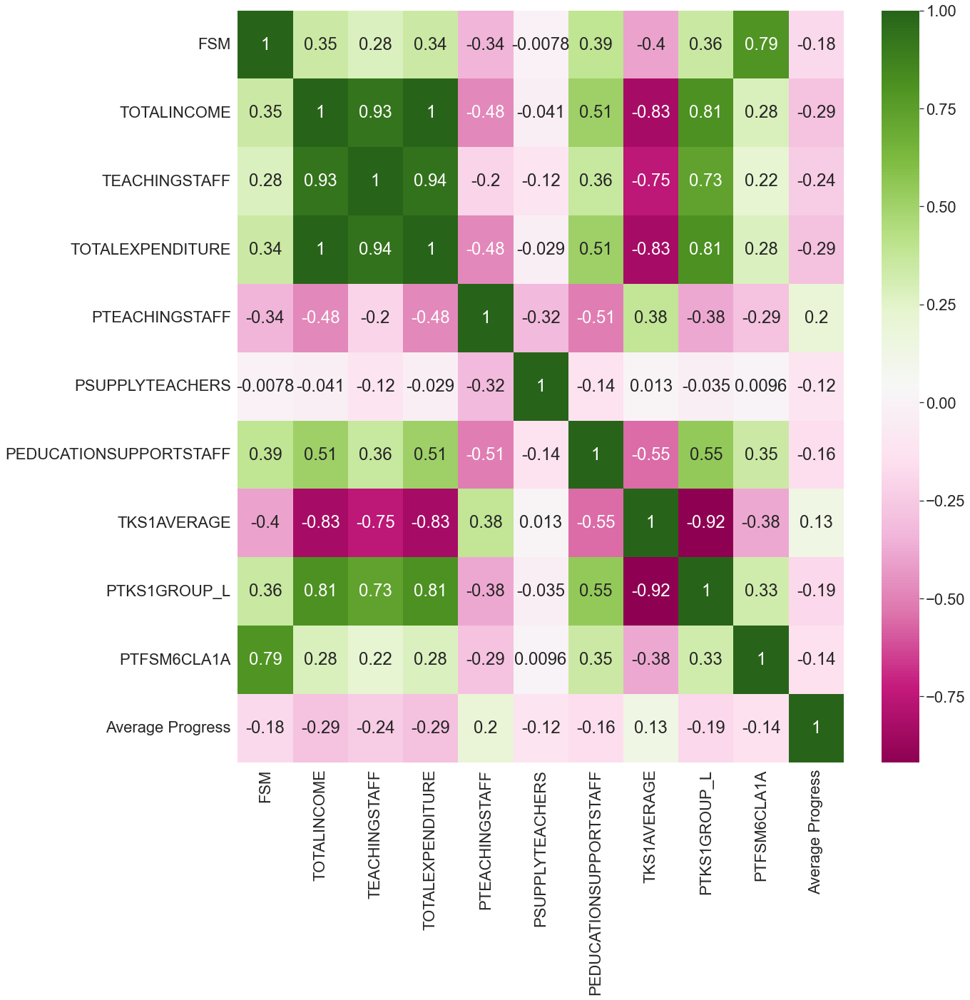

In [308]:
from matplotlib import pyplot
corr=top_cor_df.corr() #gets the 'pairwise' correlation of the continous dataframe
features_17=corr_17.index
features=corr.index
colormap = pyplot.cm.PiYG
plt.figure(figsize=(20,20)) #setting the figure size
sns.heatmap(top_cor_df[features].corr(),cmap=colormap,annot=True) #plots the heat map

#   Ploting a bar chart from the values to show the imporatance of the independent variables (related to the dependent or target varable- Average Progress)

Note: A function was created to 

In [309]:
keys=[]
Values = []
for column in Allcohort_continuos_df.columns:
    data1 = Allcohort_continuos_df[column] #getting the each of the independent variable on after the other with the function
    data2 = Allcohort_continuos_df['Average Progress'] #getting the target variable - a series
    stat, p = pearsonr(data1, data2)
    if p < 0.05: #since the significant value α = 0.05
#         print(column, p)
        keys.append(column)
        Values.append(p)
print(keys) #gives a list of the columns that are related to average progress which is the target variable
print(Values) #gives the p-values (probably dependent p-values)        

['FSM', 'TOTALINCOME', 'TEACHINGSTAFF', 'TOTALEXPENDITURE', 'PTEACHINGSTAFF', 'PSUPPLYTEACHERS', 'PEDUCATIONSUPPORTSTAFF', 'TKS1AVERAGE', 'PTKS1GROUP_L', 'PTFSM6CLA1A', 'PTRWM_EXP', 'Average Progress']
[0.002140806277444201, 3.6831192528506935e-07, 2.855807806138936e-05, 3.1204228145327475e-07, 0.0004107490915761107, 0.03667771714577384, 0.005151984319499408, 0.02254836911370768, 0.0010129769920099827, 0.013036995439075653, 1.5463455015267378e-35, 0.0]


Making a Dataframe from the 'probably dependent' continuous variable

In [310]:
#Making a Dataframe from the 'probably dependent' continuous variable
Dependency_df = pd.DataFrame(
    {'Probably Dependent Column': keys,
     'P-Values': Values
    })

In [311]:
Dependency_df #checking the dataframe

#NOTE : this will be merged later to categorical variable that are 'probably dependent' after anova test

,Probably Dependent Column,P-Values
0,FSM,2.140806e-03
1,TOTALINCOME,3.683119e-07
2,TEACHINGSTAFF,2.855808e-05
3,TOTALEXPENDITURE,3.120423e-07
4,PTEACHINGSTAFF,4.107491e-04
5,PSUPPLYTEACHERS,3.667772e-02
6,PEDUCATIONSUPPORTSTAFF,5.151984e-03
7,TKS1AVERAGE,2.254837e-02
8,PTKS1GROUP_L,1.012977e-03
9,PTFSM6CLA1A,1.303700e-02


# Inferential Statistics... Categorical variables (independent) and Continuos( dependent)

In [312]:
#checking for the categorical variables first

Allcohort_Categorical_df= Allcohorts_dataframe.drop(Allcohorts_dataframe.columns.difference([ 'NFTYPE' , 'RELDENOM', 'IMD', 'HLE','Average Progress']), axis=1)
Allcohort_Categorical_df

,NFTYPE,RELDENOM,IMD,HLE,Average Progress
0,3,3,7.0,7.0,-1.933333
1,6,1,1.0,2.0,-0.366667
2,4,3,4.0,4.0,-9.533333
3,8,1,5.0,4.0,-0.500000
4,8,1,2.0,2.0,-0.900000
5,4,3,2.0,2.0,-3.966667
6,7,2,10.0,10.0,0.066667
7,7,1,2.0,4.0,6.833333
8,7,2,4.0,5.0,-3.366667
9,8,1,2.0,2.0,0.966667


In [313]:
#Using Anova Hypothesis testing
#SUMARY OF THE CATEGORICAL INDEPENDENT VARIABLE: this shows the count of each level of varibale
#and percentage 

rp.summary_cat(Allcohort_Categorical_df[['NFTYPE' , 'RELDENOM', 'IMD', 'HLE']])

#Reference: https://www.pythonfordatascience.org/factorial-anova-python/

,Variable,Outcome,Count,Percent
0,NFTYPE,3.0,177,59.00
1,,8.0,88,29.33
2,,7.0,21,7.00
3,,6.0,8,2.67
4,,4.0,6,2.00
5,RELDENOM,3.0,185,61.67
6,,1.0,100,33.33
7,,2.0,15,5.00
8,IMD,2.0,68,22.67
9,,5.0,53,17.67


In [314]:
#Summary of the dependent
rp.summary_cont(Allcohort_Categorical_df["Average Progress"])

,Variable,N,Mean,SD,SE,95% Conf.,Interval
0,Average Progress,300.0,-0.4181,2.2534,0.1301,-0.6741,-0.1621


# USING ANOVA for the Categorical Variables

The Avegarge Progress as given by ANOVA is probably deoendent on the categorical variables as proven in below codes. The p values for each independent categorical variables is lower than the significant vallue of 0.05. Hence, reject the null hypothesis

In [315]:
# Importing the library for one-way anova
from scipy.stats import f_oneway
 
schltype = Allcohort_Categorical_df['NFTYPE'] #gets series made of categorical variable school type
religion_sch= Allcohort_Categorical_df['RELDENOM'] #gets series made of categorical variable religion type
IMD = Allcohort_Categorical_df['IMD'] #gets series made of Indices of multiple deprivation
HLE =Allcohort_Categorical_df['HLE']  #gets series made of healthy life expectancy
Average_prog = Allcohort_Categorical_df['Average Progress'] #gets series made of average progress (target or dependent variable)

 
# checking for the one-way ANOVA
f_oneway(schltype, Average_prog)




F_onewayResult(statistic=799.6525424240523, pvalue=2.4740291127317906e-112)

Checking for the one-way ANOVA for RELIGIOUS AFFILIATION

In [316]:
f_oneway(religion_sch, Average_prog)

F_onewayResult(statistic=367.92781336231127, pvalue=2.864359666428142e-64)

Checking for the one-way ANOVA for IMD

In [317]:
f_oneway(IMD, Average_prog)

F_onewayResult(statistic=553.9477768661159, pvalue=3.4424012812110558e-87)

Checking for the one-way ANOVA for HLE

In [318]:
f_oneway(HLE, Average_prog)

F_onewayResult(statistic=615.7462801091567, pvalue=5.488822300295477e-94)

Post-hoc Test

In [319]:
from statsmodels.stats.multicomp import pairwise_tukeyhsd

In [320]:
tukey = pairwise_tukeyhsd(endog=Average_prog,
                          groups=schltype,
                          alpha=0.05)

#display results
print(tukey)

#decoding the items of groups 1 and 2 below
# Community School implies 3
#Community Special School implies 4
#Foundation school implies 6
#voluntary aided school implies 7
#voluntary controlled school imples 8


Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj  lower  upper  reject
--------------------------------------------------
     3      4  -6.1476 0.001 -8.5333 -3.762   True
     3      6    0.494   0.9 -1.5833 2.5713  False
     3      7  -0.2651   0.9 -1.5915 1.0613  False
     3      8  -0.0139   0.9 -0.7636 0.7357  False
     4      6   6.6417 0.001  3.5379 9.7455   True
     4      7   5.8825 0.001  3.2222 8.5429   True
     4      8   6.1337 0.001  3.7088 8.5586   True
     6      7  -0.7591   0.9 -3.1469 1.6286  False
     6      8   -0.508   0.9 -2.6302 1.6143  False
     7      8   0.2512   0.9 -1.1446 1.6469  False
--------------------------------------------------


Creating a Dataframe for the 'probably dependent' variable and their respective p-values

In [321]:
data = {'Probably Dependent Column': ['School Type', 'Religious Affiliation', 'IMD', 'HLE'],
        'P-Values': ['2.4740291127317906e-112', '2.864359666428142e-64', '3.4424012812110558e-87', '5.488822300295477e-94']} 
Dependency_df_cat = pd.DataFrame.from_dict(data)
  
Dependency_df_cat

,Probably Dependent Column,P-Values
0,School Type,2.4740291127317906e-112
1,Religious Affiliation,2.864359666428142e-64
2,IMD,3.4424012812110558e-87
3,HLE,5.488822300295477e-94


Stacking the Dataframes....of 'probably dependent variables' for both categorical (i.e. Dependency_df_cat) and continuous variables (i.e. Dependency_df)

In [322]:
#To avoid truncation and approximation of the float values
pd.set_option('display.float_format', lambda x: '%.15f' % x)

In [323]:
#Stacking th dataframes

Dependency= Dependency_df.append([Dependency_df_cat], ignore_index=True)

In [324]:
Dependency #checking the dependency dataframe

,Probably Dependent Column,P-Values
0,FSM,0.002140806277444
1,TOTALINCOME,0.000000368311925
2,TEACHINGSTAFF,0.000028558078061
3,TOTALEXPENDITURE,0.000000312042281
4,PTEACHINGSTAFF,0.000410749091576
5,PSUPPLYTEACHERS,0.036677717145774
6,PEDUCATIONSUPPORTSTAFF,0.005151984319499
7,TKS1AVERAGE,0.022548369113708
8,PTKS1GROUP_L,0.001012976992010
9,PTFSM6CLA1A,0.013036995439076


Since the p-values are small, a new column of the logarithmic values will be created to plot

In [325]:
#converting the P-Values to float type
Dependency.drop([10,11], axis=0, inplace=True)
Dependency['P-Values']=[float(i) for i in Dependency['P-Values']]

In [326]:
Dependency['Log of P-Values']= -np.log(Dependency['P-Values'])

In [327]:
Dependency

,Probably Dependent Column,P-Values,Log of P-Values
0,FSM,0.002140806277444,6.146572755745706
1,TOTALINCOME,0.000000368311925,14.814335634749783
2,TEACHINGSTAFF,0.000028558078061,10.463570717526565
3,TOTALEXPENDITURE,0.000000312042281,14.980127140840148
4,PTEACHINGSTAFF,0.000410749091576,7.797528012671714
5,PSUPPLYTEACHERS,0.036677717145774,3.305585870559744
6,PEDUCATIONSUPPORTSTAFF,0.005151984319499,5.268373333760142
7,TKS1AVERAGE,0.022548369113708,3.792092538766068
8,PTKS1GROUP_L,0.001012976992010,6.894861766698126
9,PTFSM6CLA1A,0.013036995439076,4.339964160146179


Replacing the accronyms of sum of the vata in the 'Probably Dependent Column'

In [328]:
Dependency['Probably Dependent Column'] =  Dependency['Probably Dependent Column'].apply(lambda x: 'Total income' if x=='TOTALINCOME' else 
                                                                                                 ('Teachers salaries' if x=='TEACHINGSTAFF' else 
                                                                                                ('Total Expenditure' if x=='TOTALEXPENDITURE' else 
                                                                                                ('Expenditure spent on teaching staff (%)' if x=='PTEACHINGSTAFF' else 
                                                                                                ('Expenditure spent on supply teaching staff (%)' if x=='PSUPPLYTEACHERS' else 
                                                                                                ('Expenditure spent on Education support staff (%)'if x=='PEDUCATIONSUPPORTSTAFF' else 
                                                                                                ('Cohort level KS 1 score'if x=='TKS1AVERAGE' else 
                                                                                                ('Pupils in cohort with low KS1 attainment (%)'if x=='PTKS1GROUP_L' else 
                                                                                                 ('Percentage of KS2 disadvantaged pupils' if x=='PTFSM6CLA1A' else x)))))))))

# Visalizing the level of dependency between independent variable that influences academic progress ot attainment

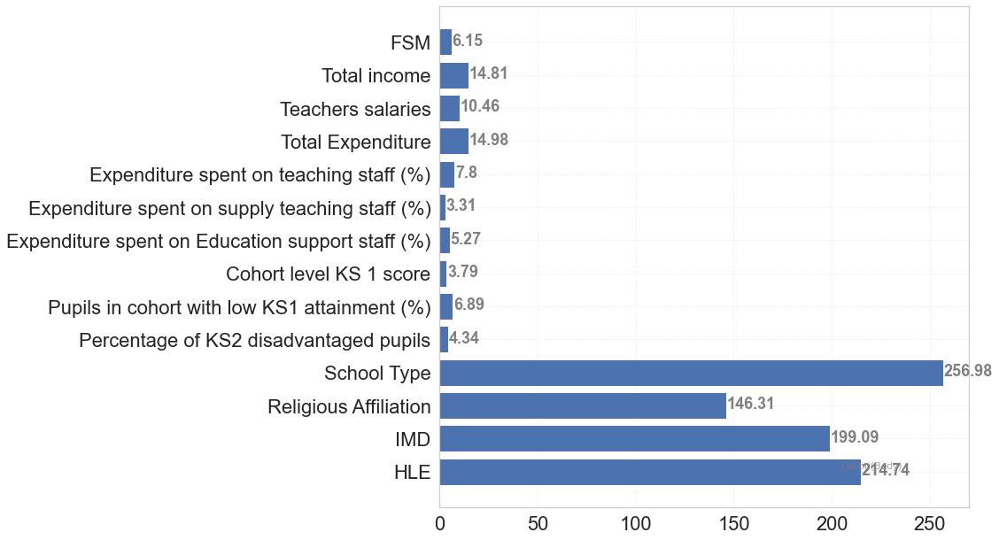

In [329]:
# Setting the size of figure
fig, ax = plt.subplots(figsize =(16, 9))
 
# Ploting a horizontal barchart
ax.barh(Dependency['Probably Dependent Column'], Dependency['Log of P-Values'])
 
#gridlines x, y 
ax.grid(b = True, color ='grey',
        linestyle ='-.', linewidth = 0.5,
        alpha = 0.2)
 
# Show top values
ax.invert_yaxis()
 
# Add annotation to bars
for i in ax.patches:
    plt.text(i.get_width()+0.2, i.get_y()+0.5,
             str(round((i.get_width()), 2)),
             fontsize = 18, fontweight ='bold',
             color ='grey')
 

fig.text(0.9, 0.15, 'Calibri(Body)', fontsize = 12,color ='grey', ha ='right', va ='bottom',alpha = 0.7)
# show the chart
plt.show()




#Reference: https://www.geeksforgeeks.org/bar-plot-in-matplotlib/

In [330]:
#Setting float numbers to 2 decimal places again
pd.set_option('display.float_format', lambda x: '%.3f' % x)

GETTING THE DEPENDENCIES OF THE INDEPENDENT VARIABLES (CATIGORICAL) ON MATHS

In [331]:
#GETTING A dataframe where Maths becomes the dependent variable 
Allcohort_Categorical_df_MATHS= Allcohorts_dataframe.drop(Allcohorts_dataframe.columns.difference([ 'NFTYPE' , 'RELDENOM', 'IMD', 'HLE','MATPROG']), axis=1)
#checking
Allcohort_Categorical_df_MATHS.head(2)

,NFTYPE,RELDENOM,IMD,HLE,MATPROG
0,3,3,7.000,7.000,-2.500
1,6,1,1.000,2.000,-1.900


In [332]:
schltype = Allcohort_Categorical_df_MATHS['NFTYPE'] #gets series made of categorical variable school type
religion_sch= Allcohort_Categorical_df_MATHS['RELDENOM'] #gets series made of categorical variable religion type
IMD = Allcohort_Categorical_df_MATHS['IMD'] #gets series made of Indices of multiple deprivation
HLE =Allcohort_Categorical_df_MATHS['HLE'] #gets series made of healthy life expectancy
#series for target variables to be compared
MATH_prog = Allcohort_Categorical_df_MATHS['MATPROG'] #gets series made of methematics (target or dependent variable) 

 
# checking for the one-way ANOVA with maths as target variable
f_oneway(schltype, MATH_prog)


F_onewayResult(statistic=783.5232716520297, pvalue=7.99026327849344e-111)

Checking for the one-way ANOVA for RELIGIOUS AFFILIATION with maths as target variable

In [333]:
f_oneway(religion_sch, MATH_prog)

F_onewayResult(statistic=367.0778217068806, pvalue=3.729533081361147e-64)

Checking for the one-way ANOVA for HLE with maths as target variable

In [334]:
f_oneway(HLE, MATH_prog)

F_onewayResult(statistic=615.3331464976085, pvalue=6.077956989375779e-94)

Checking for the one-way ANOVA for IMD with maths as target variable

In [335]:
f_oneway(IMD, MATH_prog)

F_onewayResult(statistic=558.7854958638753, pvalue=9.810632344848959e-88)

Creating a Dataframe for the 'probably dependent' variable and their respective p-values for Maths

In [336]:
data_maths = {'Maths Probably Dependent Column': ['School Type', 'Religious Affiliation', 'IMD', 'HLE'],
        'P-Values(maths)': ['7.99026327849344e-111', '3.729533081361147e-64', '9.810632344848959e-88', '6.077956989375779e-94']} 
Dependency_df_cat_maths = pd.DataFrame.from_dict(data_maths)
  
Dependency_df_cat_maths

,Maths Probably Dependent Column,P-Values(maths)
0,School Type,7.99026327849344e-111
1,Religious Affiliation,3.729533081361147e-64
2,IMD,9.810632344848959e-88
3,HLE,6.077956989375779e-94


Stacking the maths Dataframes....of 'probably dependent variables' for both categorical (i.e. Dependency_df_cat) and continuous variables (i.e. Dependency_df)

In [337]:
#To avoid truncation and approximation of the float values
pd.set_option('display.float_format', lambda x: '%.8f' % x)

In [338]:
#Stacking th dataframes

Dependency_maths= Dependency_df_maths.append([Dependency_df_cat_maths], ignore_index=True)

In [339]:
Dependency_maths

,Maths Probably Dependent Column,P-Values(maths)
0,FSM,0.03251207
1,TOTALINCOME,0.00000234
2,TEACHINGSTAFF,0.00011748
3,TOTALEXPENDITURE,0.00000171
4,PTEACHINGSTAFF,0.00004937
5,PSUPPLYTEACHERS,0.00244267
6,TKS1AVERAGE,0.04213547
7,PTKS1GROUP_L,0.00331280
8,PTRWM_EXP,0.00000000
9,MATPROG,0.00000000


Since the p-values are small, a new column of the logarithmic values will be created to plot

In [340]:
#converting the P-Values to float type
Dependency_maths.drop([8,9], axis=0, inplace=True)
Dependency_maths['P-Values(maths)']=[float(i) for i in Dependency_maths['P-Values(maths)']]

Replacing the accronyms of sum of the vata in the 'Probably Dependent Column'

In [341]:
Dependency_maths['Maths Probably Dependent Column'] =  Dependency_maths['Maths Probably Dependent Column'].apply(lambda x: 'Total income' if x=='TOTALINCOME' else 
                                                                                                 ('Teachers salaries' if x=='TEACHINGSTAFF' else 
                                                                                                ('Total Expenditure' if x=='TOTALEXPENDITURE' else 
                                                                                                ('Expenditure spent on teaching staff (%)' if x=='PTEACHINGSTAFF' else 
                                                                                                ('Expenditure spent on supply teaching staff (%)' if x=='PSUPPLYTEACHERS' else 
                                                                                                ('Cohort level KS 1 score'if x=='TKS1AVERAGE' else 
                                                                                                ('Pupils in cohort with low KS1 attainment (%)'if x=='PTKS1GROUP_L' else x)))))))

In [342]:
Dependency_maths['Log of P-Values(maths)']= -np.log(Dependency_maths['P-Values(maths)'])

In [343]:
Dependency_maths

,Maths Probably Dependent Column,P-Values(maths),Log of P-Values(maths)
0,FSM,0.03251207,3.42614399
1,Total income,0.00000234,12.96680513
2,Teachers salaries,0.00011748,9.04926366
3,Total Expenditure,0.00000171,13.27847584
4,Expenditure spent on teaching staff (%),0.00004937,9.91617610
5,Expenditure spent on supply teaching staff (%),0.00244267,6.01466513
6,Cohort level KS 1 score,0.04213547,3.16686529
7,Pupils in cohort with low KS1 attainment (%),0.00331280,5.70996227
10,School Type,0.00000000,253.50872161
11,Religious Affiliation,0.00000000,146.04916291


# Visalizing the level of dependency between independent variable that influences maths

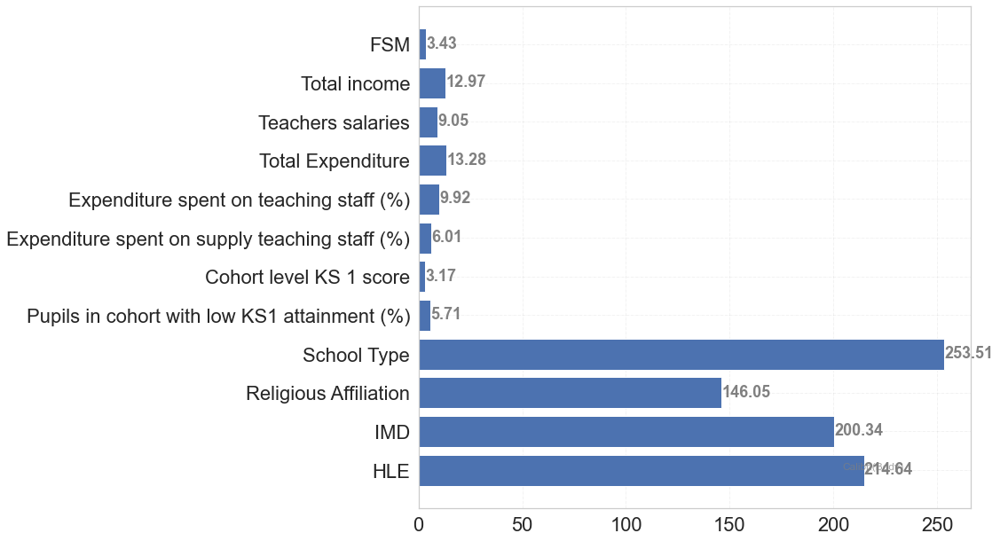

In [344]:
# Setting the size of figure
fig, ax = plt.subplots(figsize =(16, 9))
 
# Ploting a horizontal barchart
ax.barh(Dependency_maths['Maths Probably Dependent Column'], Dependency_maths['Log of P-Values(maths)'])
 
#gridlines x, y 
ax.grid(b = True, color ='grey',
        linestyle ='-.', linewidth = 0.5,
        alpha = 0.2)
 
# Show top values
ax.invert_yaxis()
 
# Add annotation to bars
for i in ax.patches:
    plt.text(i.get_width()+0.2, i.get_y()+0.5,
             str(round((i.get_width()), 2)),
             fontsize = 18, fontweight ='bold',
             color ='grey')
 

fig.text(0.9, 0.15, 'Calibri(Body)', fontsize = 12,color ='grey', ha ='right', va ='bottom',alpha = 0.7)
# show the chart
plt.show()




#Reference: https://www.geeksforgeeks.org/bar-plot-in-matplotlib/

GETTING THE DEPENDENCIES OF THE INDEPENDENT VARIABLES (CATEGORICAL) ON READING

In [345]:
#GETTING A dataframe where reading becomes the dependent variable 

Allcohort_Categorical_df_READ= Allcohorts_dataframe.drop(Allcohorts_dataframe.columns.difference([ 'NFTYPE' , 'RELDENOM', 'IMD', 'HLE','READPROG']), axis=1)
#checking
Allcohort_Categorical_df_READ.head(2)

,NFTYPE,RELDENOM,IMD,HLE,READPROG
0,3,3,7.00000000,7.00000000,-0.40000000
1,6,1,1.00000000,2.00000000,-2.00000000


In [346]:
#series for independent variables to be compared
schltype = Allcohort_Categorical_df_READ['NFTYPE'] #school type
religion_sch= Allcohort_Categorical_df_READ['RELDENOM'] #school religion
IMD = Allcohort_Categorical_df_READ['IMD'] #school Indices of multiple deprivation
HLE =Allcohort_Categorical_df_READ['HLE'] #school healthy life expectancy
#series for target variables to be compared
READ_prog = Allcohort_Categorical_df_READ['READPROG']

 
# checking for the one-way ANOVA
f_oneway(schltype, READ_prog)


F_onewayResult(statistic=659.0846265827772, pvalue=1.501859280851548e-98)

Checking for the one-way ANOVA for RELIGIOUS AFFILIATION with reading as target variable

In [347]:
f_oneway(religion_sch, READ_prog)

F_onewayResult(statistic=266.03002634167086, pvalue=9.530751668801913e-50)

Checking for the one-way ANOVA for IMD with READING as target variable

In [348]:
f_oneway(IMD, READ_prog)

F_onewayResult(statistic=458.31955909272676, pvalue=6.495834226888294e-76)

Checking for the one-way ANOVA for HLE with READING as target variable

In [349]:
f_oneway(HLE, READ_prog)

F_onewayResult(statistic=508.099476682904, pvalue=6.617211246271477e-82)

GETTING THE DEPENDENCIES OF THE INDEPENDENT VARIABLES (CATOGORICAL) ON WRITING

Creating a Dataframe for the 'probably dependent' variable and their respective p-values for reading

In [350]:
data_read = {'Read Probably Dependent Column': ['School Type', 'Religious Affiliation', 'IMD', 'HLE'],
        'P-Values(read)': ['1.501859280851548e-98', '9.530751668801913e-50', '6.495834226888294e-76', '6.617211246271477e-82']} 
Dependency_df_cat_read = pd.DataFrame.from_dict(data_read)
  
Dependency_df_cat_read

,Read Probably Dependent Column,P-Values(read)
0,School Type,1.501859280851548e-98
1,Religious Affiliation,9.530751668801913e-50
2,IMD,6.495834226888294e-76
3,HLE,6.617211246271477e-82


Stacking the reading Dataframes....of 'probably dependent variables' for both categorical (i.e. Dependency_df_cat_read) and continuous variables (i.e. Dependency_df_read)

In [351]:
# #To avoid truncation and approximation of the float values
# pd.set_option('display.float_format', lambda x: '%.8f' % x)

In [352]:
#Stacking th dataframes

Dependency_read= Dependency_df_reading.append([Dependency_df_cat_read], ignore_index=True)

In [353]:
Dependency_read

,Read Probably Dependent Column,P-Values(read)
0,FSM,0.00003089
1,TOTALINCOME,0.00002004
2,TEACHINGSTAFF,0.00010978
3,TOTALEXPENDITURE,0.00001807
4,TOTPUPS,0.02974351
5,PTKS1GROUP_L,0.01205650
6,PTFSM6CLA1A,0.00071600
7,PTRWM_EXP,0.00000000
8,READPROG,0.00000000
9,School Type,1.501859280851548e-98


Since the p-values are small, a new column of the logarithmic values will be created to plot

In [354]:
#converting the P-Values to float type
Dependency_read.drop([7,8], axis=0, inplace=True)
Dependency_read['P-Values(read)']=[float(i) for i in Dependency_read['P-Values(read)']]

Replacing the accronyms of sum of the vata in the 'Probably Dependent Column'

In [355]:
Dependency_read['Read Probably Dependent Column'] =  Dependency_read['Read Probably Dependent Column'].apply(lambda x: 'Total income' if x=='TOTALINCOME' else 
                                                                                                 ('Teachers salaries' if x=='TEACHINGSTAFF' else 
                                                                                                ('Total Expenditure' if x=='TOTALEXPENDITURE' else 
                                                                                                ('Total Population' if x=='TOTPUPS' else 
                                                                                                ('Percentage of KS2 disadvantaged pupils' if x=='PTFSM6CLA1A' else 
                                                                                                
                                                                                                ('Pupils in cohort with low KS1 attainment (%)'if x=='PTKS1GROUP_L' else x))))))

In [356]:
Dependency_read

,Read Probably Dependent Column,P-Values(read)
0,FSM,0.00003089
1,Total income,0.00002004
2,Teachers salaries,0.00010978
3,Total Expenditure,0.00001807
4,Total Population,0.02974351
5,Pupils in cohort with low KS1 attainment (%),0.01205650
6,Percentage of KS2 disadvantaged pupils,0.00071600
9,School Type,0.00000000
10,Religious Affiliation,0.00000000
11,IMD,0.00000000


In [357]:
Dependency_read['Log of P-Values(reading)']= -np.log(Dependency_read['P-Values(read)'])

# Visalizing the level of dependency between independent variable that influences reading

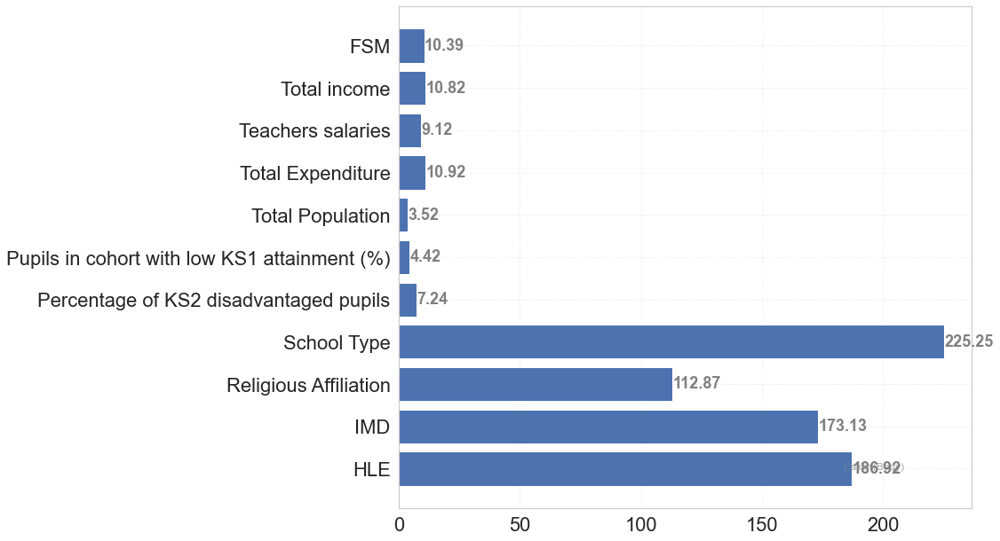

In [358]:
# Setting the size of figure
fig, ax = plt.subplots(figsize =(16, 9))
 
# Ploting a horizontal barchart
ax.barh(Dependency_read['Read Probably Dependent Column'], Dependency_read['Log of P-Values(reading)'])
 
#gridlines x, y 
ax.grid(b = True, color ='grey',
        linestyle ='-.', linewidth = 0.5,
        alpha = 0.2)
 
# Show top values
ax.invert_yaxis()
 
# Add annotation to bars
for i in ax.patches:
    plt.text(i.get_width()+0.2, i.get_y()+0.5,
             str(round((i.get_width()), 2)),
             fontsize = 18, fontweight ='bold',
             color ='grey')
 

fig.text(0.9, 0.15, 'Calibri(Body)', fontsize = 12,color ='grey', ha ='right', va ='bottom',alpha = 0.7)
# show the chart
plt.show()




#Reference: https://www.geeksforgeeks.org/bar-plot-in-matplotlib/

GETTING THE DEPENDENCIES OF THE INDEPENDENT VARIABLES (CATOGORICAL) ON WRITING

In [359]:
#GETTING A dataframe where writing becomes the dependent variable 

Allcohort_Categorical_df_WRITING= Allcohorts_dataframe.drop(Allcohorts_dataframe.columns.difference([ 'NFTYPE' , 'RELDENOM', 'IMD', 'HLE','WRITPROG']), axis=1)
#checking
Allcohort_Categorical_df_WRITING.head(2)

,NFTYPE,RELDENOM,IMD,HLE,WRITPROG
0,3,3,7.00000000,7.00000000,-2.90000000
1,6,1,1.00000000,2.00000000,2.80000000


In [360]:
#series for independent variables to be compared
schltype = Allcohort_Categorical_df_WRITING['NFTYPE'] #school type
religion_sch= Allcohort_Categorical_df_WRITING['RELDENOM'] #school religion
IMD = Allcohort_Categorical_df_WRITING['IMD'] #school Indices of multiple deprivation
HLE =Allcohort_Categorical_df_WRITING['HLE'] #school healthy life expectancy
#series for target variables to be compared
WRITING_prog = Allcohort_Categorical_df_WRITING['WRITPROG']

 
# checking for the one-way ANOVA
f_oneway(schltype, WRITING_prog)


F_onewayResult(statistic=602.5831588663818, pvalue=1.4379782204838878e-92)

Checking for the one-way ANOVA for RELIGIOUS AFFILIATION with WRITING as target variable

In [361]:
f_oneway(religion_sch, WRITING_prog)

F_onewayResult(statistic=220.26097796164615, pvalue=1.1896938881317018e-42)

Checking for the one-way ANOVA for Healthy Life Expectancy with WRITING as target variable

In [362]:
f_oneway(HLE, WRITING_prog)

F_onewayResult(statistic=457.87470604765167, pvalue=7.369720537255793e-76)

Checking for the one-way ANOVA for Indices of Multiple Deprivation with WRITING as target variable

In [363]:
f_oneway(IMD, WRITING_prog)

F_onewayResult(statistic=410.67805481103926, pvalue=6.59357072825019e-70)

Creating a Dataframe for the 'probably dependent' variable and their respective p-values - Writing

In [364]:
data_writing = {'Writing Probably Dependent Column': ['School Type', 'Religious Affiliation', 'IMD', 'HLE'],
        'P-Values(writing)': ['1.4379782204838878e-92', '1.1896938881317018e-42', '6.59357072825019e-70', '7.369720537255793e-76']} 
Dependency_df_cat_writing = pd.DataFrame.from_dict(data_writing)
  
Dependency_df_cat_writing

,Writing Probably Dependent Column,P-Values(writing)
0,School Type,1.4379782204838878e-92
1,Religious Affiliation,1.1896938881317018e-42
2,IMD,6.59357072825019e-70
3,HLE,7.369720537255793e-76


Stacking the Dataframes....of 'probably dependent variables' for both categorical (i.e. Dependency_df_cat) and continuous variables (i.e. Dependency_df)

In [365]:
# #To avoid truncation and approximation of the float values
# pd.set_option('display.float_format', lambda x: '%.15f' % x)

In [366]:
#Stacking th dataframes

Dependency_writing= Dependency_df_writing.append([Dependency_df_cat_writing], ignore_index=True)

In [367]:
Dependency_writing

,Writing Probably Dependent Column,P-Values(writing)
0,TOTALINCOME,0.00005992
1,TEACHINGSTAFF,0.00273114
2,TOTALEXPENDITURE,0.00006150
3,PTEACHINGSTAFF,0.00162229
4,PEDUCATIONSUPPORTSTAFF,0.00039640
5,PTKS1GROUP_L,0.00281218
6,PTRWM_EXP,0.00000000
7,WRITPROG,0.00000000
8,School Type,1.4379782204838878e-92
9,Religious Affiliation,1.1896938881317018e-42


Since the p-values are small, a new column of the logarithmic values will be created to plot

In [368]:
#converting the P-Values to float type
Dependency_writing.drop([6,7], axis=0, inplace=True)
Dependency_writing['P-Values(writing)']=[float(i) for i in Dependency_writing['P-Values(writing)']]

Replacing the accronyms of sum of the data in the 'Probably Dependent Column'

In [369]:
Dependency_writing['Writing Probably Dependent Column'] =  Dependency_writing['Writing Probably Dependent Column'].apply(lambda x: 'Total income' if x=='TOTALINCOME' else 
                                                                                                ('Teachers salaries' if x=='TEACHINGSTAFF' else 
                                                                                                ('Total Expenditure' if x=='TOTALEXPENDITURE' else
                                                                                                ('Percentage of expenditure on the teachers ' if x=='PTEACHINGSTAFF' else
                                                                                                ('Percentage expenditure on Education support staff ' if x=='PEDUCATIONSUPPORTSTAFF' else 
                                                                                                ('Pupils in cohort with low KS1 attainment (%)'if x=='PTKS1GROUP_L' else x))))))

In [370]:
Dependency_writing['Log of P-Values(writing)']= -np.log(Dependency_writing['P-Values(writing)'])

In [371]:
Dependency_writing

,Writing Probably Dependent Column,P-Values(writing),Log of P-Values(writing)
0,Total income,0.00005992,9.72250433
1,Teachers salaries,0.00273114,5.90303647
2,Total Expenditure,0.00006150,9.69650855
3,Percentage of expenditure on the teachers,0.00162229,6.42391768
4,Percentage expenditure on Education support st...,0.00039640,7.83309436
5,Pupils in cohort with low KS1 attainment (%),0.00281218,5.87379515
8,School Type,0.00000000,211.47459044
9,Religious Affiliation,0.00000000,96.53487787
10,IMD,0.00000000,159.29486147
11,HLE,0.00000000,172.99908728


# Visalizing the level of dependency between independent variable that influences writing

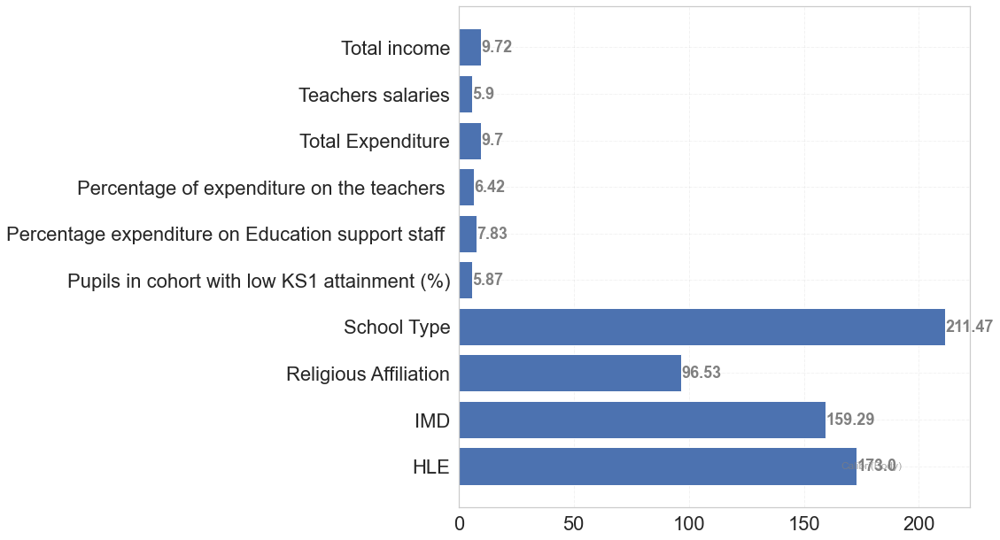

In [372]:
# Setting the size of figure
fig, ax = plt.subplots(figsize =(16, 9))
 
# Ploting a horizontal barchart
ax.barh(Dependency_writing['Writing Probably Dependent Column'], Dependency_writing['Log of P-Values(writing)'])
 
#gridlines x, y 
ax.grid(b = True, color ='grey',
        linestyle ='-.', linewidth = 0.5,
        alpha = 0.2)
 
# Show top values
ax.invert_yaxis()
 
# Add annotation to bars
for i in ax.patches:
    plt.text(i.get_width()+0.2, i.get_y()+0.5,
             str(round((i.get_width()), 2)),
             fontsize = 18, fontweight ='bold',
             color ='grey')
 

fig.text(0.9, 0.15, 'Calibri(Body)', fontsize = 12,color ='grey', ha ='right', va ='bottom',alpha = 0.7)
# show the chart
plt.show()




#Reference: https://www.geeksforgeeks.org/bar-plot-in-matplotlib/

<!-- GETTING THE DEPENDENCIES OF THE INDEPENDENT VARIABLES (CATEGORICAL) ON READING -->

# MACHINE LEARNING

# Binary Classification - A negative average progess implies dercrease in performance and positive implied increase... encoding this is as follows... positive as 1 and negative as zero

In [373]:
#A negative of cummulative progess implies dercrease in performance and positive implied increase... encoding this is as follows... positive as 1 and negative as zero
Allcohorts_dataframe['Average Progress'] =  Allcohorts_dataframe['Average Progress'].apply (lambda x: 1 if x>0 else 0)

In [374]:
#confirming if the target variable ... i.e Average progress has been turned to binary numbers
Allcohorts_dataframe.head(10)

,FSM,TOTALINCOME,TEACHINGSTAFF,TOTALEXPENDITURE,PGRANTFUNDING,PSELFGENERATEDINCOME,PTEACHINGSTAFF,PSUPPLYTEACHERS,PEDUCATIONSUPPORTSTAFF,PPREMISES,PBACKOFFICE,PCATERING,POTHERSTAFF,PENERGY,PLEARNINGRESOURCES,PICT,PBOUGHTINPROFESSIONALSERVICES,POTHER,NFTYPE,RELDENOM,TOTPUPS,TKS1AVERAGE,PTKS1GROUP_L,PTFSM6CLA1A,PTEALGRP2,PTMOBN,PTRWM_EXP,PTEALGRP1,PTEALGRP3,PSENELE,PSENELK,IMD,HLE,WRITPROG,MATPROG,READPROG,Average Progress,Year
0,18.20000000,4674.00000000,2019.00000000,4432.00000000,97.00000000,3.00000000,46.00000000,1.00000000,21.00000000,7.00000000,6.00000000,3.00000000,5.00000000,1.00000000,3.00000000,2.00000000,3.00000000,4.00000000,3,3,216.00000000,15.80000000,13.00000000,26.00000000,0.00000000,91.00000000,52.00000000,100.00000000,0.00000000,9.00000000,26.00000000,7.00000000,7.00000000,-2.90000000,-2.50000000,-0.40000000,0,2016
1,4.10000000,4686.00000000,2061.00000000,4795.00000000,93.00000000,7.00000000,43.00000000,3.00000000,18.00000000,4.00000000,10.00000000,4.00000000,5.00000000,1.00000000,5.00000000,2.00000000,4.00000000,1.00000000,6,1,114.00000000,17.10000000,6.00000000,12.00000000,0.00000000,94.00000000,59.00000000,100.00000000,0.00000000,0.00000000,12.00000000,1.00000000,2.00000000,2.80000000,-1.90000000,-2.00000000,0,2016
2,29.50000000,17525.00000000,7227.00000000,17980.00000000,98.00000000,2.00000000,40.00000000,3.00000000,34.00000000,3.00000000,5.00000000,2.00000000,3.00000000,1.00000000,4.00000000,1.00000000,4.00000000,1.00000000,4,3,89.00000000,7.30000000,83.00000000,33.00000000,0.00000000,67.00000000,0.00000000,100.00000000,0.00000000,0.00000000,13.00000000,4.00000000,4.00000000,-8.60000000,-9.60000000,-10.40000000,0,2016
3,5.50000000,4608.00000000,2152.00000000,4536.00000000,97.00000000,3.00000000,46.00000000,9.00000000,19.00000000,5.00000000,6.00000000,5.00000000,2.00000000,1.00000000,1.00000000,1.00000000,3.00000000,2.00000000,8,1,156.00000000,17.50000000,0.00000000,8.00000000,0.00000000,83.00000000,79.00000000,100.00000000,0.00000000,0.00000000,17.00000000,5.00000000,4.00000000,-0.20000000,0.30000000,-1.60000000,0,2016
4,2.80000000,4006.00000000,2021.00000000,3816.00000000,91.00000000,9.00000000,53.00000000,4.00000000,12.00000000,8.00000000,7.00000000,3.00000000,2.00000000,2.00000000,3.00000000,1.00000000,3.00000000,3.00000000,8,1,311.00000000,15.90000000,4.00000000,6.00000000,0.00000000,100.00000000,51.00000000,100.00000000,0.00000000,0.00000000,12.00000000,2.00000000,2.00000000,2.10000000,-2.90000000,-1.90000000,0,2016
5,34.20000000,25433.00000000,7228.00000000,24714.00000000,98.00000000,2.00000000,29.00000000,0.00000000,30.00000000,4.00000000,6.00000000,3.00000000,21.00000000,1.00000000,2.00000000,1.00000000,1.00000000,1.00000000,4,3,109.00000000,2.10000000,100.00000000,33.00000000,0.00000000,89.00000000,0.00000000,100.00000000,0.00000000,0.00000000,13.00000000,2.00000000,2.00000000,-3.80000000,-4.30000000,-3.80000000,0,2016
6,18.40000000,5397.00000000,2392.00000000,5086.00000000,96.00000000,4.00000000,47.00000000,2.00000000,22.00000000,6.00000000,7.00000000,3.00000000,5.00000000,1.00000000,2.00000000,1.00000000,2.00000000,1.00000000,7,2,211.00000000,15.90000000,3.00000000,19.00000000,10.00000000,100.00000000,71.00000000,90.00000000,0.00000000,0.00000000,23.00000000,10.00000000,10.00000000,-0.90000000,1.00000000,0.10000000,1,2016
7,3.20000000,5615.00000000,2793.00000000,5492.00000000,97.00000000,3.00000000,46.00000000,1.00000000,19.00000000,5.00000000,10.00000000,3.00000000,4.00000000,1.00000000,4.00000000,2.00000000,4.00000000,2.00000000,7,1,105.00000000,14.50000000,37.00000000,24.00000000,5.00000000,81.00000000,81.00000000,95.00000000,0.00000000,0.00000000,10.00000000,2.00000000,4.00000000,3.30000000,6.50000000,10.70000000,1,2016
8,14.50000000,5291.00000000,2221.00000000,5276.00000000,96.00000000,4.00000000,42.00000000,4.00000000,15.00000000,6.00000000,11.00000000,5.00000000,5.00000000,1.00000000,3.00000000,3.00000000,2.00000000,2.00000000,7,2,103.00000000,17.20000000,0.00000000,33.00000000,33.0000000

# Dropping  irrelevant columns before training a machine learning (e.g. individual subject progress scores as they would not be needed in the training)

In [375]:
#Drops the irrelevant columns the Math, Reading and writing progresses

Allcohorts_dataframe.drop(columns=['Year','WRITPROG', 'MATPROG', 'READPROG'], inplace= True)

In [376]:
Allcohorts_dataframe.head(3)#confirming they have been dropped

,FSM,TOTALINCOME,TEACHINGSTAFF,TOTALEXPENDITURE,PGRANTFUNDING,PSELFGENERATEDINCOME,PTEACHINGSTAFF,PSUPPLYTEACHERS,PEDUCATIONSUPPORTSTAFF,PPREMISES,PBACKOFFICE,PCATERING,POTHERSTAFF,PENERGY,PLEARNINGRESOURCES,PICT,PBOUGHTINPROFESSIONALSERVICES,POTHER,NFTYPE,RELDENOM,TOTPUPS,TKS1AVERAGE,PTKS1GROUP_L,PTFSM6CLA1A,PTEALGRP2,PTMOBN,PTRWM_EXP,PTEALGRP1,PTEALGRP3,PSENELE,PSENELK,IMD,HLE,Average Progress
0,18.20000000,4674.00000000,2019.00000000,4432.00000000,97.00000000,3.00000000,46.00000000,1.00000000,21.00000000,7.00000000,6.00000000,3.00000000,5.00000000,1.00000000,3.00000000,2.00000000,3.00000000,4.00000000,3,3,216.00000000,15.80000000,13.00000000,26.00000000,0.00000000,91.00000000,52.00000000,100.00000000,0.00000000,9.00000000,26.00000000,7.00000000,7.00000000,0
1,4.10000000,4686.00000000,2061.00000000,4795.00000000,93.00000000,7.00000000,43.00000000,3.00000000,18.00000000,4.00000000,10.00000000,4.00000000,5.00000000,1.00000000,5.00000000,2.00000000,4.00000000,1.00000000,6,1,114.00000000,17.10000000,6.00000000,12.00000000,0.00000000,94.00000000,59.00000000,100.00000000,0.00000000,0.00000000,12.00000000,1.00000000,2.00000000,0
2,29.50000000,17525.00000000,7227.00000000,17980.00000000,98.00000000,2.00000000,40.00000000,3.00000000,34.00000000,3.00000000,5.00000000,2.00000000,3.00000000,1.00000000,4.00000000,1.00000000,4.00000000,1.00000000,4,3,89.00000000,7.30000000,83.00000000,33.00000000,0.00000000,67.00000000,0.00000000,100.00000000,0.00000000,0.00000000,13.00000000,4.00000000,4.00000000,0


# Normalizing the Dataframe

In [377]:
#scaling or normalizing the dataframe
from sklearn.preprocessing import MinMaxScaler
scaled_attributes = ['FSM', 'TOTALINCOME', 'TEACHINGSTAFF', 'TOTALEXPENDITURE',
       'PGRANTFUNDING', 'PSELFGENERATEDINCOME', 'PTEACHINGSTAFF',
       'PSUPPLYTEACHERS', 'PEDUCATIONSUPPORTSTAFF', 'PPREMISES', 'PBACKOFFICE',
       'PCATERING', 'POTHERSTAFF', 'PENERGY', 'PLEARNINGRESOURCES', 'PICT',
       'PBOUGHTINPROFESSIONALSERVICES', 'POTHER', 'NFTYPE', 'RELDENOM',
       'TOTPUPS', 'TKS1AVERAGE', 'PTKS1GROUP_L', 'PTFSM6CLA1A', 'PTEALGRP2',
       'PTMOBN', 'PTRWM_EXP', 'PTEALGRP1', 'PTEALGRP3', 'PSENELE', 'PSENELK',
       'IMD', 'HLE']
scaler = MinMaxScaler()
Allcohorts_dataframe[scaled_attributes] = scaler.fit_transform(Allcohorts_dataframe[scaled_attributes])
Allcohorts_dataframe.head() #checks the normalized dataframe

,FSM,TOTALINCOME,TEACHINGSTAFF,TOTALEXPENDITURE,PGRANTFUNDING,PSELFGENERATEDINCOME,PTEACHINGSTAFF,PSUPPLYTEACHERS,PEDUCATIONSUPPORTSTAFF,PPREMISES,PBACKOFFICE,PCATERING,POTHERSTAFF,PENERGY,PLEARNINGRESOURCES,PICT,PBOUGHTINPROFESSIONALSERVICES,POTHER,NFTYPE,RELDENOM,TOTPUPS,TKS1AVERAGE,PTKS1GROUP_L,PTFSM6CLA1A,PTEALGRP2,PTMOBN,PTRWM_EXP,PTEALGRP1,PTEALGRP3,PSENELE,PSENELK,IMD,HLE,Average Progress
0,0.37759336,0.04635244,0.08965397,0.04181037,0.86363636,0.13043478,0.62068966,0.06250000,0.31250000,0.43750000,0.05882353,0.27272727,0.20000000,0.16666667,0.22222222,0.33333333,0.15000000,0.50000000,0.00000000,1.00000000,0.32667877,0.80924855,0.13000000,0.27083333,0.00000000,0.75675676,0.52000000,1.00000000,0.00000000,0.09000000,0.32500000,0.66666667,0.66666667,0
1,0.08506224,0.04690371,0.09699406,0.05895970,0.68181818,0.30434783,0.51724138,0.18750000,0.21875000,0.25000000,0.29411765,0.36363636,0.20000000,0.16666667,0.44444444,0.33333333,0.20000000,0.00000000,0.60000000,0.00000000,0.14156080,0.88439306,0.06000000,0.12500000,0.00000000,0.83783784,0.59000000,1.00000000,0.00000000,0.00000000,0.15000000,0.00000000,0.11111111,0
2,0.61203320,0.63671444,0.99982524,0.68186328,0.90909091,0.08695652,0.41379310,0.18750000,0.71875000,0.18750000,0.00000000,0.18181818,0.10000000,0.16666667,0.33333333,0.16666667,0.20000000,0.00000000,0.20000000,1.00000000,0.09618875,0.31791908,0.83000000,0.34375000,0.00000000,0.10810811,0.00000000,1.00000000,0.00000000,0.00000000,0.16250000,0.33333333,0.33333333,0
3,0.11410788,0.04332047,0.11289759,0.04672367,0.86363636,0.13043478,0.62068966,0.56250000,0.25000000,0.31250000,0.05882353,0.45454545,0.05000000,0.16666667,0.00000000,0.16666667,0.15000000,0.16666667,1.00000000,0.00000000,0.21778584,0.90751445,0.00000000,0.08333333,0.00000000,0.54054054,0.79000000,1.00000000,0.00000000,0.00000000,0.21250000,0.44444444,0.33333333,0
4,0.05809129,0.01566520,0.09000350,0.01270846,0.59090909,0.39130435,0.86206897,0.25000000,0.03125000,0.50000000,0.11764706,0.27272727,0.05000000,0.33333333,0.22222222,0.16666667,0.15000000,0.33333333,1.00000000,0.00000000,0.49909256,0.81502890,0.04000000,0.06250000,0.00000000,1.00000000,0.51000000,1.00000000,0.00000000,0.00000000,0.15000000,0.11111111,0.11111111,0


In [378]:
#GETS THE DATAFRAME FOR TRAINING OF MODELS
Allcohorts_dataframe= Allcohorts_dataframe.drop(Allcohorts_dataframe.columns.difference(['TOTALEXPENDITURE','TOTALINCOME','TEACHINGSTAFF','PTEACHINGSTAFF','PTKS1GROUP_L','FSM','PEDUCATIONSUPPORTSTAFF','PTRWM_EXP','PTFSM6CLA1A','TKS1AVERAGE','PSUPPLYTEACHERS','Average Progress']), axis=1)

In [379]:
#Splits to X and Y (Independent variable and target variable (i.e binary target variables))
X=Allcohorts_dataframe[['PTRWM_EXP','TOTALEXPENDITURE','TOTALINCOME','TEACHINGSTAFF','PTEACHINGSTAFF','PTKS1GROUP_L','FSM','PEDUCATIONSUPPORTSTAFF','PTFSM6CLA1A','TKS1AVERAGE','PSUPPLYTEACHERS']]
y=Allcohorts_dataframe['Average Progress']

# PREDICTING Average Progress or Attainment   

In [380]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)

# Making the five models and Stacked model 

Reference: https://machinelearningmastery.com/stacking-ensemble-machine-learning-with-python/


https://www.geeksforgeeks.org/how-to-annotate-bars-in-barplot-with-matplotlib-in-python/

In [381]:
# Importing the required libraries for machine learning
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import GradientBoostingClassifier
from matplotlib import pyplot
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import StackingClassifier
from sklearn.datasets import make_classification

from sklearn import metrics
from sklearn.metrics import classification_report, confusion_matrix
from sklearn import ensemble

>KNN 87.56  %
>GB 81.67  %
>LOG 80.00  %
>SVM 86.44  %
>RF 83.33  %
>Stacked Model 87.44  %


C:\Users\675906\AppData\Roaming\Python\Python39\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


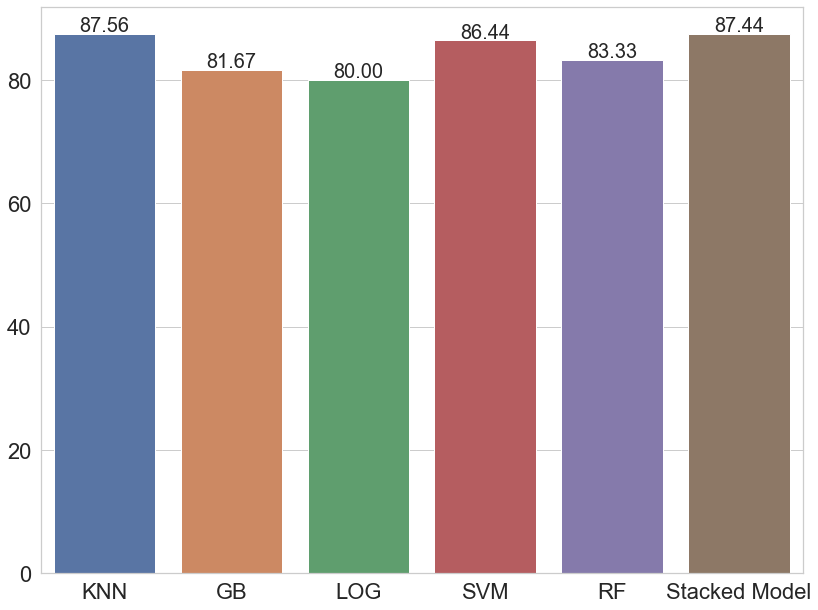

In [382]:
#writing a function to find a model and also stacked model
def find_models():
    models = dict() # initializing a dictionary for the models
    
    models['KNN'] = KNeighborsClassifier() #KNN Classifier
    models['GB'] = GradientBoostingClassifier() #Gradient BOOSTING CLASSIFIER
    models['LOG'] = LogisticRegression() #LOGISTIC Regression Classifier
    models['SVM'] = SVC() #Support Vector Machine Classifier
    models['RF'] = RandomForestClassifier() #Random Forest Classifier
    models['Stacked Model'] = find_stacking() #Stacked model
    return models #returns the models to the 'models' dictionary above

#writing a function for the dataset
def dataset():
    X, y = make_classification(n_samples=300, n_features=12, n_informative=10, n_redundant=2, random_state=1)
    return X, y

# Stacking the base models
def find_stacking():
    # define the base models
    level0 = list() #list to contain the base models
    level0.append(('LOG', LogisticRegression())) #Appends LOGISTIC Regression Classifier
    level0.append(('KNN', KNeighborsClassifier())) #appends KNN Classifier
    level0.append(('GB', GradientBoostingClassifier())) # appends Gradient BOOSTING CLASSIFIER
    level0.append(('SVM', SVC())) #appends support vector machine
    level0.append(('RF', RandomForestClassifier())) #appends Random Forest Classifier
    # defining the meta learner model
    level1 = LogisticRegression()
    # The stacked ensemble is given below
    model = StackingClassifier(estimators=level0, final_estimator=level1, cv=5)
    return model

# evaluating model using cross-validation
def evaluate_model(model, X, y):
    cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
    scores = cross_val_score(model, X, y, scoring='accuracy', cv=cv, n_jobs=-1, error_score='raise')
    return scores
 
    
     
# define dataset
X, y = dataset()
# get the models to evaluate
models = find_models()
# evaluate the models and store results
valu = [] #initializes the values for plotting the percentage of accuracy
results, names = list(), list()
for name, model in models.items():
    scores = evaluate_model(model, X, y)
    results.append(scores)
    valu.append((mean(scores)*100)) #gets the percentage values of the acuracies of the models
    names.append(name) #get the names of the models
    print('>%s %.2f '%(name, mean(scores)*100),'%') #prints the names of the models and the corresponding  accuracies
# Barchart showing the model performance compared with the stacked models


plots = sns.barplot(names, valu)

for bar in plots.patches: #iterates over the bars
    plots.annotate(format(bar.get_height(), '.2f'),
                   (bar.get_x() + bar.get_width() / 2,
                    bar.get_height()), ha='center', va='center',
                   size=20,xytext=(0, 8),
                   textcoords='offset points')
plt.show()#the graph

# Checking other performance metrics on the best model i.e KNN

Performance metrics such has the precision, support, F1-score and support; checking the confusion matrix

In [383]:
KNN_Classifier = KNeighborsClassifier()
KNN_Classifier.fit(X_train, y_train)
KNN_SCORE = KNN_Classifier.score(X_test, y_test)

In [384]:
y_pred = KNN_Classifier.predict(X_test)
KNN_Classifier.score(X_test, y_test) #Checks the classifier's the score
print(confusion_matrix(y_test, y_pred))

#This gives the precision, recall, f1-score and support
print(classification_report(y_test, y_pred))


[[27  4]
 [ 5 24]]
              precision    recall  f1-score   support

           0       0.84      0.87      0.86        31
           1       0.86      0.83      0.84        29

    accuracy                           0.85        60
   macro avg       0.85      0.85      0.85        60
weighted avg       0.85      0.85      0.85        60



# Testing the model on 2015-2016 dataset

The dataset will be cleaned and then trained with the best performing model to predict school academic attainment

In [385]:
df_school_15 = pd.read_csv('ks2final_15.csv') #school general attainment file

In [386]:
df_school_15.head(3)

,RECTYPE,ALPHAIND,LEA,ESTAB,URN,IMD,HLE,SCHNAME,ADDRESS1,ADDRESS2,ADDRESS3,TOWN,PCODE,TELNUM,URN_AC,SCHNAME_AC,OPEN_AC,NFTYPE,ICLOSE,RELDENOM,AGERANGE,CONFEXAM,TAB15,TAB1618,TOTPUPS,TPUPYEAR,TELIG,BELIG,GELIG,PBELIG,PGELIG,TKS1AVERAGE,TKS1GROUP_L,PTKS1GROUP_L,TKS1GROUP_M,PTKS1GROUP_M,TKS1GROUP_H,PTKS1GROUP_H,TKS1GROUP_NA,PTKS1GROUP_NA,TFSM6CLA1A,PTFSM6CLA1A,TNotFSM6CLA1A,PTNotFSM6CLA1A,TEALGRP2,PTEALGRP2,TMOBN,PTMOBN,TSENELSE,PSENELSE,PTRWM_EXP,PTRWM_HIGH,READPROG,READPROG_LOWER,READPROG_UPPER,READCOV,WRITPROG,WRITPROG_LOWER,WRITPROG_UPPER,WRITCOV,MATPROG,MATPROG_LOWER,MATPROG_UPPER,MATCOV,PTREAD_EXP,PTREAD_HIGH,PTREAD_AT,READ_AVERAGE,PTGPS_EXP,PTGPS_HIGH,PTGPS_AT,GPS_AVERAGE,PTMAT_EXP,PTMAT_HIGH,PTMAT_AT,MAT_AVERAGE,PTWRITTA_EXP,PTWRITTA_HIGH,PTWRITTA_WTS,PTWRITTA_AD,PTSCITA_EXP,PTSCITA_AD,PTREADTA_EXP,PTREADTA_AD,PTMATTA_EXP,PTMATTA_AD,PTRWM_EXP_B,PTRWM_EXP_G,PTRWM_EXP_L,PTRWM_EXP_M,PTRWM_EXP_H,PTRWM_EXP_FSM6CLA1A,PTRWM_EXP_NotFSM6CLA1A,DIFFN_RWM_EXP,PTRWM_EXP_EAL,PTRWM_EXP_MOBN,PTRWM_HIGH_B,PTRWM_HIGH_G,PTRWM_HIGH_L,PTRWM_HIGH_M,PTRWM_HIGH_H,PTRWM_HIGH_FSM6CLA1A,PTRWM_HIGH_NotFSM6CLA1A,DIFFN_RWM_HIGH,PTRWM_HIGH_EAL,PTRWM_HIGH_MOBN,READPROG_B,READPROG_B_LOWER,READPROG_B_UPPER,READPROG_G,READPROG_G_LOWER,READPROG_G_UPPER,READPROG_L,READPROG_L_LOWER,READPROG_L_UPPER,READPROG_M,READPROG_M_LOWER,READPROG_M_UPPER,READPROG_H,READPROG_H_LOWER,READPROG_H_UPPER,READPROG_FSM6CLA1A,READPROG_FSM6CLA1A_LOWER,READPROG_FSM6CLA1A_UPPER,READPROG_NotFSM6CLA1A,READPROG_NotFSM6CLA1A_LOWER,READPROG_NotFSM6CLA1A_UPPER,DIFFN_READPROG,READPROG_EAL,READPROG_EAL_LOWER,READPROG_EAL_UPPER,READPROG_MOBN,READPROG_MOBN_LOWER,READPROG_MOBN_UPPER,WRITPROG_B,WRITPROG_B_LOWER,WRITPROG_B_UPPER,WRITPROG_G,WRITPROG_G_LOWER,WRITPROG_G_UPPER,WRITPROG_L,WRITPROG_L_LOWER,WRITPROG_L_UPPER,WRITPROG_M,WRITPROG_M_LOWER,WRITPROG_M_UPPER,WRITPROG_H,WRITPROG_H_LOWER,WRITPROG_H_UPPER,WRITPROG_FSM6CLA1A,WRITPROG_FSM6CLA1A_LOWER,WRITPROG_FSM6CLA1A_UPPER,WRITPROG_NotFSM6CLA1A,WRITPROG_NotFSM6CLA1A_LOWER,WRITPROG_NotFSM6CLA1A_UPPER,DIFFN_WRITPROG,WRITPROG_EAL,WRITPROG_EAL_LOWER,WRITPROG_EAL_UPPER,WRITPROG_MOBN,WRITPROG_MOBN_LOWER,WRITPROG_MOBN_UPPER,MATPROG_B,MATPROG_B_LOWER,MATPROG_B_UPPER,MATPROG_G,MATPROG_G_LOWER,MATPROG_G_UPPER,MATPROG_L,MATPROG_L_LOWER,MATPROG_L_UPPER,MATPROG_M,MATPROG_M_LOWER,MATPROG_M_UPPER,MATPROG_H,MATPROG_H_LOWER,MATPROG_H_UPPER,MATPROG_FSM6CLA1A,MATPROG_FSM6CLA1A_LOWER,MATPROG_FSM6CLA1A_UPPER,MATPROG_NotFSM6CLA1A,MATPROG_NotFSM6CLA1A_LOWER,MATPROG_NotFSM6CLA1A_UPPER,DIFFN_MATPROG,MATPROG_EAL,MATPROG_EAL_LOWER,MATPROG_EAL_UPPER,MATPROG_MOBN,MATPROG_MOBN_LOWER,MATPROG_MOBN_UPPER,READ_AVERAGE_L,READ_AVERAGE_M,READ_AVERAGE_H,READ_AVERAGE_FSM6CLA1A,READ_AVERAGE_NotFSM6CLA1A,MAT_AVERAGE_L,MAT_AVERAGE_M,MAT_AVERAGE_H,MAT_AVERAGE_FSM6CLA1A,MAT_AVERAGE_NotFSM6CLA1A,GPS_AVERAGE_L,GPS_AVERAGE_M,GPS_AVERAGE_H,GPS_AVERAGE_FSM6CLA1A,GPS_AVERAGE_NotFSM6CLA1A,PTREAD_EXP_L,PTREAD_EXP_M,PTREAD_EXP_H,PTREAD_EXP_FSM6CLA1A,PTREAD_EXP_NotFSM6CLA1A,PTGPS_EXP_L,PTGPS_EXP_M,PTGPS_EXP_H,PTGPS_EXP_FSM6CLA1A,PTGPS_EXP_NotFSM6CLA1A,PTMAT_EXP_L,PTMAT_EXP_M,PTMAT_EXP_H,PTMAT_EXP_FSM6CLA1A,PTMAT_EXP_NotFSM6CLA1A,PTWRITTA_EXP_L,PTWRITTA_EXP_M,PTWRITTA_EXP_H,PTWRITTA_EXP_FSM6CLA1A,PTWRITTA_EXP_NotFSM6CLA1A,PTREAD_HIGH_L,PTREAD_HIGH_M,PTREAD_HIGH_H,PTREAD_HIGH_FSM6CLA1A,PTREAD_HIGH_NotFSM6CLA1A,PTGPS_HIGH_L,PTGPS_HIGH_M,PTGPS_HIGH_H,PTGPS_HIGH_FSM6CLA1A,PTGPS_HIGH_NotFSM6CLA1A,PTMAT_HIGH_L,PTMAT_HIGH_M,PTMAT_HIGH_H,PTMAT_HIGH_FSM6CLA1A,PTMAT_HIGH_NotFSM6CLA1A,PTWRITTA_HIGH_L,PTWRITTA_HIGH_M,PTWRITTA_HIGH_H,PTWRITTA_HIGH_FSM6CLA1A,PTWRITTA_HIGH_NotFSM6CLA1A,TEALGRP1,PTEALGRP1,TEALGRP3,PTEALGRP3,TSENELAPK,PSENELSAPK,TSENELE,PSENELE,TSENELK,PSENELK,TSENELST,PSENELST,TSENELSAP,PSENELSAP,SENELN,PSENELN
0,1,764.00000000,811.00000000,2700.00000000,117823.00000000,5.00000000,3.00000000,Aldbrough Primary School,Headlands Road,Aldbrough,NaN,Hull,HU11 4RR,0196 4527422,0.00000000,NaN,NaN,CY,0.00000000,Does not apply,03-Nov,R,0.00000000,0.00000000,124,12,12.00000000,7,5,58%,42%,16.9,0,0%,8,67%,4,3

In [387]:
df_fund_15 = pd.read_csv('811_cfr_15.csv') # school funding dataset

In [388]:
df_fund_15.head(3)

,LA,URN,LONDON/NON-LONDON,MEDIAN,PUPILS,FSM,FSMBAND,GRANTFUNDING,SELFGENERATEDINCOME,TOTALINCOME,TEACHINGSTAFF,SUPPLYTEACHERS,EDUCATIONSUPPORTSTAFF,PREMISES,BACKOFFICE,CATERING,OTHERSTAFF,ENERGY,LEARNINGRESOURCES,ICT,BOUGHTINPROFESSIONALSERVICES,OTHER,TOTALEXPENDITURE,T1112CAT1,T1112CAT2,T1112CAT3,T1112CAT4,T1112CAT5,T1112CAT1LA,T1112CAT2LA,T1112CAT3LA,T1112CAT4LA,T1112CAT5LA,T1213CAT1,T1213CAT2,T1213CAT3,T1213CAT4,T1213CAT5,T1213CAT1LA,T1213CAT2LA,T1213CAT3LA,T1213CAT4LA,T1213CAT5LA,T1314CAT1,T1314CAT2,T1314CAT3,T1314CAT4,T1314CAT5,T1314CAT1LA,T1314CAT2LA,T1314CAT3LA,T1314CAT4LA,T1314CAT5LA,T1415CAT1,T1415CAT2,T1415CAT3,T1415CAT4,T1415CAT5,T1415CAT1LA,T1415CAT2LA,T1415CAT3LA,T1415CAT4LA,T1415CAT5LA,T1516CAT1,T1516CAT2,T1516CAT3,T1516CAT4,T1516CAT5,T1516CAT1LA,T1516CAT2LA,T1516CAT3LA,T1516CAT4LA,T1516CAT5LA,DCAT1,DCAT2,DCAT3,DCAT4,DCAT5,PGRANTFUNDING,PSELFGENERATEDINCOME,PTEACHINGSTAFF,PSUPPLYTEACHERS,PEDUCATIONSUPPORTSTAFF,PPREMISES,PBACKOFFICE,PCATERING,POTHERSTAFF,PENERGY,PLEARNINGRESOURCES,PICT,PBOUGHTINPROFESSIONALSERVICES,POTHER,PT1112CAT1,PT1112CAT2,PT1112CAT3,PT1112CAT4,PT1112CAT5,PT1112CAT1LA,PT1112CAT2LA,PT1112CAT3LA,PT1112CAT4LA,PT1112CAT5LA,PT1213CAT1,PT1213CAT2,PT1213CAT3,PT1213CAT4,PT1213CAT5,PT1213CAT1LA,PT1213CAT2LA,PT1213CAT3LA,PT1213CAT4LA,PT1213CAT5LA,PT1314CAT1,PT1314CAT2,PT1314CAT3,PT1314CAT4,PT1314CAT5,PT1314CAT1LA,PT1314CAT2LA,PT1314CAT3LA,PT1314CAT4LA,PT1314CAT5LA,PT1415CAT1,PT1415CAT2,PT1415CAT3,PT1415CAT4,PT1415CAT5,PT1415CAT1LA,PT1415CAT2LA,PT1415CAT3LA,PT1415CAT4LA,PT1415CAT5LA,PT1516CAT1,PT1516CAT2,PT1516CAT3,PT1516CAT4,PT1516CAT5,PT1516CAT1LA,PT1516CAT2LA,PT1516CAT3LA,PT1516CAT4LA,PT1516CAT5LA,PDCAT1,PDCAT2,PDCAT3,PDCAT4,PDCAT5
0,811,117695,Non-London,Nursery,52.50000000,0.00000000,Low,"7,318",200,"7,518","2,814",88,"2,563",377,688,13,125,58,320,112,30,251,"7,438",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"4,795",119.00000000,595,41,"7,538","4,806",88.00000000,310.00000000,54.00000000,"6,634","5,377",88.00000000,688,58.00000000,"7,438","5,953",47.00000000,600,65.00000000,"7,821",NaN,NaN,NaN,NaN,NaN,97%,3%,38%,1%,34%,5%,9%,0%,2%,1%,4%,2%,0%,3%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,64%,2%,8%,1%,100%,NaN,NaN,NaN,NaN,NaN,72%,1%,0%,4%,100%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,811,117698,Non-London,Nursery,47.50000000,0.00000000,Low,"7,335",896,"8,230","2,745",57,"3,784",381,611,-41,140,104,336,52,15,204,"8,388",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"4,816",131.00000000,490,83,"6,292","4,806",88.00000000,310.00000000,54.00000000,"6,634","6,529",57.00000000,611,104.00000000,"8,388","5,953",47.00000000,600,65.00000000,"7,821",NaN,NaN,NaN,NaN,NaN,89%,11%,33%,1%,45%,5%,7%,0%,2%,1%,4%,1%,0%,2%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,77%,2%,8%,1%,100%,NaN,NaN,NaN,NaN,NaN,78%,1%,0%,4%,100%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,811,117699,Non-London,Nursery,73.50000000,0.00000000,Low,"5,525",604,"6,129","1,956",20,"2,158",300,589,0,165,34,208,332,22,66,"5,850",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"4,647",57.00000000,766,46,"6,327","4,806",88.00000000,310.00000000,54.00000000,"6,634","4,114",20.00000000,589,34.00000000,"5,850","5,953",47.00000000,600,65.00000000,"7,821",NaN,NaN,NaN,NaN,NaN,90%,10%,33%,0%,37%,5%,10%,0%,3%,1%,4%,6%,0%,1%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,73%,1%,12%,1%,100%,NaN,NaN,NaN,NaN,NaN,70%,0%,0%,4%,100%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# Retaining the needed columns and deleting the rest for both df_school_15 and df_fund_15

In [389]:
# Retains the columns listed below and delete others
df_fund_new_15= df_fund_15.drop(df_fund_15.columns.difference(['URN','TEACHINGSTAFF' ,'FSM','TOTALINCOME','TOTALEXPENDITURE','PGRANTFUNDING','PSELFGENERATEDINCOME','PTEACHINGSTAFF','PSUPPLYTEACHERS','PEDUCATIONSUPPORTSTAFF','PPREMISES','PBACKOFFICE','PCATERING','POTHERSTAFF','PENERGY','PLEARNINGRESOURCES','PICT','PBOUGHTINPROFESSIONALSERVICES','POTHER']), axis=1)

In [390]:
#confirming
df_fund_new_16.head(2)

,URN,FSM,TOTALINCOME,TEACHINGSTAFF,TOTALEXPENDITURE,PGRANTFUNDING,PSELFGENERATEDINCOME,PTEACHINGSTAFF,PSUPPLYTEACHERS,PEDUCATIONSUPPORTSTAFF,PPREMISES,PBACKOFFICE,PCATERING,POTHERSTAFF,PENERGY,PLEARNINGRESOURCES,PICT,PBOUGHTINPROFESSIONALSERVICES,POTHER
0,134741,18.20000000,"4,674","2,019","4,432",97%,3%,46%,1%,21%,7%,6%,3%,5%,1%,3%,2%,3%,4%
1,118075,22.20000000,"5,915","3,020","5,922",100%,0%,51%,3%,15%,6%,9%,2%,2%,2%,5%,1%,0%,4%


In [391]:
# Retains the columns listed below and delete others
df_school_new_15= df_school_15.drop(df_school_15.columns.difference(['URN', 'SCHNAME', 'NFTYPE','RELDENOM','TOTPUPS','TKS1AVERAGE','PTKS1GROUP_L','PTFSM6CLA1A','PTEALGRP2','PTMOBN','PTRWM_EXP','PTRWM_HIGH_FSM6CLA1A','DIFFN_RWM_HIGH','PTEALGRP1','PTEALGRP3','PSENELE','PSENELK','IMD','HLE','READPROG','WRITPROG','MATPROG']), axis=1)

In [392]:
df_school_new_15.head(2)

,URN,IMD,HLE,SCHNAME,NFTYPE,RELDENOM,TOTPUPS,TKS1AVERAGE,PTKS1GROUP_L,PTFSM6CLA1A,PTEALGRP2,PTMOBN,PTRWM_EXP,READPROG,WRITPROG,MATPROG,PTRWM_HIGH_FSM6CLA1A,DIFFN_RWM_HIGH,PTEALGRP1,PTEALGRP3,PSENELE,PSENELK
0,117823.00000000,5.00000000,3.00000000,Aldbrough Primary School,CY,Does not apply,124,16.9,0%,33%,8%,83%,33%,-2.5,-4,-4.8,SUPP,SUPP,92%,0%,0%,17%
1,117824.00000000,5.00000000,2.00000000,Barmby-on-the-Marsh Primary School,CY,Does not apply,67,15.9,8%,0%,0%,92%,58%,5,-0.8,-2.7,0%,-7,100%,0%,0%,17%


In [393]:
df_school_new_15.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 123 entries, 0 to 122
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   URN                   120 non-null    float64
 1   IMD                   119 non-null    float64
 2   HLE                   119 non-null    float64
 3   SCHNAME               121 non-null    object 
 4   NFTYPE                120 non-null    object 
 5   RELDENOM              120 non-null    object 
 6   TOTPUPS               123 non-null    int64  
 7   TKS1AVERAGE           122 non-null    object 
 8   PTKS1GROUP_L          122 non-null    object 
 9   PTFSM6CLA1A           122 non-null    object 
 10  PTEALGRP2             122 non-null    object 
 11  PTMOBN                122 non-null    object 
 12  PTRWM_EXP             122 non-null    object 
 13  READPROG              120 non-null    object 
 14  WRITPROG              120 non-null    object 
 15  MATPROG               1

In [394]:
df_fund_new_15.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 180 entries, 0 to 179
Data columns (total 19 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   URN                            142 non-null    object 
 1   FSM                            135 non-null    float64
 2   TOTALINCOME                    180 non-null    object 
 3   TEACHINGSTAFF                  180 non-null    object 
 4   TOTALEXPENDITURE               180 non-null    object 
 5   PGRANTFUNDING                  135 non-null    object 
 6   PSELFGENERATEDINCOME           135 non-null    object 
 7   PTEACHINGSTAFF                 135 non-null    object 
 8   PSUPPLYTEACHERS                135 non-null    object 
 9   PEDUCATIONSUPPORTSTAFF         135 non-null    object 
 10  PPREMISES                      135 non-null    object 
 11  PBACKOFFICE                    135 non-null    object 
 12  PCATERING                      135 non-null    obj

# Turning URN in df_fund_new to integer to be able to merge it with df_school_new which has URN as integer

In [395]:
#command below shows the unique values of URN in df_fund_new... This shows some non-numeric items such as nan and 'East Riding of Yorkshire' this will be turn to figure 0 to allow the merging of the dataframe
df_fund_new_15['URN'].unique()

array(['117695', '117698', '117699', '131416', '133480', '133481',
       '133519', '135700', '117823', '117824', '117825', '117827',
       '117829', '117830', '117831', '117832', '117833', '117838',
       '117839', '117840', '117841', '117842', '117844', '117851',
       '117852', '117853', '117854', '117855', '117858', '117859',
       '117860', '117861', '117862', '117863', '117864', '117865',
       '117866', '117867', '117868', '117872', '117873', '117874',
       '117875', '117878', '117881', '117882', '117883', '117885',
       '117886', '117888', '117889', '117891', '117892', '117893',
       '117894', '117909', '117911', '117912', '117916', '117935',
       '117936', '117937', '117939', '117940', '117941', '117942',
       '117969', '117970', '117971', '117972', '117973', '117974',
       '117976', '117977', '117978', '117979', '117980', '117981',
       '117982', '117983', '117984', '117985', '117987', '117988',
       '117989', '117990', '117991', '117992', '117993', '1179

In [396]:
#replaces 'East Riding of Yorkshire' to o and nan to o... this are just empty or erroneous spaces in t#he dataset.
#Not realy part of the figures. It will be seived out after merging the dataframe. This is also done to allow merging
df_fund_new_15['URN'] = df_fund_new_15['URN'].replace(np.nan,0)
df_fund_new_15['URN'] = df_fund_new_15['URN'].replace('East Riding of Yorkshire',0)

In [397]:
#checking again
df_fund_new_15['URN'].unique()

array(['117695', '117698', '117699', '131416', '133480', '133481',
       '133519', '135700', '117823', '117824', '117825', '117827',
       '117829', '117830', '117831', '117832', '117833', '117838',
       '117839', '117840', '117841', '117842', '117844', '117851',
       '117852', '117853', '117854', '117855', '117858', '117859',
       '117860', '117861', '117862', '117863', '117864', '117865',
       '117866', '117867', '117868', '117872', '117873', '117874',
       '117875', '117878', '117881', '117882', '117883', '117885',
       '117886', '117888', '117889', '117891', '117892', '117893',
       '117894', '117909', '117911', '117912', '117916', '117935',
       '117936', '117937', '117939', '117940', '117941', '117942',
       '117969', '117970', '117971', '117972', '117973', '117974',
       '117976', '117977', '117978', '117979', '117980', '117981',
       '117982', '117983', '117984', '117985', '117987', '117988',
       '117989', '117990', '117991', '117992', '117993', '1179

In [398]:
df_fund_new_15['URN']=[int(i) for i in df_fund_new_15['URN']]

# Merging the dataframes

In [399]:
#merges the dataframes together
combined_df_school_15 = pd.merge(df_fund_new_15, df_school_new_15,   on=['URN'], how='inner') 
combined_df_school_15.shape

(112, 40)

In [400]:
#checking the combined dataframe
combined_df_school_15.head(5)

,URN,FSM,TOTALINCOME,TEACHINGSTAFF,TOTALEXPENDITURE,PGRANTFUNDING,PSELFGENERATEDINCOME,PTEACHINGSTAFF,PSUPPLYTEACHERS,PEDUCATIONSUPPORTSTAFF,PPREMISES,PBACKOFFICE,PCATERING,POTHERSTAFF,PENERGY,PLEARNINGRESOURCES,PICT,PBOUGHTINPROFESSIONALSERVICES,POTHER,IMD,HLE,SCHNAME,NFTYPE,RELDENOM,TOTPUPS,TKS1AVERAGE,PTKS1GROUP_L,PTFSM6CLA1A,PTEALGRP2,PTMOBN,PTRWM_EXP,READPROG,WRITPROG,MATPROG,PTRWM_HIGH_FSM6CLA1A,DIFFN_RWM_HIGH,PTEALGRP1,PTEALGRP3,PSENELE,PSENELK
0,133480,29.10000000,"4,883","2,033","4,800",99%,1%,42%,2%,21%,1%,21%,0%,4%,0%,3%,2%,2%,3%,8.00000000,9.00000000,Bay Primary School,CY,Does not apply,412,15.5,9%,70%,2%,91%,46%,-1.2,3.1,-1.3,3%,-4,98%,0%,0%,19%
1,133481,6.20000000,"4,184",SUPP,"4,115",96%,4%,48%,2%,15%,6%,8%,3%,4%,2%,3%,2%,3%,4%,5.00000000,4.00000000,Keldmarsh Primary School,CY,Does not apply,209,17.9,0%,9%,13%,94%,59%,0.3,-2.7,0.1,SUPP,SUPP,88%,0%,0%,6%
2,133519,32.70000000,"8,776","3,523","8,990",97%,3%,39%,3%,16%,7%,11%,3%,3%,2%,4%,2%,5%,4%,6.00000000,6.00000000,Hornsea Burton Primary School,CY,Does not apply,49,14.7,20%,33%,8%,83%,67%,2.2,-0.6,1.1,SUPP,SUPP,92%,0%,0%,33%
3,135700,43.30000000,"5,223","2,568","5,291",95%,5%,49%,2%,15%,7%,7%,4%,2%,3%,3%,2%,5%,0%,9.00000000,7.00000000,Hilderthorpe Primary School,CY,Does not apply,325,14,27%,48%,4%,83%,35%,-1.3,1.8,1.7,0%,-7,96%,0%,0%,13%
4,117823,20.60000000,"5,135",SUPP,"5,045",99%,1%,47%,3%,17%,6%,10%,4%,3%,2%,2%,0%,3%,3%,5.00000000,3.00000000,Aldbrough Primary School,CY,Does not apply,124,16.9,0%,33%,8%,83%,33%,-2.5,-4,-4.8,SUPP,SUPP,92%,0%,0%,17%


In [401]:
combined_df_school_15.info()#confirms URN has been turned to integer datatype

<class 'pandas.core.frame.DataFrame'>
Int64Index: 112 entries, 0 to 111
Data columns (total 40 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   URN                            112 non-null    int64  
 1   FSM                            112 non-null    float64
 2   TOTALINCOME                    112 non-null    object 
 3   TEACHINGSTAFF                  112 non-null    object 
 4   TOTALEXPENDITURE               112 non-null    object 
 5   PGRANTFUNDING                  112 non-null    object 
 6   PSELFGENERATEDINCOME           112 non-null    object 
 7   PTEACHINGSTAFF                 112 non-null    object 
 8   PSUPPLYTEACHERS                112 non-null    object 
 9   PEDUCATIONSUPPORTSTAFF         112 non-null    object 
 10  PPREMISES                      112 non-null    object 
 11  PBACKOFFICE                    112 non-null    object 
 12  PCATERING                      112 non-null    obj

In [402]:
combined_df_school_15.isnull().sum()

URN                              0
FSM                              0
TOTALINCOME                      0
TEACHINGSTAFF                    0
TOTALEXPENDITURE                 0
PGRANTFUNDING                    0
PSELFGENERATEDINCOME             0
PTEACHINGSTAFF                   0
PSUPPLYTEACHERS                  0
PEDUCATIONSUPPORTSTAFF           0
PPREMISES                        0
PBACKOFFICE                      0
PCATERING                        0
POTHERSTAFF                      0
PENERGY                          0
PLEARNINGRESOURCES               0
PICT                             0
PBOUGHTINPROFESSIONALSERVICES    0
POTHER                           0
IMD                              0
HLE                              0
SCHNAME                          0
NFTYPE                           0
RELDENOM                         0
TOTPUPS                          0
TKS1AVERAGE                      0
PTKS1GROUP_L                     0
PTFSM6CLA1A                      0
PTEALGRP2           

In [403]:
#just to view the file comprehensively
pd.DataFrame.to_csv(combined_df_school_15, 'combined_df_school_15.csv', sep=',', index=False)

# NOTE
SUPP ... means Indicates that a school figures have been suppressed because there are 5 or fewer pupils in the in the cohort

Ref: ONS ...'abrreviation excel'

Comment: While the reason for such figures being suppressed is not justifiable, this study deletes removes any column or rows that have a large number of suppressed figure.

Looking through the combine dataframe:

1) two columns PTRWM_HIGH_FSM6CLA1A and DIFFN_RWM_HIGH have high number of SUPP. In order not to affect the analysis, this will be dropped.

2). 8 Schools with URNs 117939,117972,118000 and 118001 have their progress scores suppressed and majority of their figures. Hence, the need to remove or drop the schools in order not to tamper with analysis and prediction

In [404]:
# pd.set_option('display.max_columns', None)

In [405]:
#the school name is also irrelrvant for analysis... this would be removed
combined_df_school_15.drop(columns=['PTRWM_HIGH_FSM6CLA1A','DIFFN_RWM_HIGH', 'SCHNAME'], inplace= True)

In [406]:
combined_df_school_15.shape

(112, 37)

In [407]:
#Sieves out the schools with large number of suppressed figures drops the column
combined_df_school_15.drop(combined_df_school_15[(combined_df_school_15['URN'] ==117939) 
                                                 | (combined_df_school_15['URN'] == 117972)
                                                 | (combined_df_school_15['URN'] == 118000)
                                                 | (combined_df_school_15['URN'] == 118001)].index, inplace=True)

In [408]:
combined_df_school_15.shape   

(108, 37)

# Functions do further and remaining cleaning

In [409]:
#changes 'SUPP' to an abbtrirary large number 88888 which would replace by median figure later...done to help the function float_maker work properly  
for column in ['PTKS1GROUP_L','PTFSM6CLA1A','PTEALGRP2','PTMOBN','PTRWM_EXP','PPREMISES','PBACKOFFICE','PCATERING','PTEALGRP1','POTHERSTAFF','PICT','POTHER','PBOUGHTINPROFESSIONALSERVICES','PLEARNINGRESOURCES','PENERGY','PTEALGRP3','PSENELE','PSENELK','TEACHINGSTAFF','PTEACHINGSTAFF','PEDUCATIONSUPPORTSTAFF','PGRANTFUNDING','PSELFGENERATEDINCOME','PSUPPLYTEACHERS','TOTALINCOME','TOTALEXPENDITURE']:
    combined_df_school_15[column] = combined_df_school_15[column].replace("SUPP", '88888')

#removing the regular expressions % and ,
for colum in ['PTKS1GROUP_L','PTFSM6CLA1A','PTEALGRP2','PTMOBN','PTRWM_EXP','PPREMISES','PBACKOFFICE','PCATERING','PTEALGRP1','POTHERSTAFF','PICT','POTHER','PBOUGHTINPROFESSIONALSERVICES','PLEARNINGRESOURCES','PENERGY','PTEALGRP3','PSENELE','PSENELK','TEACHINGSTAFF','PTEACHINGSTAFF','PEDUCATIONSUPPORTSTAFF','PGRANTFUNDING','PSELFGENERATEDINCOME','PSUPPLYTEACHERS','TOTALINCOME','TOTALEXPENDITURE']:
    combined_df_school_15[colum] = combined_df_school_15[colum].apply(lambda x: percent_remover(x))
#Turns the 'object numbers' to float numbers
for col in ['PTKS1GROUP_L','PTFSM6CLA1A','PTEALGRP2','PTMOBN','PTRWM_EXP','PPREMISES','PBACKOFFICE','PCATERING','PTEALGRP1','POTHERSTAFF','PICT','POTHER','PBOUGHTINPROFESSIONALSERVICES','PLEARNINGRESOURCES','PENERGY','PTEALGRP3','PSENELE','PSENELK','TEACHINGSTAFF','PTEACHINGSTAFF','PEDUCATIONSUPPORTSTAFF','PGRANTFUNDING','PSELFGENERATEDINCOME','PSUPPLYTEACHERS','TOTALINCOME','TOTALEXPENDITURE']:
    combined_df_school_15[col] = combined_df_school_15[col].apply(lambda x: float_maker(x))
#replacing the arbitrary number 88888 with the median of the respective colunms. 88888is considered and outlier hence the use of median instead of mean
for cols in ['PTKS1GROUP_L','PTFSM6CLA1A','PTEALGRP2','PTMOBN','PTRWM_EXP','PPREMISES','PBACKOFFICE','PCATERING','PTEALGRP1','POTHERSTAFF','PICT','POTHER','PBOUGHTINPROFESSIONALSERVICES','PLEARNINGRESOURCES','PENERGY','PTEALGRP3','PSENELE','PSENELK','TEACHINGSTAFF','PTEACHINGSTAFF','PEDUCATIONSUPPORTSTAFF','PGRANTFUNDING','PSELFGENERATEDINCOME','PSUPPLYTEACHERS','TOTALINCOME','TOTALEXPENDITURE']:
    combined_df_school_15[cols] = combined_df_school_15[cols].replace( 88888,combined_df_school_15[cols].median())
#replacing nan with median figures
for colss in ['PTKS1GROUP_L','PTFSM6CLA1A','PTEALGRP2','PTMOBN','PTRWM_EXP','PPREMISES','PBACKOFFICE','PCATERING','PTEALGRP1','POTHERSTAFF','PICT','POTHER','PBOUGHTINPROFESSIONALSERVICES','PLEARNINGRESOURCES','PENERGY','PTEALGRP3','PSENELE','PSENELK','TEACHINGSTAFF','PTEACHINGSTAFF','PEDUCATIONSUPPORTSTAFF','PGRANTFUNDING','PSELFGENERATEDINCOME','PSUPPLYTEACHERS','TOTALINCOME','TOTALEXPENDITURE']:
    combined_df_school_15[colss] = combined_df_school_15[colss].replace(np.nan, combined_df_school_15[colss].median())

#Changing the READING,WRITING AND MATHS PROGRESS to float type
combined_df_school_15['WRITPROG']=[float(i) for i in combined_df_school_15['WRITPROG']]
combined_df_school_15['MATPROG']=[float(i) for i in combined_df_school_15['MATPROG']]
combined_df_school_15['READPROG']=[float(i) for i in combined_df_school_15['READPROG']]

#Changing the TOTPUPS and TKS1AVERAGE to float type
combined_df_school_15['TOTPUPS']=[float(i) for i in combined_df_school_15['TOTPUPS']]
combined_df_school_15['TKS1AVERAGE']=[float(i) for i in combined_df_school_15['TKS1AVERAGE']]

In [410]:
#confirming the cleaning
combined_df_school_15.head(3)

,URN,FSM,TOTALINCOME,TEACHINGSTAFF,TOTALEXPENDITURE,PGRANTFUNDING,PSELFGENERATEDINCOME,PTEACHINGSTAFF,PSUPPLYTEACHERS,PEDUCATIONSUPPORTSTAFF,PPREMISES,PBACKOFFICE,PCATERING,POTHERSTAFF,PENERGY,PLEARNINGRESOURCES,PICT,PBOUGHTINPROFESSIONALSERVICES,POTHER,IMD,HLE,NFTYPE,RELDENOM,TOTPUPS,TKS1AVERAGE,PTKS1GROUP_L,PTFSM6CLA1A,PTEALGRP2,PTMOBN,PTRWM_EXP,READPROG,WRITPROG,MATPROG,PTEALGRP1,PTEALGRP3,PSENELE,PSENELK
0,133480,29.10000000,4883.00000000,2033.00000000,4800.00000000,99.00000000,1.00000000,42.00000000,2.00000000,21.00000000,1.00000000,21.00000000,0.00000000,4.00000000,0.00000000,3.00000000,2.00000000,2.00000000,3.00000000,8.00000000,9.00000000,CY,Does not apply,412.00000000,15.50000000,9.00000000,70.00000000,2.00000000,91.00000000,46.00000000,-1.20000000,3.10000000,-1.30000000,98.00000000,0.00000000,0.00000000,19.00000000
1,133481,6.20000000,4184.00000000,2117.00000000,4115.00000000,96.00000000,4.00000000,48.00000000,2.00000000,15.00000000,6.00000000,8.00000000,3.00000000,4.00000000,2.00000000,3.00000000,2.00000000,3.00000000,4.00000000,5.00000000,4.00000000,CY,Does not apply,209.00000000,17.90000000,0.00000000,9.00000000,13.00000000,94.00000000,59.00000000,0.30000000,-2.70000000,0.10000000,88.00000000,0.00000000,0.00000000,6.00000000
2,133519,32.70000000,8776.00000000,3523.00000000,8990.00000000,97.00000000,3.00000000,39.00000000,3.00000000,16.00000000,7.00000000,11.00000000,3.00000000,3.00000000,2.00000000,4.00000000,2.00000000,5.00000000,4.00000000,6.00000000,6.00000000,CY,Does not apply,49.00000000,14.70000000,20.00000000,33.00000000,8.00000000,83.00000000,67.00000000,2.20000000,-0.60000000,1.10000000,92.00000000,0.00000000,0.00000000,33.00000000


In [411]:
combined_df_school_16.info() #shows no null figure

<class 'pandas.core.frame.DataFrame'>
Int64Index: 101 entries, 0 to 108
Data columns (total 39 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   URN                            101 non-null    int64  
 1   FSM                            101 non-null    float64
 2   TOTALINCOME                    101 non-null    float64
 3   TEACHINGSTAFF                  101 non-null    float64
 4   TOTALEXPENDITURE               101 non-null    float64
 5   PGRANTFUNDING                  101 non-null    float64
 6   PSELFGENERATEDINCOME           101 non-null    float64
 7   PTEACHINGSTAFF                 101 non-null    float64
 8   PSUPPLYTEACHERS                101 non-null    float64
 9   PEDUCATIONSUPPORTSTAFF         101 non-null    float64
 10  PPREMISES                      101 non-null    float64
 11  PBACKOFFICE                    101 non-null    float64
 12  PCATERING                      101 non-null    flo

# DATA MANIPULATION

# Encoding:

NFTYPE AND RELDENOM

In [412]:
#encoding for 'NFTYPE','RELDENOM'

combined_df_school_15['NFTYPE'] =  combined_df_school_15['NFTYPE'].apply(lambda x: 1 if x=='AC' else (2 if x=='ACC' else 
                                                                                                (3 if x=='CY' else 
                                                                                                (4 if x=='CYS' else 
                                                                                                (5 if x=='F' else 
                                                                                                (6 if x=='FD' else 
                                                                                                (7 if x=='VA' else 8)))))))

combined_df_school_15['RELDENOM'] =  combined_df_school_15['RELDENOM'].apply(lambda x: 1 if x=='Church of England' else (2 if x=='Roman Catholic' else 
                                                                                                (3 if x=='Does not apply' else 3 )))

In [413]:
combined_df_school_15.head()#checking if the encoding for 'NFTYPE','RELDENOM' has been effected

,URN,FSM,TOTALINCOME,TEACHINGSTAFF,TOTALEXPENDITURE,PGRANTFUNDING,PSELFGENERATEDINCOME,PTEACHINGSTAFF,PSUPPLYTEACHERS,PEDUCATIONSUPPORTSTAFF,PPREMISES,PBACKOFFICE,PCATERING,POTHERSTAFF,PENERGY,PLEARNINGRESOURCES,PICT,PBOUGHTINPROFESSIONALSERVICES,POTHER,IMD,HLE,NFTYPE,RELDENOM,TOTPUPS,TKS1AVERAGE,PTKS1GROUP_L,PTFSM6CLA1A,PTEALGRP2,PTMOBN,PTRWM_EXP,READPROG,WRITPROG,MATPROG,PTEALGRP1,PTEALGRP3,PSENELE,PSENELK
0,133480,29.10000000,4883.00000000,2033.00000000,4800.00000000,99.00000000,1.00000000,42.00000000,2.00000000,21.00000000,1.00000000,21.00000000,0.00000000,4.00000000,0.00000000,3.00000000,2.00000000,2.00000000,3.00000000,8.00000000,9.00000000,3,3,412.00000000,15.50000000,9.00000000,70.00000000,2.00000000,91.00000000,46.00000000,-1.20000000,3.10000000,-1.30000000,98.00000000,0.00000000,0.00000000,19.00000000
1,133481,6.20000000,4184.00000000,2117.00000000,4115.00000000,96.00000000,4.00000000,48.00000000,2.00000000,15.00000000,6.00000000,8.00000000,3.00000000,4.00000000,2.00000000,3.00000000,2.00000000,3.00000000,4.00000000,5.00000000,4.00000000,3,3,209.00000000,17.90000000,0.00000000,9.00000000,13.00000000,94.00000000,59.00000000,0.30000000,-2.70000000,0.10000000,88.00000000,0.00000000,0.00000000,6.00000000
2,133519,32.70000000,8776.00000000,3523.00000000,8990.00000000,97.00000000,3.00000000,39.00000000,3.00000000,16.00000000,7.00000000,11.00000000,3.00000000,3.00000000,2.00000000,4.00000000,2.00000000,5.00000000,4.00000000,6.00000000,6.00000000,3,3,49.00000000,14.70000000,20.00000000,33.00000000,8.00000000,83.00000000,67.00000000,2.20000000,-0.60000000,1.10000000,92.00000000,0.00000000,0.00000000,33.00000000
3,135700,43.30000000,5223.00000000,2568.00000000,5291.00000000,95.00000000,5.00000000,49.00000000,2.00000000,15.00000000,7.00000000,7.00000000,4.00000000,2.00000000,3.00000000,3.00000000,2.00000000,5.00000000,0.00000000,9.00000000,7.00000000,3,3,325.00000000,14.00000000,27.00000000,48.00000000,4.00000000,83.00000000,35.00000000,-1.30000000,1.80000000,1.70000000,96.00000000,0.00000000,0.00000000,13.00000000
4,117823,20.60000000,5135.00000000,2117.00000000,5045.00000000,99.00000000,1.00000000,47.00000000,3.00000000,17.00000000,6.00000000,10.00000000,4.00000000,3.00000000,2.00000000,2.00000000,0.00000000,3.00000000,3.00000000,5.00000000,3.00000000,3,3,124.00000000,16.90000000,0.00000000,33.00000000,8.00000000,83.00000000,33.00000000,-2.50000000,-4.00000000,-4.80000000,92.00000000,0.00000000,0.00000000,17.00000000


# Averaging the progress scores. i.e. MATHPROG, WRITPROG AND READPROG 2015-2016

In [414]:
#Averaging the progress scores. i.e. MATHPROG, WRITPROG AND READPROG 2015-2016
combined_df_school_15['Average Progress']= (combined_df_school_15['WRITPROG'] +  combined_df_school_15['MATPROG'] + combined_df_school_15['READPROG'])/3

# A negative of cummulative progess implies dercrease in performance and positive implied increase... encoding this is as follows... positive as 1 and negative as zero

In [415]:
#A negative of cummulative progess implies dercrease in performance and positive implied increase... encoding this is as follows... positive as 1 and negative as zero
combined_df_school_15['Average Progress'] =  combined_df_school_15['Average Progress'].apply (lambda x: 1 if x>0 else 0)


# Dropping the irrelevant columns that would not be used to test the model. These are: 
1. URN 

2. MATPROG, READPROG AND WRITPROG... Being part of the target variable 

In [416]:
#Dropping the irrelevant columns that would not be used to test the model
combined_df_school_15.drop(columns=['URN','MATPROG','READPROG','WRITPROG'], inplace= True)

In [417]:
combined_df_school_15.head(2) # CONFIRMING

,FSM,TOTALINCOME,TEACHINGSTAFF,TOTALEXPENDITURE,PGRANTFUNDING,PSELFGENERATEDINCOME,PTEACHINGSTAFF,PSUPPLYTEACHERS,PEDUCATIONSUPPORTSTAFF,PPREMISES,PBACKOFFICE,PCATERING,POTHERSTAFF,PENERGY,PLEARNINGRESOURCES,PICT,PBOUGHTINPROFESSIONALSERVICES,POTHER,IMD,HLE,NFTYPE,RELDENOM,TOTPUPS,TKS1AVERAGE,PTKS1GROUP_L,PTFSM6CLA1A,PTEALGRP2,PTMOBN,PTRWM_EXP,PTEALGRP1,PTEALGRP3,PSENELE,PSENELK,Average Progress
0,29.10000000,4883.00000000,2033.00000000,4800.00000000,99.00000000,1.00000000,42.00000000,2.00000000,21.00000000,1.00000000,21.00000000,0.00000000,4.00000000,0.00000000,3.00000000,2.00000000,2.00000000,3.00000000,8.00000000,9.00000000,3,3,412.00000000,15.50000000,9.00000000,70.00000000,2.00000000,91.00000000,46.00000000,98.00000000,0.00000000,0.00000000,19.00000000,1
1,6.20000000,4184.00000000,2117.00000000,4115.00000000,96.00000000,4.00000000,48.00000000,2.00000000,15.00000000,6.00000000,8.00000000,3.00000000,4.00000000,2.00000000,3.00000000,2.00000000,3.00000000,4.00000000,5.00000000,4.00000000,3,3,209.00000000,17.90000000,0.00000000,9.00000000,13.00000000,94.00000000,59.00000000,88.00000000,0.00000000,0.00000000,6.00000000,0


# NORMALIZATION OF THE DATASET BEFORE TESTING ON THE MODEL

In [418]:
#scaling or normalizing the dataframe
from sklearn.preprocessing import MinMaxScaler
scaled_attributes = ['FSM', 'TOTALINCOME', 'TEACHINGSTAFF', 'TOTALEXPENDITURE',
       'PGRANTFUNDING', 'PSELFGENERATEDINCOME', 'PTEACHINGSTAFF',
       'PSUPPLYTEACHERS', 'PEDUCATIONSUPPORTSTAFF', 'PPREMISES', 'PBACKOFFICE',
       'PCATERING', 'POTHERSTAFF', 'PENERGY', 'PLEARNINGRESOURCES', 'PICT',
       'PBOUGHTINPROFESSIONALSERVICES', 'POTHER', 'NFTYPE', 'RELDENOM',
       'TOTPUPS', 'TKS1AVERAGE', 'PTKS1GROUP_L', 'PTFSM6CLA1A', 'PTEALGRP2',
       'PTMOBN','PTRWM_EXP', 'PTEALGRP1', 'PTEALGRP3', 'PSENELE',
       'PSENELK']
scaler = MinMaxScaler()
combined_df_school_15[scaled_attributes] = scaler.fit_transform(combined_df_school_15[scaled_attributes])
combined_df_school_15.head()

,FSM,TOTALINCOME,TEACHINGSTAFF,TOTALEXPENDITURE,PGRANTFUNDING,PSELFGENERATEDINCOME,PTEACHINGSTAFF,PSUPPLYTEACHERS,PEDUCATIONSUPPORTSTAFF,PPREMISES,PBACKOFFICE,PCATERING,POTHERSTAFF,PENERGY,PLEARNINGRESOURCES,PICT,PBOUGHTINPROFESSIONALSERVICES,POTHER,IMD,HLE,NFTYPE,RELDENOM,TOTPUPS,TKS1AVERAGE,PTKS1GROUP_L,PTFSM6CLA1A,PTEALGRP2,PTMOBN,PTRWM_EXP,PTEALGRP1,PTEALGRP3,PSENELE,PSENELK,Average Progress
0,0.60373444,0.05729316,0.07636084,0.06751878,0.93750000,0.06250000,0.56666667,0.15384615,0.52173913,0.07142857,0.94444444,0.00000000,0.13043478,0.00000000,0.22222222,0.50000000,0.33333333,0.60000000,8.00000000,9.00000000,0.00000000,1.00000000,0.76247505,0.79428571,0.09000000,1.00000000,0.06060606,0.68965517,0.46000000,0.93939394,0.00000000,0.00000000,0.33333333,1
1,0.12863071,0.02386418,0.09251779,0.03410089,0.75000000,0.25000000,0.76666667,0.15384615,0.26086957,0.42857143,0.22222222,0.25000000,0.13043478,0.50000000,0.22222222,0.50000000,0.50000000,0.80000000,5.00000000,4.00000000,0.00000000,1.00000000,0.35728543,0.93142857,0.00000000,0.12857143,0.39393939,0.79310345,0.59000000,0.63636364,0.00000000,0.00000000,0.10526316,0
2,0.67842324,0.24347202,0.36295441,0.27192897,0.81250000,0.18750000,0.46666667,0.23076923,0.30434783,0.50000000,0.38888889,0.25000000,0.08695652,0.50000000,0.33333333,0.50000000,0.83333333,0.80000000,6.00000000,6.00000000,0.00000000,1.00000000,0.03792415,0.74857143,0.20000000,0.47142857,0.24242424,0.41379310,0.67000000,0.75757576,0.00000000,0.00000000,0.57894737,1
3,0.89834025,0.07355332,0.17926524,0.09147234,0.68750000,0.31250000,0.80000000,0.15384615,0.26086957,0.50000000,0.16666667,0.33333333,0.04347826,0.75000000,0.22222222,0.50000000,0.83333333,0.00000000,9.00000000,7.00000000,0.00000000,1.00000000,0.58882236,0.70857143,0.27000000,0.68571429,0.12121212,0.41379310,0.35000000,0.87878788,0.00000000,0.00000000,0.22807018,1
4,0.42738589,0.06934481,0.09251779,0.07947117,0.93750000,0.06250000,0.73333333,0.23076923,0.34782609,0.42857143,0.33333333,0.33333333,0.08695652,0.50000000,0.11111111,0.00000000,0.50000000,0.60000000,5.00000000,3.00000000,0.00000000,1.00000000,0.18762475,0.87428571,0.00000000,0.47142857,0.24242424,0.41379310,0.33000000,0.75757576,0.00000000,0.00000000,0.29824561,0


In [419]:
combined_df_school_15.columns

Index(['FSM', 'TOTALINCOME', 'TEACHINGSTAFF', 'TOTALEXPENDITURE',
       'PGRANTFUNDING', 'PSELFGENERATEDINCOME', 'PTEACHINGSTAFF',
       'PSUPPLYTEACHERS', 'PEDUCATIONSUPPORTSTAFF', 'PPREMISES', 'PBACKOFFICE',
       'PCATERING', 'POTHERSTAFF', 'PENERGY', 'PLEARNINGRESOURCES', 'PICT',
       'PBOUGHTINPROFESSIONALSERVICES', 'POTHER', 'IMD', 'HLE', 'NFTYPE',
       'RELDENOM', 'TOTPUPS', 'TKS1AVERAGE', 'PTKS1GROUP_L', 'PTFSM6CLA1A',
       'PTEALGRP2', 'PTMOBN', 'PTRWM_EXP', 'PTEALGRP1', 'PTEALGRP3', 'PSENELE',
       'PSENELK', 'Average Progress'],
      dtype='object')

In [420]:
# #spliting the data set to X_test and y_test
# X_test = combined_df_school_15.drop(combined_df_school_15.columns.difference(['FSM', 'TOTALINCOME', 'TEACHINGSTAFF', 'TOTALEXPENDITURE','PGRANTFUNDING', 'PSELFGENERATEDINCOME', 'PTEACHINGSTAFF','PSUPPLYTEACHERS', 'PEDUCATIONSUPPORTSTAFF', 'PPREMISES', 'PBACKOFFICE','PCATERING', 'POTHERSTAFF', 'PENERGY', 'PLEARNINGRESOURCES', 'PICT','PBOUGHTINPROFESSIONALSERVICES', 'POTHER', 'IMD', 'HLE', 'NFTYPE','RELDENOM', 'TOTPUPS', 'TKS1AVERAGE', 'PTKS1GROUP_L', 'PTFSM6CLA1A','PTEALGRP2', 'PTMOBN', 'PTRWM_EXP', 'PTEALGRP1', 'PTEALGRP3', 'PSENELE','PSENELK']), axis=1)

In [421]:
X_test = combined_df_school_15[['PTRWM_EXP','TOTALEXPENDITURE','TOTALINCOME','TEACHINGSTAFF','PTEACHINGSTAFF','PTKS1GROUP_L','FSM','PEDUCATIONSUPPORTSTAFF','PTFSM6CLA1A','TKS1AVERAGE','PSUPPLYTEACHERS']]

In [422]:
#spliting the data set to X_test and y_test
y_test=combined_df_school_15.drop(combined_df_school_15.columns.difference(['Average Progress']), axis=1)

# Testing on the model on a new 2015 cohort data

In [423]:
#Testing 2015 cohort data on  Grad Boost Classifier
Grad_Boost_Classifier = ensemble.GradientBoostingClassifier()
Grad_Boost_Classifier.fit(X_train, y_train)
Grad_Boost_Classifier.score(X_test, y_test)

Grad_Boost_Classifier.score(X_test, y_test)

0.7129629629629629

In [424]:
#Testing 2015 cohort data on  Random forest classifier
Random_forest_classifier=ensemble.RandomForestClassifier()
Random_forest_classifier.fit(X_train, y_train)
Random_forest_classifier.score(X_test, y_test)

Random_forest_classifier.score(X_test, y_test)

0.7592592592592593

In [425]:
#Testing 2015 cohort data on KNN Classifier
KNN_Classifier = KNeighborsClassifier()
KNN_Classifier.fit(X_train, y_train)
KNN_Classifier.score(X_test, y_test)


0.6574074074074074

In [426]:
#Testing 2015 cohort data on Logistic Regression Classifier
LR_Classifier = LogisticRegression()
LR_Classifier.fit(X_train, y_train)
LR_Classifier.score(X_test, y_test)

0.6851851851851852

# Analysis without Community Special School

This is done to check if this will influence the dominance of school type variable influencing attainment

In [427]:
#checking the head 
Allcohorts_dataframe_for_CSS.head()

,URN,FSM,TOTALINCOME,TEACHINGSTAFF,TOTALEXPENDITURE,PGRANTFUNDING,PSELFGENERATEDINCOME,PTEACHINGSTAFF,PSUPPLYTEACHERS,PEDUCATIONSUPPORTSTAFF,PPREMISES,PBACKOFFICE,PCATERING,POTHERSTAFF,PENERGY,PLEARNINGRESOURCES,PICT,PBOUGHTINPROFESSIONALSERVICES,POTHER,NFTYPE,RELDENOM,TOTPUPS,TKS1AVERAGE,PTKS1GROUP_L,PTFSM6CLA1A,PTEALGRP2,PTMOBN,PTRWM_EXP,PTEALGRP1,PTEALGRP3,PSENELE,PSENELK,IMD,HLE,WRITPROG,MATPROG,READPROG,Average Progress,Year
0,134741,18.20000000,4674.00000000,2019.00000000,4432.00000000,97.00000000,3.00000000,46.00000000,1.00000000,21.00000000,7.00000000,6.00000000,3.00000000,5.00000000,1.00000000,3.00000000,2.00000000,3.00000000,4.00000000,3,3,216.00000000,15.80000000,13.00000000,26.00000000,0.00000000,91.00000000,52.00000000,100.00000000,0.00000000,9.00000000,26.00000000,7.00000000,7.00000000,-2.90000000,-2.50000000,-0.40000000,-1.93333333,2016
1,118122,4.10000000,4686.00000000,2061.00000000,4795.00000000,93.00000000,7.00000000,43.00000000,3.00000000,18.00000000,4.00000000,10.00000000,4.00000000,5.00000000,1.00000000,5.00000000,2.00000000,4.00000000,1.00000000,6,1,114.00000000,17.10000000,6.00000000,12.00000000,0.00000000,94.00000000,59.00000000,100.00000000,0.00000000,0.00000000,12.00000000,1.00000000,2.00000000,2.80000000,-1.90000000,-2.00000000,-0.36666667,2016
2,118148,29.50000000,17525.00000000,7227.00000000,17980.00000000,98.00000000,2.00000000,40.00000000,3.00000000,34.00000000,3.00000000,5.00000000,2.00000000,3.00000000,1.00000000,4.00000000,1.00000000,4.00000000,1.00000000,4,3,89.00000000,7.30000000,83.00000000,33.00000000,0.00000000,67.00000000,0.00000000,100.00000000,0.00000000,0.00000000,13.00000000,4.00000000,4.00000000,-8.60000000,-9.60000000,-10.40000000,-9.53333333,2016
3,118002,5.50000000,4608.00000000,2152.00000000,4536.00000000,97.00000000,3.00000000,46.00000000,9.00000000,19.00000000,5.00000000,6.00000000,5.00000000,2.00000000,1.00000000,1.00000000,1.00000000,3.00000000,2.00000000,8,1,156.00000000,17.50000000,0.00000000,8.00000000,0.00000000,83.00000000,79.00000000,100.00000000,0.00000000,0.00000000,17.00000000,5.00000000,4.00000000,-0.20000000,0.30000000,-1.60000000,-0.50000000,2016
4,118003,2.80000000,4006.00000000,2021.00000000,3816.00000000,91.00000000,9.00000000,53.00000000,4.00000000,12.00000000,8.00000000,7.00000000,3.00000000,2.00000000,2.00000000,3.00000000,1.00000000,3.00000000,3.00000000,8,1,311.00000000,15.90000000,4.00000000,6.00000000,0.00000000,100.00000000,51.00000000,100.00000000,0.00000000,0.00000000,12.00000000,2.00000000,2.00000000,2.10000000,-2.90000000,-1.90000000,-0.90000000,2016


In [428]:
Allcohorts_dataframe_for_CSS.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 39 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   URN                            300 non-null    int64  
 1   FSM                            300 non-null    float64
 2   TOTALINCOME                    300 non-null    float64
 3   TEACHINGSTAFF                  300 non-null    float64
 4   TOTALEXPENDITURE               300 non-null    float64
 5   PGRANTFUNDING                  300 non-null    float64
 6   PSELFGENERATEDINCOME           300 non-null    float64
 7   PTEACHINGSTAFF                 300 non-null    float64
 8   PSUPPLYTEACHERS                300 non-null    float64
 9   PEDUCATIONSUPPORTSTAFF         300 non-null    float64
 10  PPREMISES                      300 non-null    float64
 11  PBACKOFFICE                    300 non-null    float64
 12  PCATERING                      300 non-null    flo

In [429]:
#encoding the religion column
Allcohorts_dataframe_for_CSS['NFTYPE'] =  Allcohorts_dataframe_for_CSS['NFTYPE'].apply(lambda x: 'Sponsored academy' if x== 1 else ('Academy converter - mainstream' if x==2 else 
                                                                                                ('Community school' if x== 3 else 
                                                                                                ('Community special school' if x== 4 else 
                                                                                                ('Free school - mainstream' if x== 5 else 
                                                                                                ('Foundation school' if x==6 else 
                                                                                                ('Voluntary aided school' if x== 7 else 'Voluntary controlled school')))))))

In [430]:
Allcohorts_dataframe_for_CSS.head(7) # 

,URN,FSM,TOTALINCOME,TEACHINGSTAFF,TOTALEXPENDITURE,PGRANTFUNDING,PSELFGENERATEDINCOME,PTEACHINGSTAFF,PSUPPLYTEACHERS,PEDUCATIONSUPPORTSTAFF,PPREMISES,PBACKOFFICE,PCATERING,POTHERSTAFF,PENERGY,PLEARNINGRESOURCES,PICT,PBOUGHTINPROFESSIONALSERVICES,POTHER,NFTYPE,RELDENOM,TOTPUPS,TKS1AVERAGE,PTKS1GROUP_L,PTFSM6CLA1A,PTEALGRP2,PTMOBN,PTRWM_EXP,PTEALGRP1,PTEALGRP3,PSENELE,PSENELK,IMD,HLE,WRITPROG,MATPROG,READPROG,Average Progress,Year
0,134741,18.20000000,4674.00000000,2019.00000000,4432.00000000,97.00000000,3.00000000,46.00000000,1.00000000,21.00000000,7.00000000,6.00000000,3.00000000,5.00000000,1.00000000,3.00000000,2.00000000,3.00000000,4.00000000,Community school,3,216.00000000,15.80000000,13.00000000,26.00000000,0.00000000,91.00000000,52.00000000,100.00000000,0.00000000,9.00000000,26.00000000,7.00000000,7.00000000,-2.90000000,-2.50000000,-0.40000000,-1.93333333,2016
1,118122,4.10000000,4686.00000000,2061.00000000,4795.00000000,93.00000000,7.00000000,43.00000000,3.00000000,18.00000000,4.00000000,10.00000000,4.00000000,5.00000000,1.00000000,5.00000000,2.00000000,4.00000000,1.00000000,Foundation school,1,114.00000000,17.10000000,6.00000000,12.00000000,0.00000000,94.00000000,59.00000000,100.00000000,0.00000000,0.00000000,12.00000000,1.00000000,2.00000000,2.80000000,-1.90000000,-2.00000000,-0.36666667,2016
2,118148,29.50000000,17525.00000000,7227.00000000,17980.00000000,98.00000000,2.00000000,40.00000000,3.00000000,34.00000000,3.00000000,5.00000000,2.00000000,3.00000000,1.00000000,4.00000000,1.00000000,4.00000000,1.00000000,Community special school,3,89.00000000,7.30000000,83.00000000,33.00000000,0.00000000,67.00000000,0.00000000,100.00000000,0.00000000,0.00000000,13.00000000,4.00000000,4.00000000,-8.60000000,-9.60000000,-10.40000000,-9.53333333,2016
3,118002,5.50000000,4608.00000000,2152.00000000,4536.00000000,97.00000000,3.00000000,46.00000000,9.00000000,19.00000000,5.00000000,6.00000000,5.00000000,2.00000000,1.00000000,1.00000000,1.00000000,3.00000000,2.00000000,Voluntary controlled school,1,156.00000000,17.50000000,0.00000000,8.00000000,0.00000000,83.00000000,79.00000000,100.00000000,0.00000000,0.00000000,17.00000000,5.00000000,4.00000000,-0.20000000,0.30000000,-1.60000000,-0.50000000,2016
4,118003,2.80000000,4006.00000000,2021.00000000,3816.00000000,91.00000000,9.00000000,53.00000000,4.00000000,12.00000000,8.00000000,7.00000000,3.00000000,2.00000000,2.00000000,3.00000000,1.00000000,3.00000000,3.00000000,Voluntary controlled school,1,311.00000000,15.90000000,4.00000000,6.00000000,0.00000000,100.00000000,51.00000000,100.00000000,0.00000000,0.00000000,12.00000000,2.00000000,2.00000000,2.10000000,-2.90000000,-1.90000000,-0.90000000,2016
5,118144,34.20000000,25433.00000000,7228.00000000,24714.00000000,98.00000000,2.00000000,29.00000000,0.00000000,30.00000000,4.00000000,6.00000000,3.00000000,21.00000000,1.00000000,2.00000000,1.00000000,1.00000000,1.00000000,Community special school,3,109.00000000,2.10000000,100.00000000,33.00000000,0.00000000,89.00000000,0.00000000,100.00000000,0.00000000,0.00000000,13.00000000,2.00000000,2.00000000,-3.80000000,-4.30000000,-3.80000000,-3.96666667,2016
6,118036,18.40000000,5397.00000000,2392.00000000,5086.00000000,96.00000000,4.00000000,47.00000000,2.00000000,22.00000000,6.00000000,7.00000000,3.00000000,5.00000000,1.00000000,2.00000000,1.00000000,2.00000000,1.00000000,Voluntary aided school,2,211.00000000,15.90000000,3.00000000,19.00000000,10.00000000,100.00000000,71.00000000,90.00000000,0.00000000,0.00000000,23.00000000,10.00000000,10.00000000,-0.90000000,1.00000000,0.10000000,0.06666667,2016


In [431]:
#Gets the list of the indices of rows with community special schools
delete_row = Allcohorts_dataframe_for_CSS[Allcohorts_dataframe_for_CSS["NFTYPE"]=='Community special school'].index
#Gets a dataframe without community special school details
Without_CSS_df = Allcohorts_dataframe_for_CSS.drop(delete_row)

In [432]:
Without_CSS_df.head(7)

,URN,FSM,TOTALINCOME,TEACHINGSTAFF,TOTALEXPENDITURE,PGRANTFUNDING,PSELFGENERATEDINCOME,PTEACHINGSTAFF,PSUPPLYTEACHERS,PEDUCATIONSUPPORTSTAFF,PPREMISES,PBACKOFFICE,PCATERING,POTHERSTAFF,PENERGY,PLEARNINGRESOURCES,PICT,PBOUGHTINPROFESSIONALSERVICES,POTHER,NFTYPE,RELDENOM,TOTPUPS,TKS1AVERAGE,PTKS1GROUP_L,PTFSM6CLA1A,PTEALGRP2,PTMOBN,PTRWM_EXP,PTEALGRP1,PTEALGRP3,PSENELE,PSENELK,IMD,HLE,WRITPROG,MATPROG,READPROG,Average Progress,Year
0,134741,18.20000000,4674.00000000,2019.00000000,4432.00000000,97.00000000,3.00000000,46.00000000,1.00000000,21.00000000,7.00000000,6.00000000,3.00000000,5.00000000,1.00000000,3.00000000,2.00000000,3.00000000,4.00000000,Community school,3,216.00000000,15.80000000,13.00000000,26.00000000,0.00000000,91.00000000,52.00000000,100.00000000,0.00000000,9.00000000,26.00000000,7.00000000,7.00000000,-2.90000000,-2.50000000,-0.40000000,-1.93333333,2016
1,118122,4.10000000,4686.00000000,2061.00000000,4795.00000000,93.00000000,7.00000000,43.00000000,3.00000000,18.00000000,4.00000000,10.00000000,4.00000000,5.00000000,1.00000000,5.00000000,2.00000000,4.00000000,1.00000000,Foundation school,1,114.00000000,17.10000000,6.00000000,12.00000000,0.00000000,94.00000000,59.00000000,100.00000000,0.00000000,0.00000000,12.00000000,1.00000000,2.00000000,2.80000000,-1.90000000,-2.00000000,-0.36666667,2016
3,118002,5.50000000,4608.00000000,2152.00000000,4536.00000000,97.00000000,3.00000000,46.00000000,9.00000000,19.00000000,5.00000000,6.00000000,5.00000000,2.00000000,1.00000000,1.00000000,1.00000000,3.00000000,2.00000000,Voluntary controlled school,1,156.00000000,17.50000000,0.00000000,8.00000000,0.00000000,83.00000000,79.00000000,100.00000000,0.00000000,0.00000000,17.00000000,5.00000000,4.00000000,-0.20000000,0.30000000,-1.60000000,-0.50000000,2016
4,118003,2.80000000,4006.00000000,2021.00000000,3816.00000000,91.00000000,9.00000000,53.00000000,4.00000000,12.00000000,8.00000000,7.00000000,3.00000000,2.00000000,2.00000000,3.00000000,1.00000000,3.00000000,3.00000000,Voluntary controlled school,1,311.00000000,15.90000000,4.00000000,6.00000000,0.00000000,100.00000000,51.00000000,100.00000000,0.00000000,0.00000000,12.00000000,2.00000000,2.00000000,2.10000000,-2.90000000,-1.90000000,-0.90000000,2016
6,118036,18.40000000,5397.00000000,2392.00000000,5086.00000000,96.00000000,4.00000000,47.00000000,2.00000000,22.00000000,6.00000000,7.00000000,3.00000000,5.00000000,1.00000000,2.00000000,1.00000000,2.00000000,1.00000000,Voluntary aided school,2,211.00000000,15.90000000,3.00000000,19.00000000,10.00000000,100.00000000,71.00000000,90.00000000,0.00000000,0.00000000,23.00000000,10.00000000,10.00000000,-0.90000000,1.00000000,0.10000000,0.06666667,2016
7,118044,3.20000000,5615.00000000,2793.00000000,5492.00000000,97.00000000,3.00000000,46.00000000,1.00000000,19.00000000,5.00000000,10.00000000,3.00000000,4.00000000,1.00000000,4.00000000,2.00000000,4.00000000,2.00000000,Voluntary aided school,1,105.00000000,14.50000000,37.00000000,24.00000000,5.00000000,81.00000000,81.00000000,95.00000000,0.00000000,0.00000000,10.00000000,2.00000000,4.00000000,3.30000000,6.50000000,10.70000000,6.83333333,2016
8,118045,14.50000000,5291.00000000,2221.00000000,5276.00000000,96.00000000,4.00000000,42.00000000,4.00000000,15.00000000,6.00000000,11.00000000,5.00000000,5.00000000,1.00000000,3.00000000,3.00000000,2.00000000,2.00000000,Voluntary aided school,2,103.00000000,17.20000000,0.00000000,33.00000000,33.00000000,93.00000000,53.00000000,67.00000000,0.00000000,0.00000000,20.00000000,4.00000000,5.00000000,-2.50000000,-4.90000000,-2.70000000,-3.36666667,2016


In [433]:
#creates a dataframe with each of subjects as target variable
#for writing
Without_CSS_df_writing= Without_CSS_df.drop((['NFTYPE' , 'RELDENOM', 'IMD', 'HLE','Year', 'MATPROG', 'READPROG','Average Progress']), axis=1)
#for reading
Without_CSS_df_reading= Without_CSS_df.drop((['NFTYPE' , 'RELDENOM', 'IMD', 'HLE','Year', 'MATPROG', 'WRITPROG','Average Progress']), axis=1)
#for maths
Without_CSS_df_maths= Without_CSS_df.drop((['NFTYPE' , 'RELDENOM', 'IMD', 'HLE','Year', 'WRITPROG', 'READPROG','Average Progress']), axis=1)
#for Average Progress
Without_CSS_df_average_prog= Without_CSS_df.drop((['NFTYPE' , 'RELDENOM', 'IMD', 'HLE','Year', 'WRITPROG', 'READPROG','MATPROG']), axis=1)

In [434]:
#getting the pearson correlation figures for writing
CSS_corr_writ=Without_CSS_df_writing.corr() #sets the correlation
features_css_writing=CSS_corr_writ.index

In [435]:
#getting the pearson correlation figures for reading
CSS_corr_read=Without_CSS_df_reading.corr() #sets the correlation
features_css_reading=CSS_corr_read.index

In [436]:
#getting the pearson correlation figures for maths
CSS_corr_math=Without_CSS_df_maths.corr() #sets the correlation
features_css_maths=CSS_corr_math.index

GETTING THE DEPENDENCIES OF THE INDEPENDENT VARIABLES ON WRITING

In [437]:
for column in Without_CSS_df_writing.columns: 
    data1 = Without_CSS_df_writing[column] #getting the each of the independent variable on after the other with the function
    data2 = Without_CSS_df_writing['WRITPROG'] #getting the target variable - a series
    stat, p = pearsonr(data1, data2)
#     print('stat=%.2f, p=%.2f' % (stat, p)) # prints to 2 decimal place
    print( (stat, p))
    if p > 0.05: #since the significant value α = 0.05
        print(column, 'is Probably independent on WRITING') #print if variable is Probably independent to writing
    else:
        print(column,'is Probably dependent on WRITING') #print if variable is Probably dependent to writing

#Reference: https://machinelearningmastery.com/statistical-hypothesis-tests-in-python-cheat-sheet/

(-0.041623557762844016, 0.47710706920198653)
URN is Probably independent on WRITING
(0.0060164380451923245, 0.9181837040296277)
FSM is Probably independent on WRITING
(0.1399558832773, 0.016334661354041193)
TOTALINCOME is Probably dependent on WRITING
(0.22173937740453048, 0.00012624387204388887)
TEACHINGSTAFF is Probably dependent on WRITING
(0.14308502871397288, 0.014065210831459857)
TOTALEXPENDITURE is Probably dependent on WRITING
(0.06177624928420668, 0.2910878075409677)
PGRANTFUNDING is Probably independent on WRITING
(-0.06641275209331571, 0.25631496798540926)
PSELFGENERATEDINCOME is Probably independent on WRITING
(0.0987834504592915, 0.09089310598632293)
PTEACHINGSTAFF is Probably independent on WRITING
(-0.08974670608411028, 0.12469056473707303)
PSUPPLYTEACHERS is Probably independent on WRITING
(-0.0071310038569224535, 0.9030954985194346)
PEDUCATIONSUPPORTSTAFF is Probably independent on WRITING
(0.03416374983271676, 0.559582894559626)
PPREMISES is Probably independent on WR

GETTING THE DEPENDENCIES OF THE INDEPENDENT VARIABLES ON READING

In [438]:
for column in Without_CSS_df_reading.columns:
    data1 = Without_CSS_df_reading[column] #getting the each of the independent variable on after the other with the function
    data2 = Without_CSS_df_reading['READPROG'] #getting the target variable - a series
    stat, p = pearsonr(data1, data2)
#     print('stat=%.2f, p=%.2f' % (stat, p)) # prints to 2 decimal place
    print( (stat, p))
    if p > 0.05: #since the significant value α = 0.05
        print(column, 'is Probably independent on READING') #print if variable is Probably independent to reading
    else:
        print(column,'is Probably dependent on READING') #print if variable is Probably dependent to reading

(-0.05635596824667431, 0.33557132227290754)
URN is Probably independent on READING
(-0.1670352321991435, 0.004078041738446916)
FSM is Probably dependent on READING
(0.08211109697086952, 0.16023351830989796)
TOTALINCOME is Probably independent on READING
(0.11509067125676617, 0.048661781717538065)
TEACHINGSTAFF is Probably dependent on READING
(0.08151016153316268, 0.16332521956390225)
TOTALEXPENDITURE is Probably independent on READING
(0.010354693914218095, 0.859669886266829)
PGRANTFUNDING is Probably independent on READING
(-0.010974454470442777, 0.8513652779689882)
PSELFGENERATEDINCOME is Probably independent on READING
(0.021023564614555658, 0.7196077565042154)
PTEACHINGSTAFF is Probably independent on READING
(-0.08775887423963692, 0.13329381609581623)
PSUPPLYTEACHERS is Probably independent on READING
(0.11338247576023713, 0.052126261919039706)
PEDUCATIONSUPPORTSTAFF is Probably independent on READING
(-0.0077207103577902475, 0.8951261804935797)
PPREMISES is Probably independent 

GETTING THE DEPENDENCIES OF THE INDEPENDENT VARIABLES ON MATHS

In [439]:
for column in Without_CSS_df_maths.columns:
    data1 = Without_CSS_df_maths[column] #getting the each of the independent variable on after the other with the function
    data2 = Without_CSS_df_maths['MATPROG'] #getting the target variable - a series
    stat, p = pearsonr(data1, data2)
    print( (stat, p))#prints statistic and p-value
    if p > 0.05:  #since the significant value α = 0.05
        print(column, 'is Probably independent on MATHS')  #print if variable is Probably independent to maths
    else:
        print(column,'is Probably dependent on MATHS') #print if variable is Probably dependent to maths

(-0.040827851884745914, 0.4855772694257088)
URN is Probably independent on MATHS
(-0.043219123359781425, 0.46036758739656347)
FSM is Probably independent on MATHS
(-0.008041455843099458, 0.8907959777199157)
TOTALINCOME is Probably independent on MATHS
(0.0866852946756748, 0.13812654819698317)
TEACHINGSTAFF is Probably independent on MATHS
(-0.01581518169164656, 0.7871328998426038)
TOTALEXPENDITURE is Probably independent on MATHS
(0.06870048454244829, 0.24025979460693656)
PGRANTFUNDING is Probably independent on MATHS
(-0.07143958055669278, 0.22198139779539167)
PSELFGENERATEDINCOME is Probably independent on MATHS
(0.16524797813828473, 0.004498662776550054)
PTEACHINGSTAFF is Probably dependent on MATHS
(-0.20097145929283022, 0.000526891458332086)
PSUPPLYTEACHERS is Probably dependent on MATHS
(0.10622443060835739, 0.06894813489588887)
PEDUCATIONSUPPORTSTAFF is Probably independent on MATHS
(-0.0690377120920585, 0.23795413154707024)
PPREMISES is Probably independent on MATHS
(-0.1516756

# Ploting a bar chart from the values to show the imporatance of the independent variables (related to the dependent or target varable- Math Progress)

Note: A function was created to

In [440]:
keys_maths=[]
Values_maths = []
for column in Without_CSS_df_maths.columns:
    data1_maths = Without_CSS_df_maths[column] #getting the each of the independent variable on after the other with the function
    data2_maths = Without_CSS_df_maths['MATPROG'] #getting the target variable - a series
    stat, p = pearsonr(data1_maths, data2_maths)
    if p < 0.05: #since the significant value α = 0.05
#         print(column, p)
        keys_maths.append(column)
        Values_maths.append(p)
print(keys_maths) #gives a list of the columns that are related to average progress which is the target variable
print(Values_maths) #gives the p-values (probably dependent p-values) 

['PTEACHINGSTAFF', 'PSUPPLYTEACHERS', 'PBACKOFFICE', 'TKS1AVERAGE', 'PTKS1GROUP_L', 'PTRWM_EXP', 'MATPROG']
[0.004498662776550054, 0.000526891458332086, 0.009195380102751644, 1.2651458448285771e-05, 0.0034868172198543996, 1.2961587040228747e-24, 0.0]


Making a Dataframe from the 'probably dependent' continuous variable _ for maths

In [441]:
#Making a Dataframe from the 'probably dependent' continuous variable
Dependency_df_maths = pd.DataFrame(
    {'Maths Probably Dependent Column': keys_maths,
     'P-Values(maths)': Values_maths
    })

In [442]:
Dependency_df_maths #checking the dataframe

#NOTE : this will be merged later to categorical variable that are 'probably dependent' after anova test

,Maths Probably Dependent Column,P-Values(maths)
0,PTEACHINGSTAFF,0.00449866
1,PSUPPLYTEACHERS,0.00052689
2,PBACKOFFICE,0.00919538
3,TKS1AVERAGE,0.00001265
4,PTKS1GROUP_L,0.00348682
5,PTRWM_EXP,0.00000000
6,MATPROG,0.00000000


#  Ploting a bar chart from the values to show the imporatance of the independent variables (related to the dependent or target varable- Reading Progress) 

Note: A function was created to 

In [443]:
keys_read=[]
Values_read = []
for column in Without_CSS_df_reading.columns:
    data1_read = Without_CSS_df_reading[column] #getting the each of the independent variable on after the other with the function
    data2_read = Without_CSS_df_reading['READPROG'] #getting the target variable - a series
    stat, p = pearsonr(data1_read, data2_read)
    if p < 0.05: #since the significant value α = 0.05
#         print(column, p)
        keys_read.append(column)
        Values_read.append(p)
print(keys_read) #gives a list of the columns that are related to average progress which is the target variable
print(Values_read) #gives the p-values (probably dependent p-values)

['FSM', 'TEACHINGSTAFF', 'POTHER', 'TOTPUPS', 'TKS1AVERAGE', 'PTKS1GROUP_L', 'PTFSM6CLA1A', 'PTRWM_EXP', 'READPROG']
[0.004078041738446916, 0.048661781717538065, 0.012852212942389689, 0.002409762349179503, 2.7269869722290994e-07, 1.913916324597852e-05, 0.009381932092864701, 1.6809500247691143e-18, 0.0]


Making a Dataframe from the 'probably dependent' continuous variable _ for reading

In [444]:
#Making a Dataframe from the 'probably dependent' continuous variable
Dependency_df_reading = pd.DataFrame(
    {'Read Probably Dependent Column': keys_read,
     'P-Values(read)': Values_read
    })

In [445]:
Dependency_df_reading #checking the dataframe

#NOTE : this will be merged later to categorical variable that are 'probably dependent' after anova test

,Read Probably Dependent Column,P-Values(read)
0,FSM,0.00407804
1,TEACHINGSTAFF,0.04866178
2,POTHER,0.01285221
3,TOTPUPS,0.00240976
4,TKS1AVERAGE,0.00000027
5,PTKS1GROUP_L,0.00001914
6,PTFSM6CLA1A,0.00938193
7,PTRWM_EXP,0.00000000
8,READPROG,0.00000000


#  Ploting a bar chart from the values to show the imporatance of the independent variables (related to the dependent or target varable- writing Progress) 

Note: A function was created to 

In [446]:
keys_writ=[]
Values_writ = []
for column in Without_CSS_df_writing.columns:
    data1_write = Without_CSS_df_writing[column] #getting the each of the independent variable on after the other with the function
    data2_write = Without_CSS_df_writing['WRITPROG'] #getting the target variable - a series
    stat, p = pearsonr(data1_write, data2_write)
    if p < 0.05: #since the significant value α = 0.05
#         print(column, p)
        keys_writ.append(column)
        Values_writ.append(p)
print(keys_writ) #gives a list of the columns that are related to average progress which is the target variable
print(Values_writ) #gives the p-values (probably dependent p-values)

['TOTALINCOME', 'TEACHINGSTAFF', 'TOTALEXPENDITURE', 'TOTPUPS', 'TKS1AVERAGE', 'PTKS1GROUP_L', 'PTRWM_EXP', 'WRITPROG']
[0.016334661354041193, 0.00012624387204388887, 0.014065210831459857, 0.025308550170895026, 3.436494468235256e-08, 0.0002964748832596087, 4.316082060240795e-12, 0.0]


Making a Dataframe from the 'probably dependent' continuous variable _ for writing

In [447]:
#Making a Dataframe from the 'probably dependent' continuous variable
Dependency_df_writing = pd.DataFrame(
    {'Writing Probably Dependent Column': keys_writ,
     'P-Values(writing)': Values_writ
    })
Dependency_df_writing

,Writing Probably Dependent Column,P-Values(writing)
0,TOTALINCOME,0.01633466
1,TEACHINGSTAFF,0.00012624
2,TOTALEXPENDITURE,0.01406521
3,TOTPUPS,0.02530855
4,TKS1AVERAGE,0.00000003
5,PTKS1GROUP_L,0.00029647
6,PTRWM_EXP,0.00000000
7,WRITPROG,0.00000000


In [448]:
for column in Without_CSS_df_average_prog.columns:
    data1 = Without_CSS_df_average_prog[column] #getting the each of the independent variable on after the other with the function
    data2 = Without_CSS_df_average_prog['Average Progress'] #getting the target variable - a series
    stat, p = pearsonr(data1, data2)
    print( (stat, p))
    if p > 0.05: #since the significant value α = 0.05
        print(column, 'is Probably independent') #print if variable is Probably independent to Average Progress
    else:
        print(column,'is Probably dependent') #print if variable is Probably dependent to Average Progress
    
    
    

(-0.05571526512777722, 0.34110318680817886)
URN is Probably independent
(-0.08232762320231483, 0.159130384673722)
FSM is Probably independent
(0.08586073251995498, 0.14192867278868868)
TOTALINCOME is Probably independent
(0.16973877458234357, 0.003509001551362773)
TEACHINGSTAFF is Probably dependent
(0.08375945907768818, 0.1519790816702962)
TOTALEXPENDITURE is Probably independent
(0.05633964109951162, 0.3357115741964205)
PGRANTFUNDING is Probably independent
(-0.059537899407871006, 0.30895547202007556)
PSELFGENERATEDINCOME is Probably independent
(0.11404609288636827, 0.05075671475093458)
PTEACHINGSTAFF is Probably independent
(-0.15166912175958563, 0.009198429967560828)
PSUPPLYTEACHERS is Probably dependent
(0.08541526279046477, 0.14401577549285488)
PEDUCATIONSUPPORTSTAFF is Probably independent
(-0.017076932822774685, 0.7706060168855742)
PPREMISES is Probably independent
(-0.13388802784738413, 0.0216604665351098)
PBACKOFFICE is Probably dependent
(0.025508509781686124, 0.66313606727

# Ploting a bar chart from the values to show the imporatance of the independent variables (related to the dependent or target varable- Average Progress)

Note: A function was created to

In [449]:
keys_Ave_Prog=[]
Values_Ave_Prog = []
for column in Without_CSS_df_average_prog.columns:
    data1_ave = Without_CSS_df_average_prog[column] #getting the each of the independent variable on after the other with the function
    data2_ave = Without_CSS_df_average_prog['Average Progress'] #getting the target variable - a series
    stat, p = pearsonr(data1_ave, data2_ave)
    if p < 0.05: #since the significant value α = 0.05
#         print(column, p)
        keys_Ave_Prog.append(column)
        Values_Ave_Prog.append(p)
print(keys_Ave_Prog) #gives a list of the columns that are related to average progress which is the target variable
print(Values_Ave_Prog) #gives the p-values (probably dependent p-values)

['TEACHINGSTAFF', 'PSUPPLYTEACHERS', 'PBACKOFFICE', 'TOTPUPS', 'TKS1AVERAGE', 'PTKS1GROUP_L', 'PTRWM_EXP', 'Average Progress']
[0.003509001551362773, 0.009198429967560828, 0.0216604665351098, 0.018946240506051187, 1.170380226171122e-09, 1.307161391450136e-05, 9.770623689845452e-27, 0.0]


In [450]:
#Making a Dataframe from the 'probably dependent' continuous variable
Dependency_df_ave_prog = pd.DataFrame(
    {'Average Progress Probably Dependent Column': keys_Ave_Prog,
     'P-Values': Values_Ave_Prog
    })

In [451]:
Dependency_df_ave_prog

,Average Progress Probably Dependent Column,P-Values
0,TEACHINGSTAFF,0.00350900
1,PSUPPLYTEACHERS,0.00919843
2,PBACKOFFICE,0.02166047
3,TOTPUPS,0.01894624
4,TKS1AVERAGE,0.00000000
5,PTKS1GROUP_L,0.00001307
6,PTRWM_EXP,0.00000000
7,Average Progress,0.00000000


# USING ANOVA for the Categorical Variables

The Avegarge Progress as given by ANOVA is probably deoendent on the categorical variables as proven in below codes. The p values for each independent categorical variables is lower than the significant vallue of 0.05. Hence, reject the null hypothesis

Encoding the school type column

In [452]:
#encoding the religion column
Without_CSS_df['NFTYPE'] =  Without_CSS_df['NFTYPE'].apply(lambda x: 1 if x== 'Sponsored academy' else (2 if x=='Academy converter - mainstream' else 
                                                                                                (3 if x== 'Community school' else 
                                                                                                (4 if x== 'Community special school' else 
                                                                                                (5 if x== 'Free school - mainstream' else 
                                                                                                (6 if x=='Foundation school' else 
                                                                                                (7 if x== 'Voluntary aided school' else 8)))))))

In [453]:
# Importing the library for one-way anova
from scipy.stats import f_oneway
 
schltype = Without_CSS_df['NFTYPE'] #gets series made of categorical variable school type
religion_sch= Without_CSS_df['RELDENOM'] #gets series made of categorical variable religion type
IMD = Without_CSS_df['IMD'] #gets series made of Indices of multiple deprivation
HLE =Without_CSS_df['HLE']  #gets series made of healthy life expectancy
Average_prog = Without_CSS_df['Average Progress'] #gets series made of average progress (target or dependent variable)

 
# checking for the one-way ANOVA
f_oneway(schltype, Average_prog)


F_onewayResult(statistic=816.397705810181, pvalue=3.9400722426844013e-113)

Checking for the one-way ANOVA for RELIGIOUS AFFILIATION

In [454]:
f_oneway(religion_sch, Average_prog)

F_onewayResult(statistic=382.69738231179014, pvalue=5.744193986257332e-66)

Checking for the one-way ANOVA for IMD

In [455]:
f_oneway(IMD, Average_prog)

F_onewayResult(statistic=567.9774292490542, pvalue=2.7616504433106107e-88)

Checking for the one-way ANOVA for HLE

In [456]:
f_oneway(HLE, Average_prog)

F_onewayResult(statistic=631.6372057908775, pvalue=3.9527781113832146e-95)

Creating a Dataframe for the 'probably dependent' variable and their respective p-values

In [457]:
data_csc = {'Average Progress Probably Dependent Column': ['School Type', 'Religious Affiliation', 'IMD', 'HLE'],
        'P-Values': ['3.9400722426844013e-113', '5.744193986257332e-66', '2.7616504433106107e-88', '3.9527781113832146e-95']} 
Dependency_df_cat_csc = pd.DataFrame.from_dict(data_csc)
  
Dependency_df_cat_csc

,Average Progress Probably Dependent Column,P-Values
0,School Type,3.9400722426844013e-113
1,Religious Affiliation,5.744193986257332e-66
2,IMD,2.7616504433106107e-88
3,HLE,3.9527781113832146e-95


Stacking the Dataframes....of 'probably dependent variables' for both categorical (i.e. Dependency_df_cat) and continuous variables (i.e. Dependency_df)

In [458]:
# #To avoid truncation and approximation of the float values
# pd.set_option('display.float_format', lambda x: '%.15f' % x)

In [459]:
#Stacking th dataframes

Dependency_csc_AProg= Dependency_df_ave_prog.append([Dependency_df_cat_csc], ignore_index=True)

In [460]:
Dependency_csc_AProg

,Average Progress Probably Dependent Column,P-Values
0,TEACHINGSTAFF,0.00350900
1,PSUPPLYTEACHERS,0.00919843
2,PBACKOFFICE,0.02166047
3,TOTPUPS,0.01894624
4,TKS1AVERAGE,0.00000000
5,PTKS1GROUP_L,0.00001307
6,PTRWM_EXP,0.00000000
7,Average Progress,0.00000000
8,School Type,3.9400722426844013e-113
9,Religious Affiliation,5.744193986257332e-66


In [461]:
#converting the P-Values to float type
Dependency_csc_AProg.drop([6,7], axis=0, inplace=True)
Dependency_csc_AProg['P-Values']=[float(i) for i in Dependency_csc_AProg['P-Values']]

In [462]:
Dependency_csc_AProg

,Average Progress Probably Dependent Column,P-Values
0,TEACHINGSTAFF,0.00350900
1,PSUPPLYTEACHERS,0.00919843
2,PBACKOFFICE,0.02166047
3,TOTPUPS,0.01894624
4,TKS1AVERAGE,0.00000000
5,PTKS1GROUP_L,0.00001307
8,School Type,0.00000000
9,Religious Affiliation,0.00000000
10,IMD,0.00000000
11,HLE,0.00000000


In [463]:
Dependency_csc_AProg['Log of P-Values']= -np.log(Dependency_csc_AProg['P-Values'])

In [464]:
Dependency_csc_AProg

,Average Progress Probably Dependent Column,P-Values,Log of P-Values
0,TEACHINGSTAFF,0.00350900,5.65242374
1,PSUPPLYTEACHERS,0.00919843,4.68872247
2,PBACKOFFICE,0.02166047,3.83226650
3,TOTPUPS,0.01894624,3.96614976
4,TKS1AVERAGE,0.00000000,20.56593716
5,PTKS1GROUP_L,0.00001307,11.24506756
8,School Type,0.00000000,258.82091645
9,Religious Affiliation,0.00000000,150.22242653
10,IMD,0.00000000,201.61165970
11,HLE,0.00000000,217.37116518


In [465]:
Dependency_csc_AProg['Average Progress Probably Dependent Column'] =  Dependency_csc_AProg['Average Progress Probably Dependent Column'].apply(lambda x: 'Total income' if x=='TOTALINCOME' else 
                                                                                                 ('Teachers salaries' if x=='TEACHINGSTAFF' else 
                                                                                                ('Total Expenditure' if x=='TOTALEXPENDITURE' else 
                                                                                                ('Expenditure spent on teaching staff (%)' if x=='PTEACHINGSTAFF' else 
                                                                                                ('Expenditure spent on supply teaching staff (%)' if x=='PSUPPLYTEACHERS' else 
                                                                                                ('Expenditure spent on Education support staff (%)'if x=='PEDUCATIONSUPPORTSTAFF' else 
                                                                                                ('Cohort level KS 1 score'if x=='TKS1AVERAGE' else 
                                                                                                ('Pupils in cohort with low KS1 attainment (%)'if x=='PTKS1GROUP_L' else 
                                                                                                 ('Percentage of KS2 disadvantaged pupils' if x=='PTFSM6CLA1A' else x)))))))))

Average Progress without community special school

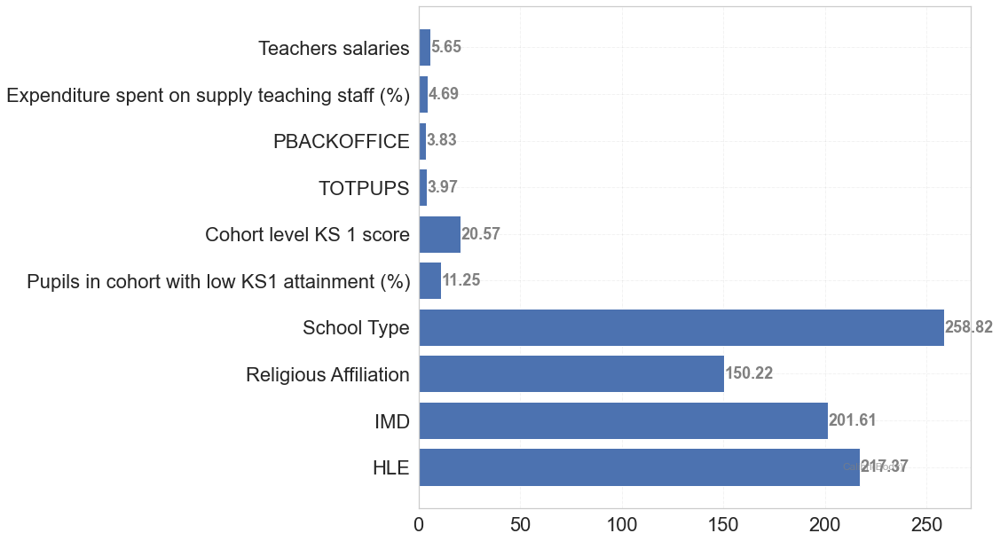

In [466]:
# Setting the size of figure
fig, ax = plt.subplots(figsize =(16, 9))
 
# Ploting a horizontal barchart
ax.barh(Dependency_csc_AProg['Average Progress Probably Dependent Column'], Dependency_csc_AProg['Log of P-Values'])
 
#gridlines x, y 
ax.grid(b = True, color ='grey',
        linestyle ='-.', linewidth = 0.5,
        alpha = 0.2)
 
# Show top values
ax.invert_yaxis()
 
# Add annotation to bars
for i in ax.patches:
    plt.text(i.get_width()+0.2, i.get_y()+0.5,
             str(round((i.get_width()), 2)),
             fontsize = 18, fontweight ='bold',
             color ='grey')
 

fig.text(0.9, 0.15, 'Calibri(Body)', fontsize = 12,color ='grey', ha ='right', va ='bottom',alpha = 0.7)
# show the chart
plt.show()




#Reference: https://www.geeksforgeeks.org/bar-plot-in-matplotlib/

Maths

In [467]:
 
schltype = Without_CSS_df['NFTYPE'] #gets series made of categorical variable school type
religion_sch= Without_CSS_df['RELDENOM'] #gets series made of categorical variable religion type
IMD = Without_CSS_df['IMD'] #gets series made of Indices of multiple deprivation
HLE =Without_CSS_df['HLE']  #gets series made of healthy life expectancy
Math_prog = Without_CSS_df['MATPROG'] #gets series made of average progress (target or dependent variable)

 
# checking for the one-way ANOVA
f_oneway(schltype, Math_prog)


F_onewayResult(statistic=788.3224904959242, pvalue=1.4858569031799806e-110)

Checking for the one-way ANOVA for RELIGIOUS AFFILIATION

In [468]:
f_oneway(religion_sch, Math_prog)


F_onewayResult(statistic=368.69144101633873, pvalue=4.143561715305728e-64)

Checking for the one-way ANOVA for IMD

In [469]:
f_oneway(IMD, Math_prog)

F_onewayResult(statistic=565.1400442251163, pvalue=5.688261793182981e-88)

Checking for the one-way ANOVA for HLE

In [470]:
f_oneway(HLE, Math_prog)

F_onewayResult(statistic=622.2330643364953, pvalue=3.8463920117197135e-94)

Creating a Dataframe for the 'probably dependent' variable and their respective p-values

In [471]:
data_csc_maths = {'Maths Probably Dependent Column': ['School Type', 'Religious Affiliation', 'IMD', 'HLE'],
        'P-Values(maths)': ['1.4858569031799806e-110', '4.143561715305728e-64', '5.688261793182981e-88', '3.8463920117197135e-94']} 
Dependency_df_cat_csc_maths = pd.DataFrame.from_dict(data_csc_maths)
  
Dependency_df_cat_csc_maths

,Maths Probably Dependent Column,P-Values(maths)
0,School Type,1.4858569031799806e-110
1,Religious Affiliation,4.143561715305728e-64
2,IMD,5.688261793182981e-88
3,HLE,3.8463920117197135e-94


Stacking the Dataframes....of 'probably dependent variables' for both categorical (i.e. Dependency_df_cat) and continuous variables (i.e. Dependency_df)

In [472]:
# Stacking th dataframes

Dependency_csc_maths= Dependency_df_maths.append([Dependency_df_cat_csc_maths], ignore_index=True)

In [473]:
Dependency_csc_maths

,Maths Probably Dependent Column,P-Values(maths)
0,PTEACHINGSTAFF,0.00449866
1,PSUPPLYTEACHERS,0.00052689
2,PBACKOFFICE,0.00919538
3,TKS1AVERAGE,0.00001265
4,PTKS1GROUP_L,0.00348682
5,PTRWM_EXP,0.00000000
6,MATPROG,0.00000000
7,School Type,1.4858569031799806e-110
8,Religious Affiliation,4.143561715305728e-64
9,IMD,5.688261793182981e-88


In [474]:
Dependency_csc_maths['Maths Probably Dependent Column'] =  Dependency_csc_maths['Maths Probably Dependent Column'].apply(lambda x: 'Total income' if x=='TOTALINCOME' else 
                                                                                                 ('Teachers salaries' if x=='TEACHINGSTAFF' else 
                                                                                                ('Total Expenditure' if x=='TOTALEXPENDITURE' else 
                                                                                                ('Expenditure spent on teaching staff (%)' if x=='PTEACHINGSTAFF' else 
                                                                                                ('Expenditure spent on supply teaching staff (%)' if x=='PSUPPLYTEACHERS' else 
                                                                                                ('Expenditure spent on Education support staff (%)'if x=='PEDUCATIONSUPPORTSTAFF' else 
                                                                                                ('Cohort level KS 1 score'if x=='TKS1AVERAGE' else 
                                                                                                ('Pupils in cohort with low KS1 attainment (%)'if x=='PTKS1GROUP_L' else 
                                                                                                 ('Percentage of KS2 disadvantaged pupils' if x=='PTFSM6CLA1A' else x)))))))))

In [475]:
#converting the P-Values to float type
Dependency_csc_maths.drop([5,6], axis=0, inplace=True)
Dependency_csc_maths['P-Values(maths)']=[float(i) for i in Dependency_csc_maths['P-Values(maths)']]

In [476]:
Dependency_csc_maths['Log of P-Values']= -np.log(Dependency_csc_maths['P-Values(maths)'])

Maths influences without community special school

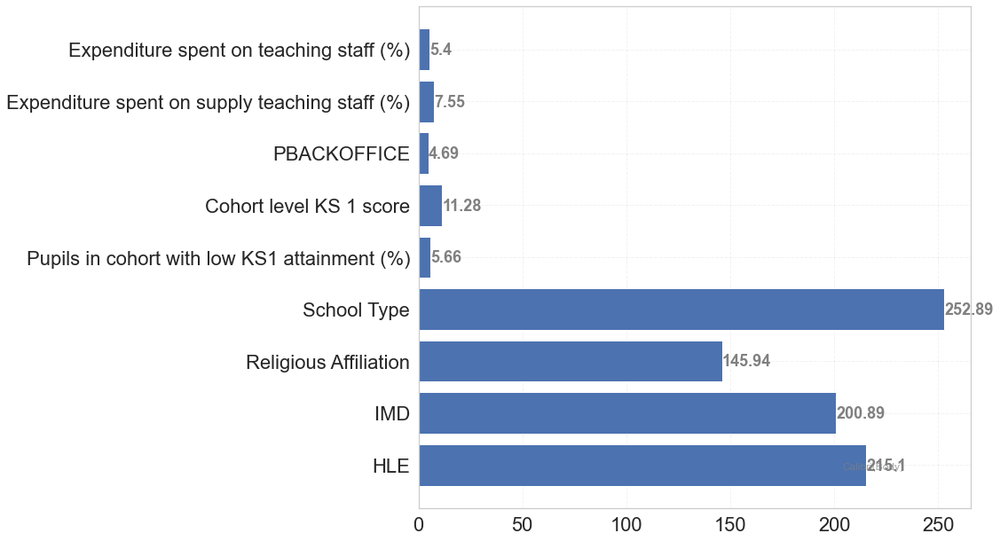

In [477]:
# Setting the size of figure
fig, ax = plt.subplots(figsize =(16, 9))
 
# Ploting a horizontal barchart
ax.barh(Dependency_csc_maths['Maths Probably Dependent Column'], Dependency_csc_maths['Log of P-Values'])
 
#gridlines x, y 
ax.grid(b = True, color ='grey',
        linestyle ='-.', linewidth = 0.5,
        alpha = 0.2)
 
# Show top values
ax.invert_yaxis()
 
# Add annotation to bars
for i in ax.patches:
    plt.text(i.get_width()+0.2, i.get_y()+0.5,
             str(round((i.get_width()), 2)),
             fontsize = 18, fontweight ='bold',
             color ='grey')
 

fig.text(0.9, 0.15, 'Calibri(Body)', fontsize = 12,color ='grey', ha ='right', va ='bottom',alpha = 0.7)
# show the chart
plt.show()




#Reference: https://www.geeksforgeeks.org/bar-plot-in-matplotlib/

Writing

In [478]:
schltype = Without_CSS_df['NFTYPE'] #gets series made of categorical variable school type
religion_sch= Without_CSS_df['RELDENOM'] #gets series made of categorical variable religion type
IMD = Without_CSS_df['IMD'] #gets series made of Indices of multiple deprivation
HLE =Without_CSS_df['HLE']  #gets series made of healthy life expectancy
Writ_prog = Without_CSS_df['WRITPROG'] #gets series made of average progress (target or dependent variable)

 
# checking for the one-way ANOVA
f_oneway(schltype, Writ_prog)


F_onewayResult(statistic=602.7362447921107, pvalue=4.555316480859203e-92)

Checking for the one-way ANOVA for RELIGIOUS AFFILIATION

In [479]:
f_oneway(religion_sch, Writ_prog)

F_onewayResult(statistic=214.79885762314268, pvalue=1.1566224511325715e-41)

Checking for the one-way ANOVA for IMD

In [480]:
f_oneway(IMD, Writ_prog)

F_onewayResult(statistic=412.3134598380429, pvalue=8.271308273865878e-70)

Checking for the one-way ANOVA for HLE

In [481]:
f_oneway(HLE, Writ_prog)

F_onewayResult(statistic=459.86598740910256, pvalue=9.612007489286758e-76)

Creating a Dataframe for the 'probably dependent' variable and their respective p-values

In [482]:
data_csc_writing = {'Writing Probably Dependent Column': ['School Type', 'Religious Affiliation', 'IMD', 'HLE'],
        'P-Values(writing)': ['4.555316480859203e-92', '1.1566224511325715e-41', '8.271308273865878e-70', '9.612007489286758e-76']} 
Dependency_df_cat_csc_writing = pd.DataFrame.from_dict(data_csc_writing)
  
Dependency_df_cat_csc_writing

,Writing Probably Dependent Column,P-Values(writing)
0,School Type,4.555316480859203e-92
1,Religious Affiliation,1.1566224511325715e-41
2,IMD,8.271308273865878e-70
3,HLE,9.612007489286758e-76


Stacking the Dataframes....of 'probably dependent variables' for both categorical (i.e. Dependency_df_cat) and continuous variables (i.e. Dependency_df)

In [483]:
# Stacking th dataframes

Dependency_csc_writing= Dependency_df_writing.append([Dependency_df_cat_csc_writing], ignore_index=True)

In [484]:
Dependency_csc_writing

,Writing Probably Dependent Column,P-Values(writing)
0,TOTALINCOME,0.01633466
1,TEACHINGSTAFF,0.00012624
2,TOTALEXPENDITURE,0.01406521
3,TOTPUPS,0.02530855
4,TKS1AVERAGE,0.00000003
5,PTKS1GROUP_L,0.00029647
6,PTRWM_EXP,0.00000000
7,WRITPROG,0.00000000
8,School Type,4.555316480859203e-92
9,Religious Affiliation,1.1566224511325715e-41


In [485]:
#converting the P-Values to float type
Dependency_csc_writing.drop([6,7], axis=0, inplace=True)
Dependency_csc_writing['P-Values(writing)']=[float(i) for i in Dependency_csc_writing['P-Values(writing)']]

In [486]:
Dependency_csc_writing['Writing Probably Dependent Column'] =  Dependency_csc_writing['Writing Probably Dependent Column'].apply(lambda x: 'Total income' if x=='TOTALINCOME' else 
                                                                                                 ('Teachers salaries' if x=='TEACHINGSTAFF' else 
                                                                                                ('Total Expenditure' if x=='TOTALEXPENDITURE' else 
                                                                                                ('Expenditure spent on teaching staff (%)' if x=='PTEACHINGSTAFF' else 
                                                                                                ('Expenditure spent on supply teaching staff (%)' if x=='PSUPPLYTEACHERS' else 
                                                                                                ('Expenditure spent on Education support staff (%)'if x=='PEDUCATIONSUPPORTSTAFF' else 
                                                                                                ('Cohort level KS 1 score'if x=='TKS1AVERAGE' else 
                                                                                                ('Pupils in cohort with low KS1 attainment (%)'if x=='PTKS1GROUP_L' else 
                                                                                                 ('Percentage of KS2 disadvantaged pupils' if x=='PTFSM6CLA1A' else x)))))))))

In [487]:
Dependency_csc_writing['Log of P-Values']= -np.log(Dependency_csc_writing['P-Values(writing)'])

Writing influences without community special school

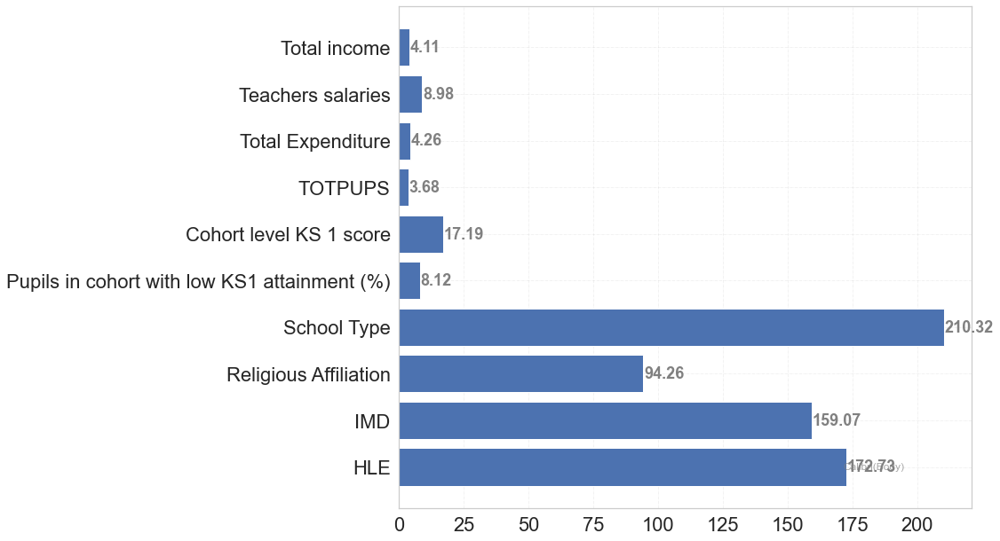

In [488]:
# Setting the size of figure
fig, ax = plt.subplots(figsize =(16, 9))
 
# Ploting a horizontal barchart
ax.barh(Dependency_csc_writing['Writing Probably Dependent Column'], Dependency_csc_writing['Log of P-Values'])
 
#gridlines x, y 
ax.grid(b = True, color ='grey',
        linestyle ='-.', linewidth = 0.5,
        alpha = 0.2)
 
# Show top values
ax.invert_yaxis()
 
# Add annotation to bars
for i in ax.patches:
    plt.text(i.get_width()+0.2, i.get_y()+0.5,
             str(round((i.get_width()), 2)),
             fontsize = 18, fontweight ='bold',
             color ='grey')
 

fig.text(0.9, 0.15, 'Calibri(Body)', fontsize = 12,color ='grey', ha ='right', va ='bottom',alpha = 0.7)
# show the chart
plt.show()




#Reference: https://www.geeksforgeeks.org/bar-plot-in-matplotlib/

Reading

In [489]:
schltype = Without_CSS_df['NFTYPE'] #gets series made of categorical variable school type
religion_sch= Without_CSS_df['RELDENOM'] #gets series made of categorical variable religion type
IMD = Without_CSS_df['IMD'] #gets series made of Indices of multiple deprivation
HLE =Without_CSS_df['HLE']  #gets series made of healthy life expectancy
Read_prog = Without_CSS_df['READPROG'] #gets series made of average progress (target or dependent variable)

 
# checking for the one-way ANOVA
f_oneway(schltype, Read_prog)


F_onewayResult(statistic=665.1286484884679, pvalue=1.3768304730255257e-98)

Checking for the one-way ANOVA for RELIGIOUS AFFILIATION

In [490]:
f_oneway(religion_sch, Read_prog)

F_onewayResult(statistic=265.28555106201435, pvalue=1.7836924157495126e-49)

Checking for the one-way ANOVA for IMD

In [491]:
f_oneway(IMD, Read_prog)

F_onewayResult(statistic=464.3412657588905, pvalue=2.7435403423685337e-76)

Checking for the one-way ANOVA for HLE

In [492]:
f_oneway(HLE, Read_prog)

F_onewayResult(statistic=514.9363000782939, pvalue=2.752030106246871e-82)

Creating a Dataframe for the 'probably dependent' variable and their respective p-values

In [493]:
data_csc_reading = {'Read Probably Dependent Column': ['School Type', 'Religious Affiliation', 'IMD', 'HLE'],
        'P-Values(read)': ['1.3768304730255257e-98', '1.7836924157495126e-49', '2.7435403423685337e-76', '2.752030106246871e-82']} 
Dependency_df_cat_csc_reading = pd.DataFrame.from_dict(data_csc_reading)
  
Dependency_df_cat_csc_reading

,Read Probably Dependent Column,P-Values(read)
0,School Type,1.3768304730255257e-98
1,Religious Affiliation,1.7836924157495126e-49
2,IMD,2.7435403423685337e-76
3,HLE,2.752030106246871e-82


Stacking the Dataframes....of 'probably dependent variables' for both categorical (i.e. Dependency_df_cat) and continuous variables (i.e. Dependency_df)

In [494]:
# Stacking th dataframes

Dependency_csc_reading= Dependency_df_reading.append([Dependency_df_cat_csc_reading], ignore_index=True)

In [495]:
Dependency_csc_reading

,Read Probably Dependent Column,P-Values(read)
0,FSM,0.00407804
1,TEACHINGSTAFF,0.04866178
2,POTHER,0.01285221
3,TOTPUPS,0.00240976
4,TKS1AVERAGE,0.00000027
5,PTKS1GROUP_L,0.00001914
6,PTFSM6CLA1A,0.00938193
7,PTRWM_EXP,0.00000000
8,READPROG,0.00000000
9,School Type,1.3768304730255257e-98


In [496]:
# converting the P-Values to float type
Dependency_csc_reading.drop([7,8], axis=0, inplace=True)
Dependency_csc_reading['P-Values(read)']=[float(i) for i in Dependency_csc_reading['P-Values(read)']]

In [497]:
Dependency_csc_reading['Read Probably Dependent Column'] =  Dependency_csc_reading['Read Probably Dependent Column'].apply(lambda x: 'Total income' if x=='TOTALINCOME' else 
                                                                                                 ('Teachers salaries' if x=='TEACHINGSTAFF' else 
                                                                                                ('Total Expenditure' if x=='TOTALEXPENDITURE' else 
                                                                                                ('Expenditure spent on teaching staff (%)' if x=='PTEACHINGSTAFF' else 
                                                                                                ('Expenditure spent on supply teaching staff (%)' if x=='PSUPPLYTEACHERS' else 
                                                                                                ('Expenditure spent on Education support staff (%)'if x=='PEDUCATIONSUPPORTSTAFF' else 
                                                                                                ('Cohort level KS 1 score'if x=='TKS1AVERAGE' else 
                                                                                                ('Pupils in cohort with low KS1 attainment (%)'if x=='PTKS1GROUP_L' else 
                                                                                                 ('Percentage of KS2 disadvantaged pupils' if x=='PTFSM6CLA1A' else x)))))))))

In [498]:
Dependency_csc_reading['Log of P-Values']= -np.log(Dependency_csc_reading['P-Values(read)'])

Reading influences without Community Special school

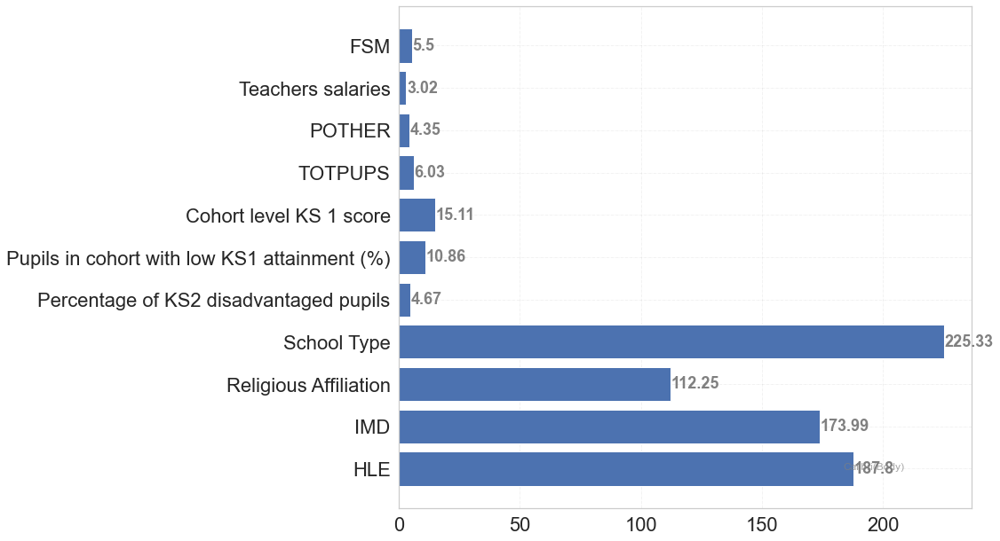

In [499]:
# Setting the size of figure
fig, ax = plt.subplots(figsize =(16, 9))
 
# Ploting a horizontal barchart
ax.barh(Dependency_csc_reading['Read Probably Dependent Column'], Dependency_csc_reading['Log of P-Values'])
 
#gridlines x, y 
ax.grid(b = True, color ='grey',
        linestyle ='-.', linewidth = 0.5,
        alpha = 0.2)
 
# Show top values
ax.invert_yaxis()
 
# Add annotation to bars
for i in ax.patches:
    plt.text(i.get_width()+0.2, i.get_y()+0.5,
             str(round((i.get_width()), 2)),
             fontsize = 18, fontweight ='bold',
             color ='grey')
 

fig.text(0.9, 0.15, 'Calibri(Body)', fontsize = 12,color ='grey', ha ='right', va ='bottom',alpha = 0.7)
# show the chart
plt.show()




#Reference: https://www.geeksforgeeks.org/bar-plot-in-matplotlib/